# Generate and render a rollout for existing checkpoint

This notebook demonstrates how to load a training checkpoint, perform a rollout, and render the result. Full network activations are saved as an output of this rollout for further analysis.

## Imports

In [2]:
%load_ext autoreload
%autoreload 2

import os

os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"

# Change this to egl or glfw if available
os.environ.setdefault("MUJOCO_GL", "egl")        # or "osmesa"
os.environ.setdefault("PYOPENGL_PLATFORM", "egl")
import mediapy as media

from track_mjx.agent import checkpointing
from track_mjx.analysis import rollout, render, utils

import jax
from jax import numpy as jp
from pathlib import Path

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load checkpoint

### Restore policy and make rollout functions

In [ ]:
# replace with your checkpoint path
ckpt_path = Path.cwd().parent / "model_checkpoints/250826_030533_134914" #/root/vast/eric/track-mjx/model_checkpoints/250731_033316_399484
# Load config from checkpoint 
ckpt = checkpointing.load_checkpoint_for_eval(ckpt_path)

cfg = ckpt["cfg"]

# make some changes to the config
# replace with absolute path to your data
# -- your notebook may not have access to the same relative path
# cfg.data_path = Path.cwd().parent / "data/transform_snips.h5"
cfg.data_path = "/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial01_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial04_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial09_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial10_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial13_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial15_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial16_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial17_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial19_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial20_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial23_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial24_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial25_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial27_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial29_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial34_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial35_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial36_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial38_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial40_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial42_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial43_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial44_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial45_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial46_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial47_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial49_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial52_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial53_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial55_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial56_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial57_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial58_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial59_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial60_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial61_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial62_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial63_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial65_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial66_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial70_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial71_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial73_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial74_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial75_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial76_ik.h5"
cfg.train_setup.checkpoint_to_restore = ckpt_path

env = rollout.create_environment(cfg)
inference_fn = checkpointing.load_inference_fn(cfg, ckpt["policy"])
generate_rollout = rollout.create_rollout_generator(
    cfg, 
    env, 
    inference_fn, 
    log_activations=True, 
    log_metrics=True, 
    log_sensor_data=True
)

single_rollout = generate_rollout(clip_idx=1)
frames, realtime_framerate = render.render_rollout(
    cfg, 
    single_rollout, 
    height=480,
    width=640,
)

# save the video to disk
media.write_video(Path(ckpt_path) / "rollout.mp4", frames, fps=realtime_framerate)
media.show_video(frames, fps=realtime_framerate)

Loading checkpoint from /root/vast/eric/track-mjx/model_checkpoints/250815_005648_593502 at step 111


Exception ignored in: <function Renderer.__del__ at 0x7f334d254400>
Traceback (most recent call last):
  File "/root/miniforge3/envs/track_mjx/lib/python3.11/site-packages/mujoco/renderer.py", line 337, in __del__
    self.close()
  File "/root/miniforge3/envs/track_mjx/lib/python3.11/site-packages/mujoco/renderer.py", line 322, in close
    if self._gl_context:
       ^^^^^^^^^^^^^^^^
AttributeError: 'Renderer' object has no attribute '_gl_context'


MuJoCo Rendering with Ghost Model...


100%|██████████| 200/200 [01:01<00:00,  3.27it/s]


### Generate rollouts from the checkpoint

After we load the checkpoint, we can do inference on the rollout!

We can generate a rollout imitating single clip, specified by the clip index. The first time you call the function there will be ~1-3min of compilation time, after which it will take only a few seconds.

Computing registration errors (robust wrist): 100%|██████████| 46/46 [00:00<00:00, 89.96it/s]
/tmp/ipykernel_2534220/3889871343.py:139: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(data, labels=[k.capitalize() for k in order],


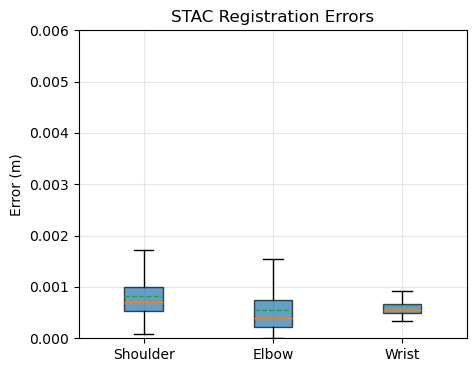

In [5]:
import os
import h5py
import mujoco
import numpy as np
from tqdm import tqdm
import pandas as pd
import matplotlib.pyplot as plt

# ---- Config ----
SITE_MAP = {
    "shoulder": "shoulder_track",
    "elbow":    "elbow_track",
    "wrist":    "wrist_track",
}

# ---------- Core helpers ----------

def compute_site_positions_with_offsets(model: mujoco.MjModel,
                                        qpos_seq: np.ndarray,
                                        site_names=("shoulder_track","elbow_track","wrist_track"),
                                        offsets_local: np.ndarray | None = None,
                                        offset_frame: str = "body") -> np.ndarray:
    data = mujoco.MjData(model)
    site_ids = [mujoco.mj_name2id(model, mujoco.mjtObj.mjOBJ_SITE, s) for s in site_names]
    body_ids = [model.site_bodyid[sid] for sid in site_ids]
    T = qpos_seq.shape[0]
    out = np.empty((T, len(site_ids), 3))
    for t in range(T):
        data.qpos[:] = qpos_seq[t]
        mujoco.mj_forward(model, data)
        for j,sid in enumerate(site_ids):
            p = data.site_xpos[sid].copy()
            if offsets_local is not None:
                if offset_frame == "body":
                    R = data.xmat[body_ids[j]].reshape(3,3)
                else:
                    R = data.site_xmat[sid].reshape(3,3)
                p = p + R @ offsets_local[j]
            out[t,j] = p
    return out

def _canonical_indices_with_wrist_preference(kp_names, *, prefer_wrist_body=True, verbose=False):
    lower = [str(n).lower() for n in kp_names]
    def find_one(name): 
        return lower.index(name) if name in lower else None
    si = find_one("shoulder")
    ei = find_one("elbow")
    wi_body = find_one("wrist_body")
    wi_plain = find_one("wrist")
    if wi_body is not None and wi_plain is not None:
        wi, used = (wi_body, "wrist_body") if prefer_wrist_body else (wi_plain, "wrist")
    elif wi_body is not None:
        wi, used = wi_body, "wrist_body"
    elif wi_plain is not None:
        wi, used = wi_plain, "wrist"
    else:
        wi, used = None, None
    missing = [k for k,v in (("shoulder",si),("elbow",ei),("wrist",wi)) if v is None]
    if missing:
        raise KeyError(f"Missing required keypoints {missing} in kp_names={kp_names}")
    if verbose:
        print(f"[name-map] shoulder={si}, elbow={ei}, wrist={wi} (used '{used}')")
    return si, ei, wi, used

def registration_error_from_ik_file(model: mujoco.MjModel,
                                    ik_path: str,
                                    site_order=("shoulder_track","elbow_track","wrist_track"),
                                    default_offset_frame: str = "body",
                                    prefer_wrist_body: bool = True,
                                    verbose: bool = False) -> dict[str,np.ndarray]:
    with h5py.File(ik_path, "r") as f:
        if "kp_data" not in f or "kp_names" not in f:
            raise KeyError(f"{ik_path} missing kp_data/kp_names.")
        kp_raw = np.asarray(f["kp_data"][:])  # (T,3K) or (T,K,3)
        names  = [n.decode() if isinstance(n,(bytes,np.bytes_)) else str(n) for n in f["kp_names"][:]]

        # normalize kp to (T,K,3)
        if kp_raw.ndim == 2:
            T, C = kp_raw.shape
            if C % 3 != 0:
                raise ValueError(f"{ik_path}: kp_data second dim {C} not divisible by 3")
            kp = kp_raw.reshape(T, C//3, 3)
        elif kp_raw.ndim == 3:
            kp = kp_raw
        else:
            raise ValueError(f"{ik_path}: unsupported kp_data shape {kp_raw.shape}")

        si, ei, wi, wrist_label = _canonical_indices_with_wrist_preference(
            names, prefer_wrist_body=prefer_wrist_body, verbose=verbose
        )
        kp_seq = np.stack([kp[:, si], kp[:, ei], kp[:, wi]], axis=1)  # (T,3,3)

        if "offsets" not in f:
            raise KeyError(f"{ik_path} missing 'offsets' dataset.")
        off_raw = np.asarray(f["offsets"][:])                         # (K,3)
        if off_raw.ndim != 2 or off_raw.shape[1] != 3 or off_raw.shape[0] != kp.shape[1]:
            raise ValueError(f"{ik_path}: offsets shape {off_raw.shape} incompatible with kp K={kp.shape[1]}")

        units = f.attrs.get("offset_units", "m")
        scale = 0.001 if str(units).lower().startswith("mm") else 1.0
        offsets = np.stack([off_raw[si], off_raw[ei], off_raw[wi]], axis=0) * scale  # (3,3)

        qpos_seq = np.asarray(f["qpos"][:])                           # (T,nq)
        offset_frame = str(f.attrs.get("offset_frame", default_offset_frame)).lower()
        if verbose:
            print(f"[offsets] units={units}, frame={offset_frame}, wrist_label='{wrist_label}', wrist_offset(m)={offsets[2]}")

    site_pos = compute_site_positions_with_offsets(
        model, qpos_seq, site_names=site_order, offsets_local=offsets, offset_frame=offset_frame
    )  # (T,3,3)

    dists = np.linalg.norm(site_pos - kp_seq, axis=-1)                # (T,3)
    return {"shoulder": dists[:,0], "elbow": dists[:,1], "wrist": dists[:,2]}

def batch_registration_errors(model: mujoco.MjModel,
                              ik_paths_csv: str,
                              site_order=("shoulder_track","elbow_track","wrist_track"),
                              default_offset_frame="body",
                              prefer_wrist_body: bool = True,
                              verbose: bool = False) -> dict[str,np.ndarray]:
    paths = [p.strip() for p in ik_paths_csv.split(",") if p.strip()]
    per_kp_errs = {"shoulder": [], "elbow": [], "wrist": []}
    for p in tqdm(paths, desc="Computing registration errors (robust wrist)"):
        errs = registration_error_from_ik_file(
            model, p, site_order=site_order, default_offset_frame=default_offset_frame,
            prefer_wrist_body=prefer_wrist_body, verbose=verbose
        )
        for k in per_kp_errs:
            per_kp_errs[k].append(errs[k])
    for k in per_kp_errs:
        per_kp_errs[k] = np.concatenate(per_kp_errs[k], axis=0)
    return per_kp_errs

def summarize_and_plot_errors(all_errors: dict[str, np.ndarray],
                              ylim=(0,0.010), title="", save_path=None):
    order = ["shoulder","elbow","wrist"]
    data = [all_errors[k] for k in order]
    plt.figure(figsize=(5,4))
    bp = plt.boxplot(data, labels=[k.capitalize() for k in order],
                     patch_artist=True, showmeans=True, meanline=True, showfliers=False)
    for patch in bp["boxes"]:
        patch.set_alpha(0.7)
    plt.ylabel("Error (m)")
    plt.ylim(*ylim)
    plt.title(title)
    plt.grid(True, alpha=0.3)
    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()

def save_registration_errors(all_errors: dict[str, np.ndarray],
                             out_csv: str,
                             out_h5: str,
                             order=("shoulder","elbow","wrist")) -> None:
    os.makedirs(os.path.dirname(out_csv), exist_ok=True)
    os.makedirs(os.path.dirname(out_h5), exist_ok=True)
    lens = [len(all_errors[k]) for k in order]
    N = min(lens)
    df = pd.DataFrame({k: np.asarray(all_errors[k])[:N] for k in order})
    df.to_csv(out_csv, index=False)
    with h5py.File(out_h5, "w") as f:
        f.create_dataset("errors", data=df.values)
        f.attrs["kp_names"] = np.array(order, dtype="S")
        f.attrs["units"] = "meters"
        f.attrs["desc"]  = "Per-frame STAC registration errors with offsets applied"

# ==== Usage ====

data_paths_str = "/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial01_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial04_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial09_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial10_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial13_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial15_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial16_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial17_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial19_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial20_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial23_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial24_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial25_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial27_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial29_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial34_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial35_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial36_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial38_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial40_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial42_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial43_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial44_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial45_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial46_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial47_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial49_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial52_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial53_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial55_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial56_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial57_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial58_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial59_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial60_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial61_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial62_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial63_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial65_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial66_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial70_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial71_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial73_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial74_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial75_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial76_ik.h5"

model_path = "/root/vast/eric/track-mjx/track_mjx/environment/reacher/assets/mouse_arm/mouse_arm.xml"
model = mujoco.MjModel.from_xml_path(model_path)

# 1) Compute registration errors FIRST
reg_errors = batch_registration_errors(
    model, data_paths_str,
    site_order=(SITE_MAP["shoulder"], SITE_MAP["elbow"], SITE_MAP["wrist"]),
    default_offset_frame="body",
    prefer_wrist_body=True,
    verbose=False,   # change to True to see which wrist label + offsets are used
)

# 2) Save CSV/H5
csv_path = "/root/vast/eric/figures-mimic-mjx/data/mouse_arm/registration_errors.csv"
h5_path  = "/root/vast/eric/figures-mimic-mjx/data/mouse_arm/registration_errors.h5"
save_registration_errors(reg_errors, out_csv=csv_path, out_h5=h5_path)

# 3) Quick plot
summarize_and_plot_errors(reg_errors, ylim=(0,0.006), title="STAC Registration Errors")


Scanning IK clip lengths: 100%|██████████| 46/46 [00:00<00:00, 156.68it/s]
/tmp/ipykernel_2536852/181165242.py:195: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(data, labels=[k.capitalize() for k in order],


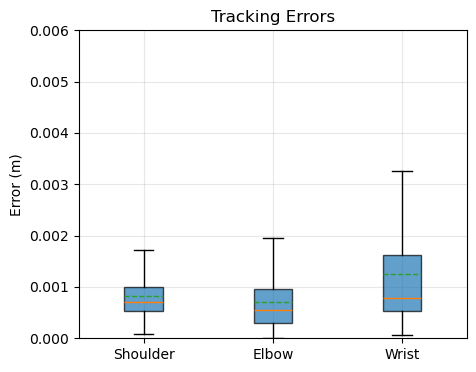

In [2]:
import os
import h5py
import mujoco
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import pandas as pd
from typing import List

# ---- Config ----
SITE_MAP = {
    "shoulder": "shoulder_track",
    "elbow":    "elbow_track",
    "wrist":    "wrist_track",
}

# IK names can vary; we match case-insensitively against these candidates
KP_CANONICAL = {
    "shoulder": ("shoulder", "Shoulder", "SHOULDER"),
    "elbow":    ("elbow", "Elbow", "ELBOW"),
    "wrist":    ("wrist_body", "wrist", "Wrist", "WRIST_BODY"),
}

# ---------- Strict helpers (no normalization heuristics) ----------

def _read_kp_names(f: h5py.File) -> list[str]:
    if "kp_names" in f:
        raw = f["kp_names"][:]
    elif "kp_names" in f.attrs:
        raw = f.attrs["kp_names"]
    else:
        raise KeyError("Missing 'kp_names' in IK file.")
    return [n.decode() if isinstance(n, (bytes, np.bytes_)) else str(n) for n in raw]

def _ensure_T_K_3(kps: np.ndarray, kp_names: list[str]) -> np.ndarray:
    kps = np.asarray(kps)
    K = len(kp_names)
    if kps.ndim == 3:
        T, K2, C = kps.shape
        assert C == 3 and K2 == K
        return kps
    if kps.ndim == 2:
        T, C = kps.shape
        assert C == 3 * K
        return kps.reshape(T, K, 3)
    raise ValueError(f"Unsupported kp_data shape={kps.shape}")

def _find_kp_indices(kp_names: list[str],
                     kp_canonical: dict[str, tuple[str, ...]] = KP_CANONICAL) -> dict[str, int]:
    lower = [str(x).lower() for x in kp_names]
    def _match_any(cands):
        for cand in cands:
            cl = cand.lower()
            if cl in lower:
                return lower.index(cl)
        return None
    idxs = {
        "shoulder": _match_any(kp_canonical["shoulder"]),
        "elbow": _match_any(kp_canonical["elbow"]),
        "wrist": _match_any(kp_canonical["wrist"]),
    }
    if any(v is None for v in idxs.values()):
        raise KeyError(f"Missing KPs in {kp_names}")
    return idxs

def _kp_clip_lengths_from_ik_files(ik_paths_csv: str) -> List[int]:
    paths = [p.strip() for p in ik_paths_csv.split(",") if p.strip()]
    lengths = []
    for p in tqdm(paths, desc="Scanning IK clip lengths"):
        with h5py.File(p, "r") as f:
            kd = f["kp_data"]
            lengths.append(kd.shape[0])
    return lengths

def _read_offsets_meters(f: h5py.File, kp_names: list[str], idxs: dict[str,int]) -> tuple[np.ndarray,str]:
    if "offsets" in f:
        off_raw = np.asarray(f["offsets"][:])
    elif "offsets" in f.attrs:
        off_raw = np.asarray(f.attrs["offsets"])
    else:
        raise KeyError("No 'offsets' in IK file.")
    if off_raw.shape[0] != len(kp_names) or off_raw.shape[1] != 3:
        raise ValueError(f"offsets shape mismatch {off_raw.shape}")
    units = f.attrs.get("offset_units", "m")
    scale = 0.001 if str(units).lower().startswith("mm") else 1.0
    frame = f.attrs.get("offset_frame", "body")
    offsets_sel = np.stack([
        off_raw[idxs["shoulder"]],
        off_raw[idxs["elbow"]],
        off_raw[idxs["wrist"]],
    ], axis=0)
    return offsets_sel * scale, str(frame).lower()

def load_kp_and_offsets_from_ik_files(data_paths_csv: str) -> tuple[list[np.ndarray], list[np.ndarray], str]:
    paths = [p.strip() for p in data_paths_csv.split(",") if p.strip()]
    kp_by_clip, offsets_by_clip, frames = [], [], []
    for p in tqdm(paths, desc="Loading IK kp_data+offsets"):
        with h5py.File(p, "r") as f:
            names = _read_kp_names(f)
            kps = _ensure_T_K_3(f["kp_data"][:], names)
            idxs = _find_kp_indices(names)
            sel = np.stack([kps[:, idxs["shoulder"], :],
                            kps[:, idxs["elbow"], :],
                            kps[:, idxs["wrist"], :]], axis=1)
            kp_by_clip.append(sel)
            offs, frame = _read_offsets_meters(f, names, idxs)
            offsets_by_clip.append(offs)
            frames.append(frame)
    if len(set(frames)) != 1:
        raise ValueError(f"Inconsistent offset_frame across files: {set(frames)}")
    return kp_by_clip, offsets_by_clip, frames[0]

def load_sim_qpos_by_clip(rollout_h5_path: str, dataset: str, ik_paths_csv: str) -> List[np.ndarray]:
    T_list = _kp_clip_lengths_from_ik_files(ik_paths_csv)
    with h5py.File(rollout_h5_path, "r") as f:
        q = np.asarray(f[dataset][:])
    if q.ndim == 3:
        return [q[i,:Ti,:] for i,Ti in enumerate(T_list)]
    if q.ndim == 2:
        out, start = [], 0
        for Ti in T_list:
            out.append(q[start:start+Ti,:])
            start += Ti
        return out
    raise ValueError(f"Unsupported qpos shape {q.shape}")

def compute_site_positions_with_offsets(model: mujoco.MjModel,
                                        qpos_seq: np.ndarray,
                                        site_names=("shoulder_track","elbow_track","wrist_track"),
                                        offsets_local: np.ndarray | None = None,
                                        offset_frame: str = "body") -> np.ndarray:
    data = mujoco.MjData(model)
    site_ids = [mujoco.mj_name2id(model, mujoco.mjtObj.mjOBJ_SITE, s) for s in site_names]
    body_ids = [model.site_bodyid[sid] for sid in site_ids]
    T = qpos_seq.shape[0]
    out = np.empty((T, len(site_ids), 3))
    for t in range(T):
        data.qpos[:] = qpos_seq[t]
        mujoco.mj_forward(model, data)
        for j,sid in enumerate(site_ids):
            p = data.site_xpos[sid].copy()
            if offsets_local is not None:
                if offset_frame == "body":
                    R = data.xmat[body_ids[j]].reshape(3,3)
                else:
                    R = data.site_xmat[sid].reshape(3,3)
                p = p + R @ offsets_local[j]
            out[t,j] = p
    return out

def tracking_error_vs_kp(model: mujoco.MjModel,
                         sim_qpos_by_clip: list[np.ndarray],
                         kp_by_clip: list[np.ndarray],
                         site_order=("shoulder_track","elbow_track","wrist_track"),
                         offsets_by_clip: list[np.ndarray] | None = None,
                         offset_frame: str = "body") -> dict[str, np.ndarray]:
    per_kp_errs = {"shoulder": [], "elbow": [], "wrist": []}
    for i,(qpos_seq,kp_seq) in enumerate(zip(sim_qpos_by_clip,kp_by_clip)):
        if qpos_seq.shape[0] != kp_seq.shape[0]:
            T = min(qpos_seq.shape[0], kp_seq.shape[0])
            qpos_seq, kp_seq = qpos_seq[:T], kp_seq[:T]
        offs = offsets_by_clip[i] if offsets_by_clip else None
        site_pos = compute_site_positions_with_offsets(model, qpos_seq, site_names=site_order,
                                                       offsets_local=offs, offset_frame=offset_frame)
        dists = np.linalg.norm(site_pos - kp_seq, axis=-1)
        per_kp_errs["shoulder"].append(dists[:,0])
        per_kp_errs["elbow"].append(dists[:,1])
        per_kp_errs["wrist"].append(dists[:,2])
    for k in per_kp_errs:
        per_kp_errs[k] = np.concatenate(per_kp_errs[k], axis=0)
    return per_kp_errs

def save_tracking_errors(all_errors: dict[str, np.ndarray], out_csv: str, out_h5: str) -> None:
    out_dir_csv = os.path.dirname(out_csv)
    out_dir_h5  = os.path.dirname(out_h5)
    if out_dir_csv:
        os.makedirs(out_dir_csv, exist_ok=True)
    if out_dir_h5:
        os.makedirs(out_dir_h5, exist_ok=True)

    df = pd.DataFrame({k: all_errors[k] for k in ["shoulder","elbow","wrist"]})
    df.to_csv(out_csv, index=False)
    with h5py.File(out_h5,"w") as f:
        f.create_dataset("errors", data=df.values)
        f.attrs["kp_names"] = np.array(["shoulder","elbow","wrist"],dtype="S")
        f.attrs["units"] = "meters"
        f.attrs["desc"] = "Per-frame site-to-KP Euclidean errors with offsets applied"


def summarize_and_plot_errors(all_errors: dict[str, np.ndarray],
                              ylim=(0,0.010), title="", save_path=None):
    order = ["shoulder","elbow","wrist"]
    data = [all_errors[k] for k in order]
    plt.figure(figsize=(5,4))
    bp = plt.boxplot(data, labels=[k.capitalize() for k in order],
                     patch_artist=True, showmeans=True, meanline=True, showfliers=False)
    for patch in bp["boxes"]:
        patch.set_alpha(0.7)
    plt.ylabel("Error (m)")
    plt.ylim(*ylim)
    plt.title(title)
    plt.grid(True, alpha=0.3)
    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()

# ==== Usage ====
data_paths_str = "/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial01_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial04_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial09_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial10_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial13_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial15_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial16_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial17_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial19_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial20_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial23_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial24_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial25_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial27_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial29_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial34_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial35_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial36_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial38_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial40_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial42_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial43_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial44_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial45_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial46_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial47_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial49_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial52_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial53_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial55_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial56_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial57_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial58_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial59_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial60_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial61_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial62_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial63_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial65_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial66_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial70_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial71_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial73_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial74_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial75_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial76_ik.h5"

# NEW: define your model
model_path = "/root/vast/eric/track-mjx/track_mjx/environment/reacher/assets/mouse_arm/mouse_arm.xml"
model = mujoco.MjModel.from_xml_path(model_path)

# NEW: build qpos_by_clip from a rollouts file using IK clip lengths
rollout_h5 = "/root/vast/eric/track-mjx/notebooks/rollouts_full_mouse_arm_new.h5"

kp_by_clip, offsets_by_clip, offset_frame = load_kp_and_offsets_from_ik_files(data_paths_str)
qpos_by_clip = load_sim_qpos_by_clip(rollout_h5, "qpos", data_paths_str)
all_errors = tracking_error_vs_kp(model, qpos_by_clip, kp_by_clip,
                                  site_order=(SITE_MAP["shoulder"],SITE_MAP["elbow"],SITE_MAP["wrist"]),
                                  offsets_by_clip=offsets_by_clip,
                                  offset_frame=offset_frame)
save_tracking_errors(all_errors, "tracking_errors.csv", "tracking_errors.h5")

summarize_and_plot_errors(all_errors, ylim=(0,0.006), title="Tracking Errors")

FK & speed timeseries (clips): 100%|██████████| 46/46 [00:00<00:00, 760.41it/s]


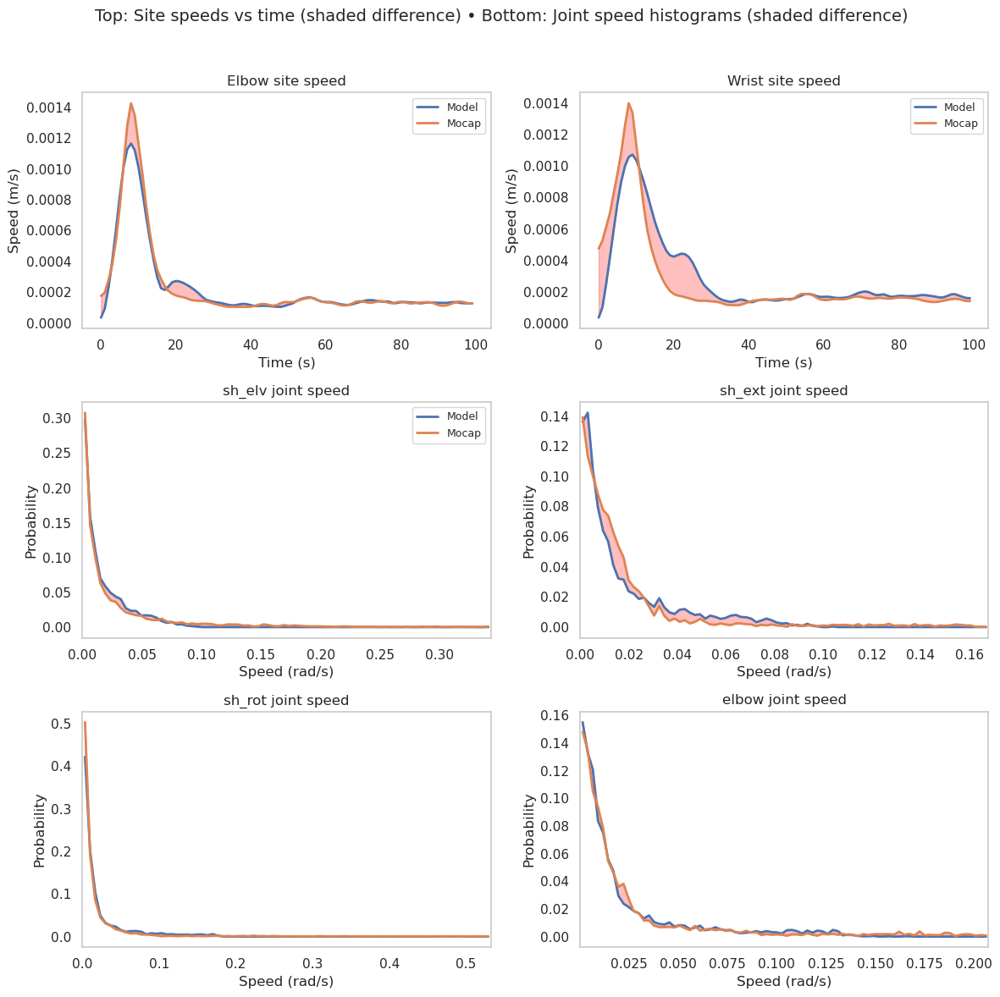

In [8]:
# --- Standalone cell: 2 columns x 3 rows with shaded differences (no grids, no TVD) ---

import os
import h5py
import mujoco
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

# ---------------- Config ----------------
SITE_MAP = {
    "elbow": "elbow_track",
    "wrist": "wrist_track",
}
QPOS_NAMES = ["sh_elv", "sh_ext", "sh_rot", "elbow"]
H5_PATH = "/root/vast/eric/track-mjx/notebooks/rollouts_full_mouse_arm_new.h5"
MODEL_PATH = "/root/vast/eric/track-mjx/track_mjx/environment/reacher/assets/mouse_arm/mouse_arm.xml"

DT = 1.0        # seconds per step
T_SLICE = 100   # frames to use for both time-series and histograms
BINS = 80
EPS = 1e-12     # numerical threshold for shading checks

# ---------------- Helpers ----------------
def _name_to_site_id(model, site_name: str) -> int:
    sid = mujoco.mj_name2id(model, mujoco.mjtObj.mjOBJ_SITE, site_name)
    if sid < 0:
        raise ValueError(f"Site '{site_name}' not found in model.")
    return sid

def _compute_speeds_from_positions(pos_seq: np.ndarray, dt: float) -> np.ndarray:
    """pos_seq: (T, 3) → |velocity| over time (T,)"""
    vel = np.gradient(pos_seq, dt, axis=0)   # (T, 3)
    return np.linalg.norm(vel, axis=-1)      # (T,)

def collect_site_speed_timeseries(model, qpos_full: np.ndarray, site_map: dict,
                                  dt: float = 1.0, T_slice: int | None = None):
    """
    Returns:
      speeds_ts: dict[site] -> (N, T_eff) of |velocity| per frame
      t: (T_eff,) time vector
    """
    if qpos_full.ndim != 3:
        raise ValueError("qpos_full must be shaped (N_clips, T, nq).")
    N, T, nq = qpos_full.shape
    T_eff = T if T_slice is None else min(T_slice, T)

    site_ids = {k: _name_to_site_id(model, n) for k, n in site_map.items()}
    data = mujoco.MjData(model)
    speeds_ts = {k: np.zeros((N, T_eff), dtype=np.float64) for k in site_ids.keys()}

    for i in tqdm(range(N), desc="FK & speed timeseries (clips)"):
        site_pos = {k: np.zeros((T_eff, 3), dtype=np.float64) for k in site_ids.keys()}
        for t_idx in range(T_eff):
            data.qpos[:] = qpos_full[i, t_idx, :]
            mujoco.mj_forward(model, data)
            for k, sid in site_ids.items():
                site_pos[k][t_idx, :] = data.site_xpos[sid]
        for k in site_ids.keys():
            speeds_ts[k][i, :] = _compute_speeds_from_positions(site_pos[k], dt=dt)

    t = np.arange(T_eff, dtype=np.float64) * dt
    return speeds_ts, t

# ---------------- Load data ----------------
with h5py.File(H5_PATH, "r") as f:
    qpos      = f["qpos"][...]       # (N, T, 4)
    ref_qpos  = f["ref_qpos"][...]   # (N, T, 4)

# Build model
model = mujoco.MjModel.from_xml_path(MODEL_PATH)

# ---------------- Compute site speeds ----------------
speeds_ref_ts, t = collect_site_speed_timeseries(model, ref_qpos, SITE_MAP, dt=DT, T_slice=T_SLICE)
speeds_mod_ts, _ = collect_site_speed_timeseries(model, qpos,     SITE_MAP, dt=DT, T_slice=T_SLICE)

# ---------------- Prepare velocity histograms ----------------
# Absolute joint velocities (speeds) using central difference
v_model = np.abs(np.gradient(qpos, DT, axis=1))      # (N, T, 4)
v_ref   = np.abs(np.gradient(ref_qpos, DT, axis=1))  # (N, T, 4)

# Use first T_SLICE frames and flatten across clips & time
v_model_flat = [v_model[:, :min(T_SLICE, v_model.shape[1]), j].reshape(-1) for j in range(qpos.shape[-1])]
v_ref_flat   = [v_ref[:,   :min(T_SLICE, v_ref.shape[1]),   j].reshape(-1) for j in range(qpos.shape[-1])]

# ---------------- Plot: 2 columns x 3 rows ----------------
fig, axes = plt.subplots(3, 2, figsize=(12, 12), squeeze=False)

# Row 1: site speeds (time-series with shaded difference)
site_order = ["elbow", "wrist"]
for col, site in enumerate(site_order):
    ax = axes[0, col]
    ref = speeds_ref_ts[site]   # (N, T_eff)
    mod = speeds_mod_ts[site]   # (N, T_eff)

    ref_mean = np.nanmean(ref, axis=0)
    mod_mean = np.nanmean(mod, axis=0)

    # Lines
    ax.plot(t, mod_mean, lw=2, label="Model")
    ax.plot(t, ref_mean, lw=2, label="Mocap")

    # Shaded difference (absolute area between curves)
    upper = np.maximum(mod_mean, ref_mean)
    lower = np.minimum(mod_mean, ref_mean)
    ax.fill_between(t, lower, upper, alpha=0.25, color="red")

    # Cosmetics
    ax.set_title(f"{site.capitalize()} site speed", fontsize=12)
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Speed (m/s)")
    ax.grid(False)
    ax.legend(fontsize=9)

# Rows 2–3: joint velocity histograms (with shaded difference)
hist_axes = [axes[1,0], axes[1,1], axes[2,0], axes[2,1]]
for j, ax in enumerate(hist_axes):
    xm = v_model_flat[j]
    xr = v_ref_flat[j]

    # Robust shared range
    lo = float(np.nanmin([np.percentile(xm, 0.5),  np.percentile(xr, 0.5)]))
    hi = float(np.nanmax([np.percentile(xm, 99.5), np.percentile(xr, 99.5)]))
    if not np.isfinite(lo) or not np.isfinite(hi) or hi <= lo:
        lo, hi = 0.0, 1.0  # fallback

    edges = np.linspace(lo, hi, BINS + 1)
    m_counts, _ = np.histogram(xm, bins=edges)
    r_counts, _ = np.histogram(xr, bins=edges)

    # Normalize to probabilities
    m_hist = m_counts / max(np.sum(m_counts), 1)
    r_hist = r_counts / max(np.sum(r_counts), 1)
    centers = 0.5 * (edges[:-1] + edges[1:])

    # Lines
    ax.plot(centers, m_hist, lw=2, label="Model")
    ax.plot(centers, r_hist, lw=2, label="Mocap")

    # Shaded difference between histograms
    upper = np.maximum(m_hist, r_hist)
    lower = np.minimum(m_hist, r_hist)
    ax.fill_between(centers, lower, upper, alpha=0.25, color="red")

    # Cosmetics
    ax.set_title(f"{QPOS_NAMES[j]} joint speed", fontsize=12)
    ax.set_xlabel("Speed (rad/s)")
    ax.set_ylabel("Probability")
    ax.set_xlim(lo, hi)
    ax.grid(False)
    if j == 0:
        ax.legend(fontsize=9)

fig.suptitle("Top: Site speeds vs time (shaded difference) • Bottom: Joint speed histograms (shaded difference)",
             fontsize=14)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


FK & speed timeseries: 100%|██████████| 46/46 [00:00<00:00, 813.83it/s]


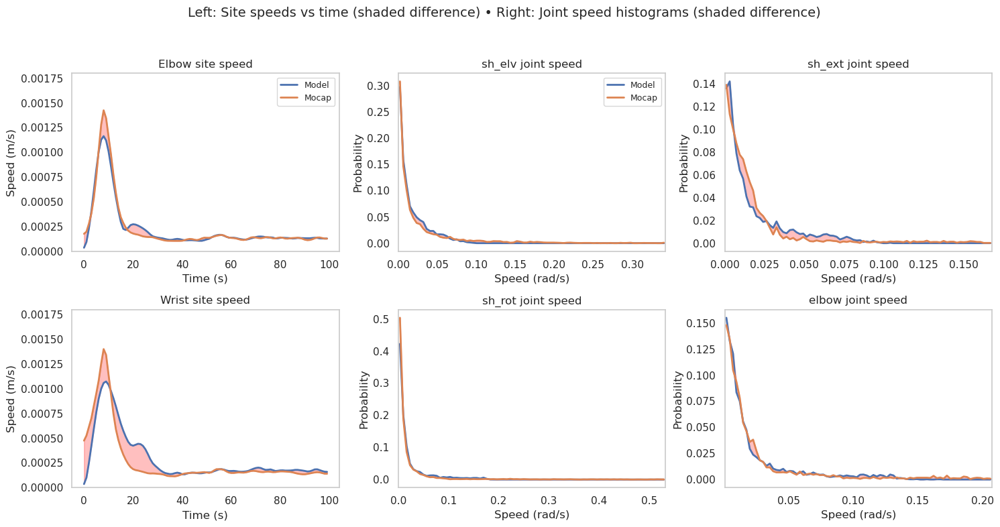

In [12]:
# --- Standalone cell: 2 rows x 3 cols (left: time series stacked; right: 4 histograms) ---

import os
import h5py
import mujoco
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

# ---------------- Config ----------------
SITE_MAP = {"elbow": "elbow_track", "wrist": "wrist_track"}
QPOS_NAMES = ["sh_elv", "sh_ext", "sh_rot", "elbow"]
H5_PATH = "/root/vast/eric/track-mjx/notebooks/rollouts_full_mouse_arm_new.h5"
MODEL_PATH = "/root/vast/eric/track-mjx/track_mjx/environment/reacher/assets/mouse_arm/mouse_arm.xml"

DT = 1.0
T_SLICE = 100
BINS = 80

# ---------------- Helpers ----------------
def _name_to_site_id(model, site_name: str) -> int:
    sid = mujoco.mj_name2id(model, mujoco.mjtObj.mjOBJ_SITE, site_name)
    if sid < 0:
        raise ValueError(f"Site '{site_name}' not found in model.")
    return sid

def _compute_speeds_from_positions(pos_seq: np.ndarray, dt: float) -> np.ndarray:
    vel = np.gradient(pos_seq, dt, axis=0)   # (T, 3)
    return np.linalg.norm(vel, axis=-1)      # (T,)

def collect_site_speed_timeseries(model, qpos_full, site_map, dt=1.0, T_slice=None):
    """Return dict[site]->(N,T_eff) speeds and time vector t."""
    if qpos_full.ndim != 3:
        raise ValueError("qpos_full must be (N_clips, T, nq)")
    N, T, _ = qpos_full.shape
    T_eff = T if T_slice is None else min(T_slice, T)

    site_ids = {k: _name_to_site_id(model, n) for k, n in site_map.items()}
    data = mujoco.MjData(model)
    speeds_ts = {k: np.zeros((N, T_eff), dtype=np.float64) for k in site_ids}

    for i in tqdm(range(N), desc="FK & speed timeseries"):
        site_pos = {k: np.zeros((T_eff, 3), dtype=np.float64) for k in site_ids}
        for t_idx in range(T_eff):
            data.qpos[:] = qpos_full[i, t_idx, :]
            mujoco.mj_forward(model, data)
            for k, sid in site_ids.items():
                site_pos[k][t_idx] = data.site_xpos[sid]
        for k in site_ids:
            speeds_ts[k][i] = _compute_speeds_from_positions(site_pos[k], dt)
    t = np.arange(T_eff, dtype=np.float64) * dt
    return speeds_ts, t

# ---------------- Load data ----------------
with h5py.File(H5_PATH, "r") as f:
    qpos     = f["qpos"][...]       # (N, T, 4)
    ref_qpos = f["ref_qpos"][...]   # (N, T, 4)

# Build model
model = mujoco.MjModel.from_xml_path(MODEL_PATH)

# ---------------- Compute site speeds ----------------
speeds_ref_ts, t = collect_site_speed_timeseries(model, ref_qpos, SITE_MAP, dt=DT, T_slice=T_SLICE)
speeds_mod_ts, _ = collect_site_speed_timeseries(model, qpos,     SITE_MAP, dt=DT, T_slice=T_SLICE)

# ---------------- Joint velocities ----------------
v_model = np.abs(np.gradient(qpos, DT, axis=1))
v_ref   = np.abs(np.gradient(ref_qpos, DT, axis=1))
v_model_flat = [v_model[:, :T_SLICE, j].ravel() for j in range(qpos.shape[-1])]
v_ref_flat   = [v_ref[:,   :T_SLICE, j].ravel() for j in range(qpos.shape[-1])]

# ---------------- Plot: 2 rows x 3 cols ----------------
fig, axes = plt.subplots(2, 3, figsize=(15, 8), squeeze=False)

# Left column (rows 0–1): elbow & wrist site speeds (stacked)
for row, site in enumerate(["elbow", "wrist"]):
    ax = axes[row, 0]
    ref_mean = np.nanmean(speeds_ref_ts[site], axis=0)
    mod_mean = np.nanmean(speeds_mod_ts[site], axis=0)
    ax.plot(t, mod_mean, lw=2, label="Model")
    ax.plot(t, ref_mean, lw=2, label="Mocap")
    ax.fill_between(t, np.minimum(ref_mean, mod_mean), np.maximum(ref_mean, mod_mean),
                    alpha=0.25, color="red")
    ax.set_ylim(0, 0.0018)
    ax.set_title(f"{site.capitalize()} site speed", fontsize=12)
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Speed (m/s)")
    ax.grid(False)
    if row == 0:
        ax.legend(fontsize=9)

# Right 2×2 (cells: (0,1),(0,2),(1,1),(1,2)): four joint histograms
hist_positions = [(0,1), (0,2), (1,1), (1,2)]
for j, (r, c) in enumerate(hist_positions):
    ax = axes[r, c]
    xm, xr = v_model_flat[j], v_ref_flat[j]
    lo = float(np.nanmin([np.percentile(xm, 0.5),  np.percentile(xr, 0.5)]))
    hi = float(np.nanmax([np.percentile(xm, 99.5), np.percentile(xr, 99.5)]))
    if not np.isfinite(lo) or not np.isfinite(hi) or hi <= lo:
        lo, hi = 0.0, 1.0
    edges = np.linspace(lo, hi, BINS + 1)
    m_counts, _ = np.histogram(xm, bins=edges)
    r_counts, _ = np.histogram(xr, bins=edges)
    m_hist = m_counts / max(m_counts.sum(), 1)
    r_hist = r_counts / max(r_counts.sum(), 1)
    centers = 0.5 * (edges[:-1] + edges[1:])
    ax.plot(centers, m_hist, lw=2, label="Model")
    ax.plot(centers, r_hist, lw=2, label="Mocap")
    ax.fill_between(centers, np.minimum(m_hist, r_hist), np.maximum(m_hist, r_hist),
                    alpha=0.25, color="red")
    ax.set_title(f"{QPOS_NAMES[j]} joint speed", fontsize=12)
    ax.set_xlabel("Speed (rad/s)")
    ax.set_ylabel("Probability")
    ax.set_xlim(lo, hi)
    ax.grid(False)
    if j == 0:
        ax.legend(fontsize=9)

fig.suptitle("Left: Site speeds vs time (shaded difference) • Right: Joint speed histograms (shaded difference)",
             fontsize=14)
fig.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [4]:
error_df.to_csv("tracking_errors.csv", index=False)
error_df.to_hdf("tracking_errors.h5", key='errors', mode='w')

In [ ]:
single_rollout = generate_rollout(clip_idx=0)
frames, realtime_framerate = render.render_rollout(
    cfg, 
    single_rollout, 
    height=480,
    width=640,
)

# save the video to disk
media.write_video(Path(ckpt_path) / "rollout.mp4", frames, fps=realtime_framerate)
media.show_video(frames, fps=realtime_framerate)

MuJoCo Rendering with Ghost Model...


100%|██████████| 200/200 [01:00<00:00,  3.32it/s]


In [ ]:
# single_rollout.keys()
# #single_rollout["qposes_ref"].shape
# single_rollout["activations"]["intention"].shape

(199, 6)

### Step 4: Save it to disk

In [35]:
# =====================================================================
#  HEADLESS + DEPENDENCIES
# =====================================================================
import os, yaml, jax, numpy as np, jax.numpy as jnp
from omegaconf import OmegaConf
from orbax import checkpoint as ocp

os.environ["MUJOCO_GL"]                      = "egl"
os.environ["PYOPENGL_PLATFORM"]              = "egl"
os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"] = os.getenv(
    "XLA_PYTHON_CLIENT_MEM_FRACTION", "0.4")

from track_mjx.analysis.rollout import create_environment
from track_mjx.analysis.render  import render_rollout, display_video
from track_mjx.agent            import checkpointing
from track_mjx.agent.mlp_ppo.intention_network import make_intention_policy
from brax.training.acme         import running_statistics
from brax.training              import distribution
from track_mjx.environment import wrappers


jax.clear_caches()

# ---------------------------------------------------------------------
#  PATHS  (edit if needed)
# ---------------------------------------------------------------------
yaml_config_path = "/root/vast/eric/track-mjx/track_mjx/config/mouse-arm.yaml"
ckpt_path        = "/root/vast/eric/track-mjx/model_checkpoints/250810_194525_414048" #50731_033316_399484
clip_idx         = 1
n_steps          = 200

# =====================================================================
# 1. LOAD YAML CONFIG
# =====================================================================
with open(yaml_config_path) as f:
    cfg = OmegaConf.create(yaml.safe_load(f))
    
# Get the list of all data paths
all_data_paths = cfg.data_path.split(",")
# Select the specific data file based on clip_idx
cfg.data_path = all_data_paths[clip_idx]
print("Using data file:", cfg.data_path)

# =====================================================================
# 2. BUILD ENV
# =====================================================================
env = create_environment(cfg)

# Cast possible string → float BEFORE we call env.reset()
if hasattr(env, "_reset_noise_scale") and isinstance(env._reset_noise_scale, str):
    env._reset_noise_scale = 0.0 #float(env._reset_noise_scale)
    print("env._reset_noise_scale cast to float:", env._reset_noise_scale)

# Now it's safe to reset
state = env.reset(jax.random.PRNGKey(0))

# =====================================================================
# 3. AUTO-FILL DIMS THAT DEPEND ON ENV
# =====================================================================
flat_obs = jax.tree_util.tree_leaves(state.obs)
cfg.network_config.observation_size = int(sum(o.size for o in flat_obs))
cfg.network_config.action_size      = int(getattr(env, "action_size", env.sys.nu))

# this is temporary; will be overwritten by checkpoint value below
cfg.network_config.reference_obs_size = getattr(
    cfg.network_config, "reference_obs_size", cfg.network_config.observation_size
)
print(f"[auto] obs={cfg.network_config.observation_size}  "
      f"ref={cfg.network_config.reference_obs_size}  "
      f"act={cfg.network_config.action_size}")

# =====================================================================
# 4. OPEN CHECKPOINT  ▸  READ THE ORIGINAL NET CONFIG
# =====================================================================
ckpt_mgr = ocp.CheckpointManager(
    ckpt_path,
    options=ocp.CheckpointManagerOptions(create=False, step_prefix="PPONetwork"),
)
step = 232  # Or whatever step you want to load

# First, load just the config to get the correct dimensions
saved_cfg = ckpt_mgr.restore(
    step, args=ocp.args.Composite(config=ocp.args.JsonRestore())
)["config"]["network_config"]

# Now update your config with the EXACT dimensions from the checkpoint
cfg.network_config.observation_size = saved_cfg["observation_size"]
cfg.network_config.reference_obs_size = saved_cfg["reference_obs_size"]
cfg.network_config.intention_size = saved_cfg["intention_size"]
cfg.network_config.encoder_layer_sizes = saved_cfg["encoder_layer_sizes"]
cfg.network_config.decoder_layer_sizes = saved_cfg["decoder_layer_sizes"]

# Now create your policy with the exact same dimensions as the checkpoint
policy_net = make_intention_policy(
    action_param_size = cfg.network_config.action_size * 2,
    latent_size = cfg.network_config.intention_size,
    total_obs_size = cfg.network_config.observation_size,
    reference_obs_size = cfg.network_config.reference_obs_size,
    preprocess_observations_fn = running_statistics.normalize,
    encoder_hidden_layer_sizes = tuple(cfg.network_config.encoder_layer_sizes),
    decoder_hidden_layer_sizes = tuple(cfg.network_config.decoder_layer_sizes),
)

# Create the abstract policy with the correct dimensions
abstract_policy = checkpointing.make_abstract_policy(cfg)

# Now restore the checkpoint - it should match exactly
policy = ckpt_mgr.restore(
    step,
    args=ocp.args.Composite(
        policy=ocp.args.StandardRestore(abstract_policy, strict=True)
    )
)["policy"]
print("✓ checkpoint restored")

@jax.jit
def infer(policy, obs, key):
    logits, *_ = policy_net.apply(policy[0], policy[1], obs, key, True)
    return dist.mode(logits)

# =====================================================================
# 6. ROLLOUT (FIXED TO MATCH ROLLOUT.PY BEHAVIOR)
# =====================================================================
from track_mjx.environment import wrappers
from track_mjx.agent import checkpointing

# Create the wrapper that rollout.py uses to ensure consistent behavior
rollout_env = wrappers.RenderRolloutWrapperMulticlipTracking(env)

# Use the wrapped environment for reset and step
jit_reset = jax.jit(rollout_env.reset)
jit_step = jax.jit(rollout_env.step)

# Create the same inference function that rollout.py uses
# This uses stochastic sampling (deterministic=False) instead of deterministic mode
inference_fn = checkpointing.load_inference_fn(
    cfg, policy, deterministic=False, get_activation=False
)
jit_inference_fn = jax.jit(inference_fn)

rng, env_rng = jax.random.split(jax.random.PRNGKey(0))

# For the wrapped env, use clip_idx=0 since we've already set the correct data path
state = jit_reset(rng=env_rng, clip_idx=0)
qposes = []

for _ in range(n_steps):
    rng, sub = jax.random.split(rng)
    # Use the same inference function as rollout.py (stochastic sampling)
    action, _ = jit_inference_fn(state.obs, sub)
    qposes.append(state.pipeline_state.qpos)
    state = jit_step(state, action)

# =====================================================================
# 7. RENDER (UPDATED TO USE WRAPPED ENVIRONMENT)
# =====================================================================
# Use the wrapped environment's reference clip method
ref_traj = rollout_env._get_reference_clip(state.info)
start_frame = int(state.info["start_frame"])  # Should be 0 now

# CRITICAL FIX: Repeat each reference frame by the number of physics steps per control step
# This matches what rollout.py does
qposes_ref = jnp.repeat(
    ref_traj.joints,
    int(env._steps_for_cur_frame),
    axis=0,
)[:len(qposes)]  # Truncate to match rollout length

rollout_dict = {
    "qposes_rollout": jnp.array(qposes),     # from the sim
    "qposes_ref": qposes_ref                 # properly repeated reference poses
}

frames, fps = render_rollout(cfg, rollout_dict, render_ghost=True)
display_video(frames, framerate=int(fps))

Using data file: /root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial04_ik.h5
env._reset_noise_scale cast to float: 0.0
[auto] obs=44  ref=44  act=9
✓ checkpoint restored
MuJoCo Rendering with Ghost Model...


100%|██████████| 200/200 [01:00<00:00,  3.29it/s]


In [3]:
# =====================================================================
#  HEADLESS + DEPENDENCIES
# =====================================================================
import os, yaml, jax, numpy as np, jax.numpy as jnp
from omegaconf import OmegaConf
from orbax import checkpoint as ocp
import imageio
import mediapy as media
import mujoco

os.environ["MUJOCO_GL"] = "egl"
os.environ["PYOPENGL_PLATFORM"] = "egl"
os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"] = os.getenv(
    "XLA_PYTHON_CLIENT_MEM_FRACTION", "0.4")

from track_mjx.analysis.rollout import create_environment
from track_mjx.analysis.render import render_rollout, display_video, make_rollout_renderer
from track_mjx.agent import checkpointing
from track_mjx.agent.mlp_ppo.intention_network import make_intention_policy
from brax.training.acme import running_statistics
from brax.training import distribution
from track_mjx.environment import wrappers


jax.clear_caches()

# ---------------------------------------------------------------------
#  PATHS  (edit if needed)
# ---------------------------------------------------------------------
yaml_config_path = "/root/vast/eric/track-mjx/track_mjx/config/mouse-arm.yaml"
ckpt_path = "/root/vast/eric/track-mjx/model_checkpoints/250807_041533_024295" #50731_033316_399484
clip_idx = 0
n_steps = 200

# =====================================================================
# 1. LOAD YAML CONFIG
# =====================================================================
with open(yaml_config_path) as f:
    cfg = OmegaConf.create(yaml.safe_load(f))
cfg.data_path = cfg.data_path.split(",")[0]            # first file only
print("Using data file:", cfg.data_path)

# =====================================================================
# 2. BUILD ENV
# =====================================================================
env = create_environment(cfg)

# Cast possible string → float BEFORE we call env.reset()
if hasattr(env, "_reset_noise_scale") and isinstance(env._reset_noise_scale, str):
    env._reset_noise_scale = 0.0 #float(env._reset_noise_scale)
    print("env._reset_noise_scale cast to float:", env._reset_noise_scale)

# Now it's safe to reset
state = env.reset(jax.random.PRNGKey(0))

# =====================================================================
# 3. AUTO-FILL DIMS THAT DEPEND ON ENV
# =====================================================================
flat_obs = jax.tree_util.tree_leaves(state.obs)
cfg.network_config.observation_size = int(sum(o.size for o in flat_obs))
cfg.network_config.action_size = int(getattr(env, "action_size", env.sys.nu))

# this is temporary; will be overwritten by checkpoint value below
cfg.network_config.reference_obs_size = getattr(
    cfg.network_config, "reference_obs_size", cfg.network_config.observation_size
)
print(f"[auto] obs={cfg.network_config.observation_size}  "
      f"ref={cfg.network_config.reference_obs_size}  "
      f"act={cfg.network_config.action_size}")

# =====================================================================
# 4. OPEN CHECKPOINT  ▸  READ THE ORIGINAL NET CONFIG
# =====================================================================
ckpt_mgr = ocp.CheckpointManager(
    ckpt_path,
    options=ocp.CheckpointManagerOptions(create=False, step_prefix="PPONetwork"),
)
step = 5  # Or whatever step you want to load

# First, load just the config to get the correct dimensions
saved_cfg = ckpt_mgr.restore(
    step, args=ocp.args.Composite(config=ocp.args.JsonRestore())
)["config"]["network_config"]

# Now update your config with the EXACT dimensions from the checkpoint
cfg.network_config.observation_size = saved_cfg["observation_size"]
cfg.network_config.reference_obs_size = saved_cfg["reference_obs_size"]
cfg.network_config.intention_size = saved_cfg["intention_size"]
cfg.network_config.encoder_layer_sizes = saved_cfg["encoder_layer_sizes"]
cfg.network_config.decoder_layer_sizes = saved_cfg["decoder_layer_sizes"]

# Now create your policy with the exact same dimensions as the checkpoint
policy_net = make_intention_policy(
    action_param_size = cfg.network_config.action_size * 2,
    latent_size = cfg.network_config.intention_size,
    total_obs_size = cfg.network_config.observation_size,
    reference_obs_size = cfg.network_config.reference_obs_size,
    preprocess_observations_fn = running_statistics.normalize,
    encoder_hidden_layer_sizes = tuple(cfg.network_config.encoder_layer_sizes),
    decoder_hidden_layer_sizes = tuple(cfg.network_config.decoder_layer_sizes),
)

# Create the abstract policy with the correct dimensions
abstract_policy = checkpointing.make_abstract_policy(cfg)

# Now restore the checkpoint - it should match exactly
policy = ckpt_mgr.restore(
    step,
    args=ocp.args.Composite(
        policy=ocp.args.StandardRestore(abstract_policy, strict=True)
    )
)["policy"]
print("✓ checkpoint restored")

@jax.jit
def infer(policy, obs, key):
    logits, *_ = policy_net.apply(policy[0], policy[1], obs, key, True)
    return dist.mode(logits)

# =====================================================================
# 6. ROLLOUT WITH PROPER CLIP HANDLING
# =====================================================================
from track_mjx.environment import wrappers
from track_mjx.agent import checkpointing

# Create wrapped environment for consistent behavior
rollout_env = wrappers.RenderRolloutWrapperMulticlipTracking(env=env)

# Use the wrapped environment for reset and step
jit_reset = jax.jit(rollout_env.reset)
jit_step = jax.jit(rollout_env.step)

# Create inference function
inference_fn = checkpointing.load_inference_fn(
    cfg, policy, deterministic=False, get_activation=True
)
jit_inference_fn = jax.jit(inference_fn)

rng, reset_rng = jax.random.split(jax.random.PRNGKey(0))

# Reset with specific clip_idx
state = jit_reset(rng=reset_rng, clip_idx=clip_idx)
rollout = [state]

# Run the rollout, collecting all states
for _ in range(n_steps):
    rng, act_rng = jax.random.split(rng)
    action, extras = jit_inference_fn(state.obs, act_rng)
    action = jnp.squeeze(action, axis=0) if action.shape[0] == 1 else action
    state = jit_step(state, action)
    rollout.append(state)

# =====================================================================
# 7. RENDER WITH PROPER CLIP SYNCHRONIZATION
# =====================================================================
# Create renderer
renderer, mj_model, mj_data, scene_option = make_rollout_renderer(cfg)

# Extract frame information from the rollout
qposes_rollout = np.array([state.pipeline_state.qpos for state in rollout])

# Extract reference clip information directly from the states
# This is critical - we want to use the reference frames that were actually used during the rollout
ref_frames = []
for state in rollout:
    # Get current reference frame from the state's info
    ref_frame = state.info['ref_qpos']
    ref_frames.append(ref_frame)
    
ref_qposes = np.array(ref_frames)

# Make sure we have matching lengths
min_length = min(len(qposes_rollout), len(ref_qposes))
qposes_rollout = qposes_rollout[:min_length]
ref_qposes = ref_qposes[:min_length]

# Create a video file
video_path = f"/tmp/rollout_video.mp4"
fps = 30  # Standard fps for smooth video

# Generate frames for rendering
frames = []
with imageio.get_writer(video_path, fps=fps) as video:
    for qpos1, qpos2 in zip(qposes_rollout, ref_qposes):
        # Concatenate simulation and reference qpos
        mj_data.qpos = np.append(qpos1, qpos2)
        # Forward the physics to update positions
        mujoco.mj_forward(mj_model, mj_data)
        # Render the frame
        renderer.update_scene(
            mj_data,
            camera=cfg.env_config.render_camera_name,
            scene_option=scene_option,
        )
        pixels = renderer.render()
        frames.append(pixels)
        video.append_data(pixels)

# Display the video
display_video(frames, framerate=fps)

AttributeError: 'OSMesaPlatform' object has no attribute 'EGL'

In [16]:
# %%time
# ─────────────────────────  IMPORTS  ─────────────────────────────────────────
import os, yaml, h5py, copy
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm
from omegaconf import OmegaConf

# ─────────────────────────  USER SETTINGS  ──────────────────────────────────
YAML_CONFIG = "/root/vast/eric/track-mjx/track_mjx/config/mouse-arm.yaml"
H5_PATH     = "rollouts_full_mouse_arm_250810_194525_414048.h5"
CLIP_ID     = 0  # global clip index to visualize
SAVE_PATH   = f"./figures/fig2/fig2c_joint_angle_tracking_clip{CLIP_ID}.pdf"

# Joint config (edit indices/names/labels to match your ordering)
JOINT_NAMES   = ["sh_elv", "sh_ext", "sh_rot", "elbow"]
JOINT_LABELS  = ["Sh Elevation", "Sh Extension", "Sh Rotation", "Elbow"]
JOINT_INDICES = [0, 1, 2, 3]

# Plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Visualization time window (in seconds)
MAX_TIME = 0.25  # Only show first 0.25 seconds of data


def _find_source_for_global_clip(yaml_config, global_clip_idx):
    """Helper to convert global clip index to source file and local index"""
    # Load config
    with open(yaml_config, 'r') as f:
        cfg = OmegaConf.create(yaml.safe_load(f))
    
    # For simplicity, if we only have one data file, the local index is the same as global
    data_files = cfg.data_path.split(',')
    if len(data_files) == 1:
        return data_files[0], global_clip_idx, None
    
    # If you need more complex logic for multiple files, you'd implement it here
    # For now, just use the first file and assume local=global
    return data_files[0], global_clip_idx, None


def _try_load_ref_clip(src_path, local_idx):
    """Try to load the reference clip from the HDF5 file"""
    try:
        with h5py.File(src_path, 'r') as f:
            if 'joints' in f:
                # STAC format
                return f['joints'][local_idx]
            elif 'joint_position' in f:
                # DexSort format
                return f['joint_position'][local_idx]
            else:
                raise KeyError(f"No joint data found in {src_path}")
    except Exception as e:
        print(f"Error loading clip from {src_path}: {e}")
        return np.zeros((100, 4))  # Dummy data if loading fails


def _resample_to(target_len, data, source_hz, target_hz):
    """Resample data to match target length and frequency"""
    if source_hz == target_hz:
        # Special case: just pad/truncate
        if len(data) >= target_len:
            return data[:target_len]
        else:
            pad_len = target_len - len(data)
            return np.pad(data, ((0, pad_len), (0, 0)), mode='edge')
    
    # General case: interpolate to target rate
    source_time = np.arange(len(data)) / float(source_hz)
    target_time = np.arange(target_len) / float(target_hz)
    
    # Create interpolator for each joint
    result = np.zeros((target_len, data.shape[1]))
    for j in range(data.shape[1]):
        # Simple linear interpolation
        result[:, j] = np.interp(target_time, source_time, data[:, j])
    
    return result


def plot_joint_angles_from_datapath(
    yaml_config: str,
    rollout_h5: str,
    clip_id: int = 0,
    joint_indices=None,
    joint_names=None,
    joint_labels=None,
    save_path: str | None = None,
    sim_hz: int = 400,
    ref_hz: int = 200,
    max_time: float = None,  # Maximum time to plot (in seconds)
):
    """Plot reference-vs-rollout joint angles for a given global clip by
    loading the reference from the original `data_path` file.

    Args:
        yaml_config (str): Path to YAML with `data_path`.
        rollout_h5 (str): Rollout H5 that has 'qpos' for the sim clip.
        clip_id (int): Global clip to visualize.
        joint_indices (list[int]): indices to plot.
        joint_names (list[str]): names for titles.
        joint_labels (list[str]): labels for y-axis.
        save_path (str|None): PDF/PNG path to save.
        sim_hz (int): sim sampling rate (default 400 Hz).
        ref_hz (int): reference sampling rate (default 200 Hz).
        max_time (float): Maximum time to plot in seconds.

    Returns:
        matplotlib.figure.Figure
    """
    # Set default values if not provided
    if joint_indices is None:
        joint_indices = [0, 1, 2, 3]
    if joint_names is None:
        joint_names = [f"Joint {i}" for i in joint_indices]
    if joint_labels is None:
        joint_labels = joint_names

    # 1) Load sim qpos for the global clip from rollout file
    with h5py.File(rollout_h5, "r") as h5:
        if "qpos" not in h5:
            raise ValueError(f"'qpos' not found in {rollout_h5}. Re-run rollout to save qpos.")
        qpos_sim = h5["qpos"][...]  # (clips, T, nq)
    if clip_id >= qpos_sim.shape[0]:
        raise IndexError(f"clip_id {clip_id} out of range (total={qpos_sim.shape[0]}).")
    sim_clip = qpos_sim[clip_id]  # (T, nq)
    sim_T, nq = sim_clip.shape

    # 2) Map global clip → (source file, local clip) to find original data
    src_path, local_idx, _ = _find_source_for_global_clip(yaml_config, clip_id)

    # 3) Load reference joint angles for that local clip
    ref_clip = _try_load_ref_clip(src_path, local_idx)  # (T_ref, nq_ref)
    
    # Align DOFs if shapes differ between reference and simulation
    if ref_clip.shape[1] != nq:
        min_nq = min(nq, ref_clip.shape[1])
        ref_clip = ref_clip[:, :min_nq]
        sim_clip = sim_clip[:, :min_nq]
        nq = min_nq

    # 4) Resample reference to sim rate/length for fair comparison
    ref_clip_resampled = _resample_to(sim_T, ref_clip, ref_hz, sim_hz)

    # 5) Create time axis and filter data if max_time is specified
    time = np.arange(sim_T) / float(sim_hz)
    
    if max_time is not None:
        # Find index corresponding to max_time
        time_idx = np.searchsorted(time, max_time, side='right')
        # Filter all data to this time window
        time = time[:time_idx]
        sim_clip = sim_clip[:time_idx]
        ref_clip_resampled = ref_clip_resampled[:time_idx]
    
    # Calculate y-limits (global across all requested joints)
    all_vals = []
    for j in joint_indices:
        all_vals.extend(np.degrees(sim_clip[:, j][np.isfinite(sim_clip[:, j])]))
        all_vals.extend(np.degrees(ref_clip_resampled[:, j][np.isfinite(ref_clip_resampled[:, j])]))
    if not all_vals:
        raise ValueError("No finite joint angle data to plot.")
    y_min = np.min(all_vals) - 5
    y_max = np.max(all_vals) + 5

    # 6) Create figure with subplots (one per joint)
    fig, axes = plt.subplots(len(joint_indices), 1, figsize=(3, 6), sharex=True)
    axes = np.atleast_1d(axes)

    # 7) Plot each joint's angle over time
    for i, (j, name, label) in enumerate(zip(joint_indices, joint_names, joint_labels)):
        # Convert radians to degrees for plotting
        ref_deg = np.degrees(ref_clip_resampled[:, j])
        sim_deg = np.degrees(sim_clip[:, j])
        
        # Create masks for valid data points
        ref_mask = np.isfinite(ref_deg)
        sim_mask = np.isfinite(sim_deg)
        both = ref_mask & sim_mask

        # Plot reference trajectory
        sns.lineplot(x=time[ref_mask], y=ref_deg[ref_mask], ax=axes[i],
                     color="orange", label="STAC Reference", linewidth=2)
        
        # Plot simulation trajectory
        sns.lineplot(x=time[sim_mask], y=sim_deg[sim_mask], ax=axes[i],
                     color="skyblue", label="Track Replay", linewidth=2)
        
        # Highlight the difference between reference and simulation
        if np.any(both):
            axes[i].fill_between(time[both], ref_deg[both], sim_deg[both],
                                 alpha=0.2, color="red")

        # Configure subplot appearance
        axes[i].set_ylabel(label, fontsize=12)
        axes[i].set_ylim(y_min, y_max)
        
        # Set x-limit to our specified max time or the available data
        if max_time is not None:
            axes[i].set_xlim(0, max_time)
        else:
            axes[i].set_xlim(0, time[-1])

        # Set y-ticks at regular intervals based on data range
        rng = y_max - y_min
        tick_interval = 25 if rng > 80 else (20 if rng > 40 else 10)
        tick_start = int(np.floor(y_min / tick_interval)) * tick_interval
        tick_end   = int(np.ceil(y_max / tick_interval)) * tick_interval
        y_ticks = np.arange(tick_start, tick_end + tick_interval, tick_interval)
        y_ticks = y_ticks[(y_ticks >= y_min) & (y_ticks <= y_max)]
        axes[i].set_yticks(y_ticks)

        # Style each subplot
        axes[i].grid(False)
        if i < len(joint_indices) - 1:
            # For all but the last subplot, hide bottom
            sns.despine(ax=axes[i], top=True, right=True, bottom=True, left=False)
            axes[i].tick_params(bottom=False, labelbottom=False)
            axes[i].spines["left"].set_position(("outward", 5))
        else:
            # For the last subplot, show bottom axis
            sns.despine(ax=axes[i], top=True, right=True, bottom=False, left=False)
            axes[i].spines["bottom"].set_bounds(0, time[-1] if max_time is None else max_time)
            axes[i].spines["left"].set_position(("outward", 5))
            axes[i].spines["bottom"].set_position(("outward", 5))
        
        # Remove individual legends (will add global legend later)
        if axes[i].get_legend():
            axes[i].get_legend().remove()
        

    # 8) Configure shared labels and legend
    fig.text(-0.02, 0.5, "Joint Angle (degrees)", va="center",
             rotation="vertical", fontsize=14, fontweight="bold")
    
    # Set x-ticks based on our time range (0-0.25s)
    plot_max_time = time[-1] if max_time is None else max_time
    if plot_max_time <= 0.25:
        # For 0-0.25s range, use 0.05s intervals
        x_tick_interval = 0.05
    else:
        x_tick_interval = 0.5 if plot_max_time <= 2 else (1.0 if plot_max_time <= 5 else 2.0)
    
    axes[-1].set_xticks(np.arange(0, plot_max_time + x_tick_interval, x_tick_interval))

    # Add global legend
    from matplotlib.patches import Patch
    legend_elements = [
        plt.Line2D([0], [0], color="orange", lw=2, label="STAC Reference"),
        plt.Line2D([0], [0], color="skyblue", lw=2, label="Track Replay"),
        Patch(facecolor="red", alpha=0.2, label="Difference"),
    ]
    fig.legend(handles=legend_elements, loc="upper right", ncol=1,
               fontsize=10, frameon=False, bbox_to_anchor=(0.98, 1))

    # Add x-axis label
    axes[-1].set_xlabel("Time (seconds)", fontsize=12)
    plt.subplots_adjust(left=0.12, top=0.92)
    plt.tight_layout()

    # Save figure if path provided
    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, bbox_inches="tight", dpi=600)

    return fig

# ─────────────────────────  RUN  ────────────────────────────────────────────
# Run the plotting function with our configured parameters
# We're limiting the plot to show only the first 0.25 seconds of data
fig = plot_joint_angles_from_datapath(
    yaml_config=YAML_CONFIG,
    rollout_h5=H5_PATH,
    clip_id=CLIP_ID,
    joint_indices=JOINT_INDICES,
    joint_names=JOINT_NAMES,
    joint_labels=JOINT_LABELS,
    save_path=SAVE_PATH,
    sim_hz=400,      # Simulation runs at 400 Hz
    ref_hz=200,      # Reference data is at 200 Hz
    max_time=MAX_TIME,  # Only plot first 0.25 seconds
)
plt.show()
print(f"Figure saved to {SAVE_PATH}")

Error loading clip from /root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial01_ik.h5: 'No joint data found in /root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial01_ik.h5'


<Figure size 300x600 with 4 Axes>

Figure saved to ./figures/fig2/fig2c_joint_angle_tracking_clip0.pdf


In [ ]:
# %%time
# ─────────────────────────  IMPORTS  ─────────────────────────
import os, yaml, copy, h5py
import numpy as np
import jax, jax.numpy as jnp
from tqdm import tqdm  # plain text tqdm (no ipywidgets)
from omegaconf import OmegaConf
from orbax import checkpoint as ocp
from brax.training.acme import running_statistics
from brax.training      import distribution

from track_mjx.analysis.rollout import create_environment
from track_mjx.agent            import checkpointing
from track_mjx.agent.mlp_ppo.intention_network import make_intention_policy
from track_mjx.environment import wrappers

# ─────────────────────────  USER SETTINGS  ───────────────────
YAML_CONFIG = "/root/vast/eric/track-mjx/track_mjx/config/mouse-arm.yaml"
CKPT_DIR    = "/root/vast/eric/track-mjx/model_checkpoints/250810_194525_414048"
CKPT_STEP   = 100
ROLLOUT_T   = 200
OUT_H5      = "rollouts_full_mouse_arm_new.h5"
SANITY_H5   = OUT_H5.replace(".h5", "_sanity.h5")
SHOW_TQDM_T = False  # flip to True if you want the inner step bar

# ─────────────────────────  UTILS  ───────────────────────────
def fix_noise(env, val: float = 0.0):
    if hasattr(env, "_reset_noise_scale"):
        env._reset_noise_scale = float(val)
    return env

def extract_qpos_loose(state):
    """Loose qpos extractor (host side)."""
    if hasattr(state, "qpos"): return np.asarray(state.qpos)
    if hasattr(state, "pipeline_state"):
        ps = state.pipeline_state
        if hasattr(ps, "qpos"): return np.asarray(ps.qpos)
        if hasattr(ps, "q"):    return np.asarray(ps.q)
    if hasattr(state, "data") and hasattr(state.data, "qpos"):
        return np.asarray(state.data.qpos)
    if hasattr(state, "info") and isinstance(state.info, dict) and "qpos" in state.info:
        return np.asarray(state.info["qpos"])
    return None

def compose_ref_from_clip(ref_clip, idx: int):
    """Compose 1D ref vector at frame idx (tracking: pos+quat+joints; reach: joints)."""
    has_pq = hasattr(ref_clip, "position") and hasattr(ref_clip, "quaternion")
    if has_pq:
        return np.hstack([np.asarray(ref_clip.position[idx]),
                          np.asarray(ref_clip.quaternion[idx]),
                          np.asarray(ref_clip.joints[idx])])
    else:
        return np.asarray(ref_clip.joints[idx])

def write_h5(path, A, Z, R, Q, RQ, ENC, DEC):
    if os.path.exists(path):
        try: os.remove(path)
        except: pass
    with h5py.File(path, "w") as h5:
        h5.create_dataset("actions",    data=A,  dtype="f4", compression="gzip")
        h5.create_dataset("intentions", data=Z,  dtype="f4", compression="gzip")
        h5.create_dataset("rewards",    data=R,  dtype="f4", compression="gzip")
        if Q is not None:  h5.create_dataset("qpos",     data=Q,  dtype="f4", compression="gzip")
        if RQ is not None: h5.create_dataset("ref_qpos", data=RQ, dtype="f4", compression="gzip")
        enc_grp = h5.create_group("encoder_activations")
        for k, arr in ENC.items(): enc_grp.create_dataset(k, data=arr, dtype="f4", compression="gzip")
        dec_grp = h5.create_group("decoder_activations")
        for k, arr in DEC.items(): dec_grp.create_dataset(k, data=arr, dtype="f4", compression="gzip")

# ─────────────────────────  LOAD CFG / CKPT  ─────────────────
with open(YAML_CONFIG) as f:
    cfg_base = OmegaConf.create(yaml.safe_load(f))
all_paths = [p.strip() for p in str(cfg_base.data_path).split(",")]
print("Found", len(all_paths), "H5 files")

ckpt_mgr = ocp.CheckpointManager(
    CKPT_DIR, options=ocp.CheckpointManagerOptions(create=False, step_prefix="PPONetwork")
)
saved_cfg = ckpt_mgr.restore(
    CKPT_STEP, args=ocp.args.Composite(config=ocp.args.JsonRestore())
)["config"]["network_config"]

latent_size = int(saved_cfg["intention_size"])
ref_size    = int(saved_cfg["reference_obs_size"])

# Probe sizes
cfg_tmp           = copy.deepcopy(cfg_base)
cfg_tmp.data_path = all_paths[0]
env_proto         = fix_noise(create_environment(cfg_tmp))
flat_obs          = jax.tree_util.tree_leaves(env_proto.reset(jax.random.PRNGKey(0)).obs)
obs_size          = int(sum(a.size for a in flat_obs))
act_dim           = int(getattr(env_proto, "action_size", env_proto.sys.nu))
nq                = int(getattr(env_proto, "qpos_size", getattr(env_proto.sys, "nq", 0)))
print(f"Environment info - obs_size: {obs_size}, act_dim: {act_dim}, nq: {nq}")
print(f"Reference obs size (stacked): {ref_size}, Latent size: {latent_size}")

# Align net config
cfg_base.network_config = copy.deepcopy(saved_cfg)
cfg_base.network_config.observation_size   = obs_size
cfg_base.network_config.action_size        = act_dim
cfg_base.network_config.reference_obs_size = ref_size
cfg_base.network_config.intention_size     = latent_size

# Policy / dist
policy_net = make_intention_policy(
    action_param_size          = act_dim * 2,
    latent_size                = latent_size,
    total_obs_size             = obs_size,
    reference_obs_size         = ref_size,
    preprocess_observations_fn = running_statistics.normalize,
    encoder_hidden_layer_sizes = tuple(saved_cfg["encoder_layer_sizes"]),
    decoder_hidden_layer_sizes = tuple(saved_cfg["decoder_layer_sizes"]),
)
dist = distribution.NormalTanhDistribution(event_size=act_dim)

abstract_pol = checkpointing.make_abstract_policy(cfg_base)
policy = ckpt_mgr.restore(
    CKPT_STEP, args=ocp.args.Composite(policy=ocp.args.StandardRestore(abstract_pol, strict=True))
)["policy"]
print(f"✓ checkpoint {CKPT_STEP} restored on {jax.default_backend()}")

# Discover activation layout once
@jax.jit
def _dry_forward(policy, obs, key):
    logits, z_mu, _z_lv, acts = policy_net.apply(
        policy[0], policy[1], obs=obs, key=key, get_activation=True)
    return dist.mode(logits), z_mu, acts

_, _, _acts0 = _dry_forward(policy, env_proto.reset(jax.random.PRNGKey(0)).obs, jax.random.PRNGKey(0))
enc_layers = sorted(_acts0["encoder"])
dec_layers = sorted(_acts0["decoder"])
enc_dims   = [int(_acts0["encoder"][k].shape[-1]) for k in enc_layers]
dec_dims   = [int(_acts0["decoder"][k].shape[-1]) for k in dec_layers]

# Inference fn (jitted)
inference_fn = checkpointing.load_inference_fn(cfg_base, policy, deterministic=False, get_activation=True)
jit_infer    = jax.jit(inference_fn)

# ─────────────────────────  COUNT CLIPS  ─────────────────────
total_clips = 0
clips_per_file = []
for p in all_paths:
    cfg_tmp.data_path = p
    env_tmp = fix_noise(create_environment(cfg_tmp))
    n = int(getattr(env_tmp, "_n_clips", 0))
    clips_per_file.append(n)
    total_clips += n
print("Total clips across all files:", total_clips)

# ─────────────────────────  RAM BUFFERS  ─────────────────────
acts_all = []
ints_all = []
rews_all = []
qpos_all = [] if nq > 0 else None
refq_all = [] if nq > 0 else None
enc_all  = {k: [] for k in enc_layers}
dec_all  = {k: [] for k in dec_layers}

# ─────────────────────────  ROLLOUTS  ────────────────────────
global_idx = 0
sanity_written = False

for file_idx, (path, nclips) in enumerate(zip(all_paths, clips_per_file), start=1):
    print(f"\n[{file_idx}/{len(all_paths)}] {os.path.basename(path)}  ({nclips} clips)")
    cfg_tmp.data_path = path
    env = fix_noise(create_environment(cfg_tmp))

    # Choose available wrappers
    is_multi = getattr(env, "_n_clips", 0) > 1
    MultiReaching   = getattr(wrappers, "RenderRolloutWrapperMulticlipReaching",  None)
    SingleReaching  = getattr(wrappers, "RenderRolloutWrapperSingleclipReaching", None)
    MultiTracking   = getattr(wrappers, "RenderRolloutWrapperMulticlipTracking")
    SingleTracking  = getattr(wrappers, "RenderRolloutWrapperSingleclipTracking")

    # Heuristic from config: reaching vs tracking (we still check ref dims later)
    is_reaching_task = hasattr(cfg_base, "reacher_config")

    if is_multi:
        rollout_env = MultiReaching(env) if (is_reaching_task and MultiReaching) else MultiTracking(env)
        wrap_name = "MultiClip Reaching" if (is_reaching_task and MultiReaching) else "MultiClip Tracking"
    else:
        rollout_env = SingleReaching(env) if (is_reaching_task and SingleReaching) else SingleTracking(env)
        wrap_name = "SingleClip Reaching" if (is_reaching_task and SingleReaching) else "SingleClip Tracking"
    print("Using", wrap_name, "wrapper")

    steps_for_frame = int(getattr(rollout_env, "_steps_for_cur_frame", 1))
    print(f"steps_for_frame = {steps_for_frame}")

    # Reset helpers that ALWAYS pass clip_idx + prev_ctrl
    if is_multi:
        def _reset(rng, clip_idx: int):
            info = {
                "clip_idx":  int(clip_idx),
                "start_frame": 0,
                "prev_ctrl": jnp.zeros((rollout_env.sys.nu,), dtype=jnp.float32),
            }
            return rollout_env.reset_from_clip(rng, info)
        jit_reset = jax.jit(_reset, static_argnums=(1,))
    else:
        def _reset(rng, start_frame: int):
            info = {
                "clip_idx":  0,
                "start_frame": int(start_frame),
                "prev_ctrl": jnp.zeros((rollout_env.sys.nu,), dtype=jnp.float32),
            }
            return rollout_env.reset_from_clip(rng, info)
        jit_reset = jax.jit(_reset, static_argnums=(1,))
    jit_step = jax.jit(rollout_env.step)

    rng_master = jax.random.PRNGKey(file_idx)

    for clip in tqdm(range(nclips), desc="clips", ascii=True, dynamic_ncols=True, leave=False):
        rng_reset, rng_master = jax.random.split(rng_master)
        state = jit_reset(rng_reset, clip)  # for single-clip, 'clip' is start_frame

        # Cache reference clip once
        ref_clip = None
        ref_len  = 0
        if hasattr(rollout_env, "_get_reference_clip"):
            try:
                ref_clip = rollout_env._get_reference_clip(state.info)
                if hasattr(ref_clip, "joints"):
                    ref_len = int(ref_clip.joints.shape[0])
            except Exception:
                ref_clip = None
                ref_len  = 0

        # Per-episode buffers (NumPy, filled once; no prints inside loop)
        buf_act = np.empty((ROLLOUT_T, act_dim),     np.float32)
        buf_int = np.empty((ROLLOUT_T, latent_size), np.float32)
        buf_rew = np.empty((ROLLOUT_T,),             np.float32)
        if nq > 0:
            buf_qpos = np.empty((ROLLOUT_T, nq), np.float32)
            buf_refq = np.empty((ROLLOUT_T, nq), np.float32)
        buf_enc = {k: np.empty((ROLLOUT_T, d), np.float32) for k, d in zip(enc_layers, enc_dims)}
        buf_dec = {k: np.empty((ROLLOUT_T, d), np.float32) for k, d in zip(dec_layers, dec_dims)}

        # Pre-generate subkeys to avoid host RNG churn
        subkeys = jax.random.split(jax.random.PRNGKey(global_idx), ROLLOUT_T)

        rng_tqdm = tqdm(range(ROLLOUT_T), desc="t", ascii=True, dynamic_ncols=True, leave=False, disable=not SHOW_TQDM_T)
        for t in rng_tqdm:
            # record qpos & ref BEFORE step
            if nq > 0:
                qpos_now = extract_qpos_loose(state)
                if qpos_now is None or qpos_now.size != nq:
                    qpos_now = np.zeros((nq,), np.float32)
                buf_qpos[t] = qpos_now.astype(np.float32)

                if ref_clip is not None and ref_len > 0:
                    ref_idx = min(t // steps_for_frame, ref_len - 1)
                    ref_now = compose_ref_from_clip(ref_clip, ref_idx)
                    # If packed (pos+quat+joints) mismatches nq, try joints-only if it fits
                    if ref_now.size != nq and hasattr(ref_clip, "joints") and ref_clip.joints.shape[-1] == nq:
                        ref_now = np.asarray(ref_clip.joints[ref_idx])
                    if ref_now.size != nq:
                        ref_now = np.zeros((nq,), np.float32)
                    buf_refq[t] = ref_now.astype(np.float32)

            act, extras = jit_infer(state.obs, subkeys[t])
            z_mu = extras["latent_mean"]
            acts = extras.get("activations", {})

            buf_act[t] = np.asarray(act, dtype=np.float32)
            buf_int[t] = np.asarray(z_mu, dtype=np.float32)
            buf_rew[t] = np.asarray(state.reward, dtype=np.float32)

            if "encoder" in acts:
                enc_dict = acts["encoder"]
                for k in enc_layers:
                    if k in enc_dict:
                        buf_enc[k][t] = np.asarray(enc_dict[k], dtype=np.float32)
            if "decoder" in acts:
                dec_dict = acts["decoder"]
                for k in dec_layers:
                    if k in dec_dict:
                        buf_dec[k][t] = np.asarray(dec_dict[k], dtype=np.float32)

            state = jit_step(state, act)

        # Append per-episode to RAM lists
        acts_all.append(buf_act);  ints_all.append(buf_int);  rews_all.append(buf_rew)
        if nq > 0: qpos_all.append(buf_qpos);  refq_all.append(buf_refq)
        for k in enc_layers: enc_all[k].append(buf_enc[k])
        for k in dec_layers: dec_all[k].append(buf_dec[k])

        global_idx += 1

        # ── write one-clip sanity file after first clip ──
        if not sanity_written:
            A  = np.stack(acts_all[-1:], axis=0)
            Z  = np.stack(ints_all[-1:], axis=0)
            R  = np.stack(rews_all[-1:], axis=0)
            Q  = np.stack(qpos_all[-1:], axis=0) if nq > 0 else None
            RQ = np.stack(refq_all[-1:], axis=0) if nq > 0 else None
            ENC = {k: np.stack(enc_all[k][-1:], axis=0) for k in enc_all}
            DEC = {k: np.stack(dec_all[k][-1:], axis=0) for k in dec_all}
            write_h5(SANITY_H5, A, Z, R, Q, RQ, ENC, DEC)
            print(f"[sanity] wrote first-clip sample to {SANITY_H5}")
            sanity_written = True

# ─────────────────────────  WRITE HDF5 (final)  ──────────────
print("\nStacking & writing HDF5…")
A  = np.stack(acts_all, axis=0)
Z  = np.stack(ints_all, axis=0)
R  = np.stack(rews_all, axis=0)
Q  = np.stack(qpos_all, axis=0) if nq > 0 else None
RQ = np.stack(refq_all, axis=0) if nq > 0 else None
ENC = {k: np.stack(v, axis=0) for k, v in enc_all.items()}
DEC = {k: np.stack(v, axis=0) for k, v in dec_all.items()}
write_h5(OUT_H5, A, Z, R, Q, RQ, ENC, DEC)
print(f"✓ finished – data saved to {OUT_H5}")

In [22]:
### THIS IS THE GOOD ROLLOUT GENERATOR

# %%time
# ─────────────────────────  IMPORTS  ─────────────────────────
import os, yaml, copy, h5py
import numpy as np
import jax, jax.numpy as jnp
from tqdm import tqdm  # plain text tqdm (no ipywidgets)
from omegaconf import OmegaConf
from orbax import checkpoint as ocp
from brax.training.acme import running_statistics
from brax.training      import distribution

from track_mjx.analysis.rollout import create_environment
from track_mjx.agent            import checkpointing
from track_mjx.agent.mlp_ppo.intention_network import make_intention_policy
from track_mjx.environment import wrappers

# ─────────────────────────  USER SETTINGS  ───────────────────
YAML_CONFIG = "/root/vast/eric/track-mjx/track_mjx/config/mouse-arm.yaml"
CKPT_DIR    = "/root/vast/eric/track-mjx/model_checkpoints/250830_155407_008106"
CKPT_STEP   = 19
ROLLOUT_T   = 100  # 100 frames at 200Hz = 0.5 seconds
OUT_H5      = "rollouts_full_mouse_arm_new_250830_155407_008106.h5"
SANITY_H5   = OUT_H5.replace(".h5", "_sanity.h5")
SHOW_TQDM_T = False  # flip to True if you want the inner step bar

# ─────────────────────────  UTILS  ───────────────────────────
def fix_noise(env, val: float = 0.0):
    if hasattr(env, "_reset_noise_scale"):
        env._reset_noise_scale = float(val)
    return env

def extract_qpos_loose(state):
    """Loose qpos extractor (host side)."""
    if hasattr(state, "qpos"): return np.asarray(state.qpos)
    if hasattr(state, "pipeline_state"):
        ps = state.pipeline_state
        if hasattr(ps, "qpos"): return np.asarray(ps.qpos)
        if hasattr(ps, "q"):    return np.asarray(ps.q)
    if hasattr(state, "data") and hasattr(state.data, "qpos"):
        return np.asarray(state.data.qpos)
    if hasattr(state, "info") and isinstance(state.info, dict) and "qpos" in state.info:
        return np.asarray(state.info["qpos"])
    return None

def compose_ref_from_clip(ref_clip, idx: int):
    """Compose 1D ref vector at frame idx (tracking: pos+quat+joints; reach: joints)."""
    has_pq = hasattr(ref_clip, "position") and hasattr(ref_clip, "quaternion")
    if has_pq:
        return np.hstack([np.asarray(ref_clip.position[idx]),
                          np.asarray(ref_clip.quaternion[idx]),
                          np.asarray(ref_clip.joints[idx])])
    else:
        return np.asarray(ref_clip.joints[idx])

def write_h5(path, A, Z, R, Q, RQ, ENC, DEC):
    if os.path.exists(path):
        try: os.remove(path)
        except: pass
    with h5py.File(path, "w") as h5:
        h5.create_dataset("actions",    data=A,  dtype="f4", compression="gzip")
        h5.create_dataset("intentions", data=Z,  dtype="f4", compression="gzip")
        h5.create_dataset("rewards",    data=R,  dtype="f4", compression="gzip")
        if Q is not None:  h5.create_dataset("qpos",     data=Q,  dtype="f4", compression="gzip")
        if RQ is not None: h5.create_dataset("ref_qpos", data=RQ, dtype="f4", compression="gzip")
        enc_grp = h5.create_group("encoder_activations")
        for k, arr in ENC.items(): enc_grp.create_dataset(k, data=arr, dtype="f4", compression="gzip")
        dec_grp = h5.create_group("decoder_activations")
        for k, arr in DEC.items(): dec_grp.create_dataset(k, data=arr, dtype="f4", compression="gzip")

# ─────────────────────────  LOAD CFG / CKPT  ─────────────────
with open(YAML_CONFIG) as f:
    cfg_base = OmegaConf.create(yaml.safe_load(f))
all_paths = [p.strip() for p in str(cfg_base.data_path).split(",")]
print("Found", len(all_paths), "H5 files")

ckpt_mgr = ocp.CheckpointManager(
    CKPT_DIR, options=ocp.CheckpointManagerOptions(create=False, step_prefix="PPONetwork")
)
saved_cfg = ckpt_mgr.restore(
    CKPT_STEP, args=ocp.args.Composite(config=ocp.args.JsonRestore())
)["config"]["network_config"]

latent_size = int(saved_cfg["intention_size"])
ref_size    = int(saved_cfg["reference_obs_size"])

# Probe sizes
cfg_tmp           = copy.deepcopy(cfg_base)
cfg_tmp.data_path = all_paths[0]
env_proto         = fix_noise(create_environment(cfg_tmp))
flat_obs          = jax.tree_util.tree_leaves(env_proto.reset(jax.random.PRNGKey(0)).obs)
obs_size          = int(sum(a.size for a in flat_obs))
act_dim           = int(getattr(env_proto, "action_size", env_proto.sys.nu))
nq                = int(getattr(env_proto, "qpos_size", getattr(env_proto.sys, "nq", 0)))
print(f"Environment info - obs_size: {obs_size}, act_dim: {act_dim}, nq: {nq}")
print(f"Reference obs size (stacked): {ref_size}, Latent size: {latent_size}")

# Align net config
cfg_base.network_config = copy.deepcopy(saved_cfg)
cfg_base.network_config.observation_size   = obs_size
cfg_base.network_config.action_size        = act_dim
cfg_base.network_config.reference_obs_size = ref_size
cfg_base.network_config.intention_size     = latent_size

# Policy / dist
policy_net = make_intention_policy(
    action_param_size          = act_dim * 2,
    latent_size                = latent_size,
    total_obs_size             = obs_size,
    reference_obs_size         = ref_size,
    preprocess_observations_fn = running_statistics.normalize,
    encoder_hidden_layer_sizes = tuple(saved_cfg["encoder_layer_sizes"]),
    decoder_hidden_layer_sizes = tuple(saved_cfg["decoder_layer_sizes"]),
)
dist = distribution.NormalTanhDistribution(event_size=act_dim)

abstract_pol = checkpointing.make_abstract_policy(cfg_base)
policy = ckpt_mgr.restore(
    CKPT_STEP, args=ocp.args.Composite(policy=ocp.args.StandardRestore(abstract_pol, strict=True))
)["policy"]
print(f"✓ checkpoint {CKPT_STEP} restored on {jax.default_backend()}")

# Discover activation layout once
@jax.jit
def _dry_forward(policy, obs, key):
    logits, z_mu, _z_lv, acts = policy_net.apply(
        policy[0], policy[1], obs=obs, key=key, get_activation=True)
    return dist.mode(logits), z_mu, acts

_, _, _acts0 = _dry_forward(policy, env_proto.reset(jax.random.PRNGKey(0)).obs, jax.random.PRNGKey(0))
enc_layers = sorted(_acts0["encoder"])
dec_layers = sorted(_acts0["decoder"])
enc_dims   = [int(_acts0["encoder"][k].shape[-1]) for k in enc_layers]
dec_dims   = [int(_acts0["decoder"][k].shape[-1]) for k in dec_layers]

# Inference fn (jitted)
inference_fn = checkpointing.load_inference_fn(cfg_base, policy, deterministic=False, get_activation=True)
jit_infer    = jax.jit(inference_fn)

# ─────────────────────────  COUNT CLIPS  ─────────────────────
total_clips = 0
clips_per_file = []
for p in all_paths:
    cfg_tmp.data_path = p
    env_tmp = fix_noise(create_environment(cfg_tmp))
    n = int(getattr(env_tmp, "_n_clips", 0))
    clips_per_file.append(n)
    total_clips += n
print("Total clips across all files:", total_clips)

# ─────────────────────────  RAM BUFFERS  ─────────────────────
acts_all = []
ints_all = []
rews_all = []
qpos_all = [] if nq > 0 else None
refq_all = [] if nq > 0 else None
enc_all  = {k: [] for k in enc_layers}
dec_all  = {k: [] for k in dec_layers}

# ─────────────────────────  ROLLOUTS  ────────────────────────
global_idx = 0
sanity_written = False

for file_idx, (path, nclips) in enumerate(zip(all_paths, clips_per_file), start=1):
    print(f"\n[{file_idx}/{len(all_paths)}] {os.path.basename(path)}  ({nclips} clips)")
    cfg_tmp.data_path = path
    env = fix_noise(create_environment(cfg_tmp))

    # Choose available wrappers
    is_multi = getattr(env, "_n_clips", 0) > 1
    MultiReaching   = getattr(wrappers, "RenderRolloutWrapperMulticlipReaching",  None)
    SingleReaching  = getattr(wrappers, "RenderRolloutWrapperSingleclipReaching", None)
    MultiTracking   = getattr(wrappers, "RenderRolloutWrapperMulticlipTracking")
    SingleTracking  = getattr(wrappers, "RenderRolloutWrapperSingleclipTracking")

    # Heuristic from config: reaching vs tracking (we still check ref dims later)
    is_reaching_task = hasattr(cfg_base, "reacher_config")

    if is_multi:
        rollout_env = MultiReaching(env) if (is_reaching_task and MultiReaching) else MultiTracking(env)
        wrap_name = "MultiClip Reaching" if (is_reaching_task and MultiReaching) else "MultiClip Tracking"
    else:
        rollout_env = SingleReaching(env) if (is_reaching_task and SingleReaching) else SingleTracking(env)
        wrap_name = "SingleClip Reaching" if (is_reaching_task and SingleReaching) else "SingleClip Tracking"
    print("Using", wrap_name, "wrapper")

    steps_for_frame = int(getattr(rollout_env, "_steps_for_cur_frame", 1))
    print(f"Physics:Tracking ratio = {steps_for_frame}:1")

    # Reset helpers that ALWAYS pass clip_idx + prev_ctrl
    if is_multi:
        def _reset(rng, clip_idx: int):
            info = {
                "clip_idx":  int(clip_idx),
                "start_frame": 0,
                "prev_ctrl": jnp.zeros((rollout_env.sys.nu,), dtype=jnp.float32),
            }
            return rollout_env.reset_from_clip(rng, info)
        jit_reset = jax.jit(_reset, static_argnums=(1,))
    else:
        def _reset(rng, start_frame: int):
            info = {
                "clip_idx":  0,
                "start_frame": int(start_frame),
                "prev_ctrl": jnp.zeros((rollout_env.sys.nu,), dtype=jnp.float32),
            }
            return rollout_env.reset_from_clip(rng, info)
        jit_reset = jax.jit(_reset, static_argnums=(1,))
    jit_step = jax.jit(rollout_env.step)

    rng_master = jax.random.PRNGKey(file_idx)

    for clip in tqdm(range(nclips), desc="clips", ascii=True, dynamic_ncols=True, leave=False):
        rng_reset, rng_master = jax.random.split(rng_master)
        state = jit_reset(rng_reset, clip)  # for single-clip, 'clip' is start_frame

        # Cache reference clip once
        ref_clip = None
        ref_len  = 0
        if hasattr(rollout_env, "_get_reference_clip"):
            try:
                ref_clip = rollout_env._get_reference_clip(state.info)
                if hasattr(ref_clip, "joints"):
                    ref_len = int(ref_clip.joints.shape[0])
            except Exception:
                ref_clip = None
                ref_len  = 0

        # Per-episode buffers (NumPy, filled once; no prints inside loop)
        buf_act = np.empty((ROLLOUT_T, act_dim),     np.float32)
        buf_int = np.empty((ROLLOUT_T, latent_size), np.float32)
        buf_rew = np.empty((ROLLOUT_T,),             np.float32)
        if nq > 0:
            buf_qpos = np.empty((ROLLOUT_T, nq), np.float32)
            buf_refq = np.empty((ROLLOUT_T, nq), np.float32)
        buf_enc = {k: np.empty((ROLLOUT_T, d), np.float32) for k, d in zip(enc_layers, enc_dims)}
        buf_dec = {k: np.empty((ROLLOUT_T, d), np.float32) for k, d in zip(dec_layers, dec_dims)}

        # Pre-generate subkeys to avoid host RNG churn
        subkeys = jax.random.split(jax.random.PRNGKey(global_idx), ROLLOUT_T)

        rng_tqdm = tqdm(range(ROLLOUT_T), desc="t", ascii=True, dynamic_ncols=True, leave=False, disable=not SHOW_TQDM_T)
        for t in rng_tqdm:
            # record qpos at 200Hz (downsampled from simulation)
            if nq > 0:
                qpos_now = extract_qpos_loose(state)
                if qpos_now is None or qpos_now.size != nq:
                    qpos_now = np.zeros((nq,), np.float32)
                buf_qpos[t] = qpos_now.astype(np.float32)

                # record reference qpos at 200Hz (direct 1:1 mapping with simulation output)
                if ref_clip is not None and ref_len > 0:
                    # Direct mapping: t corresponds to frame t in reference clip
                    ref_idx = min(t, ref_len - 1)
                    ref_now = compose_ref_from_clip(ref_clip, ref_idx)
                    # If packed (pos+quat+joints) mismatches nq, try joints-only if it fits
                    if ref_now.size != nq and hasattr(ref_clip, "joints") and ref_clip.joints.shape[-1] == nq:
                        ref_now = np.asarray(ref_clip.joints[ref_idx])
                    if ref_now.size != nq:
                        ref_now = np.zeros((nq,), np.float32)
                    buf_refq[t] = ref_now.astype(np.float32)
                else:
                    buf_refq[t] = np.zeros((nq,), np.float32)

            act, extras = jit_infer(state.obs, subkeys[t])
            z_mu = extras["latent_mean"]
            acts = extras.get("activations", {})

            buf_act[t] = np.asarray(act, dtype=np.float32)
            buf_int[t] = np.asarray(z_mu, dtype=np.float32)
            buf_rew[t] = np.asarray(state.reward, dtype=np.float32)

            if "encoder" in acts:
                enc_dict = acts["encoder"]
                for k in enc_layers:
                    if k in enc_dict:
                        buf_enc[k][t] = np.asarray(enc_dict[k], dtype=np.float32)
            if "decoder" in acts:
                dec_dict = acts["decoder"]
                for k in dec_layers:
                    if k in dec_dict:
                        buf_dec[k][t] = np.asarray(dec_dict[k], dtype=np.float32)

            # Step physics - adjust based on physics:tracking ratio to get 200Hz output
            state = jit_step(state, act)
            if steps_for_frame == 2:  # If physics is 2x faster than tracking, take another step
                state = jit_step(state, act)

        # Append per-episode to RAM lists
        acts_all.append(buf_act);  ints_all.append(buf_int);  rews_all.append(buf_rew)
        if nq > 0: qpos_all.append(buf_qpos);  refq_all.append(buf_refq)
        for k in enc_layers: enc_all[k].append(buf_enc[k])
        for k in dec_layers: dec_all[k].append(buf_dec[k])

        global_idx += 1

        # ── write one-clip sanity file after first clip ──
        if not sanity_written:
            A  = np.stack(acts_all[-1:], axis=0)
            Z  = np.stack(ints_all[-1:], axis=0)
            R  = np.stack(rews_all[-1:], axis=0)
            Q  = np.stack(qpos_all[-1:], axis=0) if nq > 0 else None
            RQ = np.stack(refq_all[-1:], axis=0) if nq > 0 else None
            ENC = {k: np.stack(enc_all[k][-1:], axis=0) for k in enc_all}
            DEC = {k: np.stack(dec_all[k][-1:], axis=0) for k in dec_all}
            write_h5(SANITY_H5, A, Z, R, Q, RQ, ENC, DEC)
            print(f"[sanity] wrote first-clip sample to {SANITY_H5}")
            sanity_written = True

# ─────────────────────────  WRITE HDF5 (final)  ──────────────
print("\nStacking & writing HDF5…")
A  = np.stack(acts_all, axis=0)
Z  = np.stack(ints_all, axis=0)
R  = np.stack(rews_all, axis=0)
Q  = np.stack(qpos_all, axis=0) if nq > 0 else None
RQ = np.stack(refq_all, axis=0) if nq > 0 else None
ENC = {k: np.stack(v, axis=0) for k, v in enc_all.items()}
DEC = {k: np.stack(v, axis=0) for k, v in dec_all.items()}
write_h5(OUT_H5, A, Z, R, Q, RQ, ENC, DEC)
print(f"✓ finished – data saved to {OUT_H5}")

Found 46 H5 files
Environment info - obs_size: 28, act_dim: 9, nq: 4
Reference obs size (stacked): 4, Latent size: 9
✓ checkpoint 19 restored on gpu
Total clips across all files: 46

[1/46] A36-1_2023-07-18_16-54-01_lightOff_trial01_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1


[sanity] wrote first-clip sample to rollouts_full_mouse_arm_new_250830_155407_008106_sanity.h5

[2/46] A36-1_2023-07-18_16-54-01_lightOff_trial04_ik.h5  (1 clips)


Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[3/46] A36-1_2023-07-18_16-54-01_lightOff_trial09_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[4/46] A36-1_2023-07-18_16-54-01_lightOff_trial10_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[5/46] A36-1_2023-07-18_16-54-01_lightOff_trial13_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[6/46] A36-1_2023-07-18_16-54-01_lightOff_trial15_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[7/46] A36-1_2023-07-18_16-54-01_lightOff_trial16_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[8/46] A36-1_2023-07-18_16-54-01_lightOff_trial17_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[9/46] A36-1_2023-07-18_16-54-01_lightOff_trial19_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[10/46] A36-1_2023-07-18_16-54-01_lightOff_trial20_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[11/46] A36-1_2023-07-18_16-54-01_lightOff_trial23_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[12/46] A36-1_2023-07-18_16-54-01_lightOff_trial24_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[13/46] A36-1_2023-07-18_16-54-01_lightOff_trial25_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[14/46] A36-1_2023-07-18_16-54-01_lightOff_trial27_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[15/46] A36-1_2023-07-18_16-54-01_lightOff_trial29_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[16/46] A36-1_2023-07-18_16-54-01_lightOff_trial34_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[17/46] A36-1_2023-07-18_16-54-01_lightOff_trial35_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[18/46] A36-1_2023-07-18_16-54-01_lightOff_trial36_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[19/46] A36-1_2023-07-18_16-54-01_lightOff_trial38_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[20/46] A36-1_2023-07-18_16-54-01_lightOff_trial40_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[21/46] A36-1_2023-07-18_16-54-01_lightOff_trial42_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[22/46] A36-1_2023-07-18_16-54-01_lightOff_trial43_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[23/46] A36-1_2023-07-18_16-54-01_lightOff_trial44_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[24/46] A36-1_2023-07-18_16-54-01_lightOff_trial45_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[25/46] A36-1_2023-07-18_16-54-01_lightOff_trial46_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[26/46] A36-1_2023-07-18_16-54-01_lightOff_trial47_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[27/46] A36-1_2023-07-18_16-54-01_lightOff_trial49_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[28/46] A36-1_2023-07-18_16-54-01_lightOff_trial52_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[29/46] A36-1_2023-07-18_16-54-01_lightOff_trial53_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[30/46] A36-1_2023-07-18_16-54-01_lightOff_trial55_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[31/46] A36-1_2023-07-18_16-54-01_lightOff_trial56_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[32/46] A36-1_2023-07-18_16-54-01_lightOff_trial57_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[33/46] A36-1_2023-07-18_16-54-01_lightOff_trial58_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[34/46] A36-1_2023-07-18_16-54-01_lightOff_trial59_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[35/46] A36-1_2023-07-18_16-54-01_lightOff_trial60_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[36/46] A36-1_2023-07-18_16-54-01_lightOff_trial61_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[37/46] A36-1_2023-07-18_16-54-01_lightOff_trial62_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[38/46] A36-1_2023-07-18_16-54-01_lightOff_trial63_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[39/46] A36-1_2023-07-18_16-54-01_lightOff_trial65_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[40/46] A36-1_2023-07-18_16-54-01_lightOff_trial66_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[41/46] A36-1_2023-07-18_16-54-01_lightOff_trial70_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[42/46] A36-1_2023-07-18_16-54-01_lightOff_trial71_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[43/46] A36-1_2023-07-18_16-54-01_lightOff_trial73_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[44/46] A36-1_2023-07-18_16-54-01_lightOff_trial74_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[45/46] A36-1_2023-07-18_16-54-01_lightOff_trial75_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



[46/46] A36-1_2023-07-18_16-54-01_lightOff_trial76_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
Physics:Tracking ratio = 2:1



Stacking & writing HDF5…
✓ finished – data saved to rollouts_full_mouse_arm_new_250830_155407_008106.h5


In [ ]:
# %%time
# ─────────────────────────  IMPORTS  ─────────────────────────
import os, yaml, copy, h5py
import numpy as np
import jax, jax.numpy as jnp
from tqdm import tqdm  # plain text tqdm (no ipywidgets)
from omegaconf import OmegaConf
from orbax import checkpoint as ocp
from brax.training.acme import running_statistics
from brax.training      import distribution

from track_mjx.analysis.rollout import create_environment
from track_mjx.agent            import checkpointing
from track_mjx.agent.mlp_ppo.intention_network import make_intention_policy
from track_mjx.environment import wrappers

# ─────────────────────────  USER SETTINGS  ───────────────────
YAML_CONFIG = "/root/vast/eric/track-mjx/track_mjx/config/mouse-arm.yaml"
CKPT_DIR    = "/root/vast/eric/track-mjx/model_checkpoints/250810_194525_414048"
CKPT_STEP   = 100
ROLLOUT_T   = 200
OUT_H5      = "rollouts_full_mouse_arm_new.h5"
SANITY_H5   = OUT_H5.replace(".h5", "_sanity.h5")
SHOW_TQDM_T = False  # flip to True if you want the inner step bar

# ─────────────────────────  UTILS  ───────────────────────────
def fix_noise(env, val: float = 0.0):
    if hasattr(env, "_reset_noise_scale"):
        env._reset_noise_scale = float(val)
    return env

def extract_qpos_loose(state):
    """Loose qpos extractor (host side)."""
    if hasattr(state, "qpos"): return np.asarray(state.qpos)
    if hasattr(state, "pipeline_state"):
        ps = state.pipeline_state
        if hasattr(ps, "qpos"): return np.asarray(ps.qpos)
        if hasattr(ps, "q"):    return np.asarray(ps.q)
    if hasattr(state, "data") and hasattr(state.data, "qpos"):
        return np.asarray(state.data.qpos)
    if hasattr(state, "info") and isinstance(state.info, dict) and "qpos" in state.info:
        return np.asarray(state.info["qpos"])
    return None

def compose_ref_from_clip(ref_clip, idx: int):
    """Compose 1D ref vector at frame idx (tracking: pos+quat+joints; reach: joints)."""
    has_pq = hasattr(ref_clip, "position") and hasattr(ref_clip, "quaternion")
    if has_pq:
        return np.hstack([np.asarray(ref_clip.position[idx]),
                          np.asarray(ref_clip.quaternion[idx]),
                          np.asarray(ref_clip.joints[idx])])
    else:
        return np.asarray(ref_clip.joints[idx])

def write_h5(path, A, Z, R, Q, RQ, ENC, DEC):
    if os.path.exists(path):
        try: os.remove(path)
        except: pass
    with h5py.File(path, "w") as h5:
        h5.create_dataset("actions",    data=A,  dtype="f4", compression="gzip")
        h5.create_dataset("intentions", data=Z,  dtype="f4", compression="gzip")
        h5.create_dataset("rewards",    data=R,  dtype="f4", compression="gzip")
        if Q is not None:  h5.create_dataset("qpos",     data=Q,  dtype="f4", compression="gzip")
        if RQ is not None: h5.create_dataset("ref_qpos", data=RQ, dtype="f4", compression="gzip")
        enc_grp = h5.create_group("encoder_activations")
        for k, arr in ENC.items(): enc_grp.create_dataset(k, data=arr, dtype="f4", compression="gzip")
        dec_grp = h5.create_group("decoder_activations")
        for k, arr in DEC.items(): dec_grp.create_dataset(k, data=arr, dtype="f4", compression="gzip")

# ─────────────────────────  LOAD CFG / CKPT  ─────────────────
with open(YAML_CONFIG) as f:
    cfg_base = OmegaConf.create(yaml.safe_load(f))
all_paths = [p.strip() for p in str(cfg_base.data_path).split(",")]
print("Found", len(all_paths), "H5 files")

ckpt_mgr = ocp.CheckpointManager(
    CKPT_DIR, options=ocp.CheckpointManagerOptions(create=False, step_prefix="PPONetwork")
)
saved_cfg = ckpt_mgr.restore(
    CKPT_STEP, args=ocp.args.Composite(config=ocp.args.JsonRestore())
)["config"]["network_config"]

latent_size = int(saved_cfg["intention_size"])
ref_size    = int(saved_cfg["reference_obs_size"])

# Probe sizes
cfg_tmp           = copy.deepcopy(cfg_base)
cfg_tmp.data_path = all_paths[0]
env_proto         = fix_noise(create_environment(cfg_tmp))
flat_obs          = jax.tree_util.tree_leaves(env_proto.reset(jax.random.PRNGKey(0)).obs)
obs_size          = int(sum(a.size for a in flat_obs))
act_dim           = int(getattr(env_proto, "action_size", env_proto.sys.nu))
nq                = int(getattr(env_proto, "qpos_size", getattr(env_proto.sys, "nq", 0)))
print(f"Environment info - obs_size: {obs_size}, act_dim: {act_dim}, nq: {nq}")
print(f"Reference obs size (stacked): {ref_size}, Latent size: {latent_size}")

# Align net config
cfg_base.network_config = copy.deepcopy(saved_cfg)
cfg_base.network_config.observation_size   = obs_size
cfg_base.network_config.action_size        = act_dim
cfg_base.network_config.reference_obs_size = ref_size
cfg_base.network_config.intention_size     = latent_size

# Policy / dist
policy_net = make_intention_policy(
    action_param_size          = act_dim * 2,
    latent_size                = latent_size,
    total_obs_size             = obs_size,
    reference_obs_size         = ref_size,
    preprocess_observations_fn = running_statistics.normalize,
    encoder_hidden_layer_sizes = tuple(saved_cfg["encoder_layer_sizes"]),
    decoder_hidden_layer_sizes = tuple(saved_cfg["decoder_layer_sizes"]),
)
dist = distribution.NormalTanhDistribution(event_size=act_dim)

abstract_pol = checkpointing.make_abstract_policy(cfg_base)
policy = ckpt_mgr.restore(
    CKPT_STEP, args=ocp.args.Composite(policy=ocp.args.StandardRestore(abstract_pol, strict=True))
)["policy"]
print(f"✓ checkpoint {CKPT_STEP} restored on {jax.default_backend()}")

# Discover activation layout once
@jax.jit
def _dry_forward(policy, obs, key):
    logits, z_mu, _z_lv, acts = policy_net.apply(
        policy[0], policy[1], obs=obs, key=key, get_activation=True)
    return dist.mode(logits), z_mu, acts

_, _, _acts0 = _dry_forward(policy, env_proto.reset(jax.random.PRNGKey(0)).obs, jax.random.PRNGKey(0))
enc_layers = sorted(_acts0["encoder"])
dec_layers = sorted(_acts0["decoder"])
enc_dims   = [int(_acts0["encoder"][k].shape[-1]) for k in enc_layers]
dec_dims   = [int(_acts0["decoder"][k].shape[-1]) for k in dec_layers]

# Inference fn (jitted)
inference_fn = checkpointing.load_inference_fn(cfg_base, policy, deterministic=False, get_activation=True)
jit_infer    = jax.jit(inference_fn)

# ─────────────────────────  COUNT CLIPS  ─────────────────────
total_clips = 0
clips_per_file = []
for p in all_paths:
    cfg_tmp.data_path = p
    env_tmp = fix_noise(create_environment(cfg_tmp))
    n = int(getattr(env_tmp, "_n_clips", 0))
    clips_per_file.append(n)
    total_clips += n
print("Total clips across all files:", total_clips)

# ─────────────────────────  RAM BUFFERS  ─────────────────────
acts_all = []
ints_all = []
rews_all = []
qpos_all = [] if nq > 0 else None
refq_all = [] if nq > 0 else None
enc_all  = {k: [] for k in enc_layers}
dec_all  = {k: [] for k in dec_layers}

# ─────────────────────────  ROLLOUTS  ────────────────────────
global_idx = 0
sanity_written = False

for file_idx, (path, nclips) in enumerate(zip(all_paths, clips_per_file), start=1):
    print(f"\n[{file_idx}/{len(all_paths)}] {os.path.basename(path)}  ({nclips} clips)")
    cfg_tmp.data_path = path
    env = fix_noise(create_environment(cfg_tmp))

    # Choose available wrappers
    is_multi = getattr(env, "_n_clips", 0) > 1
    MultiReaching   = getattr(wrappers, "RenderRolloutWrapperMulticlipReaching",  None)
    SingleReaching  = getattr(wrappers, "RenderRolloutWrapperSingleclipReaching", None)
    MultiTracking   = getattr(wrappers, "RenderRolloutWrapperMulticlipTracking")
    SingleTracking  = getattr(wrappers, "RenderRolloutWrapperSingleclipTracking")

    # Heuristic from config: reaching vs tracking (we still check ref dims later)
    is_reaching_task = hasattr(cfg_base, "reacher_config")

    if is_multi:
        rollout_env = MultiReaching(env) if (is_reaching_task and MultiReaching) else MultiTracking(env)
        wrap_name = "MultiClip Reaching" if (is_reaching_task and MultiReaching) else "MultiClip Tracking"
    else:
        rollout_env = SingleReaching(env) if (is_reaching_task and SingleReaching) else SingleTracking(env)
        wrap_name = "SingleClip Reaching" if (is_reaching_task and SingleReaching) else "SingleClip Tracking"
    print("Using", wrap_name, "wrapper")

    steps_for_frame = int(getattr(rollout_env, "_steps_for_cur_frame", 1))
    print(f"Physics:Tracking ratio = {steps_for_frame}:1")

    # Reset helpers that ALWAYS pass clip_idx + prev_ctrl
    if is_multi:
        def _reset(rng, clip_idx: int):
            info = {
                "clip_idx":  int(clip_idx),
                "start_frame": 0,
                "prev_ctrl": jnp.zeros((rollout_env.sys.nu,), dtype=jnp.float32),
            }
            return rollout_env.reset_from_clip(rng, info)
        jit_reset = jax.jit(_reset, static_argnums=(1,))
    else:
        def _reset(rng, start_frame: int):
            info = {
                "clip_idx":  0,
                "start_frame": int(start_frame),
                "prev_ctrl": jnp.zeros((rollout_env.sys.nu,), dtype=jnp.float32),
            }
            return rollout_env.reset_from_clip(rng, info)
        jit_reset = jax.jit(_reset, static_argnums=(1,))
    jit_step = jax.jit(rollout_env.step)

    rng_master = jax.random.PRNGKey(file_idx)

    for clip in tqdm(range(nclips), desc="clips", ascii=True, dynamic_ncols=True, leave=False):
        rng_reset, rng_master = jax.random.split(rng_master)
        state = jit_reset(rng_reset, clip)  # for single-clip, 'clip' is start_frame

        # Cache reference clip once
        ref_clip = None
        ref_len  = 0
        if hasattr(rollout_env, "_get_reference_clip"):
            try:
                ref_clip = rollout_env._get_reference_clip(state.info)
                if hasattr(ref_clip, "joints"):
                    ref_len = int(ref_clip.joints.shape[0])
            except Exception:
                ref_clip = None
                ref_len  = 0

        # Per-episode buffers (NumPy, filled once; no prints inside loop)
        buf_act = np.empty((ROLLOUT_T, act_dim),     np.float32)
        buf_int = np.empty((ROLLOUT_T, latent_size), np.float32)
        buf_rew = np.empty((ROLLOUT_T,),             np.float32)
        if nq > 0:
            buf_qpos = np.empty((ROLLOUT_T, nq), np.float32)
            buf_refq = np.empty((ROLLOUT_T, nq), np.float32)
        buf_enc = {k: np.empty((ROLLOUT_T, d), np.float32) for k, d in zip(enc_layers, enc_dims)}
        buf_dec = {k: np.empty((ROLLOUT_T, d), np.float32) for k, d in zip(dec_layers, dec_dims)}

        # Pre-generate subkeys to avoid host RNG churn
        subkeys = jax.random.split(jax.random.PRNGKey(global_idx), ROLLOUT_T)

        # Create a mapping from physics timestep to tracking timestep
        # This avoids upsampling by using the correct tracking frame directly
        if ref_len > 0:
            # Calculate how many physics steps per tracking step
            physics_steps = ROLLOUT_T
            tracking_steps = min(ref_len, ROLLOUT_T // steps_for_frame + (1 if ROLLOUT_T % steps_for_frame else 0))
            
            # Create mapping from physics timestep to tracking timestep
            tracking_indices = np.zeros(physics_steps, dtype=np.int32)
            for t in range(physics_steps):
                # Map physics timestep to tracking timestep without upsampling
                tracking_indices[t] = min(t // steps_for_frame, tracking_steps - 1)

        rng_tqdm = tqdm(range(ROLLOUT_T), desc="t", ascii=True, dynamic_ncols=True, leave=False, disable=not SHOW_TQDM_T)
        for t in rng_tqdm:
            # record qpos & ref BEFORE step
            if nq > 0:
                qpos_now = extract_qpos_loose(state)
                if qpos_now is None or qpos_now.size != nq:
                    qpos_now = np.zeros((nq,), np.float32)
                buf_qpos[t] = qpos_now.astype(np.float32)

                if ref_clip is not None and ref_len > 0:
                    # Use the mapping to get the correct tracking frame without upsampling
                    ref_idx = tracking_indices[t]
                    ref_now = compose_ref_from_clip(ref_clip, ref_idx)
                    # If packed (pos+quat+joints) mismatches nq, try joints-only if it fits
                    if ref_now.size != nq and hasattr(ref_clip, "joints") and ref_clip.joints.shape[-1] == nq:
                        ref_now = np.asarray(ref_clip.joints[ref_idx])
                    if ref_now.size != nq:
                        ref_now = np.zeros((nq,), np.float32)
                    buf_refq[t] = ref_now.astype(np.float32)

            act, extras = jit_infer(state.obs, subkeys[t])
            z_mu = extras["latent_mean"]
            acts = extras.get("activations", {})

            buf_act[t] = np.asarray(act, dtype=np.float32)
            buf_int[t] = np.asarray(z_mu, dtype=np.float32)
            buf_rew[t] = np.asarray(state.reward, dtype=np.float32)

            if "encoder" in acts:
                enc_dict = acts["encoder"]
                for k in enc_layers:
                    if k in enc_dict:
                        buf_enc[k][t] = np.asarray(enc_dict[k], dtype=np.float32)
            if "decoder" in acts:
                dec_dict = acts["decoder"]
                for k in dec_layers:
                    if k in dec_dict:
                        buf_dec[k][t] = np.asarray(dec_dict[k], dtype=np.float32)

            state = jit_step(state, act)

        # Append per-episode to RAM lists
        acts_all.append(buf_act);  ints_all.append(buf_int);  rews_all.append(buf_rew)
        if nq > 0: qpos_all.append(buf_qpos);  refq_all.append(buf_refq)
        for k in enc_layers: enc_all[k].append(buf_enc[k])
        for k in dec_layers: dec_all[k].append(buf_dec[k])

        global_idx += 1

        # ── write one-clip sanity file after first clip ──
        if not sanity_written:
            A  = np.stack(acts_all[-1:], axis=0)
            Z  = np.stack(ints_all[-1:], axis=0)
            R  = np.stack(rews_all[-1:], axis=0)
            Q  = np.stack(qpos_all[-1:], axis=0) if nq > 0 else None
            RQ = np.stack(refq_all[-1:], axis=0) if nq > 0 else None
            ENC = {k: np.stack(enc_all[k][-1:], axis=0) for k in enc_all}
            DEC = {k: np.stack(dec_all[k][-1:], axis=0) for k in dec_all}
            write_h5(SANITY_H5, A, Z, R, Q, RQ, ENC, DEC)
            print(f"[sanity] wrote first-clip sample to {SANITY_H5}")
            sanity_written = True

# ─────────────────────────  WRITE HDF5 (final)  ──────────────
print("\nStacking & writing HDF5…")
A  = np.stack(acts_all, axis=0)
Z  = np.stack(ints_all, axis=0)
R  = np.stack(rews_all, axis=0)
Q  = np.stack(qpos_all, axis=0) if nq > 0 else None
RQ = np.stack(refq_all, axis=0) if nq > 0 else None
ENC = {k: np.stack(v, axis=0) for k, v in enc_all.items()}
DEC = {k: np.stack(v, axis=0) for k, v in dec_all.items()}
write_h5(OUT_H5, A, Z, R, Q, RQ, ENC, DEC)
print(f"✓ finished – data saved to {OUT_H5}")

Found 46 H5 files


Environment info - obs_size: 44, act_dim: 9, nq: 4
Reference obs size (stacked): 20, Latent size: 9
✓ checkpoint 100 restored on gpu
Total clips across all files: 46

[1/46] A36-1_2023-07-18_16-54-01_lightOff_trial01_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
steps_for_frame = 2


[sanity] wrote first-clip sample to rollouts_full_mouse_arm_new_sanity.h5

[2/46] A36-1_2023-07-18_16-54-01_lightOff_trial04_ik.h5  (1 clips)


Using SingleClip Tracking wrapper
steps_for_frame = 2



[3/46] A36-1_2023-07-18_16-54-01_lightOff_trial09_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
steps_for_frame = 2



[4/46] A36-1_2023-07-18_16-54-01_lightOff_trial10_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
steps_for_frame = 2



[5/46] A36-1_2023-07-18_16-54-01_lightOff_trial13_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
steps_for_frame = 2



[6/46] A36-1_2023-07-18_16-54-01_lightOff_trial15_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
steps_for_frame = 2



[7/46] A36-1_2023-07-18_16-54-01_lightOff_trial16_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
steps_for_frame = 2



[8/46] A36-1_2023-07-18_16-54-01_lightOff_trial17_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
steps_for_frame = 2



[9/46] A36-1_2023-07-18_16-54-01_lightOff_trial19_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
steps_for_frame = 2



[10/46] A36-1_2023-07-18_16-54-01_lightOff_trial20_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
steps_for_frame = 2



[11/46] A36-1_2023-07-18_16-54-01_lightOff_trial23_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
steps_for_frame = 2


KeyboardInterrupt: 

In [7]:
# %%time
# ─────────────────────────  HEADLESS + BASE IMPORTS  ─────────────────────────
import os, yaml, h5py, copy, numpy as np, jax, jax.numpy as jnp
from omegaconf import OmegaConf
from orbax import checkpoint as ocp
from tqdm.auto import tqdm
from brax.training.acme import running_statistics
from brax.training      import distribution

from track_mjx.analysis.rollout import create_environment
from track_mjx.agent            import checkpointing
from track_mjx.agent.mlp_ppo.intention_network import make_intention_policy
from track_mjx.environment import wrappers

# ─────────────────────────  USER SETTINGS  ──────────────────────────────────
YAML_CONFIG = "/root/vast/eric/track-mjx/track_mjx/config/mouse-arm.yaml"
CKPT_DIR    = "/root/vast/eric/track-mjx/model_checkpoints/250810_194525_414048"
CKPT_STEP   = 100
ROLLOUT_T   = 200
OUT_H5      = "rollouts_full_mouse_arm_new.h5"

# ─────────────────────────  UTILITY  ─────────────────────────────────────────
def fix_noise(env, val: float = 0.0):
    """Set deterministic reset noise on the environment.

    Args:
        env: The environment instance.
        val (float): Noise scale to assign to `env._reset_noise_scale`.

    Returns:
        The same environment instance with noise adjusted.
    """
    if hasattr(env, "_reset_noise_scale"):
        env._reset_noise_scale = float(val)
    return env

def _extract_qpos(state):
    """Best-effort qpos extraction from state.

    Args:
        state: Environment state pytree (mjx/brax).

    Returns:
        np.ndarray|None: qpos if found, otherwise None.
    """
    if hasattr(state, "qpos"):
        return np.asarray(state.qpos)
    if hasattr(state, "pipeline_state"):
        ps = state.pipeline_state
        if hasattr(ps, "qpos"):
            return np.asarray(ps.qpos)
        if hasattr(ps, "q"):
            return np.asarray(ps.q)
    if hasattr(state, "data") and hasattr(state.data, "qpos"):
        return np.asarray(state.data.qpos)
    if hasattr(state, "info"):
        if isinstance(state.info, dict) and "qpos" in state.info:
            return np.asarray(state.info["qpos"])
    for attr in dir(state):
        if attr.endswith("_qpos") or attr == "qpos":
            try:
                val = getattr(state, attr)
                if val is not None and hasattr(val, "shape"):
                    return np.asarray(val)
            except Exception:
                pass
    return None

def _compose_ref_from_clip(ref_clip, ref_idx: int) -> np.ndarray:
    """Compose the reference vector at frame `ref_idx` from a reference clip.

    Args:
        ref_clip: Return of env._get_reference_clip(info) with `.joints`
                  and optionally `.position` + `.quaternion`.
        ref_idx (int): Reference-frame index.

    Returns:
        np.ndarray: joints-only (reacher) or pos+quat+joints (tracking).
    """
    has_pq = hasattr(ref_clip, "position") and hasattr(ref_clip, "quaternion")
    if has_pq:
        return np.hstack([
            ref_clip.position[ref_idx],
            ref_clip.quaternion[ref_idx],
            ref_clip.joints[ref_idx],
        ])
    else:
        return ref_clip.joints[ref_idx]

# ─────────────────────────  1) PREPARE FILE LIST  ───────────────────────────
with open(YAML_CONFIG) as f:
    cfg_base = OmegaConf.create(yaml.safe_load(f))
all_paths = [p.strip() for p in str(cfg_base.data_path).split(",")]
print("Found", len(all_paths), "H5 files")

# ─────────────────────────  2) LOAD CHECKPOINT  ─────────────────────────────
ckpt_mgr = ocp.CheckpointManager(
    CKPT_DIR, options=ocp.CheckpointManagerOptions(create=False, step_prefix="PPONetwork"))
saved_cfg = ckpt_mgr.restore(
    CKPT_STEP, args=ocp.args.Composite(config=ocp.args.JsonRestore())
)["config"]["network_config"]

latent_size = int(saved_cfg["intention_size"])
ref_size    = int(saved_cfg["reference_obs_size"])

# probe obs/action/qpos sizes on a tiny proto env
cfg_tmp           = copy.deepcopy(cfg_base)
cfg_tmp.data_path = all_paths[0]
env_proto         = fix_noise(create_environment(cfg_tmp))
flat              = jax.tree_util.tree_leaves(env_proto.reset(jax.random.PRNGKey(0)).obs)
obs_size          = int(sum(a.size for a in flat))
act_dim           = int(getattr(env_proto, "action_size", env_proto.sys.nu))
nq                = int(getattr(env_proto, "qpos_size", getattr(env_proto.sys, "nq", 0)))

print(f"Environment info - obs_size: {obs_size}, act_dim: {act_dim}, nq: {nq}")
print(f"Reference obs size (stacked): {ref_size}, Latent size: {latent_size}")

# ensure checkpoint net config is consistent
cfg_base.network_config = copy.deepcopy(saved_cfg)
cfg_base.network_config.observation_size   = obs_size
cfg_base.network_config.action_size        = act_dim
cfg_base.network_config.reference_obs_size = ref_size
cfg_base.network_config.intention_size     = latent_size

# ─────────────────────────  3) BUILD POLICY NET  ────────────────────────────
policy_net = make_intention_policy(
    action_param_size          = act_dim * 2,
    latent_size                = latent_size,
    total_obs_size             = obs_size,
    reference_obs_size         = ref_size,
    preprocess_observations_fn = running_statistics.normalize,
    encoder_hidden_layer_sizes = tuple(saved_cfg["encoder_layer_sizes"]),
    decoder_hidden_layer_sizes = tuple(saved_cfg["decoder_layer_sizes"]),
)
dist = distribution.NormalTanhDistribution(event_size=act_dim)

abstract_pol = checkpointing.make_abstract_policy(cfg_base)
policy = ckpt_mgr.restore(
    CKPT_STEP,
    args=ocp.args.Composite(policy=ocp.args.StandardRestore(abstract_pol, strict=True))
)["policy"]
print(f"✓ checkpoint {CKPT_STEP} restored on {jax.default_backend()}")

@jax.jit
def infer(policy, obs, key):
    """Run policy forward pass to get actions and activations.

    Args:
        policy: (params, state) returned from checkpoint restore.
        obs: Observation pytree.
        key: jax.random.PRNGKey.

    Returns:
        tuple: (mode_action, latent_mean, activations_dict)
    """
    logits, z_mu, _z_lv, acts = policy_net.apply(
        policy[0], policy[1], obs=obs, key=key, get_activation=True)
    return dist.mode(logits), z_mu, acts

# discover activation keys/dims once
_, _, acts0  = infer(policy, env_proto.reset(jax.random.PRNGKey(0)).obs, jax.random.PRNGKey(0))
enc_layers   = sorted(acts0["encoder"])
dec_layers   = sorted(acts0["decoder"])
enc_dims     = [acts0["encoder"][k].shape[-1] for k in enc_layers]
dec_dims     = [acts0["decoder"][k].shape[-1] for k in dec_layers]

# hint from config (we still feature-detect reference shape later)
is_reaching_task = hasattr(cfg_base, "reacher_config")

# ─────────────────────────  4) COUNT TOTAL CLIPS  ───────────────────────────
total_clips = 0
clips_per_file = []
for p in all_paths:
    cfg_tmp.data_path = p
    env_tmp = fix_noise(create_environment(cfg_tmp))
    n = int(getattr(env_tmp, "_n_clips", 0))
    clips_per_file.append(n)
    total_clips += n
print("Total clips across all files:", total_clips)

# ─────────────────────────  5) CREATE HDF5 OUTPUT  ──────────────────────────
with h5py.File(OUT_H5, "w") as h5:
    d_act = h5.create_dataset("actions",    (total_clips, ROLLOUT_T, act_dim), "f4", compression="gzip")
    d_int = h5.create_dataset("intentions", (total_clips, ROLLOUT_T, latent_size), "f4", compression="gzip")
    d_rew = h5.create_dataset("rewards",    (total_clips, ROLLOUT_T), "f4", compression="gzip")

    # kinematics
    if nq > 0:
        d_qpos = h5.create_dataset("qpos",     (total_clips, ROLLOUT_T, nq), "f4", compression="gzip")
        d_refq = h5.create_dataset("ref_qpos", (total_clips, ROLLOUT_T, nq), "f4", compression="gzip")
    else:
        d_qpos = d_refq = None

    enc_grp = h5.create_group("encoder_activations")
    dec_grp = h5.create_group("decoder_activations")
    d_enc   = {k: enc_grp.create_dataset(k, (total_clips, ROLLOUT_T, d), "f4", compression="gzip")
               for k, d in zip(enc_layers, enc_dims)}
    d_dec   = {k: dec_grp.create_dataset(k, (total_clips, ROLLOUT_T, d), "f4", compression="gzip")
               for k, d in zip(dec_layers, dec_dims)}

    # ───────────────────  6) LOOP OVER FILES → CLIPS  ───────────────────────
    global_idx = 0
    for file_idx, (path, n_clips_in_file) in enumerate(zip(all_paths, clips_per_file)):
        print(f"\n[{file_idx+1}/{len(all_paths)}] {os.path.basename(path)}  ({n_clips_in_file} clips)")
        cfg_tmp.data_path = path
        env = fix_noise(create_environment(cfg_tmp))

        # Pick wrapper by availability (reaching wrapper classes may be absent)
        is_multi_clip   = hasattr(env, "_n_clips") and env._n_clips > 1
        MultiReaching   = getattr(wrappers, "RenderRolloutWrapperMulticlipReaching",  None)
        SingleReaching  = getattr(wrappers, "RenderRolloutWrapperSingleclipReaching", None)
        MultiTracking   = getattr(wrappers, "RenderRolloutWrapperMulticlipTracking")
        SingleTracking  = getattr(wrappers, "RenderRolloutWrapperSingleclipTracking")

        if is_multi_clip:
            rollout_env = MultiReaching(env) if (is_reaching_task and MultiReaching) else MultiTracking(env)
            print("Using MultiClip", "Reaching" if (is_reaching_task and MultiReaching) else "Tracking", "wrapper")
        else:
            rollout_env = SingleReaching(env) if (is_reaching_task and SingleReaching) else SingleTracking(env)
            print("Using SingleClip", "Reaching" if (is_reaching_task and SingleReaching) else "Tracking", "wrapper")

        steps_for_frame = int(getattr(rollout_env, "_steps_for_cur_frame", 1))
        print(f"steps_for_frame = {steps_for_frame}")

        # -------- FIXED RESET: always provide 'clip_idx' and 'prev_ctrl' -------
        if is_multi_clip:
            def _reset(rng, clip_idx: int):
                """Reset multi-clip episode with required info fields.

                Args:
                    rng: PRNGKey.
                    clip_idx (int): Index of the clip to load.

                Returns:
                    Env State with info['prev_ctrl'] initialized.
                """
                info = {
                    "clip_idx":  int(clip_idx),
                    "start_frame": 0,
                    "prev_ctrl": jnp.zeros((rollout_env.sys.nu,), dtype=jnp.float32),
                }
                return rollout_env.reset_from_clip(rng, info)
            static_arg = (1,)
        else:
            def _reset(rng, start_frame: int):
                """Reset single-clip episode with required info fields.

                Args:
                    rng: PRNGKey.
                    start_frame (int): Starting frame within the sole clip.

                Returns:
                    Env State with info['prev_ctrl'] initialized.
                """
                info = {
                    "clip_idx":  0,
                    "start_frame": int(start_frame),
                    "prev_ctrl": jnp.zeros((rollout_env.sys.nu,), dtype=jnp.float32),
                }
                return rollout_env.reset_from_clip(rng, info)
            static_arg = (1,)

        jit_reset = jax.jit(_reset, static_argnums=static_arg)
        jit_step  = jax.jit(rollout_env.step)

        inference_fn = checkpointing.load_inference_fn(
            cfg_base, policy, deterministic=False, get_activation=True
        )
        jit_infer_fn = jax.jit(inference_fn)

        rng_master = jax.random.PRNGKey(file_idx)

        for clip in tqdm(range(n_clips_in_file), desc="clips", leave=False, unit="clip"):
            rng_reset, rng_master = jax.random.split(rng_master)
            # For single-clip, 'clip' is the start_frame (typically 0).
            state = jit_reset(rng_reset, clip)

            # Cache the reference clip once per episode
            ref_clip = None
            if hasattr(rollout_env, "_get_reference_clip"):
                try:
                    ref_clip = rollout_env._get_reference_clip(state.info)
                    if hasattr(ref_clip, "joints"):
                        print(f"Clip {clip}: ref joints shape = {ref_clip.joints.shape}")
                except Exception as e:
                    print(f"Clip {clip}: Failed to get reference clip: {e}")

            buf_act = np.empty((ROLLOUT_T, act_dim),     np.float32)
            buf_int = np.empty((ROLLOUT_T, latent_size), np.float32)
            buf_rew = np.empty((ROLLOUT_T,),             np.float32)
            buf_enc = {k: np.empty((ROLLOUT_T, d), np.float32) for k, d in zip(enc_layers, enc_dims)}
            buf_dec = {k: np.empty((ROLLOUT_T, d), np.float32) for k, d in zip(dec_layers, dec_dims)}
            if nq > 0:
                buf_qpos = np.empty((ROLLOUT_T, nq), np.float32); buf_qpos.fill(np.nan)
                buf_refq = np.empty((ROLLOUT_T, nq), np.float32); buf_refq.fill(np.nan)

            rng = jax.random.PRNGKey(global_idx)

            for t in tqdm(range(ROLLOUT_T), desc="t", leave=False, unit="step"):
                rng, sub = jax.random.split(rng)

                # Extract rollout qpos BEFORE stepping
                if nq > 0:
                    qpos_now = _extract_qpos(state)
                    if qpos_now is not None and qpos_now.size == nq:
                        buf_qpos[t] = np.asarray(qpos_now, dtype=np.float32)
                    elif t == 0:
                        got = None if qpos_now is None else getattr(qpos_now, "size", None)
                        print(f"Warning: qpos extraction failed at clip {clip}, step {t} (got {got}, want {nq})")

                    # Correctly-indexed reference qpos from the reference clip
                    if ref_clip is not None and hasattr(ref_clip, "joints"):
                        ref_len = ref_clip.joints.shape[0]
                        ref_idx = min(t // steps_for_frame, ref_len - 1)
                        ref_now = _compose_ref_from_clip(ref_clip, ref_idx)
                        if ref_now.size == nq:
                            buf_refq[t] = ref_now.astype(np.float32)
                        elif t == 0:
                            print(f"Warning: Reference vector size {ref_now.size} != nq {nq}")
                    elif t == 0:
                        print("Warning: no ref_clip available to form ref_qpos at t=0")

                # Inference
                act, extras = jit_infer_fn(state.obs, sub)
                z_mu = extras["latent_mean"]
                acts = extras.get("activations", {})

                buf_act[t] = np.asarray(act)
                buf_int[t] = np.asarray(z_mu)
                buf_rew[t] = np.asarray(state.reward)

                if "encoder" in acts:
                    for k in enc_layers:
                        if k in acts["encoder"]:
                            buf_enc[k][t] = np.asarray(acts["encoder"][k])
                if "decoder" in acts:
                    for k in dec_layers:
                        if k in acts["decoder"]:
                            buf_dec[k][t] = np.asarray(acts["decoder"][k])

                # Step env
                state = jit_step(state, act)

            # Post-pass: fill any NaNs in qpos/ref_qpos
            if nq > 0:
                for arr_name, arr in (("qpos", buf_qpos), ("ref_qpos", buf_refq)):
                    missing = np.isnan(arr).any(axis=1).sum()
                    if missing > 0:
                        print(f"Warning: Missing {arr_name} for {missing}/{ROLLOUT_T} steps in clip {clip}")
                        # nearest fill per-dimension
                        for i in range(arr.shape[1]):
                            col = arr[:, i]
                            mask = np.isnan(col)
                            if mask.any() and not mask.all():
                                valid_idx = np.where(~mask)[0]
                                for j in np.where(mask)[0]:
                                    nearest = valid_idx[np.abs(valid_idx - j).argmin()]
                                    col[j] = col[nearest]
                        arr[:] = np.nan_to_num(arr)

            # flush one clip
            d_act[global_idx] = buf_act
            d_int[global_idx] = buf_int
            d_rew[global_idx] = buf_rew
            for k in enc_layers: d_enc[k][global_idx] = buf_enc[k]
            for k in dec_layers: d_dec[k][global_idx] = buf_dec[k]
            if nq > 0:
                d_qpos[global_idx] = buf_qpos
                d_refq[global_idx] = buf_refq

            if nq > 0 and clip < 1:
                print(f"Sanity (clip {clip}): ref_qpos[0][:min(5,nq)] = {buf_refq[0][:min(5,nq)]}")

            global_idx += 1

print("\n✓ finished – data (incl. correctly-indexed ref_qpos) saved to", OUT_H5)

Found 46 H5 files
Environment info - obs_size: 44, act_dim: 9, nq: 4
Reference obs size (stacked): 20, Latent size: 9
✓ checkpoint 100 restored on gpu
Total clips across all files: 46

[1/46] A36-1_2023-07-18_16-54-01_lightOff_trial01_ik.h5  (1 clips)
Using SingleClip Tracking wrapper
steps_for_frame = 2


clips:   0%|          | 0/1 [00:00<?, ?clip/s]

Clip 0: ref joints shape = (100, 4)


t:   0%|          | 0/200 [00:00<?, ?step/s]

KeyboardInterrupt: 

['actions', 'decoder_activations', 'encoder_activations', 'intentions', 'qpos', 'ref_qpos', 'rewards']
(46, 200, 4)


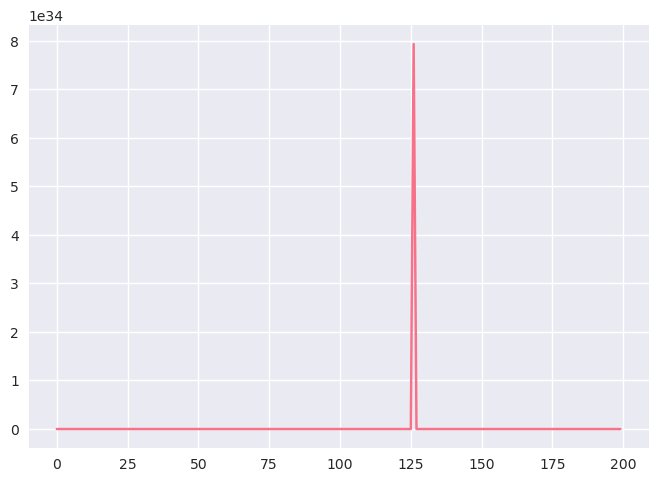

In [10]:
import h5py

with h5py.File('/root/vast/eric/track-mjx/notebooks/rollouts_full_mouse_arm_250810_194525_414048.h5', 'r') as f:
    # Print all top-level keys
    print(list(f.keys()))
    print(f['ref_qpos'].shape)
    plt.plot(f['ref_qpos'][1, :, 3])

In [2]:
%%time
# ─────────────────────────  HEADLESS + BASE IMPORTS  ─────────────────────────
import os, yaml, h5py, copy, numpy as np, jax, jax.numpy as jnp
from omegaconf import OmegaConf
from orbax import checkpoint as ocp
from tqdm.auto import tqdm
from brax.training.acme import running_statistics
from brax.training import distribution
from track_mjx.analysis.rollout import create_environment, create_rollout_generator
from track_mjx.analysis.render import render_rollout, display_video
from track_mjx.agent import checkpointing
from track_mjx.agent.mlp_ppo.intention_network import make_intention_policy
from track_mjx.environment import wrappers
import tempfile

# ─────────────────────────  USER SETTINGS  ──────────────────────────────────
YAML_CONFIG = "/root/vast/eric/track-mjx/track_mjx/config/mouse-arm.yaml"
CKPT_DIR = "/root/vast/eric/track-mjx/model_checkpoints/250810_194525_414048"
CKPT_STEP = 100
ROLLOUT_T = 200
CLIP_INDEX = 0  # Choose which clip to render

# ─────────────────────────  UTILITY  ─────────────────────────────────────────
def fix_noise(env, val=0.0):
    """Cast env._reset_noise_scale to float each time an env is created."""
    if hasattr(env, "_reset_noise_scale"):
        env._reset_noise_scale = float(val)
    return env

def load_checkpoint(ckpt_dir, target, step=None):
    """
    Load checkpoint with shape mismatch tolerance.
    
    Args:
        ckpt_dir: Directory containing checkpoints
        target: PyTree structure to restore into
        step: Optional specific step to restore, None for latest
    
    Returns:
        Restored PyTree
    """
    options = checkpoint.CheckpointManagerOptions(max_to_keep=5)
    
    # Create checkpoint manager with non-strict restore
    ckpt_manager = checkpoint.CheckpointManager(
        ckpt_dir,
        checkpoint.PyTreeCheckpointer(),
        options=options
    )
    
    # Get latest step if not specified
    if step is None:
        step = ckpt_manager.latest_step()
        if step is None:
            raise ValueError(f"No checkpoints found in {ckpt_dir}")
    
    # Create restore args with strict=False to allow shape mismatches
    restore_args = checkpoint.StandardRestoreArgs(
        item=target,
        strict=True  # This allows padding/truncation of arrays
    )
    
    print(f"Loading checkpoint from step {step} with shape mismatch tolerance")
    restored = ckpt_manager.restore(step, args=restore_args)
    return restored

# ─────────────────────────  1) PREPARE CONFIG  ───────────────────────────
with open(YAML_CONFIG) as f:
    cfg = OmegaConf.create(yaml.safe_load(f))
all_paths = [p.strip() for p in str(cfg.data_path).split(",")]
print("Found", len(all_paths), "H5 files")

# Use only the first data file
cfg.data_path = all_paths[0]

# ─────────────────────────  2) LOAD CHECKPOINT  ─────────────────────────────
ckpt_mgr = ocp.CheckpointManager(
    CKPT_DIR, options=ocp.CheckpointManagerOptions(create=False, step_prefix="PPONetwork"))
saved_cfg = ckpt_mgr.restore(
    CKPT_STEP, args=ocp.args.Composite(config=ocp.args.JsonRestore())
)["config"]["network_config"]

latent_size = saved_cfg["intention_size"]
ref_size = saved_cfg["reference_obs_size"]

# probe obs/action sizes
env = fix_noise(create_environment(cfg))
flat = jax.tree_util.tree_leaves(env.reset(jax.random.PRNGKey(0)).obs)
obs_size = int(sum(a.size for a in flat))
act_dim = int(getattr(env, "action_size", env.sys.nu))
nq = int(getattr(env, "qpos_size", getattr(env.sys, "nq", 0)))

# ensure checkpoint net config is consistent
cfg.network_config = copy.deepcopy(saved_cfg)
cfg.network_config.observation_size = obs_size
cfg.network_config.action_size = act_dim
cfg.network_config.reference_obs_size = ref_size
cfg.network_config.intention_size = latent_size

# ─────────────────────────  3) BUILD POLICY NET  ────────────────────────────
# Create an abstract policy to receive weights
abstract_policy = checkpointing.make_abstract_policy(cfg)

# Restore weights from checkpoint
policy = ckpt_mgr.restore(
    CKPT_STEP,
    args=ocp.args.Composite(
        policy=ocp.args.StandardRestore(abstract_policy, strict=True)
    )
)["policy"]
print(f"✓ checkpoint {CKPT_STEP} restored on {jax.default_backend()}")

# ─────────────────────────  4) CREATE ROLLOUT GENERATOR  ───────────────────────────────
# Create the inference function
inference_fn = checkpointing.load_inference_fn(cfg, policy, deterministic=True)

# Create the rollout generator using the proper method from rollout.py
rollout_gen = create_rollout_generator(
    cfg, env, inference_fn, 
    model="mlp", log_activations=True, log_metrics=True, log_sensor_data=True
)

# ─────────────────────────  5) GENERATE SINGLE ROLLOUT  ───────────────────────────────
# Generate the rollout for one clip
print(f"Generating rollout for clip {CLIP_INDEX}...")
rollout_data = rollout_gen(clip_idx=CLIP_INDEX, seed=42)

# ─────────────────────────  6) SAVE TO H5 FILE  ───────────────────────────────────────
temp_file = "temp_single_rollout.h5"
with h5py.File(temp_file, "w") as h5:
    # Save qposes (always needed for rendering)
    h5.create_dataset("qposes_rollout", data=np.array(rollout_data["qposes_rollout"]))
    h5.create_dataset("qposes_ref", data=np.array(rollout_data["qposes_ref"]))
    h5.create_dataset("ctrl", data=np.array(rollout_data["ctrl"]))
    h5.create_dataset("state_rewards", data=np.array(rollout_data["state_rewards"]))
    
    # Save other data if available
    if "rollout_metrics" in rollout_data:
        metrics_grp = h5.create_group("rollout_metrics")
        for k, v in rollout_data["rollout_metrics"].items():
            metrics_grp.create_dataset(k, data=np.array(v))
    
    if "activations" in rollout_data:
        h5.create_dataset("activations", data=np.array(rollout_data["activations"]))
    
    if "joint_forces" in rollout_data:
        h5.create_dataset("joint_forces", data=np.array(rollout_data["joint_forces"]))
    
    if "sensor_readings" in rollout_data:
        h5.create_dataset("sensor_readings", data=np.array(rollout_data["sensor_readings"]))

print(f"✓ Rollout saved to {temp_file}")

# ─────────────────────────  7) RENDER THE ROLLOUT  ───────────────────────────────────
# Make sure we have the info field in rollout_data for rendering
if "info" not in rollout_data:
    length = len(rollout_data["qposes_rollout"])
    rollout_data["info"] = [{"clip_idx": CLIP_INDEX}] * length

# Render the rollout directly using the original data
print("Rendering rollout...")
frames, fps = render_rollout(cfg, rollout_data, height=480, width=640, render_ghost=True)
print(f"✓ Rendered {len(frames)} frames at {fps} FPS")

# Display the video
display_video(frames, framerate=fps)

Found 46 H5 files


ValueError: Requested shape: (104,) is not compatible with the stored shape: (44,). Truncating/padding is disabled by setting of `strict=True`. When using standard Orbax APIs, this behavior can be modified by specifying `strict=False` in `ArrayRestoreArgs` for any array in which padding/truncation is desired.

Simulated data: 46 clips, 100 timesteps at 400 Hz
Total trials in CSV: 77
Valid trials (non-zero start/end): 46
Expected to match simulation clips: 46
Valid trial indices: [0, 3, 8, 9, 12, 14, 15, 16, 18, 19]...
✓ Perfect match: 46 valid trials = 46 simulation clips
Downsampling: 30000 Hz → 200 Hz (factor: 150)

Processing Anterior Deltoid EMG vs Sim Anterior Deltoid...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 100 samples
      Trial 3: 15000 → 100 samples
      Trial 8: 15000 → 100 samples
      Trial 9: 15000 → 100 samples
      Trial 12: 15000 → 100 samples
    Final EMG data shape: (46, 100)
    EMG normalization: 99th percentile = 0.009483 (max = 0.021561)
  Correlation: 0.306, EMG reaches: 46
  ✓ Perfect match: 46 clips

Processing Triceps EMG vs Sim Triceps Lateral...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 100 samples
      Trial 3: 15000 → 100 samples
      Trial 8: 15000 → 100 samples
      Trial 9: 15000 → 100 samples
      Trial 12: 15000 → 100 sa

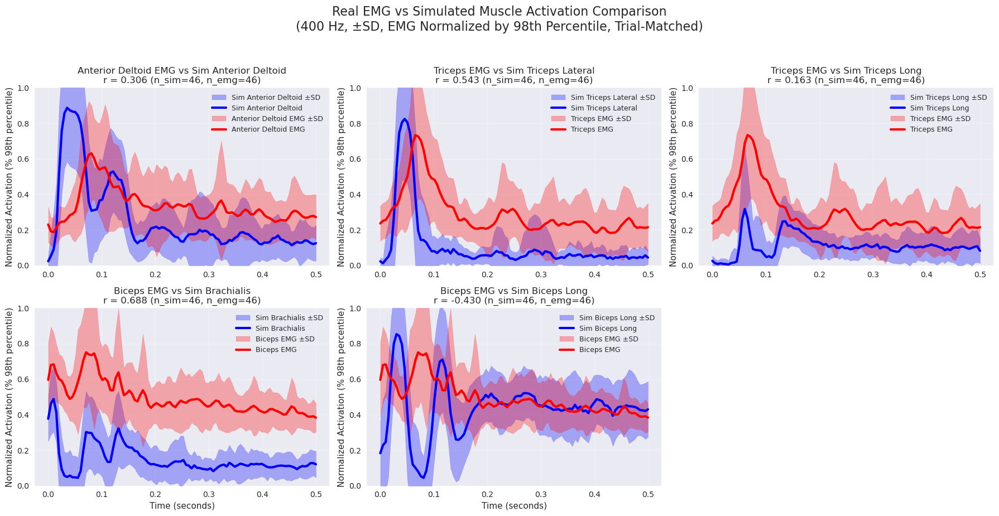


CORRELATION SUMMARY:
EMG Normalization: 98th Percentile (Robust to Outliers)
Trial Matching: Only trials with valid start/end indices
Values represent % of 98th percentile activation
Error regions show ±1 standard deviation
--------------------------------------------------------------------------------
Anterior Deltoid EMG vs Sim Anterior Deltoid: r =  0.306 (n_emg=46, n_sim=46)
Triceps EMG vs Sim Triceps Lateral : r =  0.543 (n_emg=46, n_sim=46)
Triceps EMG vs Sim Triceps Long    : r =  0.163 (n_emg=46, n_sim=46)
Biceps EMG vs Sim Brachialis       : r =  0.688 (n_emg=46, n_sim=46)
Biceps EMG vs Sim Biceps Long      : r = -0.430 (n_emg=46, n_sim=46)


In [25]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# --------------------------- SIMULATED DATA SETTINGS -----------------------------------
H5_PATH = "rollouts_full_mouse_arm_new_250831_001916_126200.h5"
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Muscle configurations: (sim_index, sim_name, emg_file, emg_name)
MUSCLE_CONFIGS = [
    (3, "Anterior Deltoid", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Anterior Deltoid"),
    (5, "Triceps Lateral", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (6, "Triceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (7, "Brachialis", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
    (8, "Biceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
]

# Load simulated muscle activation data
with h5py.File(H5_PATH, "r") as f:
    actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)

n_clips, T, _ = actions.shape
sim_time_s = np.linspace(0, 0.5, T)  # 0 → 0.5 s for 200 steps at 400 Hz

print(f"Simulated data: {n_clips} clips, {T} timesteps at 400 Hz")

# --------------------------- CREATE TRIAL MASK -----------------------------------
# Load the trial data (main CSV with reach indices)
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')

# Create trial mask: valid trials have non-zero, non-NaN start and end values
trial_mask = (
    (df['start'].notna()) & 
    (df['end'].notna()) & 
    (df['start'] > 0) & 
    (df['end'] > 0) &
    (df['start'] != df['end'])  # Make sure start != end
)

# Get the valid trials
valid_trials_df = df[trial_mask].copy()
valid_trial_indices = valid_trials_df.index.tolist()

print(f"Total trials in CSV: {len(df)}")
print(f"Valid trials (non-zero start/end): {len(valid_trials_df)}")
print(f"Expected to match simulation clips: {n_clips}")
print(f"Valid trial indices: {valid_trial_indices[:10]}...")  # Show first 10

# Verify we have the right number of trials
if len(valid_trials_df) != n_clips:
    print(f"WARNING: Trial count mismatch! CSV valid trials: {len(valid_trials_df)}, Simulation clips: {n_clips}")
else:
    print(f"✓ Perfect match: {len(valid_trials_df)} valid trials = {n_clips} simulation clips")

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20  # High pass cutoff frequency in Hz
lowpass_cutoff = 1000  # Low pass cutoff frequency in Hz
envelope_cutoff = 50  # Envelope cutoff frequency in Hz
filter_order = 4  # Butterworth filter order

# Calculate downsampling parameters
target_fs = 200  # Target sampling rate to match simulation
downsample_factor = fs // target_fs  # 30000 // 400 = 75 samples per chunk
target_samples = 100  # Number of samples we want (to match simulation)

print(f"Downsampling: {fs} Hz → {target_fs} Hz (factor: {downsample_factor})")

# Function to process EMG data for a given muscle
def process_emg_data(emg_file_path):
    """Process EMG data and return normalized envelope and statistics"""
    # Load EMG data
    emg_data = pd.read_csv(emg_file_path, header=None)
    print(f"    Loaded EMG data: {len(emg_data)} trials")
    
    # Process only valid trials using the trial mask
    reach_envelopes_downsampled = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        # idx is the original trial number from the CSV (the index from df)
        trial_num = idx
        
        # Convert reach start index from 200Hz frames to 30000Hz samples
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + 15000  # 0.5 seconds
        
        # Get EMG data for this specific trial (using original trial index)
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Downsample by averaging chunks
                    n_samples = len(reach_envelope)
                    n_chunks = n_samples // downsample_factor
                    
                    # Trim to exact multiple of downsample_factor
                    trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]
                    
                    # Reshape and average
                    reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
                    downsampled_envelope = np.mean(reshaped, axis=1)
                    
                    # Only keep if we have the target number of samples (200)
                    if len(downsampled_envelope) >= target_samples:
                        downsampled_envelope = downsampled_envelope[:target_samples]
                        reach_envelopes_downsampled.append(downsampled_envelope)
                        
                        if i < 5:  # Debug info for first few trials
                            print(f"      Trial {trial_num}: {n_samples} → {len(downsampled_envelope)} samples")
        else:
            print(f"      Trial {trial_num}: EMG data index out of range")
    
    if not reach_envelopes_downsampled:
        return None, None, None, None
    
    # Convert to numpy array
    envelopes_array = np.array(reach_envelopes_downsampled)
    print(f"    Final EMG data shape: {envelopes_array.shape}")
    
    # ROBUST EMG NORMALIZATION:
    # Normalize by the 95th percentile of all observed values
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    # Also calculate the actual max for comparison
    actual_max = np.max(envelopes_array)
    
    print(f"    EMG normalization: 99th percentile = {norm_value:.6f} (max = {actual_max:.6f})")
    
    # Calculate mean and standard deviation of normalized data
    mean_norm_envelope = np.mean(normalized_envelopes, axis=0)
    std_norm_envelope = np.std(normalized_envelopes, axis=0)
    
    # Create time axis
    emg_time_axis = np.linspace(0, 0.5, len(mean_norm_envelope))
    
    return mean_norm_envelope, std_norm_envelope, emg_time_axis, len(reach_envelopes_downsampled)

# --------------------------- PROCESS ALL MUSCLES -----------------------------------
muscle_data = {}
correlations = {}

for muscle_idx, sim_name, emg_file, emg_name in MUSCLE_CONFIGS:
    comparison_name = f"{emg_name} EMG vs Sim {sim_name}"
    print(f"\nProcessing {comparison_name}...")
    
    # Extract simulated data
    sim_traces = actions[:, :, muscle_idx]
    sim_mean = sim_traces.mean(0)
    sim_std = sim_traces.std(0)
    
    # Process EMG data
    emg_mean, emg_std, emg_time, n_reaches = process_emg_data(emg_file)
    
    if emg_mean is not None:
        # Calculate correlation
        correlation = np.corrcoef(sim_mean, emg_mean)[0, 1]
        correlations[comparison_name] = correlation
        
        # Store data
        muscle_data[comparison_name] = {
            'sim_mean': sim_mean,
            'sim_std': sim_std,
            'emg_mean': emg_mean,
            'emg_std': emg_std,
            'emg_time': emg_time,
            'correlation': correlation,
            'n_reaches': n_reaches,
            'sim_name': sim_name,
            'emg_name': emg_name
        }
        
        print(f"  Correlation: {correlation:.3f}, EMG reaches: {n_reaches}")
        
        # Verify we have matching number of clips
        if n_reaches != n_clips:
            print(f"  WARNING: Mismatch! Simulation: {n_clips} clips, EMG: {n_reaches} reaches")
        else:
            print(f"  ✓ Perfect match: {n_clips} clips")
    else:
        print(f"  No valid EMG data found for {comparison_name}")

# --------------------------- CREATE 2x3 SUBPLOT -----------------------------------
if muscle_data:
    # Select first 5 muscles for 2x3 grid (we have 5 comparisons)
    comparison_names = list(muscle_data.keys())
    
    # Create figure with 2x3 subplots
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()  # Flatten for easier indexing
    
    for i, comparison_name in enumerate(comparison_names):
        if i >= 6:  # Safety check
            break
            
        data = muscle_data[comparison_name]
        ax = axes[i]
        
        # Plot simulated data
        ax.fill_between(sim_time_s, data['sim_mean'] - data['sim_std'], 
                       data['sim_mean'] + data['sim_std'], 
                       alpha=0.3, color='blue', label=f'Sim {data["sim_name"]} ±SD')
        ax.plot(sim_time_s, data['sim_mean'], 'b-', linewidth=3, label=f'Sim {data["sim_name"]}')
        
        # Plot EMG data
        ax.fill_between(data['emg_time'], data['emg_mean'] - data['emg_std'], 
                       data['emg_mean'] + data['emg_std'], 
                       alpha=0.3, color='red', label=f'{data["emg_name"]} EMG ±SD')
        ax.plot(data['emg_time'], data['emg_mean'], 'r-', linewidth=3, label=f'{data["emg_name"]} EMG')
        
        ax.set_ylabel('Normalized Activation (% 98th percentile)', fontsize=11)
        ax.set_title(f'{comparison_name}\nr = {data["correlation"]:.3f} (n_sim={n_clips}, n_emg={data["n_reaches"]})', 
                    fontsize=12)
        ax.legend(fontsize=9)
        ax.grid(True, alpha=0.3)
        ax.set_ylim(0, 1.0)  # Slightly higher since some values may exceed 1.0
        
        # Add x-label to bottom row
        if i >= 3:
            ax.set_xlabel('Time (seconds)', fontsize=11)
    
    # Hide unused subplots if less than 6 muscles
    for i in range(len(comparison_names), 6):
        axes[i].set_visible(False)
    
    # Overall title
    fig.suptitle('Real EMG vs Simulated Muscle Activation Comparison\n(400 Hz, ±SD, EMG Normalized by 98th Percentile, Trial-Matched)', 
                 fontsize=16, y=0.95)
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.92])
    plt.show()
    
    # Print summary
    print("\n" + "="*80)
    print("CORRELATION SUMMARY:")
    print("="*80)
    print("EMG Normalization: 98th Percentile (Robust to Outliers)")
    print("Trial Matching: Only trials with valid start/end indices")
    print("Values represent % of 98th percentile activation")
    print("Error regions show ±1 standard deviation")
    print("-"*80)
    for comparison_name, correlation in correlations.items():
        n_reaches = muscle_data[comparison_name]['n_reaches']
        print(f"{comparison_name:<35}: r = {correlation:>6.3f} (n_emg={n_reaches}, n_sim={n_clips})")
    print("="*80)

else:
    print("No valid muscle data found for plotting.")

Simulated data: 46 clips, 199 timesteps at 400 Hz
Total trials in CSV: 77
Valid trials (non-zero start/end): 46
Expected to match simulation clips: 46
Valid trial indices: [0, 3, 8, 9, 12, 14, 15, 16, 18, 19]...
✓ Perfect match: 46 valid trials = 46 simulation clips
Downsampling: 30000 Hz → 400 Hz (factor: 75)

Processing Anterior Deltoid EMG vs Sim Anterior Deltoid...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 199 samples
      Trial 3: 15000 → 199 samples
      Trial 8: 15000 → 199 samples
      Trial 9: 15000 → 199 samples
      Trial 12: 15000 → 199 samples
    Final EMG data shape: (46, 199)
    EMG normalization: 99th percentile = 0.009500 (max = 0.021586)
  Correlation: -0.029, EMG reaches: 46
  ✓ Perfect match: 46 clips

Processing Triceps EMG vs Sim Triceps Lateral...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 199 samples
      Trial 3: 15000 → 199 samples
      Trial 8: 15000 → 199 samples
      Trial 9: 15000 → 199 samples
      Trial 12: 15000 → 199 sa

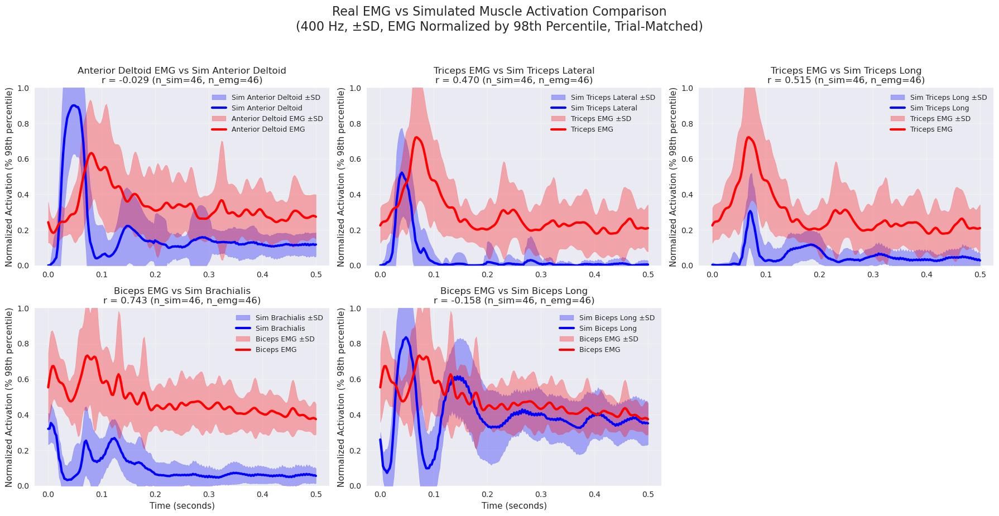


CORRELATION SUMMARY:
EMG Normalization: 98th Percentile (Robust to Outliers)
Trial Matching: Only trials with valid start/end indices
Values represent % of 98th percentile activation
Error regions show ±1 standard deviation
--------------------------------------------------------------------------------
Anterior Deltoid EMG vs Sim Anterior Deltoid: r = -0.029 (n_emg=46, n_sim=46)
Triceps EMG vs Sim Triceps Lateral : r =  0.470 (n_emg=46, n_sim=46)
Triceps EMG vs Sim Triceps Long    : r =  0.515 (n_emg=46, n_sim=46)
Biceps EMG vs Sim Brachialis       : r =  0.743 (n_emg=46, n_sim=46)
Biceps EMG vs Sim Biceps Long      : r = -0.158 (n_emg=46, n_sim=46)


In [10]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# --------------------------- SIMULATED DATA SETTINGS -----------------------------------
H5_PATH = "/root/vast/eric/track-mjx/results/neurIPS-paramsweep/big_sweep_ctrl_ctrldiff_energy/mouse_muscle_arm_imitation_params_CTRLCOST_0.15_CTRLDIFF_0.01_ENERGY_0.2_250901_025708_486827.h5"
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Muscle configurations: (sim_index, sim_name, emg_file, emg_name)
MUSCLE_CONFIGS = [
    (3, "Anterior Deltoid", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Anterior Deltoid"),
    (5, "Triceps Lateral", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (6, "Triceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (7, "Brachialis", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
    (8, "Biceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
]

# Load simulated muscle activation data
with h5py.File(H5_PATH, "r") as f:
    actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)

n_clips, T, _ = actions.shape
sim_time_s = np.linspace(0, 0.5, T)  # 0 → 0.5 s for 200 steps at 400 Hz

print(f"Simulated data: {n_clips} clips, {T} timesteps at 400 Hz")

# --------------------------- CREATE TRIAL MASK -----------------------------------
# Load the trial data (main CSV with reach indices)
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')

# Create trial mask: valid trials have non-zero, non-NaN start and end values
trial_mask = (
    (df['start'].notna()) & 
    (df['end'].notna()) & 
    (df['start'] > 0) & 
    (df['end'] > 0) &
    (df['start'] != df['end'])  # Make sure start != end
)

# Get the valid trials
valid_trials_df = df[trial_mask].copy()
valid_trial_indices = valid_trials_df.index.tolist()

print(f"Total trials in CSV: {len(df)}")
print(f"Valid trials (non-zero start/end): {len(valid_trials_df)}")
print(f"Expected to match simulation clips: {n_clips}")
print(f"Valid trial indices: {valid_trial_indices[:10]}...")  # Show first 10

# Verify we have the right number of trials
if len(valid_trials_df) != n_clips:
    print(f"WARNING: Trial count mismatch! CSV valid trials: {len(valid_trials_df)}, Simulation clips: {n_clips}")
else:
    print(f"✓ Perfect match: {len(valid_trials_df)} valid trials = {n_clips} simulation clips")

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20  # High pass cutoff frequency in Hz
lowpass_cutoff = 1000  # Low pass cutoff frequency in Hz
envelope_cutoff = 50  # Envelope cutoff frequency in Hz
filter_order = 4  # Butterworth filter order

# Calculate downsampling parameters
target_fs = 400  # Target sampling rate to match simulation
downsample_factor = fs // target_fs  # 30000 // 400 = 75 samples per chunk
target_samples = 199  # Number of samples we want (to match simulation)

print(f"Downsampling: {fs} Hz → {target_fs} Hz (factor: {downsample_factor})")

# Function to process EMG data for a given muscle
def process_emg_data(emg_file_path):
    """Process EMG data and return normalized envelope and statistics"""
    # Load EMG data
    emg_data = pd.read_csv(emg_file_path, header=None)
    print(f"    Loaded EMG data: {len(emg_data)} trials")
    
    # Process only valid trials using the trial mask
    reach_envelopes_downsampled = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        # idx is the original trial number from the CSV (the index from df)
        trial_num = idx
        
        # Convert reach start index from 200Hz frames to 30000Hz samples
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + 15000  # 0.5 seconds
        
        # Get EMG data for this specific trial (using original trial index)
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Downsample by averaging chunks
                    n_samples = len(reach_envelope)
                    n_chunks = n_samples // downsample_factor
                    
                    # Trim to exact multiple of downsample_factor
                    trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]
                    
                    # Reshape and average
                    reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
                    downsampled_envelope = np.mean(reshaped, axis=1)
                    
                    # Only keep if we have the target number of samples (200)
                    if len(downsampled_envelope) >= target_samples:
                        downsampled_envelope = downsampled_envelope[:target_samples]
                        reach_envelopes_downsampled.append(downsampled_envelope)
                        
                        if i < 5:  # Debug info for first few trials
                            print(f"      Trial {trial_num}: {n_samples} → {len(downsampled_envelope)} samples")
        else:
            print(f"      Trial {trial_num}: EMG data index out of range")
    
    if not reach_envelopes_downsampled:
        return None, None, None, None
    
    # Convert to numpy array
    envelopes_array = np.array(reach_envelopes_downsampled)
    print(f"    Final EMG data shape: {envelopes_array.shape}")
    
    # ROBUST EMG NORMALIZATION:
    # Normalize by the 95th percentile of all observed values
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    # Also calculate the actual max for comparison
    actual_max = np.max(envelopes_array)
    
    print(f"    EMG normalization: 99th percentile = {norm_value:.6f} (max = {actual_max:.6f})")
    
    # Calculate mean and standard deviation of normalized data
    mean_norm_envelope = np.mean(normalized_envelopes, axis=0)
    std_norm_envelope = np.std(normalized_envelopes, axis=0)
    
    # Create time axis
    emg_time_axis = np.linspace(0, 0.5, len(mean_norm_envelope))
    
    return mean_norm_envelope, std_norm_envelope, emg_time_axis, len(reach_envelopes_downsampled)

# --------------------------- PROCESS ALL MUSCLES -----------------------------------
muscle_data = {}
correlations = {}

for muscle_idx, sim_name, emg_file, emg_name in MUSCLE_CONFIGS:
    comparison_name = f"{emg_name} EMG vs Sim {sim_name}"
    print(f"\nProcessing {comparison_name}...")
    
    # Extract simulated data
    sim_traces = actions[:, :, muscle_idx]
    sim_mean = sim_traces.mean(0)
    sim_std = sim_traces.std(0)
    
    # Process EMG data
    emg_mean, emg_std, emg_time, n_reaches = process_emg_data(emg_file)
    
    if emg_mean is not None:
        # Calculate correlation
        correlation = np.corrcoef(sim_mean, emg_mean)[0, 1]
        correlations[comparison_name] = correlation
        
        # Store data
        muscle_data[comparison_name] = {
            'sim_mean': sim_mean,
            'sim_std': sim_std,
            'emg_mean': emg_mean,
            'emg_std': emg_std,
            'emg_time': emg_time,
            'correlation': correlation,
            'n_reaches': n_reaches,
            'sim_name': sim_name,
            'emg_name': emg_name
        }
        
        print(f"  Correlation: {correlation:.3f}, EMG reaches: {n_reaches}")
        
        # Verify we have matching number of clips
        if n_reaches != n_clips:
            print(f"  WARNING: Mismatch! Simulation: {n_clips} clips, EMG: {n_reaches} reaches")
        else:
            print(f"  ✓ Perfect match: {n_clips} clips")
    else:
        print(f"  No valid EMG data found for {comparison_name}")

# --------------------------- CREATE 2x3 SUBPLOT -----------------------------------
if muscle_data:
    # Select first 5 muscles for 2x3 grid (we have 5 comparisons)
    comparison_names = list(muscle_data.keys())
    
    # Create figure with 2x3 subplots
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()  # Flatten for easier indexing
    
    for i, comparison_name in enumerate(comparison_names):
        if i >= 6:  # Safety check
            break
            
        data = muscle_data[comparison_name]
        ax = axes[i]
        
        # Plot simulated data
        ax.fill_between(sim_time_s, data['sim_mean'] - data['sim_std'], 
                       data['sim_mean'] + data['sim_std'], 
                       alpha=0.3, color='blue', label=f'Sim {data["sim_name"]} ±SD')
        ax.plot(sim_time_s, data['sim_mean'], 'b-', linewidth=3, label=f'Sim {data["sim_name"]}')
        
        # Plot EMG data
        ax.fill_between(data['emg_time'], data['emg_mean'] - data['emg_std'], 
                       data['emg_mean'] + data['emg_std'], 
                       alpha=0.3, color='red', label=f'{data["emg_name"]} EMG ±SD')
        ax.plot(data['emg_time'], data['emg_mean'], 'r-', linewidth=3, label=f'{data["emg_name"]} EMG')
        
        ax.set_ylabel('Normalized Activation (% 98th percentile)', fontsize=11)
        ax.set_title(f'{comparison_name}\nr = {data["correlation"]:.3f} (n_sim={n_clips}, n_emg={data["n_reaches"]})', 
                    fontsize=12)
        ax.legend(fontsize=9)
        ax.grid(True, alpha=0.3)
        ax.set_ylim(0, 1.0)  # Slightly higher since some values may exceed 1.0
        
        # Add x-label to bottom row
        if i >= 3:
            ax.set_xlabel('Time (seconds)', fontsize=11)
    
    # Hide unused subplots if less than 6 muscles
    for i in range(len(comparison_names), 6):
        axes[i].set_visible(False)
    
    # Overall title
    fig.suptitle('Real EMG vs Simulated Muscle Activation Comparison\n(400 Hz, ±SD, EMG Normalized by 98th Percentile, Trial-Matched)', 
                 fontsize=16, y=0.95)
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.92])
    plt.show()
    
    # Print summary
    print("\n" + "="*80)
    print("CORRELATION SUMMARY:")
    print("="*80)
    print("EMG Normalization: 98th Percentile (Robust to Outliers)")
    print("Trial Matching: Only trials with valid start/end indices")
    print("Values represent % of 98th percentile activation")
    print("Error regions show ±1 standard deviation")
    print("-"*80)
    for comparison_name, correlation in correlations.items():
        n_reaches = muscle_data[comparison_name]['n_reaches']
        print(f"{comparison_name:<35}: r = {correlation:>6.3f} (n_emg={n_reaches}, n_sim={n_clips})")
    print("="*80)

else:
    print("No valid muscle data found for plotting.")

In [17]:
# ─────────────────────────  HELPERS  ─────────────────────────────────────────
def _fix_noise(env, val=0.0):
    """Set deterministic reset noise on env (same as your rollout).

    Args:
        env: Environment instance (composer/mjx wrapper).
        val (float): noise scale to set.

    Returns:
        env unchanged (but with _reset_noise_scale set if present).
    """
    if hasattr(env, "_reset_noise_scale"):
        env._reset_noise_scale = float(val)
    return env


def _find_source_for_global_clip(yaml_config: str, global_clip_id: int):
    """Map a global clip index (0-based) to (source_file_path, local_clip_idx).

    Args:
        yaml_config (str): Path to mouse-arm.yaml with `data_path`.
        global_clip_id (int): Global clip index (as used in the rollout H5).

    Returns:
        tuple[str, int, list[str]]: (source_h5_path, local_clip_id, all_paths)

    Raises:
        IndexError: if global_clip_id >= total number of clips.
    """
    # Load config from YAML file to get data paths
    with open(yaml_config) as f:
        cfg_base = OmegaConf.create(yaml.safe_load(f))
    all_paths = [p.strip() for p in str(cfg_base.data_path).split(",")]

    # Iterate through all source files to find which one contains our clip
    running = 0
    for p in tqdm(all_paths, desc="indexing source files", unit="file", leave=False):
        cfg_tmp = copy.deepcopy(cfg_base)
        cfg_tmp.data_path = p
        env = _fix_noise(create_environment(cfg_tmp))
        n = int(getattr(env, "_n_clips", 0))
        if global_clip_id < running + n:
            local = global_clip_id - running
            return p, local, all_paths
        running += n

    raise IndexError(f"Global clip_id {global_clip_id} exceeds total clips ({running}).")


def _try_load_ref_clip(source_h5: str, local_clip_id: int):
    """Load reference joint angles for a given local clip from a source .h5.

    Tries common dataset keys and shapes:
      - datasets shaped (clips, T, nq) or (T, nq)
      - keys in order: 'qpos', 'ref_qpos', 'qpos_ref', 'angles', 'joint_angles'
      - if none match, falls back to any (clips, T, nq) array found.

    Args:
        source_h5 (str): path to the original per-clip data file.
        local_clip_id (int): clip index within that file.

    Returns:
        np.ndarray: (T, nq) joint angles (radians)

    Raises:
        KeyError: if no suitable dataset is found.
    """
    # List of potential dataset names to look for
    candidates = ["qpos", "ref_qpos", "angles", "joint_angles"]
    with h5py.File(source_h5, "r") as h5:
        # Try each candidate dataset name
        for k in candidates:
            if k in h5:
                arr = h5[k][...]
                # Handle 3D array (clips, timesteps, joints)
                if arr.ndim == 3:
                    if local_clip_id < arr.shape[0]:
                        return arr[local_clip_id]
                # Handle 2D array (timesteps, joints)
                elif arr.ndim == 2:
                    return arr
        # Fallback: any (clips, T, nq) array
        for k in h5.keys():
            arr = h5[k][...]
            if arr.ndim == 3 and local_clip_id < arr.shape[0]:
                return arr[local_clip_id]
    raise KeyError(f"No reference joint dataset found in {source_h5} for clip {local_clip_id}.")


def _resample_to(sim_T: int, src: np.ndarray, src_hz: int, dst_hz: int) -> np.ndarray:
    """Resample (T, D) by linear interpolation to match target length at dst_hz.

    Args:
        sim_T (int): target time steps at destination rate.
        src (np.ndarray): (T_src, D) source trajectory.
        src_hz (int): source sampling rate (Hz).
        dst_hz (int): destination sampling rate (Hz).

    Returns:
        np.ndarray: (sim_T, D) resampled trajectory.
    """
    T_src = src.shape[0]
    # If rates match and lengths match, no resampling needed
    if src_hz == dst_hz and T_src == sim_T:
        return src
    # Create time arrays for source and destination
    t_src = np.arange(T_src) / float(src_hz)
    t_dst = np.arange(sim_T) / float(dst_hz)
    # Interpolate each dimension separately
    out = np.empty((sim_T, src.shape[1]), dtype=src.dtype)
    for d in range(src.shape[1]):
        out[:, d] = np.interp(t_dst, t_src, src[:, d])
    return out

In [3]:
# %%time
# ─────────────────────────  IMPORTS  ─────────────────────────────────────────
import os, yaml, h5py, copy
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm
from omegaconf import OmegaConf

# env import used only to count clips/file (map global clip → (file, local_idx))
from track_mjx.analysis.rollout import create_environment

# ─────────────────────────  USER SETTINGS  ──────────────────────────────────
YAML_CONFIG = "/root/vast/eric/track-mjx/track_mjx/config/mouse-arm.yaml"
H5_PATH     = "rollouts_full_mouse_arm_new_250826_222716_299414.h5"
CLIP_ID     = 0  # global clip index to visualize
SAVE_PATH   = f"./figures/fig2/fig2c_joint_angle_tracking_clip{CLIP_ID}.pdf"

# Joint config (edit indices/names/labels to match your ordering)
JOINT_NAMES   = ["sh_elv", "sh_ext", "sh_rot", "elbow"]
JOINT_LABELS  = ["Sh Elevation", "Sh Extension", "Sh Rotation", "Elbow"]
JOINT_INDICES = [0, 1, 2, 3]

# Plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Visualization time window (in seconds)
MAX_TIME = 0.25  # Only show first 0.25 seconds of data


def plot_joint_angles_from_datapath(
    yaml_config: str,
    rollout_h5: str,
    clip_id: int = 0,
    joint_indices=None,
    joint_names=None,
    joint_labels=None,
    save_path: str | None = None,
    sim_hz: int = 400,
    ref_hz: int = 200,
    max_time: float = None,  # Maximum time to plot (in seconds)
):
    """Plot reference-vs-rollout joint angles for a given global clip by
    loading the reference from the original `data_path` file.

    Args:
        yaml_config (str): Path to YAML with `data_path`.
        rollout_h5 (str): Rollout H5 that has 'qpos' for the sim clip.
        clip_id (int): Global clip to visualize.
        joint_indices (list[int]): indices to plot.
        joint_names (list[str]): names for titles.
        joint_labels (list[str]): labels for y-axis.
        save_path (str|None): PDF/PNG path to save.
        sim_hz (int): sim sampling rate (default 400 Hz).
        ref_hz (int): reference sampling rate (default 200 Hz).
        max_time (float): Maximum time to plot in seconds.

    Returns:
        matplotlib.figure.Figure
    """
    # Set default values if not provided
    if joint_indices is None:
        joint_indices = [0, 1, 2, 3]
    if joint_names is None:
        joint_names = [f"Joint {i}" for i in joint_indices]
    if joint_labels is None:
        joint_labels = joint_names

    # 1) Load sim qpos for the global clip from rollout file
    with h5py.File(rollout_h5, "r") as h5:
        if "qpos" not in h5:
            raise ValueError(f"'qpos' not found in {rollout_h5}. Re-run rollout to save qpos.")
        qpos_sim = h5["qpos"][...]  # (clips, T, nq)
    if clip_id >= qpos_sim.shape[0]:
        raise IndexError(f"clip_id {clip_id} out of range (total={qpos_sim.shape[0]}).")
    sim_clip = qpos_sim[clip_id]  # (T, nq)
    sim_T, nq = sim_clip.shape

    # 2) Map global clip → (source file, local clip) to find original data
    src_path, local_idx, _ = _find_source_for_global_clip(yaml_config, clip_id)

    # 3) Load reference joint angles for that local clip
    ref_clip = _try_load_ref_clip(src_path, local_idx)  # (T_ref, nq_ref)
    
    # Align DOFs if shapes differ between reference and simulation
    if ref_clip.shape[1] != nq:
        min_nq = min(nq, ref_clip.shape[1])
        ref_clip = ref_clip[:, :min_nq]
        sim_clip = sim_clip[:, :min_nq]
        nq = min_nq

    # 4) Resample reference to sim rate/length for fair comparison
    ref_clip_resampled = _resample_to(sim_T, ref_clip, ref_hz, sim_hz)

    # 5) Create time axis and filter data if max_time is specified
    time = np.arange(sim_T) / float(sim_hz)
    
    if max_time is not None:
        # Find index corresponding to max_time
        time_idx = np.searchsorted(time, max_time, side='right')
        # Filter all data to this time window
        time = time[:time_idx]
        sim_clip = sim_clip[:time_idx]
        ref_clip_resampled = ref_clip_resampled[:time_idx]
    
    # Calculate y-limits (global across all requested joints)
    all_vals = []
    for j in joint_indices:
        all_vals.extend(np.degrees(sim_clip[:, j][np.isfinite(sim_clip[:, j])]))
        all_vals.extend(np.degrees(ref_clip_resampled[:, j][np.isfinite(ref_clip_resampled[:, j])]))
    if not all_vals:
        raise ValueError("No finite joint angle data to plot.")
    y_min = np.min(all_vals) - 5
    y_max = np.max(all_vals) + 5

    # 6) Create figure with subplots (one per joint)
    fig, axes = plt.subplots(len(joint_indices), 1, figsize=(3, 6), sharex=True)
    axes = np.atleast_1d(axes)

    # 7) Plot each joint's angle over time
    for i, (j, name, label) in enumerate(zip(joint_indices, joint_names, joint_labels)):
        # Convert radians to degrees for plotting
        ref_deg = np.degrees(ref_clip_resampled[:, j])
        sim_deg = np.degrees(sim_clip[:, j])
        
        # Create masks for valid data points
        ref_mask = np.isfinite(ref_deg)
        sim_mask = np.isfinite(sim_deg)
        both = ref_mask & sim_mask

        # Plot reference trajectory
        sns.lineplot(x=time[ref_mask], y=ref_deg[ref_mask], ax=axes[i],
                     color="orange", label="STAC Reference", linewidth=2)
        
        # Plot simulation trajectory
        sns.lineplot(x=time[sim_mask], y=sim_deg[sim_mask], ax=axes[i],
                     color="skyblue", label="Track Replay", linewidth=2)
        
        # Highlight the difference between reference and simulation
        if np.any(both):
            axes[i].fill_between(time[both], ref_deg[both], sim_deg[both],
                                 alpha=0.2, color="red")

        # Configure subplot appearance
        axes[i].set_ylabel(label, fontsize=12)
        axes[i].set_ylim(y_min, y_max)
        
        # Set x-limit to our specified max time or the available data
        if max_time is not None:
            axes[i].set_xlim(0, max_time)
        else:
            axes[i].set_xlim(0, time[-1])

        # Set y-ticks at regular intervals based on data range
        rng = y_max - y_min
        tick_interval = 25 if rng > 80 else (20 if rng > 40 else 10)
        tick_start = int(np.floor(y_min / tick_interval)) * tick_interval
        tick_end   = int(np.ceil(y_max / tick_interval)) * tick_interval
        y_ticks = np.arange(tick_start, tick_end + tick_interval, tick_interval)
        y_ticks = y_ticks[(y_ticks >= y_min) & (y_ticks <= y_max)]
        axes[i].set_yticks(y_ticks)

        # Style each subplot
        axes[i].grid(False)
        if i < len(joint_indices) - 1:
            # For all but the last subplot, hide bottom
            sns.despine(ax=axes[i], top=True, right=True, bottom=True, left=False)
            axes[i].tick_params(bottom=False, labelbottom=False)
            axes[i].spines["left"].set_position(("outward", 5))
        else:
            # For the last subplot, show bottom axis
            sns.despine(ax=axes[i], top=True, right=True, bottom=False, left=False)
            axes[i].spines["bottom"].set_bounds(0, time[-1] if max_time is None else max_time)
            axes[i].spines["left"].set_position(("outward", 5))
            axes[i].spines["bottom"].set_position(("outward", 5))
        
        # Remove individual legends (will add global legend later)
        if axes[i].get_legend():
            axes[i].get_legend().remove()
        

    # 8) Configure shared labels and legend
    fig.text(-0.02, 0.5, "Joint Angle (degrees)", va="center",
             rotation="vertical", fontsize=14, fontweight="bold")
    
    # Set x-ticks based on our time range (0-0.25s)
    plot_max_time = time[-1] if max_time is None else max_time
    if plot_max_time <= 0.25:
        # For 0-0.25s range, use 0.05s intervals
        x_tick_interval = 0.05
    else:
        x_tick_interval = 0.5 if plot_max_time <= 2 else (1.0 if plot_max_time <= 5 else 2.0)
    
    axes[-1].set_xticks(np.arange(0, plot_max_time + x_tick_interval, x_tick_interval))

    # Add global legend
    from matplotlib.patches import Patch
    legend_elements = [
        plt.Line2D([0], [0], color="orange", lw=2, label="STAC Reference"),
        plt.Line2D([0], [0], color="skyblue", lw=2, label="Track Replay"),
        Patch(facecolor="red", alpha=0.2, label="Difference"),
    ]
    fig.legend(handles=legend_elements, loc="upper right", ncol=1,
               fontsize=10, frameon=False, bbox_to_anchor=(0.98, 1))

    # Add x-axis label
    axes[-1].set_xlabel("Time (seconds)", fontsize=12)
    plt.subplots_adjust(left=0.12, top=0.92)
    plt.tight_layout()

    # Save figure if path provided
    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, bbox_inches="tight", dpi=600)

    return fig

# ─────────────────────────  RUN  ────────────────────────────────────────────
# Run the plotting function with our configured parameters
# We're limiting the plot to show only the first 0.25 seconds of data
fig = plot_joint_angles_from_datapath(
    yaml_config=YAML_CONFIG,
    rollout_h5=H5_PATH,
    clip_id=CLIP_ID,
    joint_indices=JOINT_INDICES,
    joint_names=JOINT_NAMES,
    joint_labels=JOINT_LABELS,
    save_path=SAVE_PATH,
    sim_hz=400,      # Simulation runs at 400 Hz
    ref_hz=200,      # Reference data is at 200 Hz
    max_time=MAX_TIME,  # Only plot first 0.25 seconds
)
plt.show()
print(f"Figure saved to {SAVE_PATH}")

/root/miniforge3/envs/track_mjx/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


NameError: name '_find_source_for_global_clip' is not defined

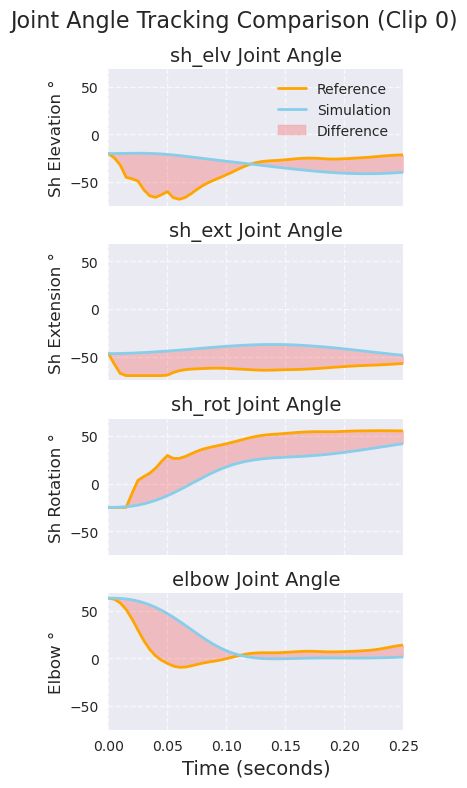

Figure saved to ./figures/fig2/fig2c_joint_angle_tracking_clip0.pdf


In [25]:
# %%time
# ─────────────────────────  IMPORTS  ─────────────────────────────────────────
import os, h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ─────────────────────────  USER SETTINGS  ──────────────────────────────────
H5_PATH     = "/root/vast/eric/track-mjx/results/neurIPS-paramsweep/big_sweep_ctrl_ctrldiff_energy/mouse_muscle_arm_imitation_params_CTRLCOST_0.2_CTRLDIFF_0.02_ENERGY_0.3_250901_115902_891106.h5"
CLIP_ID     = 0  # global clip index to visualize
SAVE_PATH   = f"./figures/fig2/fig2c_joint_angle_tracking_clip{CLIP_ID}.pdf"

# Joint config (edit indices/names/labels to match your ordering)
JOINT_NAMES   = ["sh_elv", "sh_ext", "sh_rot", "elbow"]
JOINT_LABELS  = ["Sh Elevation", "Sh Extension", "Sh Rotation", "Elbow"]
JOINT_INDICES = [0, 1, 2, 3]

# Plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Visualization time window (in seconds)
MAX_TIME = 0.25  # Only show first 0.25 seconds of data


def plot_joint_angles_from_h5(
    rollout_h5: str,
    clip_id: int = 0,
    joint_indices=None,
    joint_names=None,
    joint_labels=None,
    save_path: str | None = None,
    sim_hz: int = 400,
    max_time: float = None,  # Maximum time to plot (in seconds)
):
    """Plot reference-vs-rollout joint angles for a given clip by
    loading both qpos and ref_qpos from the rollout H5 file.

    Args:
        rollout_h5 (str): Rollout H5 that has 'qpos' and 'ref_qpos'.
        clip_id (int): Global clip to visualize.
        joint_indices (list[int]): indices to plot.
        joint_names (list[str]): names for titles.
        joint_labels (list[str]): labels for y-axis.
        save_path (str|None): PDF/PNG path to save.
        sim_hz (int): sim sampling rate (default 400 Hz).
        max_time (float): Maximum time to plot in seconds.

    Returns:
        matplotlib.figure.Figure
    """
    # Set default values if not provided
    if joint_indices is None:
        joint_indices = [0, 1, 2, 3]
    if joint_names is None:
        joint_names = [f"Joint {i}" for i in joint_indices]
    if joint_labels is None:
        joint_labels = joint_names

    # 1) Load both sim qpos and ref qpos from rollout file
    with h5py.File(rollout_h5, "r") as h5:
        if "qpos" not in h5:
            raise ValueError(f"'qpos' not found in {rollout_h5}.")
        if "ref_qpos" not in h5:
            raise ValueError(f"'ref_qpos' not found in {rollout_h5}.")
        
        qpos_sim = h5["qpos"][...]  # (clips, T, nq)
        qpos_ref = h5["ref_qpos"][...]  # (clips, T, nq)
    
    if clip_id >= qpos_sim.shape[0]:
        raise IndexError(f"clip_id {clip_id} out of range (total={qpos_sim.shape[0]}).")
    
    sim_clip = qpos_sim[clip_id]  # (T, nq)
    ref_clip = qpos_ref[clip_id]  # (T, nq)
    sim_T, nq = sim_clip.shape

    # 2) Align DOFs if shapes differ between reference and simulation
    if ref_clip.shape[1] != nq:
        min_nq = min(nq, ref_clip.shape[1])
        ref_clip = ref_clip[:, :min_nq]
        sim_clip = sim_clip[:, :min_nq]
        nq = min_nq

    # 3) Ensure same time length
    min_T = min(sim_clip.shape[0], ref_clip.shape[0])
    sim_clip = sim_clip[:min_T]
    ref_clip = ref_clip[:min_T]

    # 4) Create time axis and filter data if max_time is specified
    time = np.arange(min_T) / float(sim_hz)
    
    if max_time is not None:
        # Find index corresponding to max_time
        time_idx = np.searchsorted(time, max_time, side='right')
        # Filter all data to this time window
        time = time[:time_idx]
        sim_clip = sim_clip[:time_idx]
        ref_clip = ref_clip[:time_idx]
    
    # 5) Calculate y-limits (global across all requested joints)
    all_vals = []
    for j in joint_indices:
        all_vals.extend(np.degrees(sim_clip[:, j][np.isfinite(sim_clip[:, j])]))
        all_vals.extend(np.degrees(ref_clip[:, j][np.isfinite(ref_clip[:, j])]))
    if not all_vals:
        raise ValueError("No finite joint angle data to plot.")
    y_min = np.min(all_vals) - 5
    y_max = np.max(all_vals) + 5

    # 6) Create figure with subplots (one per joint)
    fig, axes = plt.subplots(len(joint_indices), 1, figsize=(4, 8), sharex=True)
    axes = np.atleast_1d(axes)

    # 7) Plot each joint's angle over time
    for i, (j, name, label) in enumerate(zip(joint_indices, joint_names, joint_labels)):
        # Convert radians to degrees for plotting
        ref_deg = np.degrees(ref_clip[:, j])
        sim_deg = np.degrees(sim_clip[:, j])
        
        # Create masks for valid data points
        ref_mask = np.isfinite(ref_deg)
        sim_mask = np.isfinite(sim_deg)
        both = ref_mask & sim_mask

        # Plot reference trajectory
        axes[i].plot(time[ref_mask], ref_deg[ref_mask], 
                    color="orange", label="Reference", linewidth=2)
        
        # Plot simulation trajectory
        axes[i].plot(time[sim_mask], sim_deg[sim_mask], 
                    color="skyblue", label="Simulation", linewidth=2)
        
        # Highlight the difference between reference and simulation
        if np.any(both):
            axes[i].fill_between(time[both], ref_deg[both], sim_deg[both],
                                alpha=0.2, color="red", label="Difference")

        # Configure subplot appearance
        axes[i].set_ylabel(f"{label} °", fontsize=12)
        axes[i].set_ylim(y_min, y_max)
        axes[i].set_title(f"{name} Joint Angle", fontsize=14)
        axes[i].grid(True, linestyle='--', alpha=0.7)
        
        # Set x-limit to our specified max time or the available data
        if max_time is not None:
            axes[i].set_xlim(0, max_time)
        else:
            axes[i].set_xlim(0, time[-1])

        # Only add legend to the first subplot
        if i == 0:
            axes[i].legend(loc='upper right')

    # 8) Add x-axis label to the bottom subplot
    axes[-1].set_xlabel("Time (seconds)", fontsize=14)

    plt.suptitle(f"Joint Angle Tracking Comparison (Clip {clip_id})", fontsize=16)
    plt.tight_layout()

    # Save figure if path provided
    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, bbox_inches="tight", dpi=600)

    return fig

# ─────────────────────────  RUN  ────────────────────────────────────────────
# Run the plotting function with our configured parameters
fig = plot_joint_angles_from_h5(
    rollout_h5=H5_PATH,
    clip_id=CLIP_ID,
    joint_indices=JOINT_INDICES,
    joint_names=JOINT_NAMES,
    joint_labels=JOINT_LABELS,
    save_path=SAVE_PATH,
    sim_hz=200,      # Simulation runs at 400 Hz
    max_time=MAX_TIME,  # Only plot first 0.25 seconds
)
plt.show()
print(f"Figure saved to {SAVE_PATH}")

Total clips in dataset: 46
Generating 46 plots...
Processing clip 1/46...
  → Saved: ./figures/fig2/fig2c_joint_angle_tracking_clip00.pdf
Processing clip 2/46...
  → Saved: ./figures/fig2/fig2c_joint_angle_tracking_clip01.pdf
Processing clip 3/46...
  → Saved: ./figures/fig2/fig2c_joint_angle_tracking_clip02.pdf
Processing clip 4/46...
  → Saved: ./figures/fig2/fig2c_joint_angle_tracking_clip03.pdf
Processing clip 5/46...
  → Saved: ./figures/fig2/fig2c_joint_angle_tracking_clip04.pdf
Processing clip 6/46...
  → Saved: ./figures/fig2/fig2c_joint_angle_tracking_clip05.pdf
Processing clip 7/46...
  → Saved: ./figures/fig2/fig2c_joint_angle_tracking_clip06.pdf
Processing clip 8/46...
  → Saved: ./figures/fig2/fig2c_joint_angle_tracking_clip07.pdf
Processing clip 9/46...


KeyboardInterrupt: 

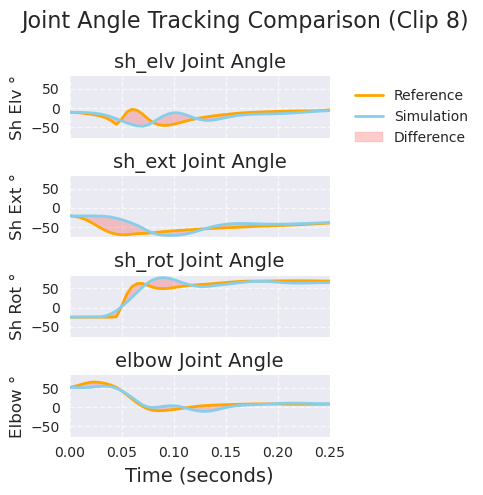

In [27]:
# %%time
# ─────────────────────────  IMPORTS  ─────────────────────────────────────────
import os, h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ─────────────────────────  USER SETTINGS  ──────────────────────────────────
H5_PATH     = "rollouts_full_mouse_arm_new_250831_001916_126200.h5"
SAVE_DIR    = "./figures/fig2/"  # Directory to save all plots

# Joint config (edit indices/names/labels to match your ordering)
JOINT_NAMES   = ["sh_elv", "sh_ext", "sh_rot", "elbow"]
JOINT_LABELS  = ["Sh Elv", "Sh Ext", "Sh Rot", "Elbow"]
JOINT_INDICES = [0, 1, 2, 3]

# Plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Visualization time window (in seconds)
MAX_TIME = 0.25  # Only show first 0.25 seconds of data


def plot_joint_angles_from_h5(
    rollout_h5: str,
    clip_id: int = 0,
    joint_indices=None,
    joint_names=None,
    joint_labels=None,
    save_path: str | None = None,
    sim_hz: int = 400,
    max_time: float = None,  # Maximum time to plot (in seconds)
):
    """Plot reference-vs-rollout joint angles for a given clip by
    loading both qpos and ref_qpos from the rollout H5 file.

    Args:
        rollout_h5 (str): Rollout H5 that has 'qpos' and 'ref_qpos'.
        clip_id (int): Global clip to visualize.
        joint_indices (list[int]): indices to plot.
        joint_names (list[str]): names for titles.
        joint_labels (list[str]): labels for y-axis.
        save_path (str|None): PDF/PNG path to save.
        sim_hz (int): sim sampling rate (default 400 Hz).
        max_time (float): Maximum time to plot in seconds.

    Returns:
        matplotlib.figure.Figure
    """
    # Set default values if not provided
    if joint_indices is None:
        joint_indices = [0, 1, 2, 3]
    if joint_names is None:
        joint_names = [f"Joint {i}" for i in joint_indices]
    if joint_labels is None:
        joint_labels = joint_names

    # 1) Load both sim qpos and ref qpos from rollout file
    with h5py.File(rollout_h5, "r") as h5:
        if "qpos" not in h5:
            raise ValueError(f"'qpos' not found in {rollout_h5}.")
        if "ref_qpos" not in h5:
            raise ValueError(f"'ref_qpos' not found in {rollout_h5}.")
        
        qpos_sim = h5["qpos"][...]  # (clips, T, nq)
        qpos_ref = h5["ref_qpos"][...]  # (clips, T, nq)
    
    if clip_id >= qpos_sim.shape[0]:
        raise IndexError(f"clip_id {clip_id} out of range (total={qpos_sim.shape[0]}).")
    
    sim_clip = qpos_sim[clip_id]  # (T, nq)
    ref_clip = qpos_ref[clip_id]  # (T, nq)
    sim_T, nq = sim_clip.shape

    # 2) Align DOFs if shapes differ between reference and simulation
    if ref_clip.shape[1] != nq:
        min_nq = min(nq, ref_clip.shape[1])
        ref_clip = ref_clip[:, :min_nq]
        sim_clip = sim_clip[:, :min_nq]
        nq = min_nq

    # 3) Ensure same time length
    min_T = min(sim_clip.shape[0], ref_clip.shape[0])
    sim_clip = sim_clip[:min_T]
    ref_clip = ref_clip[:min_T]

    # 4) Create time axis and filter data if max_time is specified
    time = np.arange(min_T) / float(sim_hz)
    
    if max_time is not None:
        # Find index corresponding to max_time
        time_idx = np.searchsorted(time, max_time, side='right')
        # Filter all data to this time window
        time = time[:time_idx]
        sim_clip = sim_clip[:time_idx]
        ref_clip = ref_clip[:time_idx]
    
    # 5) Calculate y-limits (global across all requested joints)
    all_vals = []
    for j in joint_indices:
        all_vals.extend(np.degrees(sim_clip[:, j][np.isfinite(sim_clip[:, j])]))
        all_vals.extend(np.degrees(ref_clip[:, j][np.isfinite(ref_clip[:, j])]))
    if not all_vals:
        raise ValueError("No finite joint angle data to plot.")
    y_min = np.min(all_vals) - 5
    y_max = np.max(all_vals) + 5

    # 6) Create figure with subplots (one per joint)
    fig, axes = plt.subplots(len(joint_indices), 1, figsize=(5, 5), sharex=True)
    axes = np.atleast_1d(axes)

    # 7) Plot each joint's angle over time
    for i, (j, name, label) in enumerate(zip(joint_indices, joint_names, joint_labels)):
        # Convert radians to degrees for plotting
        ref_deg = np.degrees(ref_clip[:, j])
        sim_deg = np.degrees(sim_clip[:, j])
        
        # Create masks for valid data points
        ref_mask = np.isfinite(ref_deg)
        sim_mask = np.isfinite(sim_deg)
        both = ref_mask & sim_mask

        # Plot reference trajectory
        axes[i].plot(time[ref_mask], ref_deg[ref_mask], 
                    color="orange", label="Reference", linewidth=2)
        
        # Plot simulation trajectory
        axes[i].plot(time[sim_mask], sim_deg[sim_mask], 
                    color="skyblue", label="Simulation", linewidth=2)
        
        # Highlight the difference between reference and simulation
        if np.any(both):
            axes[i].fill_between(time[both], ref_deg[both], sim_deg[both],
                                alpha=0.2, color="red", label="Difference")

        # Configure subplot appearance
        axes[i].set_ylabel(f"{label} °", fontsize=12)
        axes[i].set_ylim(y_min, y_max)
        axes[i].set_title(f"{name} Joint Angle", fontsize=14)
        axes[i].grid(True, linestyle='--', alpha=0.7)
        
        # Set x-limit to our specified max time or the available data
        if max_time is not None:
            axes[i].set_xlim(0, max_time)
        else:
            axes[i].set_xlim(0, time[-1])

        # Only add legend to the first subplot - positioned outside plot area
        if i == 0:
            axes[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # 8) Add x-axis label to the bottom subplot
    axes[-1].set_xlabel("Time (seconds)", fontsize=14)

    plt.suptitle(f"Joint Angle Tracking Comparison (Clip {clip_id})", fontsize=16)
    plt.tight_layout()

    # Save figure if path provided
    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, bbox_inches="tight", dpi=600)

    return fig


# ─────────────────────────  RUN FOR ALL 46 CLIPS  ──────────────────────────
# First, check how many clips we have in the H5 file
with h5py.File(H5_PATH, "r") as h5:
    total_clips = h5["qpos"].shape[0]
    print(f"Total clips in dataset: {total_clips}")

# Create save directory
os.makedirs(SAVE_DIR, exist_ok=True)

# Generate plots for all clips (or first 46 if there are more)
num_clips_to_plot = min(46, total_clips)
print(f"Generating {num_clips_to_plot} plots...")

for clip_id in range(num_clips_to_plot):
    print(f"Processing clip {clip_id + 1}/{num_clips_to_plot}...")
    
    # Define save path for this clip
    save_path = os.path.join(SAVE_DIR, f"fig2c_joint_angle_tracking_clip{clip_id:02d}.pdf")
    
    try:
        # Generate the plot
        fig = plot_joint_angles_from_h5(
            rollout_h5=H5_PATH,
            clip_id=clip_id,
            joint_indices=JOINT_INDICES,
            joint_names=JOINT_NAMES,
            joint_labels=JOINT_LABELS,
            save_path=save_path,
            sim_hz=200,      # Simulation runs at 200 Hz based on your code
            max_time=MAX_TIME,  # Only plot first 0.25 seconds
        )
        
        # Close the figure to save memory
        plt.close(fig)
        
        print(f"  → Saved: {save_path}")
        
    except Exception as e:
        print(f"  → Error processing clip {clip_id}: {e}")
        continue

print(f"\nAll plots saved to directory: {SAVE_DIR}")
print("Done!")

/tmp/ipykernel_772599/2947950808.py:21: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


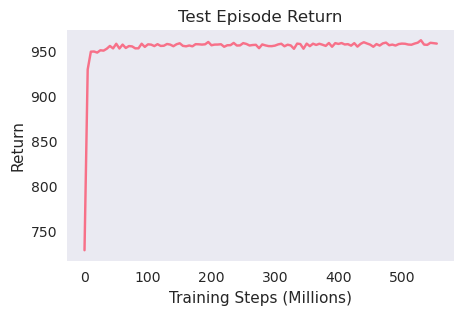

In [16]:
# plot reward from csv
import csv

CSV = "reward.csv"

# load csv
with open(CSV, newline='') as csvfile:
    reader = csv.DictReader(csvfile)
    rewards = [float(row['reward']) for row in reader]

# create x-axis values representing training steps in millions
evaluation_steps = list(range(len(rewards)))
training_steps_millions = [step * 5 for step in evaluation_steps]

# plot rewards
plt.figure(figsize=(5, 3))
plt.plot(training_steps_millions, rewards)
plt.xlabel('Training Steps (Millions)')
plt.ylabel('Return')
plt.title('Test Episode Return')
plt.legend()
plt.grid()
plt.savefig("reward.pdf", bbox_inches='tight', dpi=600)
plt.show()


qpos_sim shape: (46, 100, 4), qpos_ref shape: (46, 100, 4)
Shape of available keys in H5 file:
 - actions: <HDF5 dataset "actions": shape (46, 100, 9), type "<f4">
 - decoder_activations: <HDF5 group "/decoder_activations" (3 members)>
 - encoder_activations: <HDF5 group "/encoder_activations" (5 members)>
 - intentions: <HDF5 dataset "intentions": shape (46, 100, 9), type "<f4">
 - qpos: <HDF5 dataset "qpos": shape (46, 100, 4), type "<f4">
 - ref_qpos: <HDF5 dataset "ref_qpos": shape (46, 100, 4), type "<f4">
 - rewards: <HDF5 dataset "rewards": shape (46, 100), type "<f4">


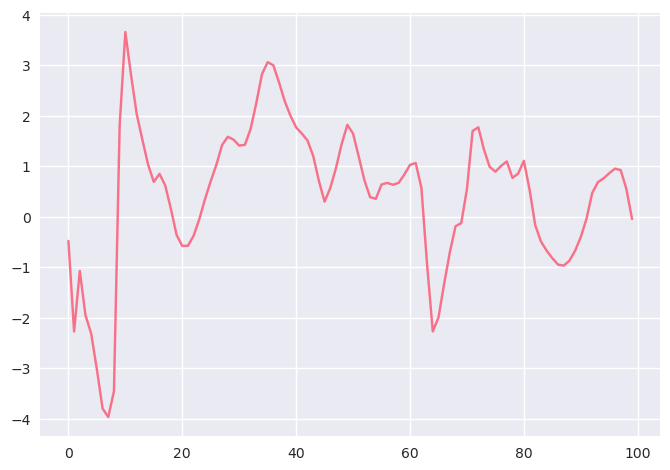

In [42]:
rollout_h5 = "rollouts_full_mouse_arm_new.h5"

with h5py.File(rollout_h5, "r") as h5:
        if "qpos" not in h5:
            raise ValueError(f"'qpos' not found in {rollout_h5}.")
        if "ref_qpos" not in h5:
            raise ValueError(f"'ref_qpos' not found in {rollout_h5}.")
        
        qpos_sim = h5["qpos"][...]  # (clips, T, nq)
        qpos_ref = h5["ref_qpos"][...]  # (clips, T, nq)
        print(f"qpos_sim shape: {qpos_sim.shape}, qpos_ref shape: {qpos_ref.shape}")
        print("Shape of available keys in H5 file:")
        for key in h5.keys():
            print(f" - {key}: {h5[key]}")

        plt.plot(h5["intentions"][0,:,0])

qpos_sim shape: (46, 100, 4), qpos_ref shape: (46, 100, 4)
Available keys in HDF5 file:
['actions', 'decoder_activations', 'encoder_activations', 'intentions', 'qpos', 'ref_qpos', 'rewards']

Reward-related keys found: ['rewards']
rewards shape: (46, 100)
Number of rollouts: 46
Plotting reward: rewards
Reward shape: (46, 100)


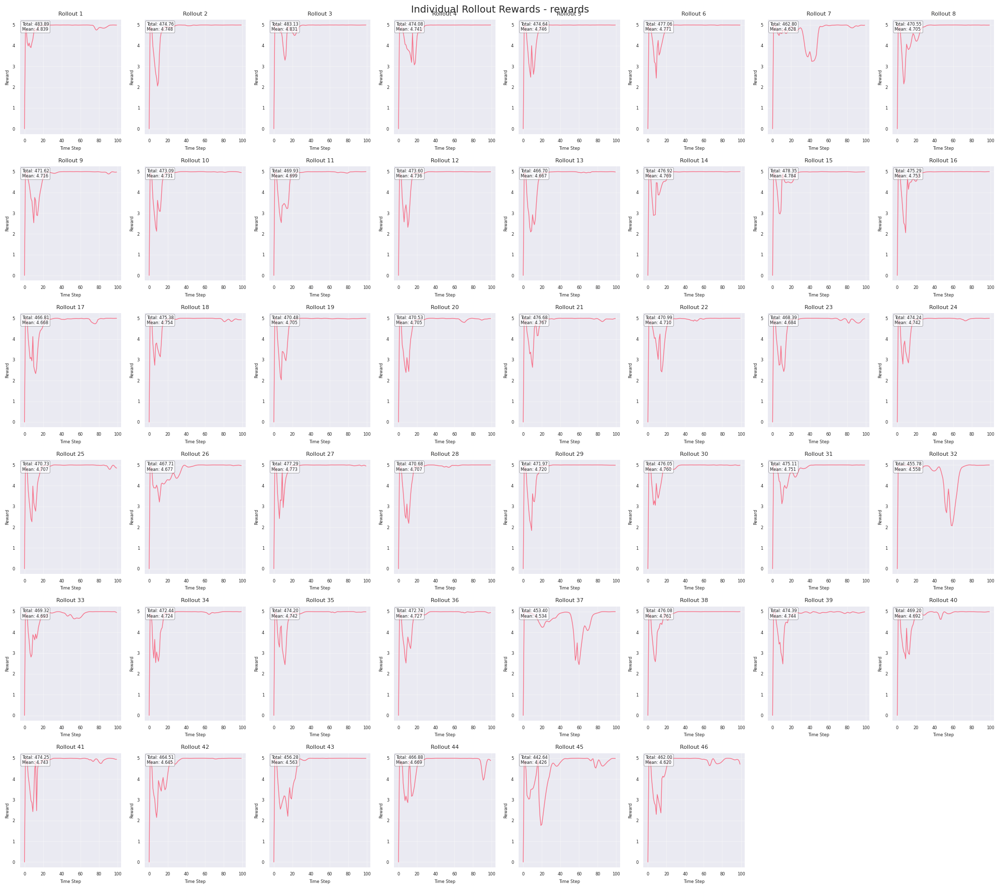


Summary Statistics for 46 Rollouts:
------------------------------------------------------------

rewards:
  Total reward per rollout - Mean: 470.7297, Std: 7.4343
  Min total reward: 442.6357 (Rollout 45)
  Max total reward: 483.8919 (Rollout 1)


In [33]:
import h5py
import matplotlib.pyplot as plt
import numpy as np

rollout_h5 = "rollouts_full_mouse_arm_new.h5"

with h5py.File(rollout_h5, "r") as h5:
    if "qpos" not in h5:
        raise ValueError(f"'qpos' not found in {rollout_h5}.")
    if "ref_qpos" not in h5:
        raise ValueError(f"'ref_qpos' not found in {rollout_h5}.")
    
    qpos_sim = h5["qpos"][...]  # (clips, T, nq)
    qpos_ref = h5["ref_qpos"][...]  # (clips, T, nq)
    print(f"qpos_sim shape: {qpos_sim.shape}, qpos_ref shape: {qpos_ref.shape}")
    
    print("Available keys in HDF5 file:")
    print(list(h5.keys()))
    
    # Look for reward-related keys
    reward_keys = [key for key in h5.keys() if 'reward' in key.lower()]
    print(f"\nReward-related keys found: {reward_keys}")
    
    # Load all reward data
    reward_data = {}
    for key in reward_keys:
        reward_data[key] = h5[key][...]
        print(f"{key} shape: {reward_data[key].shape}")

# Create 46 subplots for individual rollouts
if reward_data:
    # Assuming we have 46 rollouts
    n_rollouts = qpos_sim.shape[0]  # Number of clips/rollouts
    print(f"Number of rollouts: {n_rollouts}")
    
    # Calculate subplot layout for 46 subplots
    n_cols = 8  # You can adjust this
    n_rows = int(np.ceil(n_rollouts / n_cols))
    
    # Create a large figure to accommodate all subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 3*n_rows))
    
    # Flatten axes for easier iteration
    axes_flat = axes.flatten()
    
    # Choose which reward to plot (use the first reward key found, or specify one)
    if len(reward_keys) > 0:
        primary_reward_key = reward_keys[0]  # or specify which reward you want
        reward_values = reward_data[primary_reward_key]
        
        print(f"Plotting reward: {primary_reward_key}")
        print(f"Reward shape: {reward_values.shape}")
        
        # Plot each rollout
        for rollout_idx in range(n_rollouts):
            ax = axes_flat[rollout_idx]
            
            if len(reward_values.shape) == 2:
                # Shape: (clips, T)
                rollout_reward = reward_values[rollout_idx, :]
                time_steps = np.arange(len(rollout_reward))
                
                ax.plot(time_steps, rollout_reward, linewidth=1)
                ax.set_title(f'Rollout {rollout_idx+1}', fontsize=8)
                ax.set_xlabel('Time Step', fontsize=6)
                ax.set_ylabel('Reward', fontsize=6)
                ax.tick_params(labelsize=6)
                ax.grid(True, alpha=0.3)
                
                # Add some statistics as text
                total_reward = np.sum(rollout_reward)
                mean_reward = np.mean(rollout_reward)
                ax.text(0.02, 0.98, f'Total: {total_reward:.2f}\nMean: {mean_reward:.3f}', 
                       transform=ax.transAxes, fontsize=6, verticalalignment='top',
                       bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))
                
            elif len(reward_values.shape) == 3:
                # Shape: (clips, T, components)
                rollout_reward = reward_values[rollout_idx, :, :]
                
                if rollout_reward.shape[1] <= 5:  # Plot components separately if few
                    time_steps = np.arange(rollout_reward.shape[0])
                    for comp in range(rollout_reward.shape[1]):
                        ax.plot(time_steps, rollout_reward[:, comp], 
                               label=f'C{comp}', linewidth=1, alpha=0.7)
                    ax.legend(fontsize=5)
                else:  # Sum all components
                    total_reward_per_step = np.sum(rollout_reward, axis=1)
                    time_steps = np.arange(len(total_reward_per_step))
                    ax.plot(time_steps, total_reward_per_step, linewidth=1)
                
                ax.set_title(f'Rollout {rollout_idx+1}', fontsize=8)
                ax.set_xlabel('Time Step', fontsize=6)
                ax.set_ylabel('Reward', fontsize=6)
                ax.tick_params(labelsize=6)
                ax.grid(True, alpha=0.3)
        
        # Hide unused subplots
        for idx in range(n_rollouts, len(axes_flat)):
            axes_flat[idx].set_visible(False)
        
        plt.suptitle(f'Individual Rollout Rewards - {primary_reward_key}', fontsize=14)
        plt.tight_layout()
        plt.show()
        
        # If you want to plot multiple reward types, create separate figures
        if len(reward_keys) > 1:
            for reward_key in reward_keys[1:]:  # Skip the first one we already plotted
                fig2, axes2 = plt.subplots(n_rows, n_cols, figsize=(20, 3*n_rows))
                axes2_flat = axes2.flatten()
                
                reward_values_2 = reward_data[reward_key]
                
                for rollout_idx in range(n_rollouts):
                    ax = axes2_flat[rollout_idx]
                    
                    if len(reward_values_2.shape) == 2:
                        rollout_reward = reward_values_2[rollout_idx, :]
                        time_steps = np.arange(len(rollout_reward))
                        ax.plot(time_steps, rollout_reward, linewidth=1)
                        
                        total_reward = np.sum(rollout_reward)
                        mean_reward = np.mean(rollout_reward)
                        ax.text(0.02, 0.98, f'Total: {total_reward:.2f}\nMean: {mean_reward:.3f}', 
                               transform=ax.transAxes, fontsize=6, verticalalignment='top',
                               bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))
                    
                    elif len(reward_values_2.shape) == 3:
                        rollout_reward = reward_values_2[rollout_idx, :, :]
                        if rollout_reward.shape[1] <= 5:
                            time_steps = np.arange(rollout_reward.shape[0])
                            for comp in range(rollout_reward.shape[1]):
                                ax.plot(time_steps, rollout_reward[:, comp], 
                                       label=f'C{comp}', linewidth=1, alpha=0.7)
                            ax.legend(fontsize=5)
                        else:
                            total_reward_per_step = np.sum(rollout_reward, axis=1)
                            time_steps = np.arange(len(total_reward_per_step))
                            ax.plot(time_steps, total_reward_per_step, linewidth=1)
                    
                    ax.set_title(f'Rollout {rollout_idx+1}', fontsize=8)
                    ax.set_xlabel('Time Step', fontsize=6)
                    ax.set_ylabel('Reward', fontsize=6)
                    ax.tick_params(labelsize=6)
                    ax.grid(True, alpha=0.3)
                
                # Hide unused subplots
                for idx in range(n_rollouts, len(axes2_flat)):
                    axes2_flat[idx].set_visible(False)
                
                plt.suptitle(f'Individual Rollout Rewards - {reward_key}', fontsize=14)
                plt.tight_layout()
                plt.show()
    
    # Print summary statistics for all rollouts
    print(f"\nSummary Statistics for {n_rollouts} Rollouts:")
    print("-" * 60)
    for reward_name, reward_values in reward_data.items():
        if len(reward_values.shape) == 2:
            total_rewards = np.sum(reward_values, axis=1)  # Sum over time for each rollout
            mean_per_step = np.mean(reward_values, axis=1)  # Mean over time for each rollout
            
            print(f"\n{reward_name}:")
            print(f"  Total reward per rollout - Mean: {np.mean(total_rewards):.4f}, Std: {np.std(total_rewards):.4f}")
            print(f"  Min total reward: {np.min(total_rewards):.4f} (Rollout {np.argmin(total_rewards)+1})")
            print(f"  Max total reward: {np.max(total_rewards):.4f} (Rollout {np.argmax(total_rewards)+1})")
            
        elif len(reward_values.shape) == 3:
            total_rewards = np.sum(reward_values, axis=(1,2))  # Sum over time and components
            
            print(f"\n{reward_name}:")
            print(f"  Total reward per rollout - Mean: {np.mean(total_rewards):.4f}, Std: {np.std(total_rewards):.4f}")
            print(f"  Min total reward: {np.min(total_rewards):.4f} (Rollout {np.argmin(total_rewards)+1})")
            print(f"  Max total reward: {np.max(total_rewards):.4f} (Rollout {np.argmax(total_rewards)+1})")

else:
    print("No reward data found in the HDF5 file!")
    print("Available keys:", list(h5.keys()))

Computing joint angle errors vs experimental data...
Loaded simulation data: 46 clips, 100 timesteps, 4 joints
Found 46 valid trials in experimental data
Note: Experimental joint angle loading not implemented - using simulation ref data
Using reference qpos as experimental data proxy

Processing sh_elv...
  Mean error: 6.036° ± 2.381°
  Median error: 5.252°
  Min/Max error: 2.944° / 17.146°
  ✓ Processed 46 clips

Processing sh_ext...
  Mean error: 6.555° ± 1.290°
  Median error: 6.521°
  Min/Max error: 3.291° / 9.798°
  ✓ Processed 46 clips

Processing sh_rot...
  Mean error: 5.868° ± 1.624°
  Median error: 5.575°
  Min/Max error: 1.656° / 10.507°
  ✓ Processed 46 clips

Processing elbow...
  Mean error: 5.440° ± 1.502°
  Median error: 5.593°
  Min/Max error: 1.233° / 9.711°
  ✓ Processed 46 clips


/tmp/ipykernel_779588/3601667928.py:189: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box_plot = sns.boxplot(data=df_errors, x='Joint', y='Error',
/tmp/ipykernel_779588/3601667928.py:198: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(joint_labels, rotation=45, ha='right')



Figure saved to ./figures/fig2/joint_angle_error_distribution.pdf


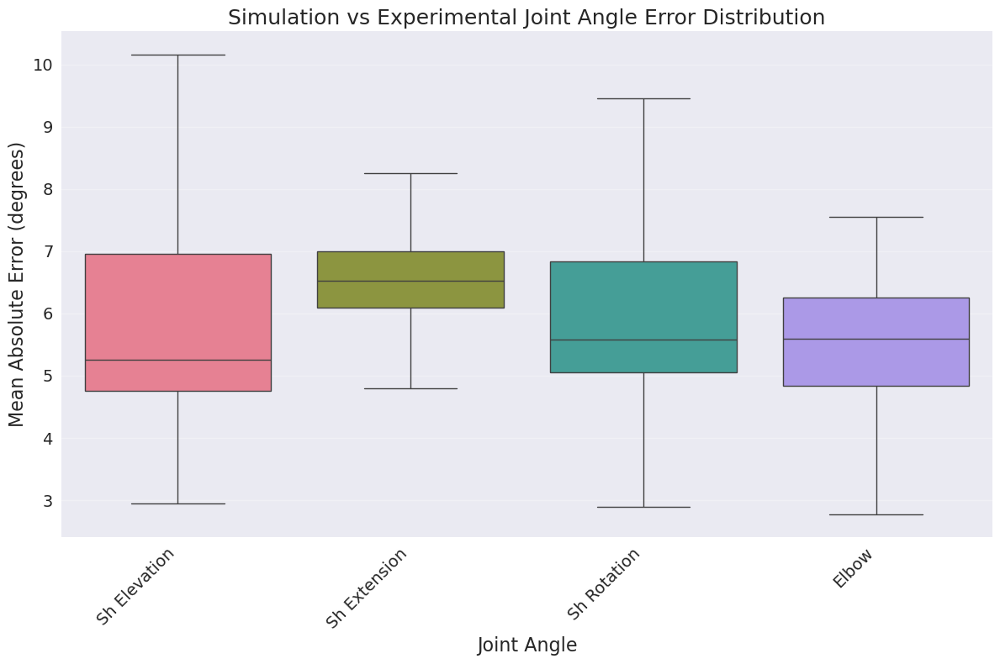


JOINT ANGLE ERROR ANALYSIS SUMMARY:
Mean Absolute Error (MAE) between Simulated and Experimental joint angles
Statistics across 46 clips per joint
--------------------------------------------------------------------------------
Joint                Mean     Median   Std      Q1       Q3       Min      Max     
--------------------------------------------------------------------------------
Sh Elevation         6.036    5.252    2.381    4.762    6.958    2.944    17.146  
Sh Extension         6.555    6.521    1.290    6.087    6.994    3.291    9.798   
Sh Rotation          5.868    5.575    1.624    5.056    6.842    1.656    10.507  
Elbow                5.440    5.593    1.502    4.836    6.249    1.233    9.711   

BOX PLOT EXPLANATION:
📦 BOX COMPONENTS:
   • Box bottom edge (Q1): 25th percentile - 25% of errors are below this value
   • Box top edge (Q3): 75th percentile - 75% of errors are below this value
   • Box height (IQR): Interquartile Range (Q3-Q1) - contains middle 50%

In [1]:
# %%time
# ─────────────────────────  IMPORTS  ─────────────────────────────────────────
import os, h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import pandas as pd

# ─────────────────────────  USER SETTINGS  ──────────────────────────────────
H5_PATH     = "rollouts_full_mouse_arm_new.h5"
SAVE_PATH   = "./figures/fig2/joint_angle_error_distribution.pdf"
EXP_JOINT_FILE = "/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv"

# Joint config (edit indices/names/labels to match your ordering)
JOINT_NAMES   = ["sh_elv", "sh_ext", "sh_rot", "elbow"]
JOINT_LABELS  = ["Sh Elevation", "Sh Extension", "Sh Rotation", "Elbow"]
JOINT_INDICES = [0, 1, 2, 3]

# Plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Analysis settings
MAX_TIME = 0.25  # Only analyze first 0.25 seconds of data
SIM_HZ = 200     # Simulation frequency

def load_experimental_joint_angles():
    """Load and process experimental joint angle data"""
    # Load trial information
    df = pd.read_csv(EXP_JOINT_FILE)
    
    # Create trial mask for valid trials
    trial_mask = (
        (df['start'].notna()) & 
        (df['end'].notna()) & 
        (df['start'] > 0) & 
        (df['end'] > 0) &
        (df['start'] != df['end'])
    )
    
    valid_trials_df = df[trial_mask].copy()
    print(f"Found {len(valid_trials_df)} valid trials in experimental data")
    
    # For now, return None - you'll need to implement actual joint angle loading
    # based on your experimental data format
    print("Note: Experimental joint angle loading not implemented - using simulation ref data")
    return None

def compute_joint_angle_errors_vs_experimental(
    rollout_h5: str,
    joint_indices=None,
    joint_names=None,
    sim_hz: int = 200,
    max_time: float = None,
):
    """Compute joint angle errors between simulation and experimental data.
    
    Args:
        rollout_h5 (str): Path to rollout H5 file
        joint_indices (list[int]): Joint indices to analyze
        joint_names (list[str]): Joint names
        sim_hz (int): Simulation frequency
        max_time (float): Maximum time to analyze (seconds)
    
    Returns:
        dict: Dictionary containing error statistics per joint
        pd.DataFrame: DataFrame for box plot visualization
    """
    # Set defaults
    if joint_indices is None:
        joint_indices = [0, 1, 2, 3]
    if joint_names is None:
        joint_names = [f"Joint {i}" for i in joint_indices]
    
    # Load simulation data
    with h5py.File(rollout_h5, "r") as h5:
        if "qpos" not in h5:
            raise ValueError(f"'qpos' not found in {rollout_h5}.")
        if "ref_qpos" not in h5:
            raise ValueError(f"'ref_qpos' not found in {rollout_h5}.")
        
        qpos_sim = h5["qpos"][...]  # (clips, T, nq)
        qpos_ref = h5["ref_qpos"][...]  # (clips, T, nq) - using as experimental proxy
    
    n_clips, sim_T, nq = qpos_sim.shape
    print(f"Loaded simulation data: {n_clips} clips, {sim_T} timesteps, {nq} joints")
    
    # Try to load experimental data, fall back to reference data
    exp_joint_angles = load_experimental_joint_angles()
    if exp_joint_angles is None:
        print("Using reference qpos as experimental data proxy")
        exp_joint_angles = qpos_ref
    
    # Align shapes if needed
    if exp_joint_angles.shape[2] != nq:
        min_nq = min(nq, exp_joint_angles.shape[2])
        exp_joint_angles = exp_joint_angles[:, :, :min_nq]
        qpos_sim = qpos_sim[:, :, :min_nq]
        nq = min_nq
    
    # Align time dimension
    min_T = min(qpos_sim.shape[1], exp_joint_angles.shape[1])
    qpos_sim = qpos_sim[:, :min_T, :]
    exp_joint_angles = exp_joint_angles[:, :min_T, :]
    
    # Apply time filter if specified
    if max_time is not None:
        time_idx = min(int(max_time * sim_hz), min_T)
        qpos_sim = qpos_sim[:, :time_idx, :]
        exp_joint_angles = exp_joint_angles[:, :time_idx, :]
        min_T = time_idx
    
    # Compute errors for each joint
    joint_errors = {}
    all_errors_data = []
    
    for i, (joint_idx, joint_name) in enumerate(zip(joint_indices, joint_names)):
        if joint_idx >= nq:
            print(f"Warning: Joint index {joint_idx} out of range, skipping {joint_name}")
            continue
            
        print(f"\nProcessing {joint_name}...")
        
        # Extract joint angles for all clips
        sim_angles = qpos_sim[:, :, joint_idx]  # (n_clips, T)
        exp_angles = exp_joint_angles[:, :, joint_idx]  # (n_clips, T)
        
        # Calculate error for each clip
        clip_errors = []
        
        for clip_idx in range(n_clips):
            sim_trace = sim_angles[clip_idx, :]
            exp_trace = exp_angles[clip_idx, :]
            
            # Calculate mean absolute error for this clip in degrees
            clip_error_rad = np.mean(np.abs(sim_trace - exp_trace))
            clip_error_deg = np.degrees(clip_error_rad)
            clip_errors.append(clip_error_deg)
            
            # Add to data for box plot
            all_errors_data.append({
                'Joint': joint_name,
                'Error': clip_error_deg,
                'Clip': clip_idx
            })
        
        clip_errors = np.array(clip_errors)
        
        # Store statistics
        joint_errors[joint_name] = {
            'errors': clip_errors,
            'mean': np.mean(clip_errors),
            'std': np.std(clip_errors),
            'median': np.median(clip_errors),
            'q25': np.percentile(clip_errors, 25),
            'q75': np.percentile(clip_errors, 75),
            'q95': np.percentile(clip_errors, 95),
            'max': np.max(clip_errors),
            'min': np.min(clip_errors),
            'n_samples': len(clip_errors)
        }
        
        print(f"  Mean error: {joint_errors[joint_name]['mean']:.3f}° ± {joint_errors[joint_name]['std']:.3f}°")
        print(f"  Median error: {joint_errors[joint_name]['median']:.3f}°")
        print(f"  Min/Max error: {joint_errors[joint_name]['min']:.3f}° / {joint_errors[joint_name]['max']:.3f}°")
        print(f"  ✓ Processed {len(clip_errors)} clips")
    
    # Convert to DataFrame for plotting
    df_errors = pd.DataFrame(all_errors_data)
    
    return joint_errors, df_errors

def plot_simple_boxplot(df_errors, joint_labels=None, save_path=None):
    """Create a simple box and whisker plot for joint angle errors without outliers.
    
    Args:
        df_errors (pd.DataFrame): DataFrame with error data for plotting
        joint_labels (list[str]): Pretty labels for joints
        save_path (str): Path to save figure
    """
    if joint_labels is None:
        joint_labels = df_errors['Joint'].unique()
    
    # Create figure with single subplot
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    
    # Create box plot using seaborn WITHOUT outliers (showfliers=False)
    box_plot = sns.boxplot(data=df_errors, x='Joint', y='Error', 
                          palette='husl', ax=ax, showfliers=False)
    
    # Customize the plot
    ax.set_xlabel('Joint Angle', fontsize=16)
    ax.set_ylabel('Mean Absolute Error (degrees)', fontsize=16)
    ax.set_title('Simulation vs Experimental Joint Angle Error Distribution', fontsize=18)
    
    # Update x-axis labels to use pretty names
    ax.set_xticklabels(joint_labels, rotation=45, ha='right')
    
    # Increase tick label size
    ax.tick_params(axis='both', which='major', labelsize=14)
    
    # Add grid for better readability
    ax.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    
    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, bbox_inches="tight", dpi=300)
        print(f"\nFigure saved to {save_path}")
    
    return fig

# ─────────────────────────  RUN ANALYSIS  ──────────────────────────────────
print("Computing joint angle errors vs experimental data...")

# Compute errors between simulation and experimental/reference data
joint_errors, df_errors = compute_joint_angle_errors_vs_experimental(
    rollout_h5=H5_PATH,
    joint_indices=JOINT_INDICES,
    joint_names=JOINT_NAMES,
    sim_hz=SIM_HZ,
    max_time=MAX_TIME
)

# Create simple box plot visualization (no outliers)
fig = plot_simple_boxplot(
    df_errors=df_errors,
    joint_labels=JOINT_LABELS,
    save_path=SAVE_PATH
)

plt.show()

# Print summary statistics
print("\n" + "="*80)
print("JOINT ANGLE ERROR ANALYSIS SUMMARY:")
print("="*80)
print("Mean Absolute Error (MAE) between Simulated and Experimental joint angles")
print(f"Statistics across {len(df_errors['Clip'].unique())} clips per joint")
print("-"*80)
print(f"{'Joint':<20} {'Mean':<8} {'Median':<8} {'Std':<8} {'Q1':<8} {'Q3':<8} {'Min':<8} {'Max':<8}")
print("-"*80)

for joint_name, joint_label in zip(JOINT_NAMES, JOINT_LABELS):
    stats = joint_errors[joint_name]
    print(f"{joint_label:<20} {stats['mean']:<8.3f} {stats['median']:<8.3f} "
          f"{stats['std']:<8.3f} {stats['q25']:<8.3f} {stats['q75']:<8.3f} "
          f"{stats['min']:<8.3f} {stats['max']:<8.3f}")

print("="*80)

# Explanation of box plot components
print("\n" + "="*80)
print("BOX PLOT EXPLANATION:")
print("="*80)
print("📦 BOX COMPONENTS:")
print("   • Box bottom edge (Q1): 25th percentile - 25% of errors are below this value")
print("   • Box top edge (Q3): 75th percentile - 75% of errors are below this value") 
print("   • Box height (IQR): Interquartile Range (Q3-Q1) - contains middle 50% of data")
print("   • Line inside box: Median (50th percentile) - middle value when data is sorted")
print("")
print("📏 WHISKER COMPONENTS:")
print("   • Lower whisker: Extends to lowest value within 1.5×IQR below Q1")
print("   • Upper whisker: Extends to highest value within 1.5×IQR above Q3")
print("   • Whisker length shows the spread of the 'typical' data range")
print("")
print("📊 INTERPRETATION:")
print("   • Wider box = more variable errors in the middle 50% of trials")
print("   • Higher median line = generally larger errors for that joint")
print("   • Longer whiskers = more spread in the typical error range")
print("   • Symmetric box/whiskers = evenly distributed errors")
print("   • Note: Outliers are hidden in this plot (showfliers=False)")
print("="*80)

Simulated data: 46 clips, 199 timesteps at 400 Hz
Total trials in CSV: 77
Valid trials (non-zero start/end): 46
Expected to match simulation clips: 46

Processing Anterior Deltoid vs Sim Anterior Deltoid...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 199 samples
      Trial 3: 15000 → 199 samples
      Trial 8: 15000 → 199 samples
      Trial 9: 15000 → 199 samples
      Trial 12: 15000 → 199 samples
    Final EMG data shape: (46, 199)
    EMG normalization: 98th percentile = 0.009500
  Mean error: 0.1721 ± 0.0562
  Median error: 0.1597
  Min/Max error: 0.0844 / 0.3503
  ✓ Processed 46 clips

Processing Triceps vs Sim Triceps Lateral...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 199 samples
      Trial 3: 15000 → 199 samples
      Trial 8: 15000 → 199 samples
      Trial 9: 15000 → 199 samples
      Trial 12: 15000 → 199 samples
    Final EMG data shape: (46, 199)
    EMG normalization: 98th percentile = 0.017293
  Mean error: 0.1762 ± 0.0444
  Median error: 0.1695

/tmp/ipykernel_2791272/583051337.py:192: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box_plot = sns.boxplot(data=df_errors, x='Muscle', y='Error',
/tmp/ipykernel_2791272/583051337.py:192: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  box_plot = sns.boxplot(data=df_errors, x='Muscle', y='Error',


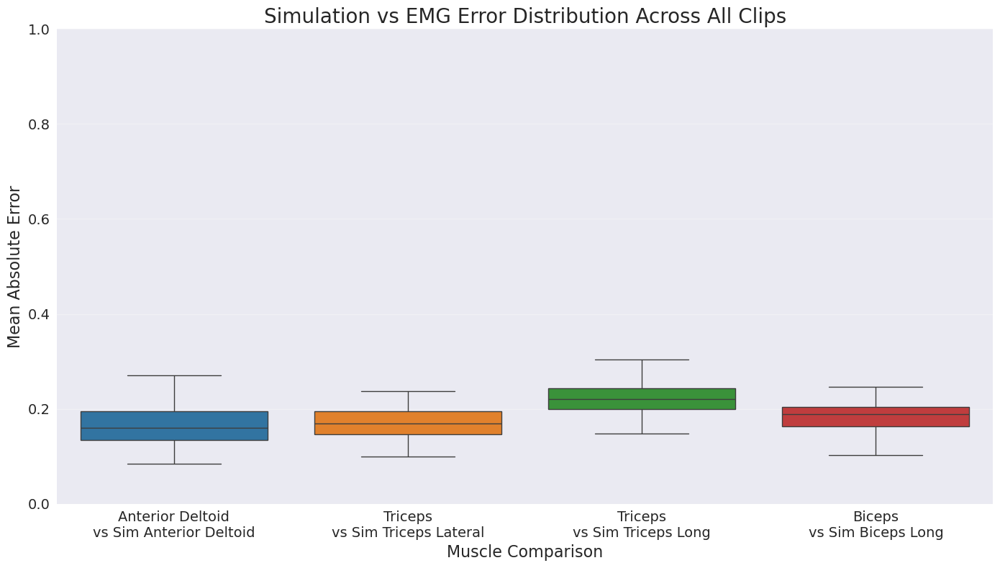


ERROR ANALYSIS SUMMARY (Box Plot Statistics):
Mean Absolute Error (MAE) between Simulated and EMG data
Statistics across 46 clips per muscle
--------------------------------------------------------------------------------

Anterior Deltoid vs Sim Anterior Deltoid:
  Mean:    0.1721
  Median:  0.1597
  Std:     0.0568
  Q1:      0.1350
  Q3:      0.1952
  Min:     0.0844
  Max:     0.3503

Triceps vs Sim Triceps Lateral     :
  Mean:    0.1762
  Median:  0.1695
  Std:     0.0449
  Q1:      0.1468
  Q3:      0.1942
  Min:     0.0995
  Max:     0.3147

Triceps vs Sim Triceps Long        :
  Mean:    0.2238
  Median:  0.2208
  Std:     0.0434
  Q1:      0.1989
  Q3:      0.2439
  Min:     0.1480
  Max:     0.3465

Biceps vs Sim Biceps Long          :
  Mean:    0.1872
  Median:  0.1890
  Std:     0.0416
  Q1:      0.1635
  Q3:      0.2045
  Min:     0.1024
  Max:     0.2985


In [28]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# --------------------------- SIMULATED DATA SETTINGS -----------------------------------
H5_PATH = "/root/vast/eric/track-mjx/results/neurIPS-paramsweep/big_sweep_ctrl_ctrldiff_energy/mouse_muscle_arm_imitation_params_CTRLCOST_0.2_CTRLDIFF_0.02_ENERGY_0.3_250901_115902_891106.h5" #"rollouts_full_mouse_arm_new_250828_204136_227034.h5"
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Muscle configurations: (sim_index, sim_name, emg_file, emg_name)
MUSCLE_CONFIGS = [
    (3, "Anterior Deltoid", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Anterior Deltoid"),
    (5, "Triceps Lateral", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (6, "Triceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    # (7, "Brachialis", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
    (8, "Biceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
]

# Load simulated muscle activation data
with h5py.File(H5_PATH, "r") as f:
    actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)

n_clips, T, _ = actions.shape
sim_time_s = np.linspace(0, 0.5, T)  # 0 → 0.5 s for 200 steps at 400 Hz

print(f"Simulated data: {n_clips} clips, {T} timesteps at 400 Hz")

# --------------------------- CREATE TRIAL MASK -----------------------------------
# Load the trial data (main CSV with reach indices)
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')

# Create trial mask: valid trials have non-zero, non-NaN start and end values
trial_mask = (
    (df['start'].notna()) & 
    (df['end'].notna()) & 
    (df['start'] > 0) & 
    (df['end'] > 0) &
    (df['start'] != df['end'])  # Make sure start != end
)

# Get the valid trials
valid_trials_df = df[trial_mask].copy()
valid_trial_indices = valid_trials_df.index.tolist()

print(f"Total trials in CSV: {len(df)}")
print(f"Valid trials (non-zero start/end): {len(valid_trials_df)}")
print(f"Expected to match simulation clips: {n_clips}")

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20  # High pass cutoff frequency in Hz
lowpass_cutoff = 1000  # Low pass cutoff frequency in Hz
envelope_cutoff = 50  # Envelope cutoff frequency in Hz
filter_order = 4  # Butterworth filter order

# Calculate downsampling parameters
target_fs = 400  # Target sampling rate to match simulation
downsample_factor = fs // target_fs  # 30000 // 400 = 75 samples per chunk
target_samples = 199  # Number of samples we want (to match simulation)

# Function to process EMG data and return individual trial data
def process_emg_data_individual_trials(emg_file_path):
    """Process EMG data and return individual trial envelopes for error calculation"""
    # Load EMG data
    emg_data = pd.read_csv(emg_file_path, header=None)
    print(f"    Loaded EMG data: {len(emg_data)} trials")
    
    # Process only valid trials using the trial mask
    reach_envelopes_downsampled = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        # idx is the original trial number from the CSV (the index from df)
        trial_num = idx
        
        # Convert reach start index from 200Hz frames to 30000Hz samples
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + 15000  # 0.5 seconds
        
        # Get EMG data for this specific trial (using original trial index)
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Downsample by averaging chunks
                    n_samples = len(reach_envelope)
                    n_chunks = n_samples // downsample_factor
                    
                    # Trim to exact multiple of downsample_factor
                    trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]
                    
                    # Reshape and average
                    reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
                    downsampled_envelope = np.mean(reshaped, axis=1)
                    
                    # Only keep if we have the target number of samples (200)
                    if len(downsampled_envelope) >= target_samples:
                        downsampled_envelope = downsampled_envelope[:target_samples]
                        reach_envelopes_downsampled.append(downsampled_envelope)
                        
                        if i < 5:  # Debug info for first few trials
                            print(f"      Trial {trial_num}: {n_samples} → {len(downsampled_envelope)} samples")
        else:
            print(f"      Trial {trial_num}: EMG data index out of range")
    
    if not reach_envelopes_downsampled:
        return None
    
    # Convert to numpy array
    envelopes_array = np.array(reach_envelopes_downsampled)
    print(f"    Final EMG data shape: {envelopes_array.shape}")
    
    # ROBUST EMG NORMALIZATION:
    # Normalize by the 98th percentile of all observed values
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    print(f"    EMG normalization: 98th percentile = {norm_value:.6f}")
    
    return normalized_envelopes

# --------------------------- PROCESS ALL MUSCLES AND CALCULATE ERRORS -----------------------------------
all_errors_data = []
muscle_names = []

for muscle_idx, sim_name, emg_file, emg_name in MUSCLE_CONFIGS:
    comparison_name = f"{emg_name}\nvs Sim {sim_name}"
    print(f"\nProcessing {comparison_name.replace(chr(10), ' ')}...")
    
    # Extract simulated data for all clips
    sim_traces = actions[:, :, muscle_idx]  # Shape: (46, 200)
    
    # Process EMG data for all clips
    emg_traces = process_emg_data_individual_trials(emg_file)
    
    if emg_traces is not None and len(emg_traces) == n_clips:
        # Calculate error for each clip (mean absolute difference across time)
        clip_errors = []
        
        for clip_idx in range(n_clips):
            sim_trace = sim_traces[clip_idx, :]
            emg_trace = emg_traces[clip_idx, :]
            
            # Calculate mean absolute error for this clip
            clip_error = np.mean(np.abs(sim_trace - emg_trace))
            clip_errors.append(clip_error)
            
            # Add to data for box plot
            all_errors_data.append({
                'Muscle': comparison_name,
                'Error': clip_error,
                'Clip': clip_idx
            })
        
        clip_errors = np.array(clip_errors)
        muscle_names.append(comparison_name)
        
        print(f"  Mean error: {np.mean(clip_errors):.4f} ± {np.std(clip_errors):.4f}")
        print(f"  Median error: {np.median(clip_errors):.4f}")
        print(f"  Min/Max error: {np.min(clip_errors):.4f} / {np.max(clip_errors):.4f}")
        print(f"  ✓ Processed {len(clip_errors)} clips")
    else:
        print(f"  Error: Could not process EMG data or clip count mismatch")

# --------------------------- CREATE BOX AND WHISKER PLOT -----------------------------------
if all_errors_data:
    # Convert to DataFrame for easier plotting
    df_errors = pd.DataFrame(all_errors_data)
    
    # Create box and whisker plot
    fig, ax = plt.subplots(figsize=(14, 8))
    
    # Create box plot using seaborn for better styling
    box_plot = sns.boxplot(data=df_errors, x='Muscle', y='Error', 
                          palette=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd'],
                          ax=ax, showfliers=False)
    
    # Customize the plot
    ax.set_xlabel('Muscle Comparison', fontsize=16)
    ax.set_ylabel('Mean Absolute Error', fontsize=16)
    ax.set_title('Simulation vs EMG Error Distribution Across All Clips', fontsize=20)
    
    # Increase tick label size
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_ylim(0, 1.0)
    
    # Rotate x-axis labels if needed
    plt.xticks(rotation=0, ha='center')
    
    # Add grid for better readability
    ax.grid(True, alpha=0.3, axis='y')
    
    # Add individual data points (optional - shows all 46 points per muscle)
    # sns.stripplot(data=df_errors, x='Muscle', y='Error', 
    #               color='black', alpha=0.4, size=3, ax=ax)
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed summary statistics
    print("\n" + "="*80)
    print("ERROR ANALYSIS SUMMARY (Box Plot Statistics):")
    print("="*80)
    print("Mean Absolute Error (MAE) between Simulated and EMG data")
    print("Statistics across 46 clips per muscle")
    print("-"*80)
    
    for muscle in muscle_names:
        muscle_data = df_errors[df_errors['Muscle'] == muscle]['Error']
        print(f"\n{muscle.replace(chr(10), ' '):<35}:")
        print(f"  Mean:    {muscle_data.mean():.4f}")
        print(f"  Median:  {muscle_data.median():.4f}")
        print(f"  Std:     {muscle_data.std():.4f}")
        print(f"  Q1:      {muscle_data.quantile(0.25):.4f}")
        print(f"  Q3:      {muscle_data.quantile(0.75):.4f}")
        print(f"  Min:     {muscle_data.min():.4f}")
        print(f"  Max:     {muscle_data.max():.4f}")
    
    print("="*80)

else:
    print("No valid muscle data found for error analysis.")

Running Fig. 3C-style analysis (mean-vs-mean MAE) ...


Muscles:   0%|          | 0/5 [00:00<?, ?it/s]

    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.009500


Muscles:  20%|██        | 1/5 [00:07<00:28,  7.21s/it]


Anterior Deltoid vs Sim Anterior Deltoid
  MAE(mean_sim, mean_emg): 0.0869
  Shuffled baseline MAE:   0.0958 ± 0.0040 (min=0.0831, max=0.1082)
  One-sided p (sim < shuffled): 0.01598
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.017279


Muscles:  40%|████      | 2/5 [00:14<00:21,  7.10s/it]


Triceps vs Sim Triceps Lateral
  MAE(mean_sim, mean_emg): 0.2052
  Shuffled baseline MAE:   0.1168 ± 0.0051 (min=0.0982, max=0.1316)
  One-sided p (sim < shuffled): 1
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.017279


Muscles:  60%|██████    | 3/5 [00:21<00:14,  7.06s/it]


Triceps vs Sim Triceps Long
  MAE(mean_sim, mean_emg): 0.2156
  Shuffled baseline MAE:   0.1168 ± 0.0051 (min=0.0982, max=0.1316)
  One-sided p (sim < shuffled): 1
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.001792


Muscles:  80%|████████  | 4/5 [00:28<00:07,  7.04s/it]


Biceps vs Sim Brachialis
  MAE(mean_sim, mean_emg): 0.3389
  Shuffled baseline MAE:   0.0934 ± 0.0041 (min=0.0793, max=0.1055)
  One-sided p (sim < shuffled): 1
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.001792


Muscles: 100%|██████████| 5/5 [00:35<00:00,  7.05s/it]


Biceps vs Sim Biceps Long
  MAE(mean_sim, mean_emg): 0.2111
  Shuffled baseline MAE:   0.0934 ± 0.0041 (min=0.0793, max=0.1055)
  One-sided p (sim < shuffled): 1


,Muscle,MAE_mean_sim_vs_mean_emg,Shuffle_mean,Shuffle_std,p_perm_one_sided
0,Anterior Deltoid vs Sim Anterior Deltoid,0.086942,0.095817,0.003964,0.015984
1,Triceps vs Sim Triceps Lateral,0.205158,0.116811,0.005052,1.000000
2,Triceps vs Sim Triceps Long,0.215582,0.116811,0.005052,1.000000
3,Biceps vs Sim Brachialis,0.338888,0.093428,0.004087,1.000000
4,Biceps vs Sim Biceps Long,0.211104,0.093428,0.004087,1.000000


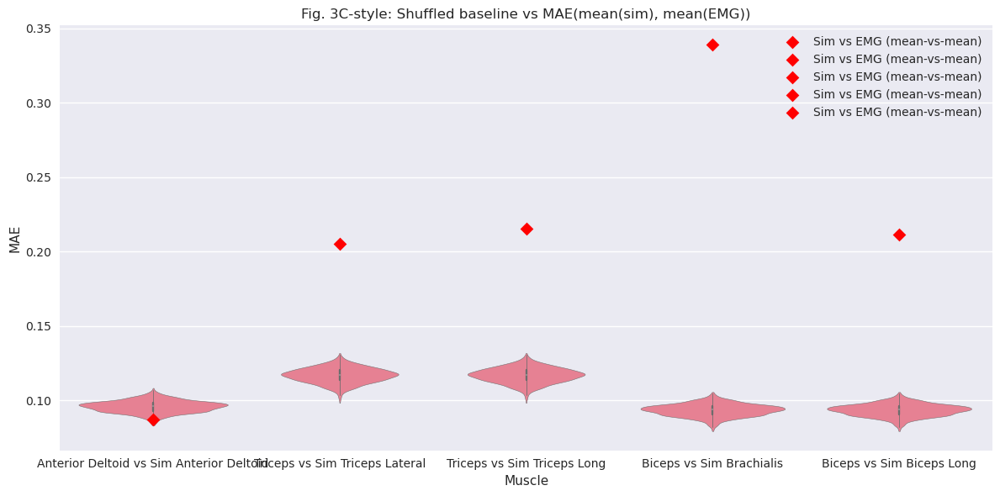

In [11]:
# === Fig. 3C-style MAE between means (no grouping) + shuffled baseline ===
# Drop-in cell: computes MAE(mean(sim), mean(emg)) per muscle and compares to a
# time-shuffled baseline (shuffle EMG time indices, re-mean, MAE to real EMG mean).

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm


# --------------------------- SIMULATED DATA SETTINGS -----------------------------------
H5_PATH = "rollouts_full_mouse_arm_new_250815_005648_593502.h5"
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Muscle configurations: (sim_index, sim_name, emg_file, emg_name)
MUSCLE_CONFIGS = [
    (3, "Anterior Deltoid", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Anterior Deltoid"),
    (5, "Triceps Lateral", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (6, "Triceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (7, "Brachialis", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
    (8, "Biceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
]

# -------------------------------------------------------------------------
# Helpers
# -------------------------------------------------------------------------
def compute_mae_between_means(emg_traces: np.ndarray,
                              sim_traces: np.ndarray,
                              fs_hz: int = 400,
                              tau_ms: int = 0) -> dict:
    """
    Compute Fig. 3C-style error: MAE between the MEAN simulated activation and the
    MEAN empirical EMG, averaged over time.

    Args:
        emg_traces: (N, T) normalized EMG envelopes per trial.
        sim_traces: (N, T) normalized/clipped simulated activations per trial.
        fs_hz:      Sampling rate (Hz) of both arrays (post-processing).
        tau_ms:     Lag to apply to the simulation (positive delays sim). Fig. 3 uses 0 ms.

    Returns:
        dict with:
            'emg_mean': (T,) mean EMG across trials
            'sim_mean': (T,) mean Sim across trials (after lag alignment)
            'mae':      float, mean absolute error between those means
            'T':        int, time dimension used
    """
    assert emg_traces.ndim == 2 and sim_traces.ndim == 2, "Inputs must be [N, T]"
    N_e, T_e = emg_traces.shape
    N_s, T_s = sim_traces.shape
    assert N_e == N_s, f"Trial count mismatch: EMG {N_e} vs Sim {N_s}"

    # Align lengths conservatively
    T = min(T_e, T_s)
    emg = emg_traces[:, :T]
    sim = sim_traces[:, :T]

    # Apply lag to simulation if requested (no wrap-around)
    if tau_ms != 0:
        shift = int(round((tau_ms / 1000.0) * fs_hz))
        if shift > 0:
            # delay sim
            sim = np.pad(sim, ((0, 0), (shift, 0)), mode='edge')[:, :T]
        elif shift < 0:
            # advance sim
            sim = np.pad(sim, ((0, 0), (0, -shift)), mode='edge')[:, -shift:T-shift]

    emg_mean = emg.mean(axis=0)  # [T]
    sim_mean = sim.mean(axis=0)  # [T]

    mae = np.mean(np.abs(sim_mean - emg_mean))
    return {"emg_mean": emg_mean, "sim_mean": sim_mean, "mae": float(mae), "T": T}


def shuffled_baseline_mae_vs_emg_mean(emg_traces: np.ndarray,
                                      emg_mean: np.ndarray,
                                      n_shuffles: int = 1000,
                                      seed: int = 0,
                                      global_time_perm: bool = True) -> np.ndarray:
    """
    Time-shuffled baseline for Fig. 3C:
    - For each shuffle, randomly permute the *time indices*, compute the mean shuffled EMG,
      then MAE(mean_shuffled, mean_real).
    - If global_time_perm=True, use the SAME permutation across trials (default).
      If False, permute each trial independently.

    Args:
        emg_traces: (N, T) normalized EMG envelopes per trial.
        emg_mean:   (T,)   mean EMG across trials (unshuffled).
        n_shuffles: Number of shuffles.
        seed:       RNG seed.
        global_time_perm: Use one shared time permutation across all trials (True) or per-trial (False).

    Returns:
        baseline_maes: (n_shuffles,) array of MAE values.
    """
    assert emg_traces.ndim == 2 and emg_mean.ndim == 1
    N, T = emg_traces.shape
    assert emg_mean.shape[0] == T

    rng = np.random.default_rng(seed)
    baseline_maes = np.empty(n_shuffles, dtype=np.float64)

    for k in tqdm(range(n_shuffles), desc="Shuffled baseline", leave=False):
        if global_time_perm:
            perm = rng.permutation(T)                          # one shared perm
            emg_shuf_mean = emg_traces[:, perm].mean(axis=0)  # mean over trials -> [T]
        else:
            # independent perm per trial
            shuf = np.empty_like(emg_traces)
            for i in range(N):
                shuf[i] = emg_traces[i, rng.permutation(T)]
            emg_shuf_mean = shuf.mean(axis=0)

        baseline_maes[k] = np.mean(np.abs(emg_shuf_mean - emg_mean))

    return baseline_maes


# -------------------------------------------------------------------------
# Main: compute Fig. 3C-style MAE + shuffled baseline for each muscle
# Requires the following to already exist in your notebook/session:
# - actions: np.ndarray [N_clips, T, n_muscles]
# - MUSCLE_CONFIGS: list of tuples (sim_index, sim_name, emg_file, emg_name)
# - process_emg_data_individual_trials(emg_file) -> np.ndarray [N_clips, T] (normalized)
# - target_fs (Hz): sampling rate after downsampling (defaults to 400 if absent)
# -------------------------------------------------------------------------
_tau_ms = 0
_fs = globals().get("target_fs", 400)
_n_shuffles = 1000
_rng_seed = 42

results_summary = []
baseline_long = []  # for plotting violin distributions

print("Running Fig. 3C-style analysis (mean-vs-mean MAE) ...")
for (muscle_idx, sim_name, emg_file, emg_name) in tqdm(MUSCLE_CONFIGS, desc="Muscles"):
    label = f"{emg_name} vs Sim {sim_name}"

    # Sim traces [N, T]
    sim_traces = actions[:, :, muscle_idx]

    # EMG traces [N, T] (already normalized by your 98th percentile in process_emg_data_individual_trials)
    emg_traces = process_emg_data_individual_trials(emg_file)
    if emg_traces is None or emg_traces.shape[0] != sim_traces.shape[0]:
        print(f"  Skipping {label}: EMG missing or clip count mismatch "
              f"(emg={None if emg_traces is None else emg_traces.shape}, sim={sim_traces.shape})")
        continue

    # Fig. 3C metric: MAE between means (lag=0 ms here)
    metrics = compute_mae_between_means(
        emg_traces=emg_traces, sim_traces=sim_traces,
        fs_hz=_fs, tau_ms=_tau_ms
    )

    # Shuffled baseline (time-permutation)
    baseline_maes = shuffled_baseline_mae_vs_emg_mean(
        emg_traces=emg_traces, emg_mean=metrics['emg_mean'],
        n_shuffles=_n_shuffles, seed=_rng_seed, global_time_perm=True
    )

    # One-sided permutation p-value: Pr[baseline <= sim] (lower MAE is better)
    p_one_sided = (np.sum(baseline_maes <= metrics['mae']) + 1) / (baseline_maes.size + 1)

    print(f"\n{label}")
    print(f"  MAE(mean_sim, mean_emg): {metrics['mae']:.4f}")
    print(f"  Shuffled baseline MAE:   {baseline_maes.mean():.4f} ± {baseline_maes.std():.4f} "
          f"(min={baseline_maes.min():.4f}, max={baseline_maes.max():.4f})")
    print(f"  One-sided p (sim < shuffled): {p_one_sided:.4g}")

    results_summary.append({
        "Muscle": label,
        "MAE_mean_sim_vs_mean_emg": metrics['mae'],
        "Shuffle_mean": baseline_maes.mean(),
        "Shuffle_std": baseline_maes.std(),
        "p_perm_one_sided": p_one_sided
    })

    # stash baseline for violin plot
    baseline_long.extend([{"Muscle": label, "BaselineMAE": v} for v in baseline_maes])

# -------------------------------------------------------------------------
# Summary table + quick plot
# -------------------------------------------------------------------------
if results_summary:
    df_summary = pd.DataFrame(results_summary)
    display(df_summary)

    # Violin of shuffled baseline with overlayed point for the true MAE(mean, mean)
    if baseline_long:
        df_base = pd.DataFrame(baseline_long)
        plt.figure(figsize=(12, 6))
        sns.violinplot(data=df_base, x="Muscle", y="BaselineMAE", inner="box", cut=0)
        sns.stripplot(data=df_summary, x="Muscle", y="MAE_mean_sim_vs_mean_emg",
                      color="red", size=8, marker="D", label="Sim vs EMG (mean-vs-mean)")
        plt.title("Fig. 3C-style: Shuffled baseline vs MAE(mean(sim), mean(EMG))")
        plt.ylabel("MAE")
        plt.xlabel("Muscle")
        plt.legend(loc="upper right")
        plt.xticks(rotation=0, ha="center")
        plt.tight_layout()
        plt.show()
else:
    print("No results to show (all muscles skipped).")

Simulated data: 46 clips, 199 timesteps at ~400 Hz
Total trials in CSV: 77
Valid trials (non-zero start/end): 46
Expected to match simulation clips: 46


Muscles:   0%|          | 0/5 [00:00<?, ?it/s]

    Loaded EMG data: 77 trials
      Trial 0: 15000 → 199 samples
      Trial 3: 15000 → 199 samples
      Trial 8: 15000 → 199 samples
      Trial 9: 15000 → 199 samples
      Trial 12: 15000 → 199 samples
    Final EMG data shape: (46, 199)
    EMG normalization: 98th percentile = 0.009641


Muscles:  20%|██        | 1/5 [00:07<00:31,  7.76s/it]

    Loaded EMG data: 77 trials
      Trial 0: 15000 → 199 samples
      Trial 3: 15000 → 199 samples
      Trial 8: 15000 → 199 samples
      Trial 9: 15000 → 199 samples
      Trial 12: 15000 → 199 samples
    Final EMG data shape: (46, 199)
    EMG normalization: 98th percentile = 0.017354


Muscles:  40%|████      | 2/5 [00:15<00:23,  7.81s/it]

    Loaded EMG data: 77 trials
      Trial 0: 15000 → 199 samples
      Trial 3: 15000 → 199 samples
      Trial 8: 15000 → 199 samples
      Trial 9: 15000 → 199 samples
      Trial 12: 15000 → 199 samples
    Final EMG data shape: (46, 199)
    EMG normalization: 98th percentile = 0.017354


Muscles:  60%|██████    | 3/5 [00:23<00:15,  7.64s/it]

    Loaded EMG data: 77 trials
      Trial 0: 15000 → 199 samples
      Trial 3: 15000 → 199 samples
      Trial 8: 15000 → 199 samples
      Trial 9: 15000 → 199 samples
      Trial 12: 15000 → 199 samples
    Final EMG data shape: (46, 199)
    EMG normalization: 98th percentile = 0.001805


Muscles:  80%|████████  | 4/5 [00:30<00:07,  7.66s/it]

    Loaded EMG data: 77 trials
      Trial 0: 15000 → 199 samples
      Trial 3: 15000 → 199 samples
      Trial 8: 15000 → 199 samples
      Trial 9: 15000 → 199 samples
      Trial 12: 15000 → 199 samples
    Final EMG data shape: (46, 199)
    EMG normalization: 98th percentile = 0.001805


Muscles: 100%|██████████| 5/5 [00:38<00:00,  7.63s/it]


,Muscle (EMG),Sim channel,"MAE(mean_sim, mean_emg)",Shifted μ,Shifted σ,p(one-sided)
0,Anterior Deltoid,Anterior Deltoid,0.111479,0.070565,0.025825,1.0
4,Biceps,Biceps Long,0.114358,0.062764,0.020106,1.0
3,Biceps,Brachialis,0.300626,0.062764,0.020106,1.0
1,Triceps,Triceps Lateral,0.163902,0.091225,0.036178,1.0
2,Triceps,Triceps Long,0.211632,0.091225,0.036178,1.0


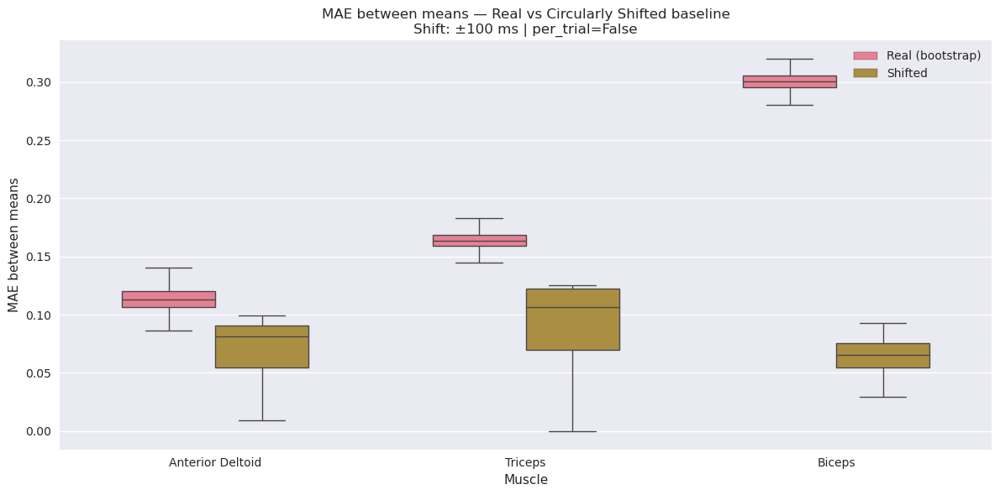

In [ ]:
# === Fig. 3C-style: MAE(mean(sim), mean(EMG)) with circular time-shift null ===
# Two boxes per muscle (Real via bootstrap, Shifted via random circular shifts)
# Drop-in cell.

import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal
from tqdm import tqdm
from IPython.display import display

# --------------------------- STYLE -----------------------------------
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# --------------------------- CONFIG ----------------------------------
H5_PATH = "/root/vast/eric/track-mjx/results/neurIPS-paramsweep/big_sweep_ctrl_ctrldiff_energy/mouse_muscle_arm_imitation_params_CTRLCOST_0.2_CTRLDIFF_0.02_ENERGY_0.3_250901_115902_891106.h5"
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Muscle configurations: (sim_index, sim_name, emg_file, emg_name)
MUSCLE_CONFIGS = [
    (3, "Anterior Deltoid", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Anterior Deltoid"),
    (5, "Triceps Lateral",  "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (6, "Triceps Long",     "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (7, "Brachialis",       "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
    (8, "Biceps Long",      "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
]

# Trial index CSV (reach windows)
TRIALS_CSV = "/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv"

# EMG processing params
fs = 30000                 # EMG sampling rate (Hz)
highpass_cutoff = 100       # Hz
lowpass_cutoff  = 1000     # Hz
envelope_cutoff = 50       # Hz
filter_order = 4

# Downsampling to match simulation
target_fs = 400            # Hz (simulation rate)
downsample_factor = fs // target_fs  # 30000 // 400 = 75
target_samples = 199       # 0.5 s at 400 Hz -> 200 samples
tau_ms = 0                 # Fig. 3 uses 0 ms lag

# Circular shift null config
N_SHIFTS = 1000
RNG_SEED = 42
SHIFT_MAX_MS = 300                      # random ±150 ms circular time shift
PER_TRIAL_SHIFT = True                  # True = independent shift per trial; False = one shared shift

# Real bootstrap (to create a Real box)
REAL_BOOTSTRAP = True
N_BOOTSTRAP = 10000
BOOT_SEED = 123

# --------------------------- HELPERS ---------------------------------
def compute_mae_between_means(emg_traces: np.ndarray,
                              sim_traces: np.ndarray,
                              fs_hz: int = 400,
                              tau_ms: int = 0) -> dict:
    """
    Compute MAE between the MEAN simulated activation and the MEAN EMG (over time).

    Args:
        emg_traces: (N, T) normalized EMG envelopes per trial.
        sim_traces: (N, T) normalized/clipped simulated activations per trial.
        fs_hz:      Sampling rate (Hz) of both arrays (post-processing).
        tau_ms:     Lag to apply to simulation (positive delays sim). Fig. 3 uses 0 ms.

    Returns:
        dict:
          emg_mean: (T,) mean EMG across trials
          sim_mean: (T,) mean Sim across trials (after lag alignment)
          mae:      float, mean absolute error between those means
          T:        int, time dimension used
    """
    assert emg_traces.ndim == 2 and sim_traces.ndim == 2, "Inputs must be [N, T]"
    N_e, T_e = emg_traces.shape
    N_s, T_s = sim_traces.shape
    assert N_e == N_s, f"Trial count mismatch: EMG {N_e} vs Sim {N_s}"

    T = min(T_e, T_s)
    emg = emg_traces[:, :T]
    sim = sim_traces[:, :T]

    if tau_ms != 0:
        shift = int(round((tau_ms / 1000.0) * fs_hz))
        if shift > 0:
            sim = np.pad(sim, ((0, 0), (shift, 0)), mode='edge')[:, :T]
        elif shift < 0:
            sim = np.pad(sim, ((0, 0), (0, -shift)), mode='edge')[:, -shift:T-shift]

    emg_mean = emg.mean(axis=0)
    sim_mean = sim.mean(axis=0)
    mae = np.mean(np.abs(sim_mean - emg_mean))
    return {"emg_mean": emg_mean, "sim_mean": sim_mean, "mae": float(mae), "T": T}

def circular_shift_baseline_mae_vs_emg_mean(emg_traces: np.ndarray,
                                            emg_mean: np.ndarray,
                                            max_shift_samples: int,
                                            n_shifts: int = 1000,
                                            seed: int = 0,
                                            per_trial: bool = True) -> np.ndarray:
    """
    Circular-shift baseline:
    Randomly shift time forward/backward and wrap (circular), then compute the MAE
    between the mean of shifted trials and the *unshifted* EMG mean.

    Args:
        emg_traces: (N, T) normalized EMG per trial.
        emg_mean:   (T,)   mean EMG across trials (unshifted).
        max_shift_samples: Maximum absolute shift in samples (uniform in [-K, K]).
        n_shifts:   Number of null draws.
        seed:       RNG seed.
        per_trial:  If True, each trial gets its own random shift; if False, one shared shift.

    Returns:
        (n_shifts,) array of MAE values.
    """
    assert emg_traces.ndim == 2 and emg_mean.ndim == 1
    N, T = emg_traces.shape
    assert emg_mean.shape[0] == T
    if max_shift_samples <= 0:
        raise ValueError("max_shift_samples must be > 0 for circular shifting.")

    rng = np.random.default_rng(seed)
    out = np.empty(n_shifts, dtype=np.float64)

    for k in tqdm(range(n_shifts), desc="Shifted baseline", leave=False):
        if per_trial:
            shifts = rng.integers(-max_shift_samples, max_shift_samples + 1, size=N)
            shifted = np.empty_like(emg_traces)
            for i in range(N):
                s = int(shifts[i])
                shifted[i] = np.roll(emg_traces[i], s, axis=-1)
            mean_shifted = shifted.mean(axis=0)
        else:
            s = int(rng.integers(-max_shift_samples, max_shift_samples + 1))
            mean_shifted = np.roll(emg_traces, s, axis=-1).mean(axis=0)

        out[k] = np.mean(np.abs(mean_shifted - emg_mean))
    return out

def bootstrap_real_mae(emg_traces: np.ndarray,
                       sim_traces: np.ndarray,
                       B: int = 1000,
                       seed: int = 123) -> np.ndarray:
    """
    Bootstrap distribution for the Real condition (trials resampled with replacement).
    Recompute means, then MAE(mean(sim), mean(EMG)) for each bootstrap replicate.

    Args:
        emg_traces: (N, T) EMG trials.
        sim_traces: (N, T) Sim trials (aligned).
        B:          Number of bootstrap replicates.
        seed:       RNG seed.

    Returns:
        (B,) array of MAE values (Real bootstrap).
    """
    N, _ = emg_traces.shape
    rng = np.random.default_rng(seed)
    out = np.empty(B, dtype=float)
    for b in tqdm(range(B), desc="Bootstrap real", leave=False):
        idx = rng.integers(0, N, size=N)
        emg_mean_b = emg_traces[idx].mean(axis=0)
        sim_mean_b = sim_traces[idx].mean(axis=0)
        out[b] = np.mean(np.abs(sim_mean_b - emg_mean_b))
    return out

# --------------------------- LOAD SIMULATED DATA -----------------------------------
with h5py.File(H5_PATH, "r") as f:
    actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)

n_clips, T_sim, _ = actions.shape
sim_time_s = np.linspace(0, 0.5, T_sim)  # nominal 0.5 s window
print(f"Simulated data: {n_clips} clips, {T_sim} timesteps at ~{target_fs} Hz")

# --------------------------- TRIAL MASK --------------------------------------------
df_trials = pd.read_csv(TRIALS_CSV)
trial_mask = (
    (df_trials['start'].notna()) &
    (df_trials['end'].notna()) &
    (df_trials['start'] > 0) &
    (df_trials['end'] > 0) &
    (df_trials['start'] != df_trials['end'])
)
valid_trials_df = df_trials[trial_mask].copy()
valid_trial_indices = valid_trials_df.index.tolist()

print(f"Total trials in CSV: {len(df_trials)}")
print(f"Valid trials (non-zero start/end): {len(valid_trials_df)}")
print(f"Expected to match simulation clips: {n_clips}")

# --------------------------- EMG PROCESSING ----------------------------------------
def process_emg_data_individual_trials(emg_file_path: str) -> np.ndarray:
    """
    Process EMG csv into per-trial envelopes aligned to the reach, downsampled to 400 Hz.

    Steps:
      - Bandpass 20–1000 Hz, rectify, low-pass 50 Hz (envelope)
      - Extract 0.5 s window starting at reach onset (from trials CSV)
      - Downsample by averaging to 200 samples (0.5 s × 400 Hz)
      - Normalize by global 98th percentile across all extracted samples

    Args:
        emg_file_path: Path to EMG CSV (one row per trial).

    Returns:
        (N, 200) array of normalized envelopes for valid trials (N should equal n_clips).
    """
    emg_data = pd.read_csv(emg_file_path, header=None)
    print(f"    Loaded EMG data: {len(emg_data)} trials")

    reach_envelopes_downsampled = []

    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        trial_num = idx

        # Convert reach onset from 200 Hz video frames to EMG sample index (30 kHz)
        emg_reach_start = int((row['start'] / 200.0) * fs)
        emg_reach_end   = emg_reach_start + int(0.5 * fs)  # 0.5 s window

        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :].to_numpy(dtype=float)

            # Bandpass
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered = signal.filtfilt(b, a, trial_emg)

            # Envelope
            rectified = np.abs(filtered)
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            env = signal.filtfilt(b_env, a_env, rectified)

            # Extract window
            if emg_reach_start < len(env) and emg_reach_end <= len(env):
                win = env[emg_reach_start:emg_reach_end]

                # Downsample by averaging fixed-size chunks
                n_samples = len(win)
                n_chunks = n_samples // downsample_factor
                trimmed = win[:n_chunks * downsample_factor]
                chunked = trimmed.reshape(n_chunks, downsample_factor).mean(axis=1)

                if len(chunked) >= target_samples:
                    chunked = chunked[:target_samples]  # 200 samples
                    reach_envelopes_downsampled.append(chunked)

                    if i < 5:
                        print(f"      Trial {trial_num}: {n_samples} → {len(chunked)} samples")
        else:
            print(f"      Trial {trial_num}: EMG data index out of range")

    if not reach_envelopes_downsampled:
        return None

    envelopes_array = np.vstack(reach_envelopes_downsampled)
    print(f"    Final EMG data shape: {envelopes_array.shape}")

    # Normalize by global 98th percentile
    norm_value = np.percentile(envelopes_array, 98)
    normalized = envelopes_array / max(norm_value, 1e-12)
    print(f"    EMG normalization: 98th percentile = {norm_value:.6f}")
    return normalized

# --------------------------- ANALYSIS (per muscle) ---------------------------------
rows = []            # summary rows for printing (per config)
box_long = []        # long-form for box-and-whisker (two boxes per unique EMG muscle)
cats_order = []      # keep unique muscle order stable for plotting
seen_for_box = set() # prevent duplicate boxes for repeated EMG labels

# convert ms to samples for shifting
SHIFT_MAX_SAMPLES = int(round(SHIFT_MAX_MS * (target_fs / 1000.0)))
if SHIFT_MAX_SAMPLES <= 0:
    raise ValueError("SHIFT_MAX_MS too small; yields zero shift range.")

for muscle_idx, sim_name, emg_file, emg_name in tqdm(MUSCLE_CONFIGS, desc="Muscles"):
    label = f"{emg_name} vs Sim {sim_name}"

    # Sim traces: [N, T]
    sim_traces = actions[:, :, muscle_idx]

    # EMG traces: [N, T]
    emg_traces = process_emg_data_individual_trials(emg_file)

    if emg_traces is None or emg_traces.shape[0] != n_clips:
        print(f"  Skipping {label}: EMG missing or clip count mismatch "
              f"(emg={None if emg_traces is None else emg_traces.shape}, sim={(n_clips, T_sim)})")
        continue

    # Fig. 3C metric: MAE between means (tau=0 ms)
    metrics = compute_mae_between_means(
        emg_traces=emg_traces, sim_traces=sim_traces,
        fs_hz=target_fs, tau_ms=tau_ms
    )

    # Shifted baseline: circular time shifts
    shifted_maes = circular_shift_baseline_mae_vs_emg_mean(
        emg_traces=emg_traces, emg_mean=metrics['emg_mean'],
        max_shift_samples=SHIFT_MAX_SAMPLES, n_shifts=N_SHIFTS,
        seed=RNG_SEED, per_trial=PER_TRIAL_SHIFT
    )

    # Real bootstrap (to create a "Real" box)
    if REAL_BOOTSTRAP:
        real_boot = bootstrap_real_mae(
            emg_traces=emg_traces, sim_traces=sim_traces, B=N_BOOTSTRAP, seed=BOOT_SEED
        )

    # Only add BOXES once per unique EMG muscle label
    if emg_name not in seen_for_box:
        if REAL_BOOTSTRAP:
            for v in real_boot:
                box_long.append({"Muscle": emg_name, "Group": "Real (bootstrap)", "MAE": v})
        for v in shifted_maes:
            box_long.append({"Muscle": emg_name, "Group": "Shifted", "MAE": v})
        cats_order.append(emg_name)
        seen_for_box.add(emg_name)

    # One-sided p-value: Pr[Shifted <= Real] using the single real MAE
    p_one_sided = (np.sum(shifted_maes <= metrics['mae']) + 1) / (shifted_maes.size + 1)

    rows.append({
        "Muscle (EMG)": emg_name,
        "Sim channel": sim_name,
        "MAE(mean_sim, mean_emg)": metrics['mae'],
        "Shifted μ": shifted_maes.mean(),
        "Shifted σ": shifted_maes.std(ddof=0),
        "p(one-sided)": p_one_sided
    })

# --------------------------- SUMMARY TABLE -----------------------------------------
if rows:
    df_summary = pd.DataFrame(rows)
    display(df_summary.sort_values(["Muscle (EMG)", "Sim channel"]))

# --------------------------- BOX-AND-WHISKER PLOT ----------------------------------
if box_long:
    df_box = pd.DataFrame(box_long)

    # ensure unique ordered categories for the x-axis (preserve first-seen order)
    cats_order = list(dict.fromkeys(cats_order))
    cat_type = pd.CategoricalDtype(categories=cats_order, ordered=True)
    df_box["Muscle"] = df_box["Muscle"].astype(cat_type)

    plt.figure(figsize=(12, 6))
    ax = plt.gca()
    sns.boxplot(data=df_box, x="Muscle", y="MAE", hue="Group",
                showfliers=False, width=0.6, ax=ax)
    ax.set_title(f"MAE between means — Real vs Circularly Shifted baseline\n"
                 f"Shift: ±{SHIFT_MAX_MS} ms | per_trial={PER_TRIAL_SHIFT}")
    ax.set_ylabel("MAE between means")
    ax.set_xlabel("Muscle")
    ax.legend(frameon=False, loc="upper right")
    plt.tight_layout()
    plt.show()
else:
    print("No box data to plot (all muscles skipped).")

Simulated data: 46 clips, 200 timesteps at 400 Hz
Total trials in CSV: 77
Valid trials (non-zero start/end): 46
Expected to match simulation clips: 46

Processing Anterior Deltoid vs Sim Anterior Deltoid...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.009499
  Mean error: 0.2090 ± 0.0482
  Median error: 0.1979
  Min/Max error: 0.1404 / 0.3599
  ✓ Processed 46 clips

Processing Triceps vs Sim Triceps Lateral...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.017279
  Mean error: 0.2580 ± 0.0440
  Median error: 0.2515

/tmp/ipykernel_318230/713904810.py:192: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box_plot = sns.boxplot(data=df_errors, x='Muscle', y='Error',


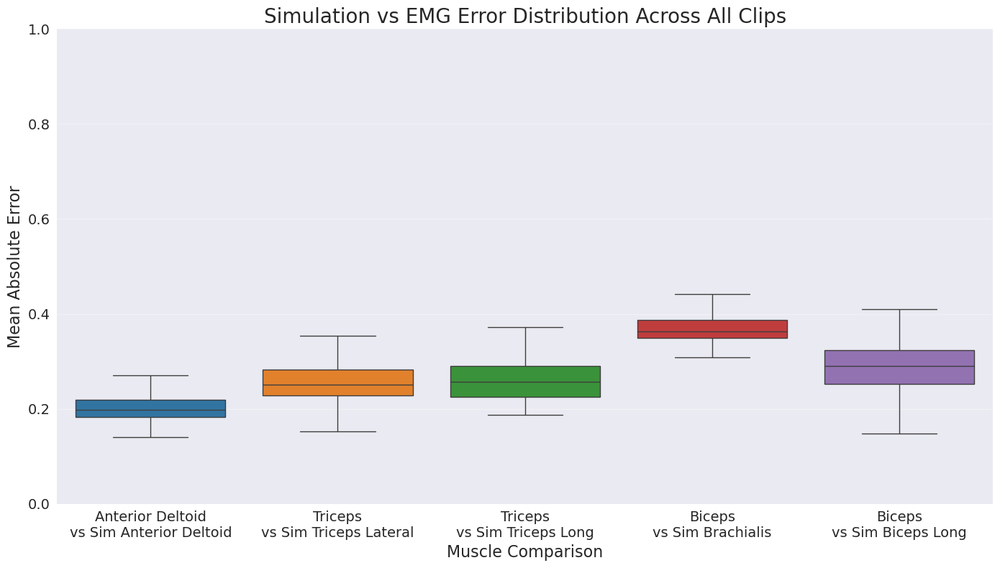


ERROR ANALYSIS SUMMARY (Box Plot Statistics):
Mean Absolute Error (MAE) between Simulated and EMG data
Statistics across 46 clips per muscle
--------------------------------------------------------------------------------

Anterior Deltoid vs Sim Anterior Deltoid:
  Mean:    0.2090
  Median:  0.1979
  Std:     0.0488
  Q1:      0.1829
  Q3:      0.2197
  Min:     0.1404
  Max:     0.3599

Triceps vs Sim Triceps Lateral     :
  Mean:    0.2580
  Median:  0.2515
  Std:     0.0445
  Q1:      0.2282
  Q3:      0.2833
  Min:     0.1520
  Max:     0.3730

Triceps vs Sim Triceps Long        :
  Mean:    0.2615
  Median:  0.2565
  Std:     0.0441
  Q1:      0.2255
  Q3:      0.2905
  Min:     0.1876
  Max:     0.3913

Biceps vs Sim Brachialis           :
  Mean:    0.3729
  Median:  0.3633
  Std:     0.0477
  Q1:      0.3488
  Q3:      0.3867
  Min:     0.2683
  Max:     0.5200

Biceps vs Sim Biceps Long          :
  Mean:    0.2897
  Median:  0.2902
  Std:     0.0561
  Q1:      0.2519
  Q3: 

In [ ]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# --------------------------- SIMULATED DATA SETTINGS -----------------------------------
H5_PATH = "rollouts_full_mouse_arm.h5"
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Muscle configurations: (sim_index, sim_name, emg_file, emg_name)
MUSCLE_CONFIGS = [
    (3, "Anterior Deltoid", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Anterior Deltoid"),
    (5, "Triceps Lateral", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (6, "Triceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (7, "Brachialis", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
    (8, "Biceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
]

# Load simulated muscle activation data
with h5py.File(H5_PATH, "r") as f:
    actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)

n_clips, T, _ = actions.shape
sim_time_s = np.linspace(0, 0.5, T)  # 0 → 0.5 s for 200 steps at 400 Hz

print(f"Simulated data: {n_clips} clips, {T} timesteps at 400 Hz")

# --------------------------- CREATE TRIAL MASK -----------------------------------
# Load the trial data (main CSV with reach indices)
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')

# Create trial mask: valid trials have non-zero, non-NaN start and end values
trial_mask = (
    (df['start'].notna()) & 
    (df['end'].notna()) & 
    (df['start'] > 0) & 
    (df['end'] > 0) &
    (df['start'] != df['end'])  # Make sure start != end
)

# Get the valid trials
valid_trials_df = df[trial_mask].copy()
valid_trial_indices = valid_trials_df.index.tolist()

print(f"Total trials in CSV: {len(df)}")
print(f"Valid trials (non-zero start/end): {len(valid_trials_df)}")
print(f"Expected to match simulation clips: {n_clips}")

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20  # High pass cutoff frequency in Hz
lowpass_cutoff = 1000  # Low pass cutoff frequency in Hz
envelope_cutoff = 50  # Envelope cutoff frequency in Hz
filter_order = 4  # Butterworth filter order

# Calculate downsampling parameters
target_fs = 400  # Target sampling rate to match simulation
downsample_factor = fs // target_fs  # 30000 // 400 = 75 samples per chunk
target_samples = 200  # Number of samples we want (to match simulation)

# Function to process EMG data and return individual trial data
def process_emg_data_individual_trials(emg_file_path):
    """Process EMG data and return individual trial envelopes for error calculation"""
    # Load EMG data
    emg_data = pd.read_csv(emg_file_path, header=None)
    print(f"    Loaded EMG data: {len(emg_data)} trials")
    
    # Process only valid trials using the trial mask
    reach_envelopes_downsampled = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        # idx is the original trial number from the CSV (the index from df)
        trial_num = idx
        
        # Convert reach start index from 200Hz frames to 30000Hz samples
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + 15000  # 0.5 seconds
        
        # Get EMG data for this specific trial (using original trial index)
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Downsample by averaging chunks
                    n_samples = len(reach_envelope)
                    n_chunks = n_samples // downsample_factor
                    
                    # Trim to exact multiple of downsample_factor
                    trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]
                    
                    # Reshape and average
                    reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
                    downsampled_envelope = np.mean(reshaped, axis=1)
                    
                    # Only keep if we have the target number of samples (200)
                    if len(downsampled_envelope) >= target_samples:
                        downsampled_envelope = downsampled_envelope[:target_samples]
                        reach_envelopes_downsampled.append(downsampled_envelope)
                        
                        if i < 5:  # Debug info for first few trials
                            print(f"      Trial {trial_num}: {n_samples} → {len(downsampled_envelope)} samples")
        else:
            print(f"      Trial {trial_num}: EMG data index out of range")
    
    if not reach_envelopes_downsampled:
        return None
    
    # Convert to numpy array
    envelopes_array = np.array(reach_envelopes_downsampled)
    print(f"    Final EMG data shape: {envelopes_array.shape}")
    
    # ROBUST EMG NORMALIZATION:
    # Normalize by the 98th percentile of all observed values
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    print(f"    EMG normalization: 98th percentile = {norm_value:.6f}")
    
    return normalized_envelopes

# --------------------------- PROCESS ALL MUSCLES AND CALCULATE ERRORS -----------------------------------
all_errors_data = []
muscle_names = []

for muscle_idx, sim_name, emg_file, emg_name in MUSCLE_CONFIGS:
    comparison_name = f"{emg_name}\nvs Sim {sim_name}"
    print(f"\nProcessing {comparison_name.replace(chr(10), ' ')}...")
    
    # Extract simulated data for all clips
    sim_traces = actions[:, :, muscle_idx]  # Shape: (46, 200)
    
    # Process EMG data for all clips
    emg_traces = process_emg_data_individual_trials(emg_file)
    
    if emg_traces is not None and len(emg_traces) == n_clips:
        # Calculate error for each clip (mean absolute difference across time)
        clip_errors = []
        
        for clip_idx in range(n_clips):
            sim_trace = sim_traces[clip_idx, :]
            emg_trace = emg_traces[clip_idx, :]
            
            # Calculate mean absolute error for this clip
            clip_error = np.mean(np.abs(sim_trace - emg_trace))
            clip_errors.append(clip_error)
            
            # Add to data for box plot
            all_errors_data.append({
                'Muscle': comparison_name,
                'Error': clip_error,
                'Clip': clip_idx
            })
        
        clip_errors = np.array(clip_errors)
        muscle_names.append(comparison_name)
        
        print(f"  Mean error: {np.mean(clip_errors):.4f} ± {np.std(clip_errors):.4f}")
        print(f"  Median error: {np.median(clip_errors):.4f}")
        print(f"  Min/Max error: {np.min(clip_errors):.4f} / {np.max(clip_errors):.4f}")
        print(f"  ✓ Processed {len(clip_errors)} clips")
    else:
        print(f"  Error: Could not process EMG data or clip count mismatch")

# --------------------------- CREATE BOX AND WHISKER PLOT -----------------------------------
if all_errors_data:
    # Convert to DataFrame for easier plotting
    df_errors = pd.DataFrame(all_errors_data)
    
    # Create box and whisker plot
    fig, ax = plt.subplots(figsize=(14, 8))
    
    # Create box plot using seaborn for better styling
    box_plot = sns.boxplot(data=df_errors, x='Muscle', y='Error', 
                          palette=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd'],
                          ax=ax, showfliers=False)
    
    # Customize the plot
    ax.set_xlabel('Muscle Comparison', fontsize=16)
    ax.set_ylabel('Mean Absolute Error', fontsize=16)
    ax.set_title('Simulation vs EMG Error Distribution Across All Clips', fontsize=20)
    
    # Increase tick label size
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_ylim(0, 1.0)
    
    # Rotate x-axis labels if needed
    plt.xticks(rotation=0, ha='center')
    
    # Add grid for better readability
    ax.grid(True, alpha=0.3, axis='y')
    
    # Add individual data points (optional - shows all 46 points per muscle)
    # sns.stripplot(data=df_errors, x='Muscle', y='Error', 
    #               color='black', alpha=0.4, size=3, ax=ax)
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed summary statistics
    print("\n" + "="*80)
    print("ERROR ANALYSIS SUMMARY (Box Plot Statistics):")
    print("="*80)
    print("Mean Absolute Error (MAE) between Simulated and EMG data")
    print("Statistics across 46 clips per muscle")
    print("-"*80)
    
    for muscle in muscle_names:
        muscle_data = df_errors[df_errors['Muscle'] == muscle]['Error']
        print(f"\n{muscle.replace(chr(10), ' '):<35}:")
        print(f"  Mean:    {muscle_data.mean():.4f}")
        print(f"  Median:  {muscle_data.median():.4f}")
        print(f"  Std:     {muscle_data.std():.4f}")
        print(f"  Q1:      {muscle_data.quantile(0.25):.4f}")
        print(f"  Q3:      {muscle_data.quantile(0.75):.4f}")
        print(f"  Min:     {muscle_data.min():.4f}")
        print(f"  Max:     {muscle_data.max():.4f}")
    
    print("="*80)

else:
    print("No valid muscle data found for error analysis.")

SyntaxError: invalid syntax (2863047441.py, line 1)

Using 46 clips and 200 timesteps for analysis
Processing Anterior Deltoid vs Anterior Deltoid...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.009499
✓ Added Anterior Deltoid/Anterior Deltoid data: (46, 200)
Processing Triceps Lateral vs Triceps...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.017279
✓ Added Triceps Lateral/Triceps data: (46, 200)
Processing Triceps Long vs Triceps...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samp

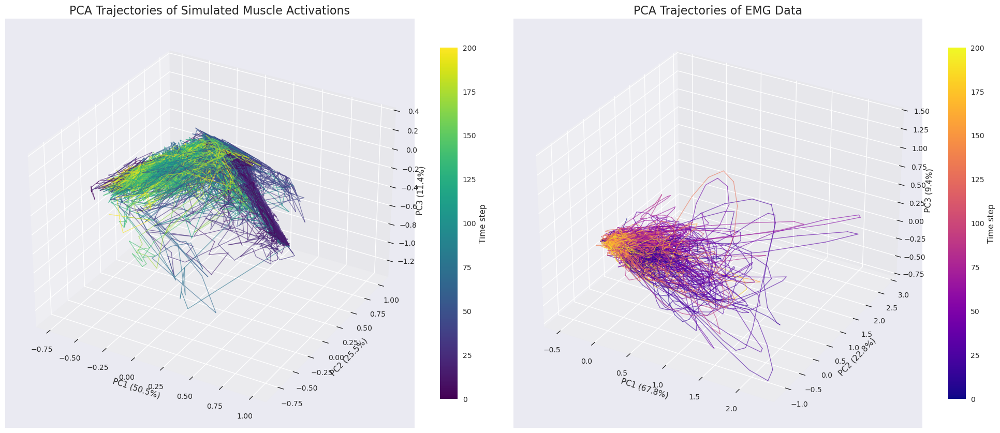

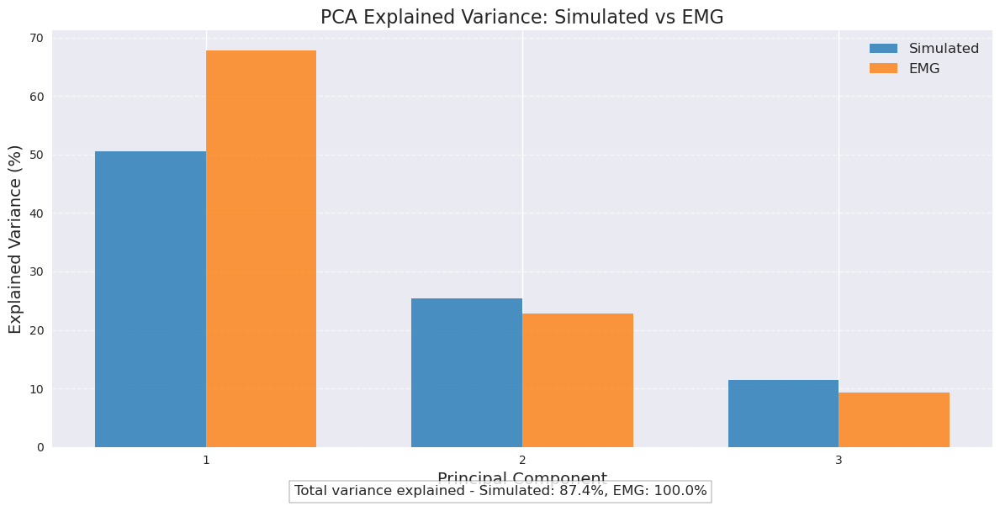

In [10]:
# Import additional libraries needed for PCA
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd
from scipy import signal

# ------------- DEFINE ALL NECESSARY VARIABLES AND FUNCTIONS -------------
# Load the trial data (main CSV with reach indices) - Include this in the cell
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')

# Create trial mask: valid trials have non-zero, non-NaN start and end values
trial_mask = (
    (df['start'].notna()) & 
    (df['end'].notna()) & 
    (df['start'] > 0) & 
    (df['end'] > 0) &
    (df['start'] != df['end'])  # Make sure start != end
)

# Get the valid trials
valid_trials_df = df[trial_mask].copy()

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20  # High pass cutoff frequency in Hz
lowpass_cutoff = 1000  # Low pass cutoff frequency in Hz
envelope_cutoff = 50  # Envelope cutoff frequency in Hz
filter_order = 4  # Butterworth filter order

# Calculate downsampling parameters
target_fs = 400  # Target sampling rate to match simulation
downsample_factor = fs // target_fs  # 30000 // 400 = 75 samples per chunk
target_samples = 200  # Number of samples we want (to match simulation)

# Define function to process EMG data and return individual trial data
def process_emg_data_individual_trials(emg_file_path):
    """Process EMG data and return individual trial envelopes for error calculation"""
    # Load EMG data
    emg_data = pd.read_csv(emg_file_path, header=None)
    print(f"    Loaded EMG data: {len(emg_data)} trials")
    
    # Process only valid trials using the trial mask
    reach_envelopes_downsampled = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        # idx is the original trial number from the CSV (the index from df)
        trial_num = idx
        
        # Convert reach start index from 200Hz frames to 30000Hz samples
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + 15000  # 0.5 seconds
        
        # Get EMG data for this specific trial (using original trial index)
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Downsample by averaging chunks
                    n_samples = len(reach_envelope)
                    n_chunks = n_samples // downsample_factor
                    
                    # Trim to exact multiple of downsample_factor
                    trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]
                    
                    # Reshape and average
                    reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
                    downsampled_envelope = np.mean(reshaped, axis=1)
                    
                    # Only keep if we have the target number of samples (200)
                    if len(downsampled_envelope) >= target_samples:
                        downsampled_envelope = downsampled_envelope[:target_samples]
                        reach_envelopes_downsampled.append(downsampled_envelope)
                        
                        if i < 5:  # Debug info for first few trials
                            print(f"      Trial {trial_num}: {n_samples} → {len(downsampled_envelope)} samples")
        else:
            print(f"      Trial {trial_num}: EMG data index out of range")
    
    if not reach_envelopes_downsampled:
        return None
    
    # Convert to numpy array
    envelopes_array = np.array(reach_envelopes_downsampled)
    print(f"    Final EMG data shape: {envelopes_array.shape}")
    
    # ROBUST EMG NORMALIZATION:
    # Normalize by the 98th percentile of all observed values
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    print(f"    EMG normalization: 98th percentile = {norm_value:.6f}")
    
    return normalized_envelopes

# ------------- COLLECT ALL SIMULATED AND EMG DATA FOR PCA -------------
print("Collecting data for PCA analysis...")

# For simulated data, we already have the actions array loaded
sim_data = []

# For EMG data, we need to collect the processed traces
emg_data = []

# Get the number of clips from the actions array
n_clips, T, _ = actions.shape
print(f"Using {n_clips} clips and {T} timesteps for analysis")

# Process each muscle in the configuration
for muscle_idx, sim_name, emg_file, emg_name in MUSCLE_CONFIGS:
    print(f"Processing {sim_name} vs {emg_name}...")
    
    # Get simulated data for this muscle
    sim_traces = actions[:, :, muscle_idx]  # Shape: (n_clips, T)
    
    # Get EMG data for this muscle - use our defined function
    emg_traces = process_emg_data_individual_trials(emg_file)
    
    if emg_traces is not None and len(emg_traces) == n_clips:
        # Add to our collection arrays
        sim_data.append(sim_traces)
        emg_data.append(emg_traces)
        print(f"✓ Added {sim_name}/{emg_name} data: {sim_traces.shape}")
    else:
        print(f"✗ Skipping {sim_name}/{emg_name} - data issue")

# Convert to arrays and reshape for PCA
if len(sim_data) > 0 and len(emg_data) > 0:
    # Stack arrays along the muscles dimension
    sim_data = np.stack(sim_data, axis=2)  # Shape: (n_clips, T, n_muscles)
    emg_data = np.stack(emg_data, axis=2)  # Shape: (n_clips, T, n_muscles)

    print(f"Final simulated data shape: {sim_data.shape}")
    print(f"Final EMG data shape: {emg_data.shape}")

    # ------------- PERFORM PCA CORRECTLY FOR TRAJECTORIES -------------
    n_clips, T, n_muscles = sim_data.shape
    
    # Reshape for PCA: (n_clips, T, n_muscles) -> (n_clips*T, n_muscles)
    # This flattens the time dimension with the clips dimension
    sim_flat = sim_data.reshape(-1, n_muscles)  
    emg_flat = emg_data.reshape(-1, n_muscles)
    
    print(f"Flattened for PCA - Simulated: {sim_flat.shape}, EMG: {emg_flat.shape}")

    # Perform PCA on flattened data
    pca_sim = PCA(n_components=3)
    sim_pca_flat = pca_sim.fit_transform(sim_flat)
    sim_explained_var = pca_sim.explained_variance_ratio_ * 100

    pca_emg = PCA(n_components=3)
    emg_pca_flat = pca_emg.fit_transform(emg_flat)
    emg_explained_var = pca_emg.explained_variance_ratio_ * 100

    # Reshape back to (n_clips, T, 3) to get trajectories in PC space
    sim_pca = sim_pca_flat.reshape(n_clips, T, 3)
    emg_pca = emg_pca_flat.reshape(n_clips, T, 3)

    print(f"PCA trajectories - Simulated: {sim_pca.shape}, EMG: {emg_pca.shape}")
    print(f"Variance explained (Simulated): {sim_explained_var}")
    print(f"Variance explained (EMG): {emg_explained_var}")

    # ------------- CREATE 3D PLOTS WITH TRAJECTORIES -------------
    fig = plt.figure(figsize=(20, 10))

    # Plot simulated data trajectories
    ax1 = fig.add_subplot(121, projection='3d')
    for i in range(n_clips):
        # Plot each clip's trajectory as a line with gradient color based on time
        points = sim_pca[i]
        
        # Create a color gradient from blue to red based on time
        colors = plt.cm.viridis(np.linspace(0, 1, T))
        
        # Plot the trajectory with gradient color
        for t in range(T-1):
            ax1.plot(points[t:t+2, 0], points[t:t+2, 1], points[t:t+2, 2], 
                    color=colors[t], alpha=0.6, linewidth=1)
    
    # Add a single line with color gradient for the legend
    cmap = plt.cm.viridis
    norm = plt.Normalize(0, T)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar1 = fig.colorbar(sm, ax=ax1, shrink=0.7)
    cbar1.set_label('Time step')
    
    ax1.set_xlabel(f'PC1 ({sim_explained_var[0]:.1f}%)')
    ax1.set_ylabel(f'PC2 ({sim_explained_var[1]:.1f}%)')
    ax1.set_zlabel(f'PC3 ({sim_explained_var[2]:.1f}%)')
    ax1.set_title('PCA Trajectories of Simulated Muscle Activations', fontsize=16)

    # Plot EMG data trajectories
    ax2 = fig.add_subplot(122, projection='3d')
    for i in range(n_clips):
        # Plot each clip's trajectory as a line with gradient color based on time
        points = emg_pca[i]
        
        # Create a color gradient from blue to red based on time
        colors = plt.cm.plasma(np.linspace(0, 1, T))
        
        # Plot the trajectory with gradient color
        for t in range(T-1):
            ax2.plot(points[t:t+2, 0], points[t:t+2, 1], points[t:t+2, 2], 
                    color=colors[t], alpha=0.6, linewidth=1)
    
    # Add a single line with color gradient for the legend
    cmap = plt.cm.plasma
    norm = plt.Normalize(0, T)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar2 = fig.colorbar(sm, ax=ax2, shrink=0.7)
    cbar2.set_label('Time step')
    
    ax2.set_xlabel(f'PC1 ({emg_explained_var[0]:.1f}%)')
    ax2.set_ylabel(f'PC2 ({emg_explained_var[1]:.1f}%)')
    ax2.set_zlabel(f'PC3 ({emg_explained_var[2]:.1f}%)')
    ax2.set_title('PCA Trajectories of EMG Data', fontsize=16)

    plt.tight_layout()
    plt.show()

    # ------------- PLOT VARIANCE EXPLAINED -------------
    plt.figure(figsize=(12, 6))
    components = range(1, 4)
    bar_width = 0.35
    x = np.arange(len(components))

    plt.bar(x - bar_width/2, sim_explained_var, width=bar_width, label='Simulated', color='tab:blue', alpha=0.8)
    plt.bar(x + bar_width/2, emg_explained_var, width=bar_width, label='EMG', color='tab:orange', alpha=0.8)

    plt.xlabel('Principal Component', fontsize=14)
    plt.ylabel('Explained Variance (%)', fontsize=14)
    plt.title('PCA Explained Variance: Simulated vs EMG', fontsize=16)
    plt.xticks(x, components)
    plt.legend(fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Add total variance explained text
    plt.figtext(0.5, 0.01, 
               f"Total variance explained - Simulated: {np.sum(sim_explained_var):.1f}%, EMG: {np.sum(emg_explained_var):.1f}%", 
               ha='center', fontsize=12, bbox=dict(facecolor='white', alpha=0.8))

    plt.tight_layout()
    plt.show()
else:
    print("No valid data collected for PCA analysis.")

Using 46 clips and 200 timesteps for analysis
Processing Anterior Deltoid vs Anterior Deltoid...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.009499
✓ Added Anterior Deltoid/Anterior Deltoid data: (46, 200)
Processing Triceps Lateral vs Triceps...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.017279
✓ Added Triceps Lateral/Triceps data: (46, 200)
Processing Triceps Long vs Triceps...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samp

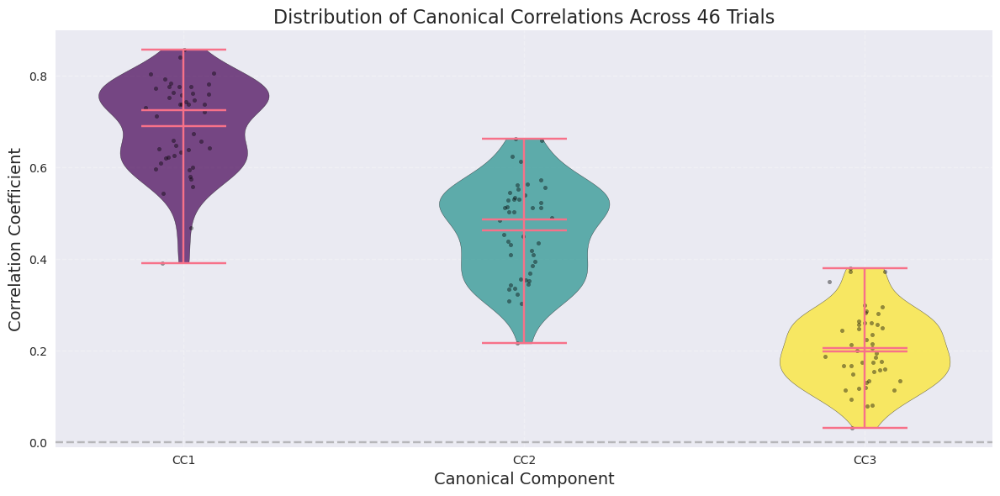

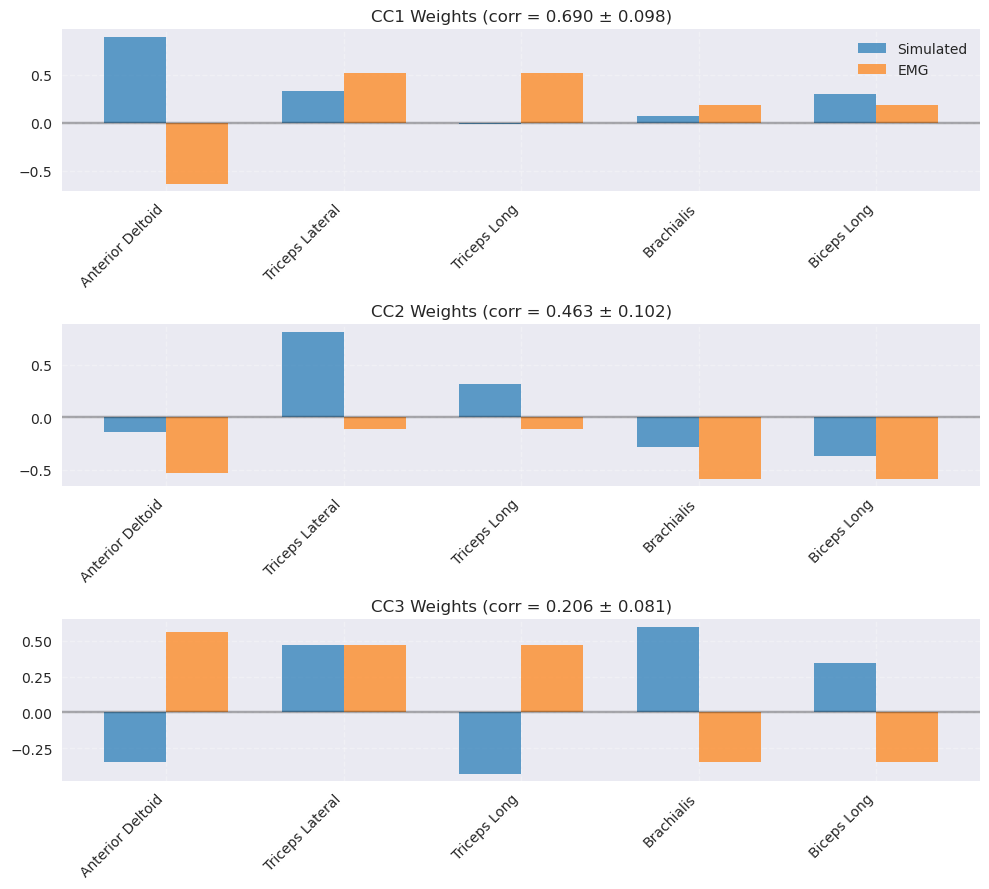

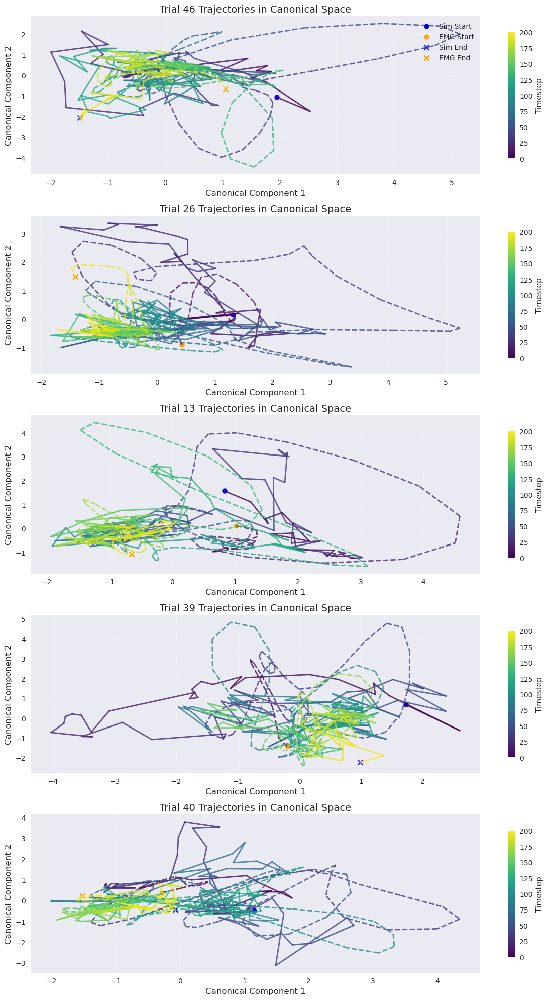

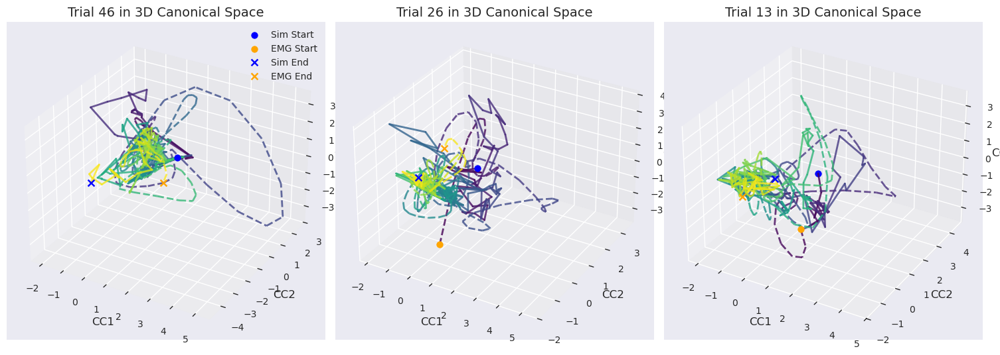

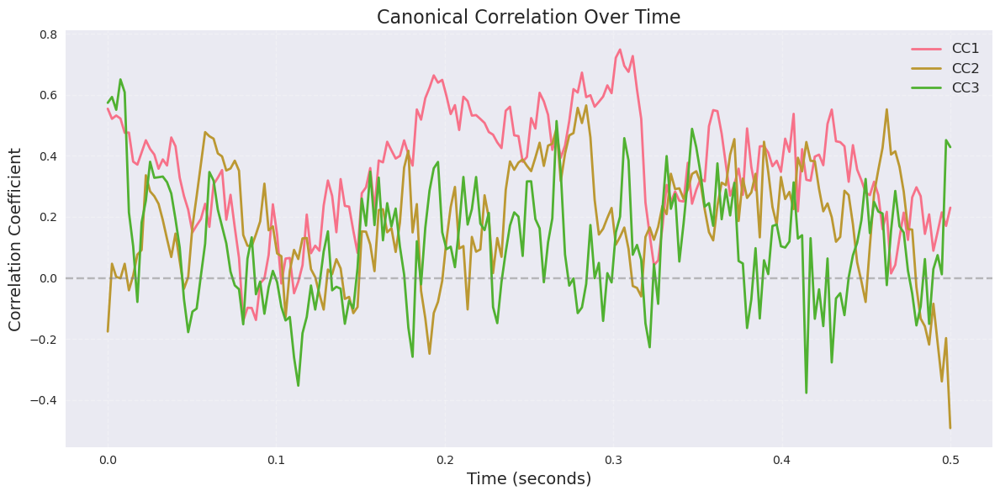

In [11]:
# Import additional libraries needed for CCA
from sklearn.cross_decomposition import CCA
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd
from scipy import signal
import matplotlib.pyplot as plt
import numpy as np

# ------------- DEFINE ALL NECESSARY VARIABLES AND FUNCTIONS -------------
# Load the trial data (main CSV with reach indices)
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')

# Create trial mask: valid trials have non-zero, non-NaN start and end values
trial_mask = (
    (df['start'].notna()) & 
    (df['end'].notna()) & 
    (df['start'] > 0) & 
    (df['end'] > 0) &
    (df['start'] != df['end'])  # Make sure start != end
)

# Get the valid trials
valid_trials_df = df[trial_mask].copy()

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20  # High pass cutoff frequency in Hz
lowpass_cutoff = 1000  # Low pass cutoff frequency in Hz
envelope_cutoff = 50  # Envelope cutoff frequency in Hz
filter_order = 4  # Butterworth filter order

# Calculate downsampling parameters
target_fs = 400  # Target sampling rate to match simulation
downsample_factor = fs // target_fs  # 30000 // 400 = 75 samples per chunk
target_samples = 200  # Number of samples we want (to match simulation)

# Define function to process EMG data and return individual trial data
def process_emg_data_individual_trials(emg_file_path):
    """Process EMG data and return individual trial envelopes for error calculation"""
    # Load EMG data
    emg_data = pd.read_csv(emg_file_path, header=None)
    print(f"    Loaded EMG data: {len(emg_data)} trials")
    
    # Process only valid trials using the trial mask
    reach_envelopes_downsampled = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        # idx is the original trial number from the CSV (the index from df)
        trial_num = idx
        
        # Convert reach start index from 200Hz frames to 30000Hz samples
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + 15000  # 0.5 seconds
        
        # Get EMG data for this specific trial (using original trial index)
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Downsample by averaging chunks
                    n_samples = len(reach_envelope)
                    n_chunks = n_samples // downsample_factor
                    
                    # Trim to exact multiple of downsample_factor
                    trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]
                    
                    # Reshape and average
                    reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
                    downsampled_envelope = np.mean(reshaped, axis=1)
                    
                    # Only keep if we have the target number of samples (200)
                    if len(downsampled_envelope) >= target_samples:
                        downsampled_envelope = downsampled_envelope[:target_samples]
                        reach_envelopes_downsampled.append(downsampled_envelope)
                        
                        if i < 5:  # Debug info for first few trials
                            print(f"      Trial {trial_num}: {n_samples} → {len(downsampled_envelope)} samples")
        else:
            print(f"      Trial {trial_num}: EMG data index out of range")
    
    if not reach_envelopes_downsampled:
        return None
    
    # Convert to numpy array
    envelopes_array = np.array(reach_envelopes_downsampled)
    print(f"    Final EMG data shape: {envelopes_array.shape}")
    
    # ROBUST EMG NORMALIZATION:
    # Normalize by the 98th percentile of all observed values
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    print(f"    EMG normalization: 98th percentile = {norm_value:.6f}")
    
    return normalized_envelopes

# ------------- COLLECT ALL SIMULATED AND EMG DATA -------------
print("Collecting data for CCA and PCA analysis...")

# For simulated data, we already have the actions array loaded
sim_data = []

# For EMG data, we need to collect the processed traces
emg_data = []

# Get the number of clips from the actions array
n_clips, T, _ = actions.shape
print(f"Using {n_clips} clips and {T} timesteps for analysis")

# Process each muscle in the configuration
for muscle_idx, sim_name, emg_file, emg_name in MUSCLE_CONFIGS:
    print(f"Processing {sim_name} vs {emg_name}...")
    
    # Get simulated data for this muscle
    sim_traces = actions[:, :, muscle_idx]  # Shape: (n_clips, T)
    
    # Get EMG data for this muscle - use our defined function
    emg_traces = process_emg_data_individual_trials(emg_file)
    
    if emg_traces is not None and len(emg_traces) == n_clips:
        # Add to our collection arrays
        sim_data.append(sim_traces)
        emg_data.append(emg_traces)
        print(f"✓ Added {sim_name}/{emg_name} data: {sim_traces.shape}")
    else:
        print(f"✗ Skipping {sim_name}/{emg_name} - data issue")

# Convert to arrays and reshape for analysis
if len(sim_data) > 0 and len(emg_data) > 0:
    # Stack arrays along the muscles dimension
    sim_data = np.stack(sim_data, axis=2)  # Shape: (n_clips, T, n_muscles)
    emg_data = np.stack(emg_data, axis=2)  # Shape: (n_clips, T, n_muscles)

    print(f"Final simulated data shape: {sim_data.shape}")
    print(f"Final EMG data shape: {emg_data.shape}")

    # ------------- PERFORM PCA -------------
    n_clips, T, n_muscles = sim_data.shape
    
    # Reshape for PCA: (n_clips, T, n_muscles) -> (n_clips*T, n_muscles)
    sim_flat = sim_data.reshape(-1, n_muscles)  
    emg_flat = emg_data.reshape(-1, n_muscles)
    
    print(f"Flattened data - Simulated: {sim_flat.shape}, EMG: {emg_flat.shape}")

    # ------------- PERFORM CANONICAL CORRELATION ANALYSIS -------------
    # Reshape for CCA: We want to correlate each timepoint's muscle activations
    # We'll use a time-windowed approach to look at temporal correlations
    
    # Number of canonical components to compute
    n_components = min(n_muscles, 3)  # Limited by the number of muscles
    
    # Initialize CCA model
    cca = CCA(n_components=n_components)
    
    # Collect CCA results for all trials
    cca_sim_all = []
    cca_emg_all = []
    correlations_all = []
    
    print("Performing CCA across all trials...")
    
    # Option 1: Calculate CCA for each clip separately to see trial-by-trial correlations
    for clip_idx in range(n_clips):
        # Get data for this clip
        sim_clip = sim_data[clip_idx]  # (T, n_muscles)
        emg_clip = emg_data[clip_idx]  # (T, n_muscles)
        
        # Fit and transform with CCA
        cca_sim, cca_emg = cca.fit_transform(sim_clip, emg_clip)
        
        # Calculate correlations
        correlations = [np.corrcoef(cca_sim[:, i], cca_emg[:, i])[0, 1] for i in range(n_components)]
        
        cca_sim_all.append(cca_sim)
        cca_emg_all.append(cca_emg)
        correlations_all.append(correlations)
    
    # Convert to arrays
    cca_sim_all = np.array(cca_sim_all)  # (n_clips, T, n_components)
    cca_emg_all = np.array(cca_emg_all)  # (n_clips, T, n_components)
    correlations_all = np.array(correlations_all)  # (n_clips, n_components)
    
    # Calculate mean correlations across clips
    mean_correlations = np.mean(correlations_all, axis=0)
    std_correlations = np.std(correlations_all, axis=0)
    
    print("Mean canonical correlations:", mean_correlations)
    print("Std canonical correlations:", std_correlations)
    
    # Option 2: Calculate global CCA across all trials and timepoints
    print("Performing global CCA across all data...")
    cca_global = CCA(n_components=n_components)
    cca_sim_global, cca_emg_global = cca_global.fit_transform(sim_flat, emg_flat)
    
    # Reshape global CCA results back to (n_clips, T, n_components)
    cca_sim_global = cca_sim_global.reshape(n_clips, T, n_components)
    cca_emg_global = cca_emg_global.reshape(n_clips, T, n_components)
    
    # Calculate global correlations
    global_correlations = [np.corrcoef(cca_sim_global.reshape(-1, n_components)[:, i], 
                                      cca_emg_global.reshape(-1, n_components)[:, i])[0, 1] 
                          for i in range(n_components)]
    
    print("Global canonical correlations:", global_correlations)
    
    # Get the CCA weights to interpret the relationships
    sim_weights = cca_global.x_weights_
    emg_weights = cca_global.y_weights_
    
    # ------------- PLOTTING CANONICAL CORRELATIONS -------------
    # 1. Plot distribution of per-clip canonical correlations
    plt.figure(figsize=(12, 6))
    
    # Create violin plots for each component's correlation distribution
    violin_parts = plt.violinplot(correlations_all, positions=range(1, n_components+1), 
                                 showmeans=True, showmedians=True, showextrema=True)
    
    # Color by component
    colors = plt.cm.viridis(np.linspace(0, 1, n_components))
    for i, pc in enumerate(violin_parts['bodies']):
        pc.set_facecolor(colors[i])
        pc.set_edgecolor('black')
        pc.set_alpha(0.7)
    
    # Add individual points for each trial's correlation
    for i in range(n_components):
        plt.scatter(np.full(n_clips, i+1) + np.random.normal(0, 0.05, n_clips), 
                   correlations_all[:, i], alpha=0.4, color='black', s=10)
    
    plt.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.xlabel('Canonical Component', fontsize=14)
    plt.ylabel('Correlation Coefficient', fontsize=14)
    plt.title(f'Distribution of Canonical Correlations Across {n_clips} Trials', fontsize=16)
    plt.xticks(range(1, n_components+1), [f'CC{i+1}' for i in range(n_components)])
    plt.tight_layout()
    plt.show()
    
    # 2. Plot the canonical weights to interpret components
    fig, axes = plt.subplots(n_components, 1, figsize=(10, 3*n_components))
    if n_components == 1:
        axes = [axes]
    
    muscle_names = [f"{name}" for _, name, _, _ in MUSCLE_CONFIGS]
    
    for i in range(n_components):
        ax = axes[i]
        x = np.arange(n_muscles)
        width = 0.35
        
        sim_bars = ax.bar(x - width/2, sim_weights[:, i], width, label='Simulated', color='tab:blue', alpha=0.7)
        emg_bars = ax.bar(x + width/2, emg_weights[:, i], width, label='EMG', color='tab:orange', alpha=0.7)
        
        ax.set_title(f'CC{i+1} Weights (corr = {mean_correlations[i]:.3f} ± {std_correlations[i]:.3f})', fontsize=12)
        ax.set_xticks(x)
        ax.set_xticklabels(muscle_names, rotation=45, ha='right')
        ax.axhline(y=0, color='black', linestyle='-', alpha=0.3)
        ax.grid(True, linestyle='--', alpha=0.3)
        
        if i == 0:
            ax.legend()
    
    plt.tight_layout()
    plt.show()
    
    # 3. Plot example trajectories in canonical space
    # Select a few random trials to visualize
    n_examples = min(5, n_clips)
    example_indices = np.random.choice(n_clips, n_examples, replace=False)
    
    if n_components >= 2:
        fig, axes = plt.subplots(n_examples, 1, figsize=(12, 4*n_examples))
        if n_examples == 1:
            axes = [axes]
            
        for i, idx in enumerate(example_indices):
            ax = axes[i]
            
            # Plot trajectory in CC1 vs CC2 space
            sim_traj = cca_sim_all[idx]  # (T, n_components)
            emg_traj = cca_emg_all[idx]  # (T, n_components)
            
            # Create a color map based on time
            colors = plt.cm.viridis(np.linspace(0, 1, T))
            
            # Plot the trajectories with color gradient
            for t in range(T-1):
                # Simulated trajectory segment
                ax.plot(sim_traj[t:t+2, 0], sim_traj[t:t+2, 1], 
                       color=colors[t], alpha=0.8, linewidth=2, solid_capstyle='round')
                
                # EMG trajectory segment
                ax.plot(emg_traj[t:t+2, 0], emg_traj[t:t+2, 1], 
                       color=colors[t], alpha=0.8, linewidth=2, linestyle='--', solid_capstyle='round')
            
            # Mark start points
            ax.scatter(sim_traj[0, 0], sim_traj[0, 1], c='blue', s=50, marker='o', label='Sim Start')
            ax.scatter(emg_traj[0, 0], emg_traj[0, 1], c='orange', s=50, marker='o', label='EMG Start')
            
            # Mark end points
            ax.scatter(sim_traj[-1, 0], sim_traj[-1, 1], c='blue', s=50, marker='x', label='Sim End')
            ax.scatter(emg_traj[-1, 0], emg_traj[-1, 1], c='orange', s=50, marker='x', label='EMG End')
            
            ax.set_xlabel('Canonical Component 1', fontsize=12)
            ax.set_ylabel('Canonical Component 2', fontsize=12)
            ax.set_title(f'Trial {idx+1} Trajectories in Canonical Space', fontsize=14)
            ax.grid(True, linestyle='--', alpha=0.3)
            
            if i == 0:
                ax.legend(loc='upper right')
                
            # Add a colorbar to show time progression
            sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(0, T))
            sm.set_array([])
            cbar = plt.colorbar(sm, ax=ax, orientation='vertical', shrink=0.8)
            cbar.set_label('Timestep')
            
        plt.tight_layout()
        plt.show()
        
    # 4. Plot 3D trajectories if we have at least 3 components
    if n_components >= 3:
        fig = plt.figure(figsize=(15, 12))
        
        # Plot a few example trials in 3D canonical space
        for i, idx in enumerate(example_indices[:min(3, n_examples)]):
            ax = fig.add_subplot(1, min(3, n_examples), i+1, projection='3d')
            
            # Plot trajectory in CC1 vs CC2 vs CC3 space
            sim_traj = cca_sim_all[idx]  # (T, n_components)
            emg_traj = cca_emg_all[idx]  # (T, n_components)
            
            # Create a color map based on time
            colors = plt.cm.viridis(np.linspace(0, 1, T))
            
            # Plot the trajectories with color gradient
            for t in range(T-1):
                # Simulated trajectory segment
                ax.plot(sim_traj[t:t+2, 0], sim_traj[t:t+2, 1], sim_traj[t:t+2, 2], 
                       color=colors[t], alpha=0.8, linewidth=2)
                
                # EMG trajectory segment
                ax.plot(emg_traj[t:t+2, 0], emg_traj[t:t+2, 1], emg_traj[t:t+2, 2], 
                       color=colors[t], alpha=0.8, linewidth=2, linestyle='--')
            
            # Mark start points
            ax.scatter(sim_traj[0, 0], sim_traj[0, 1], sim_traj[0, 2], c='blue', s=50, marker='o', label='Sim Start')
            ax.scatter(emg_traj[0, 0], emg_traj[0, 1], emg_traj[0, 2], c='orange', s=50, marker='o', label='EMG Start')
            
            # Mark end points
            ax.scatter(sim_traj[-1, 0], sim_traj[-1, 1], sim_traj[-1, 2], c='blue', s=50, marker='x', label='Sim End')
            ax.scatter(emg_traj[-1, 0], emg_traj[-1, 1], emg_traj[-1, 2], c='orange', s=50, marker='x', label='EMG End')
            
            ax.set_xlabel('CC1', fontsize=12)
            ax.set_ylabel('CC2', fontsize=12)
            ax.set_zlabel('CC3', fontsize=12)
            ax.set_title(f'Trial {idx+1} in 3D Canonical Space', fontsize=14)
            
            if i == 0:
                ax.legend(loc='upper right')
                
        plt.tight_layout()
        plt.show()
        
    # 5. Plot correlation over time for each component
    plt.figure(figsize=(12, 6))
    
    # Calculate correlation at each timestep across all trials
    time_correlations = np.zeros((T, n_components))
    
    for t in range(T):
        for c in range(n_components):
            sim_vals = cca_sim_global[:, t, c]
            emg_vals = cca_emg_global[:, t, c]
            time_correlations[t, c] = np.corrcoef(sim_vals, emg_vals)[0, 1]
    
    # Plot correlation over time for each component
    for c in range(n_components):
        plt.plot(np.linspace(0, 0.5, T), time_correlations[:, c], 
                label=f'CC{c+1}', linewidth=2)
    
    plt.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.xlabel('Time (seconds)', fontsize=14)
    plt.ylabel('Correlation Coefficient', fontsize=14)
    plt.title('Canonical Correlation Over Time', fontsize=16)
    plt.legend(fontsize=12)
    plt.tight_layout()
    plt.show()
    
else:
    print("No valid data collected for analysis.")

Using 46 clips and 200 timesteps for analysis
Processing Anterior Deltoid vs Anterior Deltoid...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.009499
✓ Added Anterior Deltoid/Anterior Deltoid data: (46, 200)
Processing Triceps Lateral vs Triceps...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.017279
✓ Added Triceps Lateral/Triceps data: (46, 200)
Processing Triceps Long vs Triceps...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samp

/tmp/ipykernel_379365/998734312.py:179: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


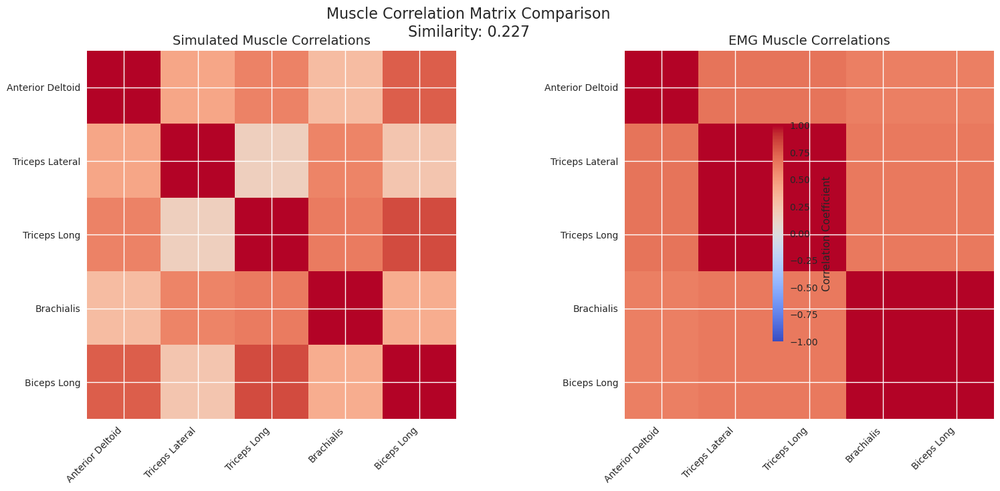


2. Performing Canonical Correlation Analysis...
Canonical correlations: [0.5296482804060942, 0.2989736000197767, 0.08181669603208329]


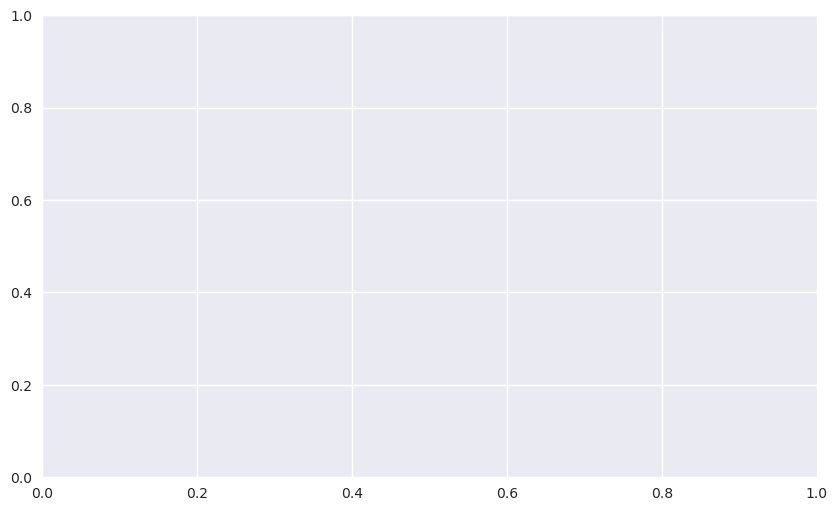

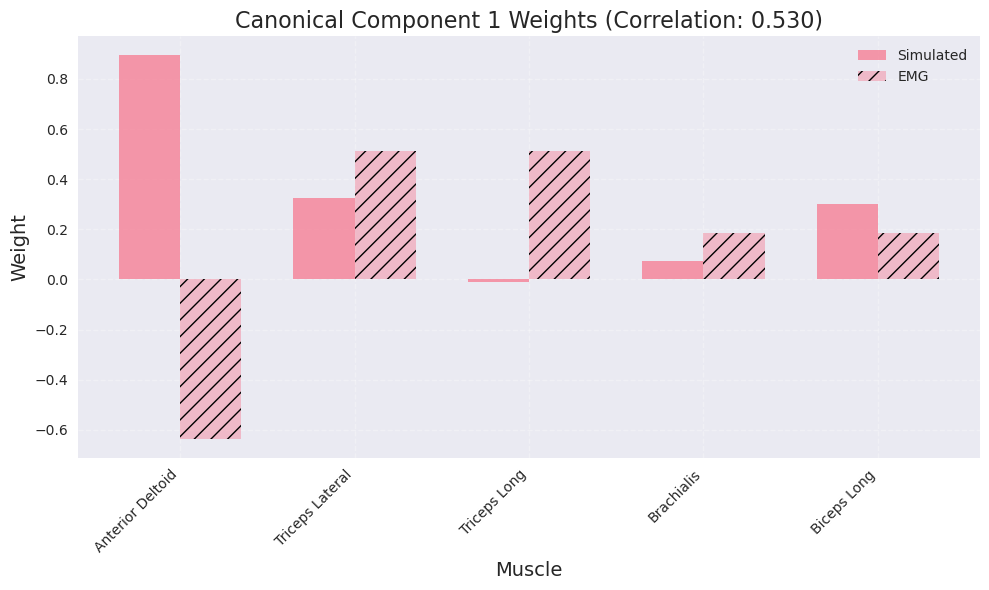

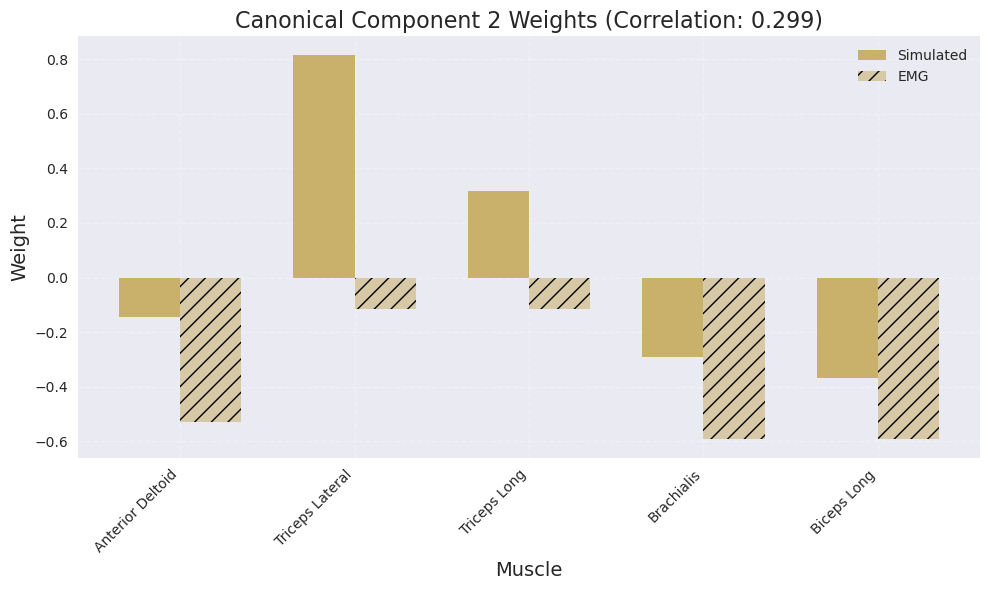

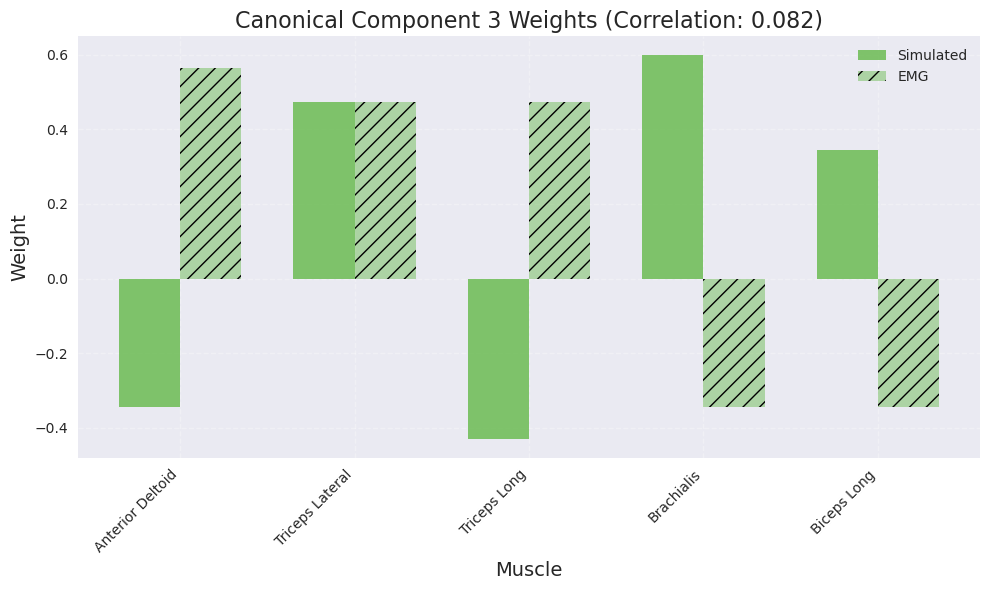


3. Visualizing canonical trajectories...


ModuleNotFoundError: No module named 'fastdtw'

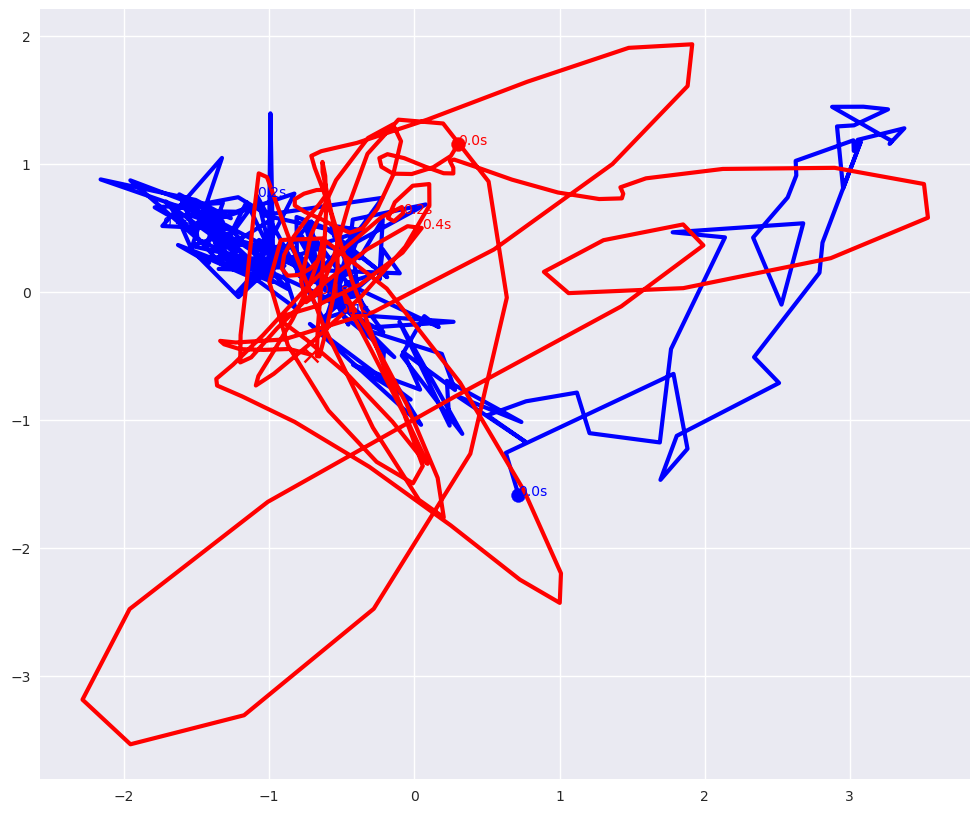

In [12]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
from sklearn.cross_decomposition import CCA
import seaborn as sns

# ------------- DEFINE NECESSARY VARIABLES AND FUNCTIONS -------------
# Load the trial data (main CSV with reach indices)
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')

# Create trial mask: valid trials have non-zero, non-NaN start and end values
trial_mask = (
    (df['start'].notna()) & 
    (df['end'].notna()) & 
    (df['start'] > 0) & 
    (df['end'] > 0) &
    (df['start'] != df['end'])  # Make sure start != end
)

# Get the valid trials
valid_trials_df = df[trial_mask].copy()

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20  # High pass cutoff frequency in Hz
lowpass_cutoff = 1000  # Low pass cutoff frequency in Hz
envelope_cutoff = 50  # Envelope cutoff frequency in Hz
filter_order = 4  # Butterworth filter order

# Calculate downsampling parameters
target_fs = 400  # Target sampling rate to match simulation
downsample_factor = fs // target_fs  # 30000 // 400 = 75 samples per chunk
target_samples = 200  # Number of samples we want (to match simulation)

# Define function to process EMG data
def process_emg_data_individual_trials(emg_file_path):
    """Process EMG data and return individual trial envelopes"""
    emg_data = pd.read_csv(emg_file_path, header=None)
    print(f"    Loaded EMG data: {len(emg_data)} trials")
    
    reach_envelopes_downsampled = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        trial_num = idx
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + 15000  # 0.5 seconds
        
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Downsample by averaging chunks
                    n_samples = len(reach_envelope)
                    n_chunks = n_samples // downsample_factor
                    trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]
                    reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
                    downsampled_envelope = np.mean(reshaped, axis=1)
                    
                    # Only keep if we have the target number of samples
                    if len(downsampled_envelope) >= target_samples:
                        downsampled_envelope = downsampled_envelope[:target_samples]
                        reach_envelopes_downsampled.append(downsampled_envelope)
                        
                        if i < 5:  # Debug info for first few trials
                            print(f"      Trial {trial_num}: {n_samples} → {len(downsampled_envelope)} samples")
        else:
            print(f"      Trial {trial_num}: EMG data index out of range")
    
    if not reach_envelopes_downsampled:
        return None
    
    # Convert to numpy array
    envelopes_array = np.array(reach_envelopes_downsampled)
    print(f"    Final EMG data shape: {envelopes_array.shape}")
    
    # Normalize by the 98th percentile of all observed values
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    print(f"    EMG normalization: 98th percentile = {norm_value:.6f}")
    
    return normalized_envelopes

# ------------- COLLECT DATA -------------
print("Collecting data for analysis...")

# For simulated data, we already have the actions array loaded
sim_data = []
emg_data = []

# Get the number of clips from the actions array
n_clips, T, _ = actions.shape
print(f"Using {n_clips} clips and {T} timesteps for analysis")

# Process each muscle in the configuration
muscle_names = []
for muscle_idx, sim_name, emg_file, emg_name in MUSCLE_CONFIGS:
    print(f"Processing {sim_name} vs {emg_name}...")
    
    # Get simulated data for this muscle
    sim_traces = actions[:, :, muscle_idx]  # Shape: (n_clips, T)
    
    # Get EMG data for this muscle
    emg_traces = process_emg_data_individual_trials(emg_file)
    
    if emg_traces is not None and len(emg_traces) == n_clips:
        sim_data.append(sim_traces)
        emg_data.append(emg_traces)
        muscle_names.append(sim_name)
        print(f"✓ Added {sim_name}/{emg_name} data: {sim_traces.shape}")
    else:
        print(f"✗ Skipping {sim_name}/{emg_name} - data issue")

# Convert to arrays and reshape
if len(sim_data) > 0 and len(emg_data) > 0:
    # Stack arrays along the muscles dimension
    sim_data = np.stack(sim_data, axis=2)  # Shape: (n_clips, T, n_muscles)
    emg_data = np.stack(emg_data, axis=2)  # Shape: (n_clips, T, n_muscles)

    print(f"Final simulated data shape: {sim_data.shape}")
    print(f"Final EMG data shape: {emg_data.shape}")
    
    n_clips, T, n_muscles = sim_data.shape
    
    # ------------- DIRECT COMPARISON 1: TIME-AVERAGED CORRELATION MATRIX -------------
    print("\n1. Computing muscle correlation matrices...")
    
    # For each trial, calculate the time-averaged correlation between all muscles
    # First, average across time for each trial
    sim_time_avg = np.mean(sim_data, axis=1)  # (n_clips, n_muscles)
    emg_time_avg = np.mean(emg_data, axis=1)  # (n_clips, n_muscles)
    
    # Calculate correlation matrices
    sim_corr = np.corrcoef(sim_time_avg, rowvar=False)
    emg_corr = np.corrcoef(emg_time_avg, rowvar=False)
    
    # Plot correlation matrices side by side
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    # Plot simulated correlation matrix
    im1 = axes[0].imshow(sim_corr, cmap='coolwarm', vmin=-1, vmax=1)
    axes[0].set_title('Simulated Muscle Correlations', fontsize=14)
    axes[0].set_xticks(range(n_muscles))
    axes[0].set_yticks(range(n_muscles))
    axes[0].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[0].set_yticklabels(muscle_names)
    
    # Plot EMG correlation matrix
    im2 = axes[1].imshow(emg_corr, cmap='coolwarm', vmin=-1, vmax=1)
    axes[1].set_title('EMG Muscle Correlations', fontsize=14)
    axes[1].set_xticks(range(n_muscles))
    axes[1].set_yticks(range(n_muscles))
    axes[1].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[1].set_yticklabels(muscle_names)
    
    # Add colorbar
    cbar = fig.colorbar(im1, ax=axes, shrink=0.6)
    cbar.set_label('Correlation Coefficient')
    
    # Calculate similarity between correlation matrices
    corr_similarity = np.corrcoef(sim_corr.flatten(), emg_corr.flatten())[0, 1]
    plt.suptitle(f'Muscle Correlation Matrix Comparison\nSimilarity: {corr_similarity:.3f}', 
                 fontsize=16)
    
    plt.tight_layout()
    plt.show()

    # ------------- DIRECT COMPARISON 2: CANONICAL CORRELATION ANALYSIS -------------
    print("\n2. Performing Canonical Correlation Analysis...")
    
    # Reshape for CCA
    sim_flat = sim_data.reshape(n_clips * T, n_muscles)
    emg_flat = emg_data.reshape(n_clips * T, n_muscles)
    
    # Number of canonical components
    n_components = min(3, n_muscles)
    
    # Perform CCA
    cca = CCA(n_components=n_components)
    sim_cca, emg_cca = cca.fit_transform(sim_flat, emg_flat)
    
    # Calculate canonical correlations
    canon_cors = [np.corrcoef(sim_cca[:, i], emg_cca[:, i])[0, 1] for i in range(n_components)]
    
    print(f"Canonical correlations: {canon_cors}")
    
    # Reshape to get trajectories in canonical space
    sim_cca = sim_cca.reshape(n_clips, T, n_components)
    emg_cca = emg_cca.reshape(n_clips, T, n_components)
    
    # Plot canonical weights to understand what each component represents
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Get the weights
    sim_weights = cca.x_weights_
    emg_weights = cca.y_weights_
    
    # Plot weights for each component
    width = 0.35
    x = np.arange(n_muscles)
    
    for i in range(n_components):
        plt.figure(figsize=(10, 6))
        plt.bar(x - width/2, sim_weights[:, i], width, label='Simulated', color=f'C{i}', alpha=0.7)
        plt.bar(x + width/2, emg_weights[:, i], width, label='EMG', color=f'C{i}', alpha=0.4, hatch='//')
        
        plt.xlabel('Muscle', fontsize=14)
        plt.ylabel('Weight', fontsize=14)
        plt.title(f'Canonical Component {i+1} Weights (Correlation: {canon_cors[i]:.3f})', fontsize=16)
        plt.xticks(x, muscle_names, rotation=45, ha='right')
        plt.grid(True, linestyle='--', alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

    # ------------- DIRECT COMPARISON 3: OVERLAY CANONICAL TRAJECTORIES -------------
    print("\n3. Visualizing canonical trajectories...")
    
    # Select a few trials to visualize
    n_examples = min(3, n_clips)
    example_indices = np.random.choice(n_clips, n_examples, replace=False)
    
    if n_components >= 2:
        for idx in example_indices:
            plt.figure(figsize=(12, 10))
            
            # Get trajectories for this trial
            sim_traj = sim_cca[idx]  # (T, n_components)
            emg_traj = emg_cca[idx]  # (T, n_components)
            
            # Plot the trajectories in CC1 vs CC2 space
            plt.plot(sim_traj[:, 0], sim_traj[:, 1], 'b-', linewidth=3, label='Simulated')
            plt.plot(emg_traj[:, 0], emg_traj[:, 1], 'r-', linewidth=3, label='EMG')
            
            # Add markers for start and end points
            plt.scatter(sim_traj[0, 0], sim_traj[0, 1], c='blue', s=100, marker='o', label='Sim Start')
            plt.scatter(emg_traj[0, 0], emg_traj[0, 1], c='red', s=100, marker='o', label='EMG Start')
            plt.scatter(sim_traj[-1, 0], sim_traj[-1, 1], c='blue', s=100, marker='x', label='Sim End')
            plt.scatter(emg_traj[-1, 0], emg_traj[-1, 1], c='red', s=100, marker='x', label='EMG End')
            
            # Add time markers every 50 timesteps
            for t in range(0, T, 50):
                plt.annotate(f"{t/T*0.5:.1f}s", (sim_traj[t, 0], sim_traj[t, 1]), 
                            fontsize=10, color='blue')
                plt.annotate(f"{t/T*0.5:.1f}s", (emg_traj[t, 0], emg_traj[t, 1]), 
                            fontsize=10, color='red')
            
            # Calculate path similarity metrics
            path_corr_cc1 = np.corrcoef(sim_traj[:, 0], emg_traj[:, 0])[0, 1]
            path_corr_cc2 = np.corrcoef(sim_traj[:, 1], emg_traj[:, 1])[0, 1]
            
            # Calculate dynamic time warping distance for a more robust similarity measure
            from scipy.spatial.distance import euclidean
            from fastdtw import fastdtw
            distance, _ = fastdtw(sim_traj[:, :2], emg_traj[:, :2], dist=euclidean)
            
            plt.xlabel('Canonical Component 1', fontsize=14)
            plt.ylabel('Canonical Component 2', fontsize=14)
            plt.title(f'Trial {idx} Canonical Trajectories\n' + 
                     f'CC1 corr: {path_corr_cc1:.3f}, CC2 corr: {path_corr_cc2:.3f}, DTW dist: {distance:.1f}',
                     fontsize=16)
            plt.grid(True, linestyle='--', alpha=0.3)
            plt.legend(loc='best', fontsize=12)
            plt.tight_layout()
            plt.show()

    # ------------- DIRECT COMPARISON 4: CORRELATION OVER TIME -------------
    print("\n4. Visualizing correlation over time...")
    
    # Calculate correlation between simulated and EMG for each muscle at each timestep
    time_corrs = np.zeros((T, n_muscles))
    
    for t in range(T):
        for m in range(n_muscles):
            time_corrs[t, m] = np.corrcoef(sim_data[:, t, m], emg_data[:, t, m])[0, 1]
    
    # Plot correlation over time
    plt.figure(figsize=(14, 6))
    
    # Time axis in seconds
    time_axis = np.linspace(0, 0.5, T)
    
    for m in range(n_muscles):
        plt.plot(time_axis, time_corrs[:, m], label=muscle_names[m], linewidth=2)
    
    plt.xlabel('Time (seconds)', fontsize=14)
    plt.ylabel('Correlation Coefficient', fontsize=14)
    plt.title('Simulation vs EMG Correlation Over Time', fontsize=16)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.legend(fontsize=12)
    plt.axhline(y=0, color='black', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    # ------------- DIRECT COMPARISON 5: SUMMARIZED METRICS -------------
    print("\n5. Computing overall similarity metrics...")
    
    # Calculate mean correlation for each muscle
    muscle_corrs = np.mean(time_corrs, axis=0)
    
    # Calculate canonical correlations across all data
    canon_cors_global = np.array(canon_cors)
    
    # Calculate overall correlation matrix similarity
    corr_sim = corr_similarity
    
    # Create summary metrics table
    metrics_df = pd.DataFrame({
        'Muscle': muscle_names,
        'Mean Correlation': muscle_corrs,
        'Mean Canonical Correlation': np.mean(canon_cors_global),
        'Correlation Matrix Similarity': np.repeat(corr_sim, n_muscles)
    })
    
    # Plot summary metrics
    plt.figure(figsize=(10, 6))
    sns.barplot(data=metrics_df, x='Muscle', y='Mean Correlation')
    plt.axhline(y=0, color='black', linestyle='--', alpha=0.5)
    plt.title('Mean Correlation Between Simulated and EMG Data by Muscle', fontsize=16)
    plt.xticks(rotation=45, ha='right')
    plt.ylim(-1, 1)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Print overall summary
    print("\nOVERALL SIMILARITY METRICS:")
    print("-" * 50)
    print(f"Mean correlation across all muscles: {np.mean(muscle_corrs):.3f}")
    print(f"Mean canonical correlation: {np.mean(canon_cors_global):.3f}")
    print(f"Correlation matrix similarity: {corr_sim:.3f}")
    print("-" * 50)
    
    # Add an example of what the canonical components mean
    print("\nINTERPRETATION OF CANONICAL COMPONENTS:")
    print("-" * 50)
    for i in range(n_components):
        # Get the most important muscles for this component
        sim_important = np.argsort(np.abs(sim_weights[:, i]))[::-1]
        emg_important = np.argsort(np.abs(emg_weights[:, i]))[::-1]
        
        print(f"Canonical Component {i+1} (correlation: {canon_cors[i]:.3f}):")
        print(f"  Simulated pattern: {', '.join([muscle_names[j] for j in sim_important[:3]])}")
        print(f"  EMG pattern: {', '.join([muscle_names[j] for j in emg_important[:3]])}")
    print("-" * 50)
    
else:
    print("No valid data collected for analysis.")

Using 46 clips and 200 timesteps for analysis
Processing Anterior Deltoid vs Anterior Deltoid...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.009499
✓ Added Anterior Deltoid/Anterior Deltoid data: (46, 200)
Processing Triceps Lateral vs Triceps...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.017279
✓ Added Triceps Lateral/Triceps data: (46, 200)
Processing Triceps Long vs Triceps...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samp

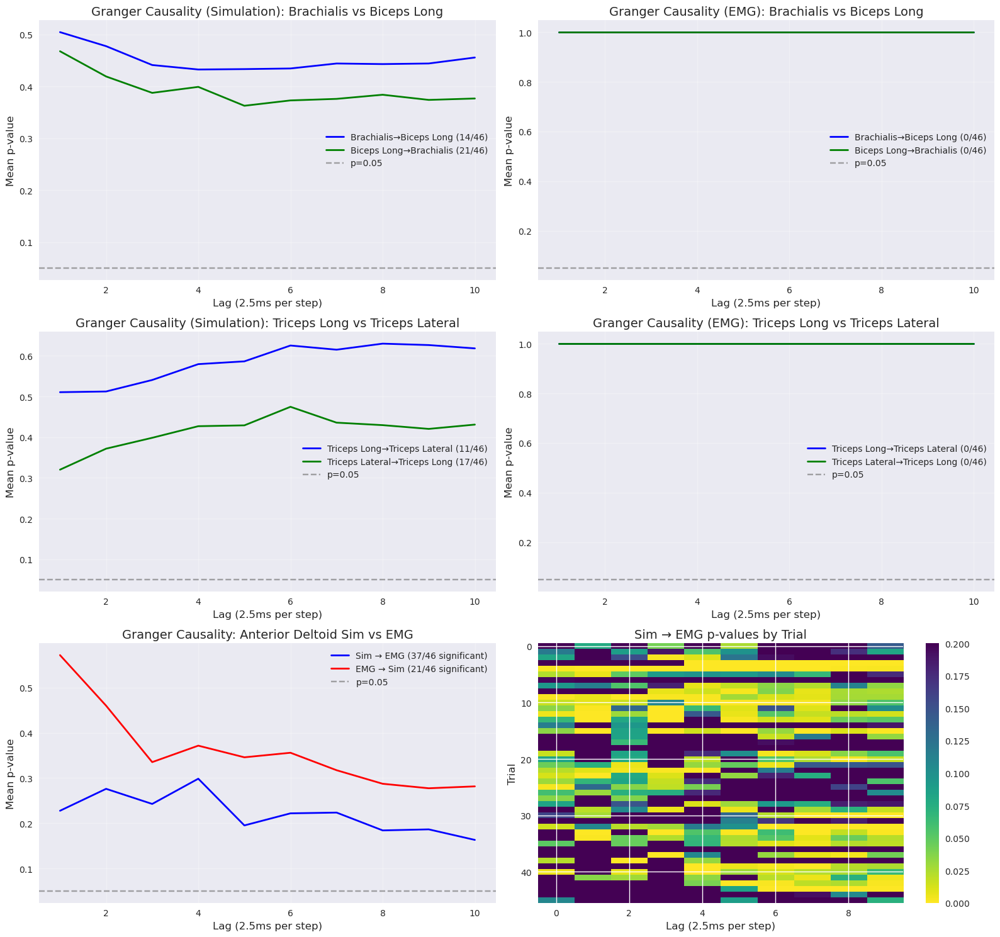


--- GRANGER CAUSALITY SUMMARY ---


,Pair,Sim Dominant Direction,EMG Dominant Direction,Direction Match,Agreement Ratio,Agreement Percentage,Sim M1→M2 Significant,Sim M2→M1 Significant,EMG M1→M2 Significant,EMG M2→M1 Significant,Sim→EMG Mean p-value,EMG→Sim Mean p-value,Sim→EMG Significant Trials,EMG→Sim Significant Trials,Total Trials,Most Significant Direction,Most Common Lag
0,Brachialis vs Biceps Long,Biceps Long→Brachialis,Biceps Long→Brachialis,Yes,24/46,52.2%,14.0,21.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Triceps Long vs Triceps Lateral,Triceps Lateral→Triceps Long,Triceps Lateral→Triceps Long,Yes,33/46,71.7%,11.0,17.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Anterior Deltoid Sim vs EMG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.163188,0.277484,37.0,21.0,46.0,Sim→EMG,10.0



--- CROSS-CORRELATION ANALYSIS ---

Computing cross-correlation for Brachialis vs Biceps Long...

Computing cross-correlation for Triceps Long vs Triceps Lateral...

Computing cross-correlation for Anterior Deltoid vs Anterior Deltoid...


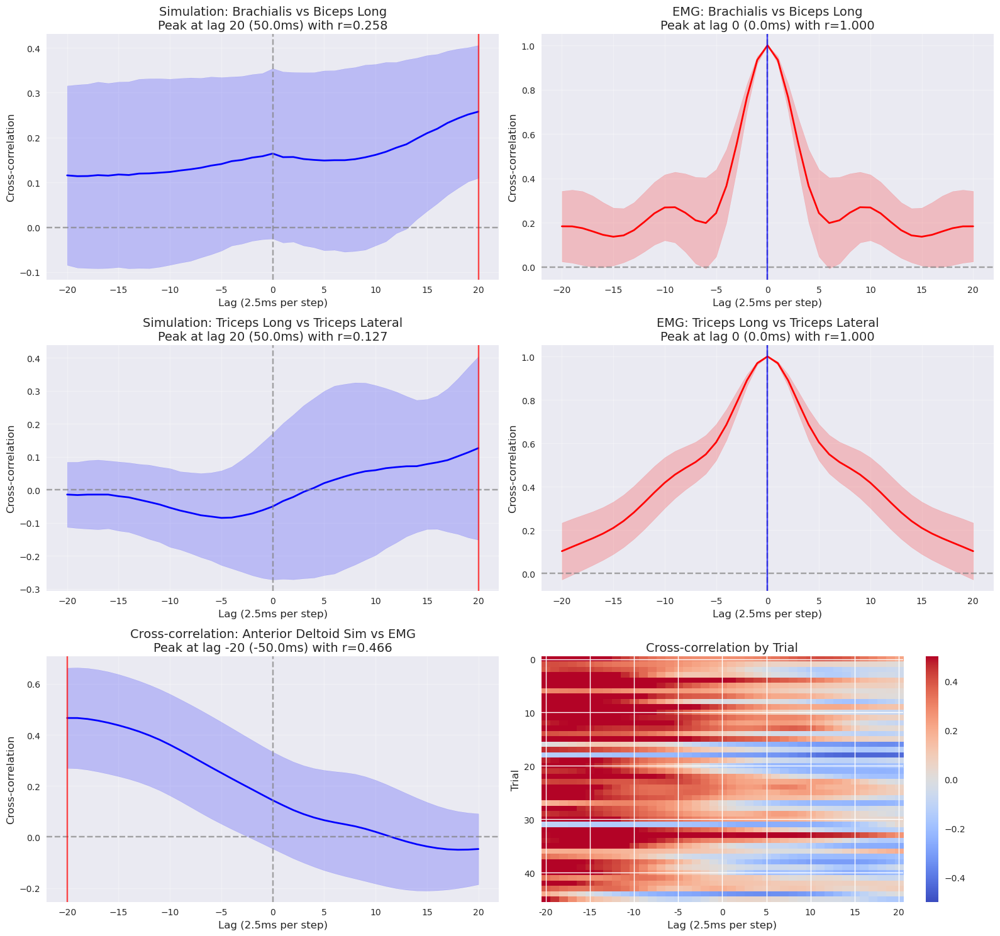


--- CROSS-CORRELATION SUMMARY ---


,Pair,Sim Peak Lag,EMG Peak Lag,Sim Peak Lag (ms),EMG Peak Lag (ms),Sim Peak Correlation,EMG Peak Correlation,Lag Difference (ms),Correlation Similarity,Peak Lag,Peak Lag (ms),Peak Correlation
0,Brachialis vs Biceps Long,20.0,0.0,50.0,0.0,0.257680,1.0,50.0,25.8%,NaN,NaN,NaN
1,Triceps Long vs Triceps Lateral,20.0,0.0,50.0,0.0,0.126528,1.0,50.0,12.7%,NaN,NaN,NaN
2,Anterior Deltoid Sim vs EMG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-20.0,-50.0,0.466153



--- OVERALL CONCLUSION ---
1. Granger Causality Analysis:
  - Brachialis vs Biceps Long:
    Simulated: Biceps Long→Brachialis is dominant
    EMG: Biceps Long→Brachialis is dominant
    Direction match: Yes
    Trial agreement: 24/46 (52.2%)
  - Triceps Long vs Triceps Lateral:
    Simulated: Triceps Lateral→Triceps Long is dominant
    EMG: Triceps Lateral→Triceps Long is dominant
    Direction match: Yes
    Trial agreement: 33/46 (71.7%)
  - Anterior Deltoid Sim vs EMG: Most significant direction is Sim→EMG (at lag 10 = 25.0ms)
    Significant trials: Sim→EMG: 37/46, EMG→Sim: 21/46

2. Cross-correlation Analysis:
  - Brachialis vs Biceps Long:
    Simulated: Peak at 50.0ms with r=0.258
    EMG: Peak at 0.0ms with r=1.000
    Lag difference: 50.0ms
    Correlation similarity: 25.8%
  - Triceps Long vs Triceps Lateral:
    Simulated: Peak at 50.0ms with r=0.127
    EMG: Peak at 0.0ms with r=1.000
    Lag difference: 50.0ms
    Correlation similarity: 12.7%
  - Anterior Deltoid Sim v

In [18]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
import seaborn as sns
from statsmodels.tsa.stattools import grangercausalitytests
import warnings
warnings.filterwarnings('ignore')  # Suppress some statsmodels warnings

# ------------- DEFINE NECESSARY VARIABLES AND FUNCTIONS -------------
# Load the trial data (main CSV with reach indices)
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')

# Create trial mask: valid trials have non-zero, non-NaN start and end values
trial_mask = (
    (df['start'].notna()) & 
    (df['end'].notna()) & 
    (df['start'] > 0) & 
    (df['end'] > 0) &
    (df['start'] != df['end'])  # Make sure start != end
)

# Get the valid trials
valid_trials_df = df[trial_mask].copy()

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20  # High pass cutoff frequency in Hz
lowpass_cutoff = 1000  # Low pass cutoff frequency in Hz
envelope_cutoff = 50  # Envelope cutoff frequency in Hz
filter_order = 4  # Butterworth filter order

# Calculate downsampling parameters
target_fs = 400  # Target sampling rate to match simulation
downsample_factor = fs // target_fs  # 30000 // 400 = 75 samples per chunk
target_samples = 200  # Number of samples we want (to match simulation)

# Define function to process EMG data
def process_emg_data_individual_trials(emg_file_path):
    """Process EMG data and return individual trial envelopes"""
    emg_data = pd.read_csv(emg_file_path, header=None)
    print(f"    Loaded EMG data: {len(emg_data)} trials")
    
    reach_envelopes_downsampled = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        trial_num = idx
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + 15000  # 0.5 seconds
        
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Downsample by averaging chunks
                    n_samples = len(reach_envelope)
                    n_chunks = n_samples // downsample_factor
                    trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]
                    reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
                    downsampled_envelope = np.mean(reshaped, axis=1)
                    
                    # Only keep if we have the target number of samples
                    if len(downsampled_envelope) >= target_samples:
                        downsampled_envelope = downsampled_envelope[:target_samples]
                        reach_envelopes_downsampled.append(downsampled_envelope)
                        
                        if i < 5:  # Debug info for first few trials
                            print(f"      Trial {trial_num}: {n_samples} → {len(downsampled_envelope)} samples")
        else:
            print(f"      Trial {trial_num}: EMG data index out of range")
    
    if not reach_envelopes_downsampled:
        return None
    
    # Convert to numpy array
    envelopes_array = np.array(reach_envelopes_downsampled)
    print(f"    Final EMG data shape: {envelopes_array.shape}")
    
    # Normalize by the 98th percentile of all observed values
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    print(f"    EMG normalization: 98th percentile = {norm_value:.6f}")
    
    return normalized_envelopes

# ------------- COLLECT DATA -------------
print("Collecting data for analysis...")

# For simulated data, we already have the actions array loaded
sim_data = []
emg_data = []

# Get the number of clips from the actions array
n_clips, T, _ = actions.shape
print(f"Using {n_clips} clips and {T} timesteps for analysis")

# Collect muscle indices for easier reference
muscle_indices = {}
muscle_names = []

# Process each muscle in the configuration
for muscle_idx, sim_name, emg_file, emg_name in MUSCLE_CONFIGS:
    print(f"Processing {sim_name} vs {emg_name}...")
    
    # Get simulated data for this muscle
    sim_traces = actions[:, :, muscle_idx]  # Shape: (n_clips, T)
    
    # Get EMG data for this muscle
    emg_traces = process_emg_data_individual_trials(emg_file)
    
    if emg_traces is not None and len(emg_traces) == n_clips:
        sim_data.append(sim_traces)
        emg_data.append(emg_traces)
        muscle_indices[sim_name] = len(muscle_names)  # Store index for this muscle
        muscle_names.append(sim_name)
        print(f"✓ Added {sim_name}/{emg_name} data: {sim_traces.shape}")
    else:
        print(f"✗ Skipping {sim_name}/{emg_name} - data issue")

# Convert to arrays and reshape
if len(sim_data) > 0 and len(emg_data) > 0:
    # Stack arrays along the muscles dimension
    sim_data = np.stack(sim_data, axis=2)  # Shape: (n_clips, T, n_muscles)
    emg_data = np.stack(emg_data, axis=2)  # Shape: (n_clips, T, n_muscles)

    print(f"Final simulated data shape: {sim_data.shape}")
    print(f"Final EMG data shape: {emg_data.shape}")
    
    n_clips, T, n_muscles = sim_data.shape
    
    # Define muscle pairs for comparison - just the specific ones requested
    muscle_pairs = []
    
    # Add Biceps to Biceps Long if both exist
    if 'Brachialis' in muscle_indices and 'Biceps Long' in muscle_indices:
        muscle_pairs.append(('Brachialis', 'Biceps Long'))
    
    # Add Triceps to Triceps Lateral if both exist
    if 'Triceps Long' in muscle_indices and 'Triceps Lateral' in muscle_indices:
        muscle_pairs.append(('Triceps Long', 'Triceps Lateral'))
    
    # Add Anterior Deltoid comparison
    if 'Anterior Deltoid' in muscle_indices:
        muscle_pairs.append(('Anterior Deltoid', 'Anterior Deltoid'))
    
    # Check if we have all the muscles we need
    if len(muscle_pairs) < 3:
        print(f"Warning: Could only find {len(muscle_pairs)} of the 3 requested muscle pairs")
    
    # ------------- GRANGER CAUSALITY ANALYSIS -------------
    print("\n--- GRANGER CAUSALITY ANALYSIS ---")
    
    # Define maximum lag to test (about 25-50ms is physiologically plausible)
    max_lag = 10  # 10 timesteps at 400Hz = 25ms
    
    # Function to run Granger causality tests
    def run_granger_tests(data1, data2, max_lag=10):
        # Combine data into a DataFrame
        df = pd.DataFrame({
            'x': data1,
            'y': data2
        })
        
        # Run Granger tests x → y
        x_causes_y = grangercausalitytests(df[['y', 'x']], maxlag=max_lag, verbose=False)
        
        # Run Granger tests y → x
        y_causes_x = grangercausalitytests(df[['x', 'y']], maxlag=max_lag, verbose=False)
        
        # Extract F-test p-values for each lag
        x_to_y_pvals = [x_causes_y[i+1][0]['ssr_ftest'][1] for i in range(max_lag)]
        y_to_x_pvals = [y_causes_x[i+1][0]['ssr_ftest'][1] for i in range(max_lag)]
        
        return x_to_y_pvals, y_to_x_pvals
    
    # Set up figure for results
    n_pairs = len(muscle_pairs)
    fig, axes = plt.subplots(n_pairs, 2, figsize=(16, 5*n_pairs))
    
    # If we have only one pair, make axes 2D for easier indexing
    if n_pairs == 1:
        axes = np.array([axes]).reshape(1, 2)
    
    # For storing summary results
    summary_results = []
    
    # Process each muscle pair
    for pair_idx, (muscle1, muscle2) in enumerate(muscle_pairs):
        print(f"\nAnalyzing {muscle1} vs {muscle2}...")
        
        # Special case for self-comparison (Anterior Deltoid)
        if muscle1 == muscle2:
            # Compare simulated vs EMG for the same muscle
            idx = muscle_indices[muscle1]
            
            # Run tests for each trial
            all_sim_to_emg_pvals = []
            all_emg_to_sim_pvals = []
            significant_trials = {'sim_to_emg': 0, 'emg_to_sim': 0}
            
            for trial in range(n_clips):
                sim_muscle = sim_data[trial, :, idx]
                emg_muscle = emg_data[trial, :, idx]
                
                # Run Granger tests
                sim_to_emg_pvals, emg_to_sim_pvals = run_granger_tests(sim_muscle, emg_muscle, max_lag)
                
                all_sim_to_emg_pvals.append(sim_to_emg_pvals)
                all_emg_to_sim_pvals.append(emg_to_sim_pvals)
                
                # Count significant trials (p < 0.05 at any lag)
                if np.min(sim_to_emg_pvals) < 0.05:
                    significant_trials['sim_to_emg'] += 1
                if np.min(emg_to_sim_pvals) < 0.05:
                    significant_trials['emg_to_sim'] += 1
            
            # Convert to arrays for easier analysis
            all_sim_to_emg_pvals = np.array(all_sim_to_emg_pvals)  # (n_clips, max_lag)
            all_emg_to_sim_pvals = np.array(all_emg_to_sim_pvals)  # (n_clips, max_lag)
            
            # Calculate mean p-values across trials
            mean_sim_to_emg_pvals = np.mean(all_sim_to_emg_pvals, axis=0)
            mean_emg_to_sim_pvals = np.mean(all_emg_to_sim_pvals, axis=0)
            
            # Plot results
            lag_range = np.arange(1, max_lag+1)
            
            # Plot mean p-values
            ax = axes[pair_idx, 0]
            ax.plot(lag_range, mean_sim_to_emg_pvals, 'b-', linewidth=2, 
                    label=f'Sim → EMG ({significant_trials["sim_to_emg"]}/{n_clips} significant)')
            ax.plot(lag_range, mean_emg_to_sim_pvals, 'r-', linewidth=2, 
                    label=f'EMG → Sim ({significant_trials["emg_to_sim"]}/{n_clips} significant)')
            ax.axhline(0.05, color='gray', linestyle='--', alpha=0.7, label='p=0.05')
            ax.set_xlabel('Lag (2.5ms per step)', fontsize=12)
            ax.set_ylabel('Mean p-value', fontsize=12)
            ax.set_title(f'Granger Causality: {muscle1} Sim vs EMG', fontsize=14)
            ax.grid(True, alpha=0.3)
            ax.legend()
            
            # Plot heatmap of p-values across trials for Sim → EMG
            ax = axes[pair_idx, 1]
            im = ax.imshow(all_sim_to_emg_pvals, aspect='auto', cmap='viridis_r', 
                         vmin=0, vmax=0.2)
            ax.set_xlabel('Lag (2.5ms per step)', fontsize=12)
            ax.set_ylabel('Trial', fontsize=12)
            ax.set_title(f'Sim → EMG p-values by Trial', fontsize=14)
            plt.colorbar(im, ax=ax)
            
            # Add to summary results
            summary_results.append({
                'Pair': f"{muscle1} Sim vs EMG",
                'Sim→EMG Mean p-value': np.min(mean_sim_to_emg_pvals),
                'EMG→Sim Mean p-value': np.min(mean_emg_to_sim_pvals),
                'Sim→EMG Significant Trials': significant_trials['sim_to_emg'],
                'EMG→Sim Significant Trials': significant_trials['emg_to_sim'],
                'Total Trials': n_clips,
                'Most Significant Direction': 'Sim→EMG' if np.min(mean_sim_to_emg_pvals) < np.min(mean_emg_to_sim_pvals) else 'EMG→Sim',
                'Most Common Lag': np.argmin(mean_sim_to_emg_pvals) + 1 if np.min(mean_sim_to_emg_pvals) < np.min(mean_emg_to_sim_pvals) else np.argmin(mean_emg_to_sim_pvals) + 1
            })
            
        else:
            # Compare two different muscles
            idx1 = muscle_indices[muscle1]
            idx2 = muscle_indices[muscle2]
            
            # Run tests for simulated data
            all_sim_m1_to_m2_pvals = []
            all_sim_m2_to_m1_pvals = []
            sim_significant_trials = {'m1_to_m2': 0, 'm2_to_m1': 0}
            
            # Run tests for EMG data
            all_emg_m1_to_m2_pvals = []
            all_emg_m2_to_m1_pvals = []
            emg_significant_trials = {'m1_to_m2': 0, 'm2_to_m1': 0}
            
            for trial in range(n_clips):
                # Simulated data
                sim_m1 = sim_data[trial, :, idx1]
                sim_m2 = sim_data[trial, :, idx2]
                
                # EMG data
                emg_m1 = emg_data[trial, :, idx1]
                emg_m2 = emg_data[trial, :, idx2]
                
                # Run Granger tests for simulated data
                sim_m1_to_m2_pvals, sim_m2_to_m1_pvals = run_granger_tests(sim_m1, sim_m2, max_lag)
                
                # Run Granger tests for EMG data
                emg_m1_to_m2_pvals, emg_m2_to_m1_pvals = run_granger_tests(emg_m1, emg_m2, max_lag)
                
                # Store results
                all_sim_m1_to_m2_pvals.append(sim_m1_to_m2_pvals)
                all_sim_m2_to_m1_pvals.append(sim_m2_to_m1_pvals)
                all_emg_m1_to_m2_pvals.append(emg_m1_to_m2_pvals)
                all_emg_m2_to_m1_pvals.append(emg_m2_to_m1_pvals)
                
                # Count significant trials (p < 0.05 at any lag)
                if np.min(sim_m1_to_m2_pvals) < 0.05:
                    sim_significant_trials['m1_to_m2'] += 1
                if np.min(sim_m2_to_m1_pvals) < 0.05:
                    sim_significant_trials['m2_to_m1'] += 1
                if np.min(emg_m1_to_m2_pvals) < 0.05:
                    emg_significant_trials['m1_to_m2'] += 1
                if np.min(emg_m2_to_m1_pvals) < 0.05:
                    emg_significant_trials['m2_to_m1'] += 1
            
            # Convert to arrays
            all_sim_m1_to_m2_pvals = np.array(all_sim_m1_to_m2_pvals)
            all_sim_m2_to_m1_pvals = np.array(all_sim_m2_to_m1_pvals)
            all_emg_m1_to_m2_pvals = np.array(all_emg_m1_to_m2_pvals)
            all_emg_m2_to_m1_pvals = np.array(all_emg_m2_to_m1_pvals)
            
            # Calculate mean p-values
            mean_sim_m1_to_m2_pvals = np.mean(all_sim_m1_to_m2_pvals, axis=0)
            mean_sim_m2_to_m1_pvals = np.mean(all_sim_m2_to_m1_pvals, axis=0)
            mean_emg_m1_to_m2_pvals = np.mean(all_emg_m1_to_m2_pvals, axis=0)
            mean_emg_m2_to_m1_pvals = np.mean(all_emg_m2_to_m1_pvals, axis=0)
            
            # Plot results
            lag_range = np.arange(1, max_lag+1)
            
            # Plot mean p-values for simulated data
            ax = axes[pair_idx, 0]
            ax.plot(lag_range, mean_sim_m1_to_m2_pvals, 'b-', linewidth=2, 
                    label=f'{muscle1}→{muscle2} ({sim_significant_trials["m1_to_m2"]}/{n_clips})')
            ax.plot(lag_range, mean_sim_m2_to_m1_pvals, 'g-', linewidth=2, 
                    label=f'{muscle2}→{muscle1} ({sim_significant_trials["m2_to_m1"]}/{n_clips})')
            ax.axhline(0.05, color='gray', linestyle='--', alpha=0.7, label='p=0.05')
            ax.set_xlabel('Lag (2.5ms per step)', fontsize=12)
            ax.set_ylabel('Mean p-value', fontsize=12)
            ax.set_title(f'Granger Causality (Simulation): {muscle1} vs {muscle2}', fontsize=14)
            ax.grid(True, alpha=0.3)
            ax.legend()
            
            # Plot mean p-values for EMG data
            ax = axes[pair_idx, 1]
            ax.plot(lag_range, mean_emg_m1_to_m2_pvals, 'b-', linewidth=2, 
                    label=f'{muscle1}→{muscle2} ({emg_significant_trials["m1_to_m2"]}/{n_clips})')
            ax.plot(lag_range, mean_emg_m2_to_m1_pvals, 'g-', linewidth=2, 
                    label=f'{muscle2}→{muscle1} ({emg_significant_trials["m2_to_m1"]}/{n_clips})')
            ax.axhline(0.05, color='gray', linestyle='--', alpha=0.7, label='p=0.05')
            ax.set_xlabel('Lag (2.5ms per step)', fontsize=12)
            ax.set_ylabel('Mean p-value', fontsize=12)
            ax.set_title(f'Granger Causality (EMG): {muscle1} vs {muscle2}', fontsize=14)
            ax.grid(True, alpha=0.3)
            ax.legend()
            
            # Calculate dominant direction
            sim_dominant = 'm1_to_m2' if np.min(mean_sim_m1_to_m2_pvals) < np.min(mean_sim_m2_to_m1_pvals) else 'm2_to_m1'
            emg_dominant = 'm1_to_m2' if np.min(mean_emg_m1_to_m2_pvals) < np.min(mean_emg_m2_to_m1_pvals) else 'm2_to_m1'
            direction_match = sim_dominant == emg_dominant
            
            # Calculate the most significant direction for each trial
            sim_direction = np.where(np.min(all_sim_m1_to_m2_pvals, axis=1) < np.min(all_sim_m2_to_m1_pvals, axis=1), 1, -1)  # 1: m1→m2, -1: m2→m1
            emg_direction = np.where(np.min(all_emg_m1_to_m2_pvals, axis=1) < np.min(all_emg_m2_to_m1_pvals, axis=1), 1, -1)  # 1: m1→m2, -1: m2→m1
            
            # Count agreement
            agreement = np.sum(sim_direction == emg_direction)
            disagreement = n_clips - agreement
            
            # Add to summary results
            summary_results.append({
                'Pair': f"{muscle1} vs {muscle2}",
                'Sim Dominant Direction': f"{muscle1}→{muscle2}" if sim_dominant == 'm1_to_m2' else f"{muscle2}→{muscle1}",
                'EMG Dominant Direction': f"{muscle1}→{muscle2}" if emg_dominant == 'm1_to_m2' else f"{muscle2}→{muscle1}",
                'Direction Match': 'Yes' if direction_match else 'No',
                'Agreement Ratio': f"{agreement}/{n_clips}",
                'Agreement Percentage': f"{100*agreement/n_clips:.1f}%",
                'Sim M1→M2 Significant': sim_significant_trials['m1_to_m2'],
                'Sim M2→M1 Significant': sim_significant_trials['m2_to_m1'],
                'EMG M1→M2 Significant': emg_significant_trials['m1_to_m2'],
                'EMG M2→M1 Significant': emg_significant_trials['m2_to_m1']
            })
    
    plt.tight_layout()
    plt.show()
    
    # ------------- SUMMARY TABLE -------------
    print("\n--- GRANGER CAUSALITY SUMMARY ---")
    summary_df = pd.DataFrame(summary_results)
    display(summary_df)
    
    # ------------- CROSS-CORRELATION ANALYSIS -------------
    print("\n--- CROSS-CORRELATION ANALYSIS ---")
    
    # Function to calculate cross-correlation
    def compute_xcorr(x, y, max_lag=20):
        """Compute cross-correlation with positive and negative lags"""
        corr = np.correlate(x - np.mean(x), y - np.mean(y), mode='full')
        corr = corr / (np.std(x) * np.std(y) * len(x))  # Normalize
        lags = np.arange(-max_lag, max_lag + 1)
        mid = len(corr) // 2
        return corr[mid-max_lag:mid+max_lag+1], lags
    
    # Set up figure for results
    fig, axes = plt.subplots(n_pairs, 2, figsize=(16, 5*n_pairs))
    
    # If we have only one pair, make axes 2D for easier indexing
    if n_pairs == 1:
        axes = np.array([axes]).reshape(1, 2)
    
    # For storing cross-correlation results
    xcorr_results = []
    
    # Process each muscle pair
    for pair_idx, (muscle1, muscle2) in enumerate(muscle_pairs):
        print(f"\nComputing cross-correlation for {muscle1} vs {muscle2}...")
        
        max_lag = 20  # Maximum lag to consider (±50ms)
        
        if muscle1 == muscle2:
            # Compare simulated vs EMG for the same muscle
            idx = muscle_indices[muscle1]
            
            # Compute cross-correlation for each trial
            all_xcorr = []
            
            for trial in range(n_clips):
                sim_muscle = sim_data[trial, :, idx]
                emg_muscle = emg_data[trial, :, idx]
                
                # Compute cross-correlation
                xcorr, lags = compute_xcorr(sim_muscle, emg_muscle, max_lag)
                
                all_xcorr.append(xcorr)
            
            # Convert to arrays
            all_xcorr = np.array(all_xcorr)  # (n_clips, 2*max_lag+1)
            
            # Calculate mean cross-correlation
            mean_xcorr = np.mean(all_xcorr, axis=0)
            std_xcorr = np.std(all_xcorr, axis=0)
            
            # Find peak lag - FIX: use lags directly
            peak_idx = np.argmax(np.abs(mean_xcorr))
            peak_lag = lags[peak_idx]
            peak_corr = mean_xcorr[peak_idx]
            
            # Plot mean cross-correlation
            ax = axes[pair_idx, 0]
            ax.plot(lags, mean_xcorr, 'b-', linewidth=2)
            ax.fill_between(lags, mean_xcorr - std_xcorr, mean_xcorr + std_xcorr, 
                           color='blue', alpha=0.2)
            ax.axhline(0, color='gray', linestyle='--', alpha=0.7)
            ax.axvline(0, color='gray', linestyle='--', alpha=0.7)
            ax.axvline(peak_lag, color='red', linestyle='-', alpha=0.7)
            ax.set_xlabel('Lag (2.5ms per step)', fontsize=12)
            ax.set_ylabel('Cross-correlation', fontsize=12)
            ax.set_title(f'Cross-correlation: {muscle1} Sim vs EMG\nPeak at lag {peak_lag} ({peak_lag*2.5:.1f}ms) with r={peak_corr:.3f}', fontsize=14)
            ax.grid(True, alpha=0.3)
            
            # Plot heatmap of cross-correlations across trials
            ax = axes[pair_idx, 1]
            im = ax.imshow(all_xcorr, aspect='auto', cmap='coolwarm', 
                         vmin=-0.5, vmax=0.5)
            ax.set_xlabel('Lag (2.5ms per step)', fontsize=12)
            ax.set_ylabel('Trial', fontsize=12)
            ax.set_xticks(np.arange(0, 2*max_lag+1, 5))
            ax.set_xticklabels([str(lag) for lag in lags[::5]])
            ax.set_title(f'Cross-correlation by Trial', fontsize=14)
            plt.colorbar(im, ax=ax)
            
            # Add to results
            xcorr_results.append({
                'Pair': f"{muscle1} Sim vs EMG",
                'Peak Lag': peak_lag,
                'Peak Lag (ms)': peak_lag*2.5,
                'Peak Correlation': peak_corr
            })
            
        else:
            # Compare two different muscles
            idx1 = muscle_indices[muscle1]
            idx2 = muscle_indices[muscle2]
            
            # Compute cross-correlation for simulated and EMG data
            all_sim_xcorr = []
            all_emg_xcorr = []
            
            for trial in range(n_clips):
                # Simulated data
                sim_m1 = sim_data[trial, :, idx1]
                sim_m2 = sim_data[trial, :, idx2]
                
                # EMG data
                emg_m1 = emg_data[trial, :, idx1]
                emg_m2 = emg_data[trial, :, idx2]
                
                # Compute cross-correlations
                sim_xcorr, sim_lags = compute_xcorr(sim_m1, sim_m2, max_lag)
                emg_xcorr, emg_lags = compute_xcorr(emg_m1, emg_m2, max_lag)
                
                all_sim_xcorr.append(sim_xcorr)
                all_emg_xcorr.append(emg_xcorr)
            
            # Convert to arrays
            all_sim_xcorr = np.array(all_sim_xcorr)
            all_emg_xcorr = np.array(all_emg_xcorr)
            
            # Calculate mean cross-correlations
            mean_sim_xcorr = np.mean(all_sim_xcorr, axis=0)
            std_sim_xcorr = np.std(all_sim_xcorr, axis=0)
            mean_emg_xcorr = np.mean(all_emg_xcorr, axis=0)
            std_emg_xcorr = np.std(all_emg_xcorr, axis=0)
            
            # Find peak lags - FIX: use lags directly
            sim_peak_idx = np.argmax(np.abs(mean_sim_xcorr))
            sim_peak_lag = sim_lags[sim_peak_idx]
            sim_peak_corr = mean_sim_xcorr[sim_peak_idx]
            
            emg_peak_idx = np.argmax(np.abs(mean_emg_xcorr))
            emg_peak_lag = emg_lags[emg_peak_idx]
            emg_peak_corr = mean_emg_xcorr[emg_peak_idx]
            
            # Plot mean cross-correlations
            ax = axes[pair_idx, 0]
            ax.plot(sim_lags, mean_sim_xcorr, 'b-', linewidth=2)
            ax.fill_between(sim_lags, mean_sim_xcorr - std_sim_xcorr, mean_sim_xcorr + std_sim_xcorr, 
                           color='blue', alpha=0.2)
            ax.axhline(0, color='gray', linestyle='--', alpha=0.7)
            ax.axvline(0, color='gray', linestyle='--', alpha=0.7)
            ax.axvline(sim_peak_lag, color='red', linestyle='-', alpha=0.7)
            ax.set_xlabel('Lag (2.5ms per step)', fontsize=12)
            ax.set_ylabel('Cross-correlation', fontsize=12)
            ax.set_title(f'Simulation: {muscle1} vs {muscle2}\nPeak at lag {sim_peak_lag} ({sim_peak_lag*2.5:.1f}ms) with r={sim_peak_corr:.3f}', fontsize=14)
            ax.grid(True, alpha=0.3)
            
            ax = axes[pair_idx, 1]
            ax.plot(emg_lags, mean_emg_xcorr, 'r-', linewidth=2)
            ax.fill_between(emg_lags, mean_emg_xcorr - std_emg_xcorr, mean_emg_xcorr + std_emg_xcorr, 
                           color='red', alpha=0.2)
            ax.axhline(0, color='gray', linestyle='--', alpha=0.7)
            ax.axvline(0, color='gray', linestyle='--', alpha=0.7)
            ax.axvline(emg_peak_lag, color='blue', linestyle='-', alpha=0.7)
            ax.set_xlabel('Lag (2.5ms per step)', fontsize=12)
            ax.set_ylabel('Cross-correlation', fontsize=12)
            ax.set_title(f'EMG: {muscle1} vs {muscle2}\nPeak at lag {emg_peak_lag} ({emg_peak_lag*2.5:.1f}ms) with r={emg_peak_corr:.3f}', fontsize=14)
            ax.grid(True, alpha=0.3)
            
            # Add to results
            xcorr_results.append({
                'Pair': f"{muscle1} vs {muscle2}",
                'Sim Peak Lag': sim_peak_lag,
                'EMG Peak Lag': emg_peak_lag,
                'Sim Peak Lag (ms)': sim_peak_lag*2.5,
                'EMG Peak Lag (ms)': emg_peak_lag*2.5,
                'Sim Peak Correlation': sim_peak_corr,
                'EMG Peak Correlation': emg_peak_corr,
                'Lag Difference (ms)': abs(sim_peak_lag - emg_peak_lag)*2.5,
                'Correlation Similarity': f"{100*min(abs(sim_peak_corr), abs(emg_peak_corr))/max(abs(sim_peak_corr), abs(emg_peak_corr)):.1f}%"
            })
    
    plt.tight_layout()
    plt.show()
    
    # ------------- SUMMARY OF CROSS-CORRELATION RESULTS -------------
    print("\n--- CROSS-CORRELATION SUMMARY ---")
    xcorr_df = pd.DataFrame(xcorr_results)
    display(xcorr_df)
    
    # ------------- OVERALL CONCLUSION -------------
    print("\n--- OVERALL CONCLUSION ---")
    print("1. Granger Causality Analysis:")
    for result in summary_results:
        if "vs EMG" in result['Pair']:
            # For Anterior Deltoid (sim vs EMG)
            print(f"  - {result['Pair']}: Most significant direction is {result['Most Significant Direction']} (at lag {result['Most Common Lag']} = {result['Most Common Lag']*2.5:.1f}ms)")
            print(f"    Significant trials: Sim→EMG: {result['Sim→EMG Significant Trials']}/{result['Total Trials']}, EMG→Sim: {result['EMG→Sim Significant Trials']}/{result['Total Trials']}")
        else:
            # For muscle pairs
            print(f"  - {result['Pair']}:")
            print(f"    Simulated: {result['Sim Dominant Direction']} is dominant")
            print(f"    EMG: {result['EMG Dominant Direction']} is dominant")
            print(f"    Direction match: {result['Direction Match']}")
            print(f"    Trial agreement: {result['Agreement Ratio']} ({result['Agreement Percentage']})")
    
    print("\n2. Cross-correlation Analysis:")
    for result in xcorr_results:
        if "Sim vs EMG" in result['Pair']:
            # For Anterior Deltoid (sim vs EMG)
            print(f"  - {result['Pair']}: Peak correlation at lag {result['Peak Lag']} ({result['Peak Lag (ms)']:.1f}ms) with r={result['Peak Correlation']:.3f}")
        else:
            # For muscle pairs
            print(f"  - {result['Pair']}:")
            print(f"    Simulated: Peak at {result['Sim Peak Lag (ms)']:.1f}ms with r={result['Sim Peak Correlation']:.3f}")
            # Print remaining EMG results
            print(f"    EMG: Peak at {result['EMG Peak Lag (ms)']:.1f}ms with r={result['EMG Peak Correlation']:.3f}")
            print(f"    Lag difference: {result['Lag Difference (ms)']:.1f}ms")
            print(f"    Correlation similarity: {result['Correlation Similarity']}")
    
    print("\n3. Interpretation:")
    print("  - A positive lag in cross-correlation means the first muscle's activity precedes the second muscle's.")
    print("  - For Granger causality, significance indicates the first muscle's activity helps predict the second's.")
    print("  - Agreement between simulated and EMG data suggests the model captures the true muscle relationships.")
    print("  - Disagreement may indicate areas where the model differs from actual muscle coordination patterns.")
    
else:
    print("No valid data collected for analysis.")

Using 46 clips and 200 timesteps for analysis
Processing Anterior Deltoid vs Anterior Deltoid...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.009499
✓ Added Anterior Deltoid/Anterior Deltoid data: (46, 200)
Processing Triceps Lateral vs Triceps...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.017279
✓ Added Triceps Lateral/Triceps data: (46, 200)
Processing Triceps Long vs Triceps...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samp

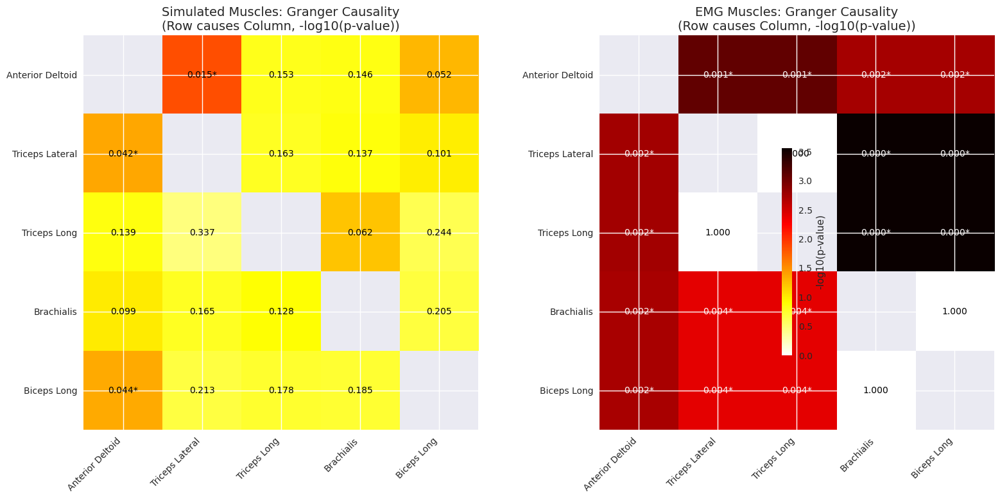

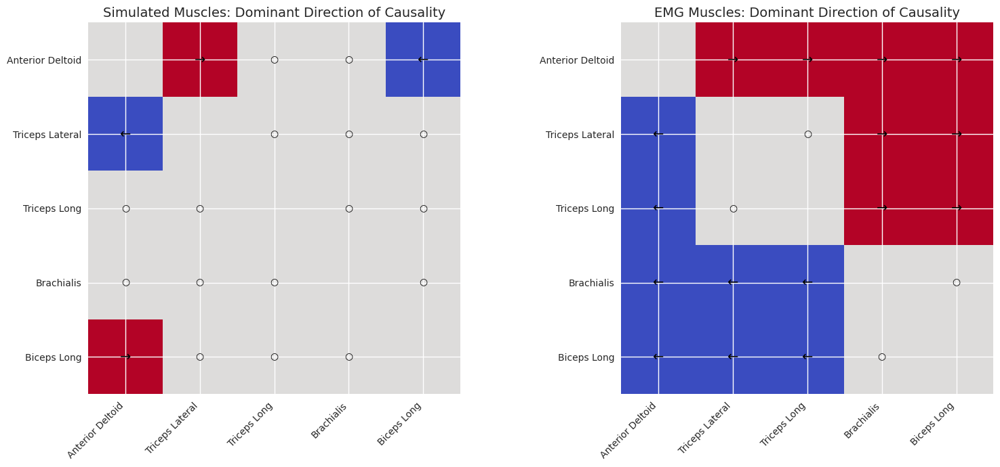


--- CROSS-CORRELATION MATRICES ---


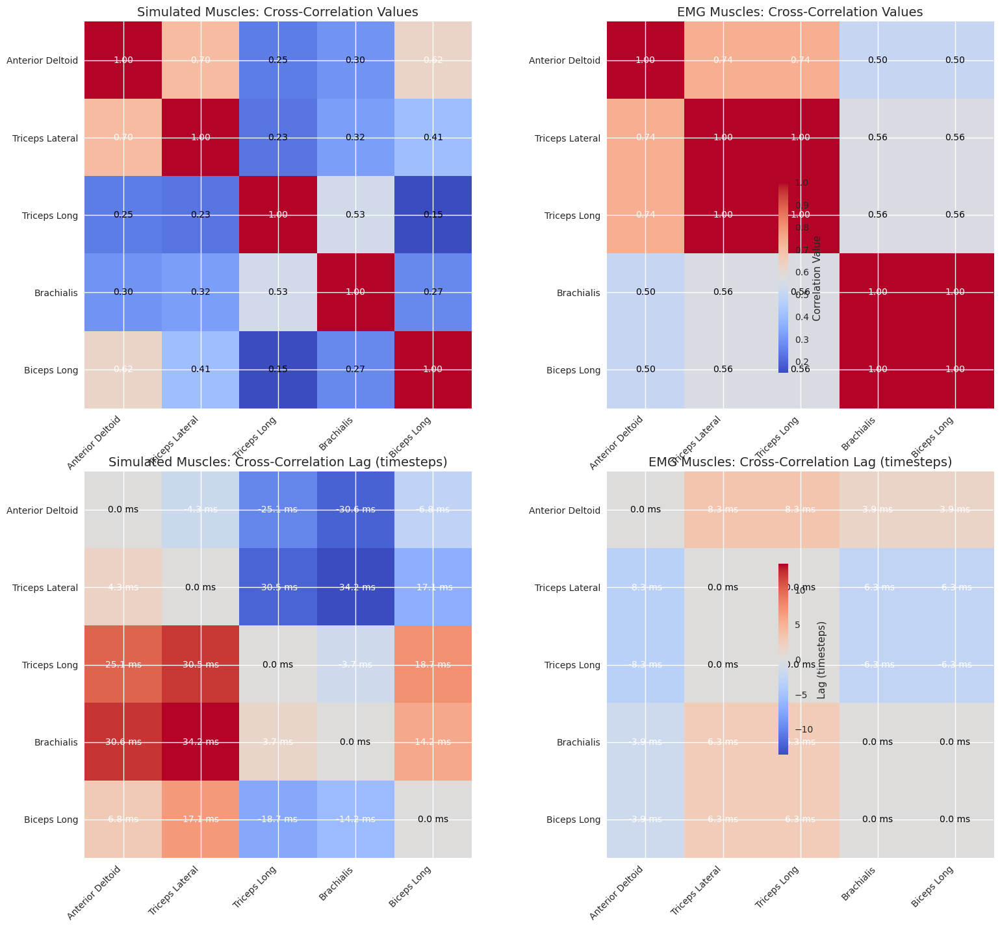


--- SIMILARITY BETWEEN SIMULATION AND EMG ---
Granger causality matrix similarity: 0.718
Cross-correlation value matrix similarity: 0.418
Cross-correlation lag matrix similarity: -0.130
Matching dominant direction: 6/20 pairs (30.0%)


In [19]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
import seaborn as sns
from statsmodels.tsa.stattools import grangercausalitytests
import warnings
warnings.filterwarnings('ignore')  # Suppress some statsmodels warnings

# ------------- DEFINE NECESSARY VARIABLES AND FUNCTIONS -------------
# Load the trial data (main CSV with reach indices)
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')

# Create trial mask: valid trials have non-zero, non-NaN start and end values
trial_mask = (
    (df['start'].notna()) & 
    (df['end'].notna()) & 
    (df['start'] > 0) & 
    (df['end'] > 0) &
    (df['start'] != df['end'])  # Make sure start != end
)

# Get the valid trials
valid_trials_df = df[trial_mask].copy()

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20  # High pass cutoff frequency in Hz
lowpass_cutoff = 1000  # Low pass cutoff frequency in Hz
envelope_cutoff = 50  # Envelope cutoff frequency in Hz
filter_order = 4  # Butterworth filter order

# Calculate downsampling parameters
target_fs = 400  # Target sampling rate to match simulation
downsample_factor = fs // target_fs  # 30000 // 400 = 75 samples per chunk
target_samples = 200  # Number of samples we want (to match simulation)

# Define function to process EMG data
def process_emg_data_individual_trials(emg_file_path):
    """Process EMG data and return individual trial envelopes"""
    emg_data = pd.read_csv(emg_file_path, header=None)
    print(f"    Loaded EMG data: {len(emg_data)} trials")
    
    reach_envelopes_downsampled = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        trial_num = idx
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + 15000  # 0.5 seconds
        
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Downsample by averaging chunks
                    n_samples = len(reach_envelope)
                    n_chunks = n_samples // downsample_factor
                    trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]
                    reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
                    downsampled_envelope = np.mean(reshaped, axis=1)
                    
                    # Only keep if we have the target number of samples
                    if len(downsampled_envelope) >= target_samples:
                        downsampled_envelope = downsampled_envelope[:target_samples]
                        reach_envelopes_downsampled.append(downsampled_envelope)
                        
                        if i < 5:  # Debug info for first few trials
                            print(f"      Trial {trial_num}: {n_samples} → {len(downsampled_envelope)} samples")
        else:
            print(f"      Trial {trial_num}: EMG data index out of range")
    
    if not reach_envelopes_downsampled:
        return None
    
    # Convert to numpy array
    envelopes_array = np.array(reach_envelopes_downsampled)
    print(f"    Final EMG data shape: {envelopes_array.shape}")
    
    # Normalize by the 98th percentile of all observed values
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    print(f"    EMG normalization: 98th percentile = {norm_value:.6f}")
    
    return normalized_envelopes

# Function to run Granger causality tests
def run_granger_tests(data1, data2, max_lag=10):
    """Run Granger causality tests between two time series"""
    # Combine data into a DataFrame
    df = pd.DataFrame({
        'x': data1,
        'y': data2
    })
    
    # Run Granger tests x → y
    x_causes_y = grangercausalitytests(df[['y', 'x']], maxlag=max_lag, verbose=False)
    
    # Run Granger tests y → x
    y_causes_x = grangercausalitytests(df[['x', 'y']], maxlag=max_lag, verbose=False)
    
    # Extract F-test p-values for each lag
    x_to_y_pvals = [x_causes_y[i+1][0]['ssr_ftest'][1] for i in range(max_lag)]
    y_to_x_pvals = [y_causes_x[i+1][0]['ssr_ftest'][1] for i in range(max_lag)]
    
    return min(x_to_y_pvals), min(y_to_x_pvals)  # Return the minimum p-values

# ------------- COLLECT DATA -------------
print("Collecting data for analysis...")

# For simulated data, we already have the actions array loaded
sim_data = []
emg_data = []

# Get the number of clips from the actions array
n_clips, T, _ = actions.shape
print(f"Using {n_clips} clips and {T} timesteps for analysis")

# Collect muscle indices for easier reference
muscle_indices = {}
muscle_names = []

# Process each muscle in the configuration
for muscle_idx, sim_name, emg_file, emg_name in MUSCLE_CONFIGS:
    print(f"Processing {sim_name} vs {emg_name}...")
    
    # Get simulated data for this muscle
    sim_traces = actions[:, :, muscle_idx]  # Shape: (n_clips, T)
    
    # Get EMG data for this muscle
    emg_traces = process_emg_data_individual_trials(emg_file)
    
    if emg_traces is not None and len(emg_traces) == n_clips:
        sim_data.append(sim_traces)
        emg_data.append(emg_traces)
        muscle_indices[sim_name] = len(muscle_names)  # Store index for this muscle
        muscle_names.append(sim_name)
        print(f"✓ Added {sim_name}/{emg_name} data: {sim_traces.shape}")
    else:
        print(f"✗ Skipping {sim_name}/{emg_name} - data issue")

# Convert to arrays and reshape
if len(sim_data) > 0 and len(emg_data) > 0:
    # Stack arrays along the muscles dimension
    sim_data = np.stack(sim_data, axis=2)  # Shape: (n_clips, T, n_muscles)
    emg_data = np.stack(emg_data, axis=2)  # Shape: (n_clips, T, n_muscles)

    print(f"Final simulated data shape: {sim_data.shape}")
    print(f"Final EMG data shape: {emg_data.shape}")
    
    n_clips, T, n_muscles = sim_data.shape
    
    # Define maximum lag for Granger causality
    max_lag = 10  # 10 timesteps at 400Hz = 25ms
    
    # ------------- CREATE GRANGER CAUSALITY MATRICES -------------
    print("\n--- GRANGER CAUSALITY MATRICES ---")
    
    # Create matrices to store p-values (rows cause columns)
    sim_pvals = np.zeros((n_muscles, n_muscles))
    emg_pvals = np.zeros((n_muscles, n_muscles))
    
    # Compute Granger causality for all muscle pairs
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:  # Skip self-comparisons
                all_sim_ij_pvals = []  # i causes j
                all_sim_ji_pvals = []  # j causes i
                all_emg_ij_pvals = []  # i causes j
                all_emg_ji_pvals = []  # j causes i
                
                # Compute for each trial
                for trial in range(n_clips):
                    # Simulated data
                    sim_i = sim_data[trial, :, i]
                    sim_j = sim_data[trial, :, j]
                    
                    # EMG data
                    emg_i = emg_data[trial, :, i]
                    emg_j = emg_data[trial, :, j]
                    
                    # Run Granger tests
                    sim_ij_pval, sim_ji_pval = run_granger_tests(sim_i, sim_j, max_lag)
                    emg_ij_pval, emg_ji_pval = run_granger_tests(emg_i, emg_j, max_lag)
                    
                    all_sim_ij_pvals.append(sim_ij_pval)
                    all_sim_ji_pvals.append(sim_ji_pval)
                    all_emg_ij_pvals.append(emg_ij_pval)
                    all_emg_ji_pvals.append(emg_ji_pval)
                
                # Take mean p-value across trials
                sim_pvals[i, j] = np.mean(all_sim_ij_pvals)
                sim_pvals[j, i] = np.mean(all_sim_ji_pvals)
                emg_pvals[i, j] = np.mean(all_emg_ij_pvals)
                emg_pvals[j, i] = np.mean(all_emg_ji_pvals)
    
    # Create directional matrices (log p-values, with -log10(p) for better visualization)
    # More negative = more significant
    sim_log_pvals = -np.log10(sim_pvals + 1e-10)  # Add small epsilon to avoid log(0)
    emg_log_pvals = -np.log10(emg_pvals + 1e-10)
    
    # Mark diagonal as NaN to ignore in visualization
    np.fill_diagonal(sim_log_pvals, np.nan)
    np.fill_diagonal(emg_log_pvals, np.nan)
    
    # Create directional matrices to show the dominant direction
    # 1 = row causes column, -1 = column causes row, 0 = no significant causality in either direction
    sim_direction = np.zeros((n_muscles, n_muscles))
    emg_direction = np.zeros((n_muscles, n_muscles))
    
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                if sim_pvals[i, j] < 0.05 or sim_pvals[j, i] < 0.05:  # At least one direction is significant
                    if sim_pvals[i, j] < sim_pvals[j, i]:  # i causes j more significantly
                        sim_direction[i, j] = 1
                        sim_direction[j, i] = -1
                    else:  # j causes i more significantly
                        sim_direction[i, j] = -1
                        sim_direction[j, i] = 1
                
                if emg_pvals[i, j] < 0.05 or emg_pvals[j, i] < 0.05:  # At least one direction is significant
                    if emg_pvals[i, j] < emg_pvals[j, i]:  # i causes j more significantly
                        emg_direction[i, j] = 1
                        emg_direction[j, i] = -1
                    else:  # j causes i more significantly
                        emg_direction[i, j] = -1
                        emg_direction[j, i] = 1
    
    # ------------- VISUALIZE GRANGER CAUSALITY MATRICES -------------
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    # Create heatmaps for p-values
    cmap = 'hot_r'  # Reverse 'hot' colormap (white = not significant, dark red = highly significant)
    vmax = max(np.nanmax(sim_log_pvals), np.nanmax(emg_log_pvals))  # Use same scale for both plots
    
    # Plot simulated data
    im1 = axes[0].imshow(sim_log_pvals, cmap=cmap, vmin=0, vmax=vmax)
    axes[0].set_title('Simulated Muscles: Granger Causality\n(Row causes Column, -log10(p-value))', fontsize=14)
    axes[0].set_xticks(range(n_muscles))
    axes[0].set_yticks(range(n_muscles))
    axes[0].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[0].set_yticklabels(muscle_names)
    
    # Add text annotations
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                p_val = sim_pvals[i, j]
                if p_val < 0.05:  # Significant
                    color = 'white' if sim_log_pvals[i, j] > 2 else 'black'  # White text on dark backgrounds
                    axes[0].text(j, i, f'{p_val:.3f}*', ha='center', va='center', color=color)
                else:
                    axes[0].text(j, i, f'{p_val:.3f}', ha='center', va='center', color='black')
    
    # Plot EMG data
    im2 = axes[1].imshow(emg_log_pvals, cmap=cmap, vmin=0, vmax=vmax)
    axes[1].set_title('EMG Muscles: Granger Causality\n(Row causes Column, -log10(p-value))', fontsize=14)
    axes[1].set_xticks(range(n_muscles))
    axes[1].set_yticks(range(n_muscles))
    axes[1].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[1].set_yticklabels(muscle_names)
    
    # Add text annotations
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                p_val = emg_pvals[i, j]
                if p_val < 0.05:  # Significant
                    color = 'white' if emg_log_pvals[i, j] > 2 else 'black'  # White text on dark backgrounds
                    axes[1].text(j, i, f'{p_val:.3f}*', ha='center', va='center', color=color)
                else:
                    axes[1].text(j, i, f'{p_val:.3f}', ha='center', va='center', color='black')
    
    # Add colorbar
    cbar = fig.colorbar(im1, ax=axes, shrink=0.6)
    cbar.set_label('-log10(p-value)')
    
    plt.tight_layout()
    plt.show()
    
    # ------------- VISUALIZE DOMINANT DIRECTION MATRICES -------------
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    # Custom colormap: blue for negative, red for positive
    cmap = plt.cm.coolwarm
    
    # Plot simulated data
    im1 = axes[0].imshow(sim_direction, cmap=cmap, vmin=-1, vmax=1)
    axes[0].set_title('Simulated Muscles: Dominant Direction of Causality', fontsize=14)
    axes[0].set_xticks(range(n_muscles))
    axes[0].set_yticks(range(n_muscles))
    axes[0].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[0].set_yticklabels(muscle_names)
    
    # Add text annotations
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                if sim_direction[i, j] == 1:
                    axes[0].text(j, i, "→", ha='center', va='center', color='black', fontsize=14)
                elif sim_direction[i, j] == -1:
                    axes[0].text(j, i, "←", ha='center', va='center', color='black', fontsize=14)
                else:
                    axes[0].text(j, i, "○", ha='center', va='center', color='black')
    
    # Plot EMG data
    im2 = axes[1].imshow(emg_direction, cmap=cmap, vmin=-1, vmax=1)
    axes[1].set_title('EMG Muscles: Dominant Direction of Causality', fontsize=14)
    axes[1].set_xticks(range(n_muscles))
    axes[1].set_yticks(range(n_muscles))
    axes[1].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[1].set_yticklabels(muscle_names)
    
    # Add text annotations
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                if emg_direction[i, j] == 1:
                    axes[1].text(j, i, "→", ha='center', va='center', color='black', fontsize=14)
                elif emg_direction[i, j] == -1:
                    axes[1].text(j, i, "←", ha='center', va='center', color='black', fontsize=14)
                else:
                    axes[1].text(j, i, "○", ha='center', va='center', color='black')
    
    plt.tight_layout()
    plt.show()
    
    # ------------- COMPUTE CROSS-CORRELATION MATRICES -------------
    print("\n--- CROSS-CORRELATION MATRICES ---")
    
    # Function to calculate cross-correlation peak and lag
    def compute_xcorr_peak(x, y, max_lag=20):
        """Compute cross-correlation and return peak value and lag"""
        corr = np.correlate(x - np.mean(x), y - np.mean(y), mode='full')
        corr = corr / (np.std(x) * np.std(y) * len(x))  # Normalize
        lags = np.arange(-max_lag, max_lag + 1)
        mid = len(corr) // 2
        corr_window = corr[mid-max_lag:mid+max_lag+1]
        peak_idx = np.argmax(np.abs(corr_window))
        return corr_window[peak_idx], lags[peak_idx]
    
    # Create matrices to store peak correlation values and lags
    sim_xcorr = np.zeros((n_muscles, n_muscles))
    emg_xcorr = np.zeros((n_muscles, n_muscles))
    sim_lag = np.zeros((n_muscles, n_muscles))
    emg_lag = np.zeros((n_muscles, n_muscles))
    
    # Compute cross-correlation for all muscle pairs
    max_lag = 20  # Maximum lag to consider
    
    for i in range(n_muscles):
        for j in range(n_muscles):
            all_sim_corr = []
            all_sim_lag = []
            all_emg_corr = []
            all_emg_lag = []
            
            # Compute for each trial
            for trial in range(n_clips):
                # Simulated data
                sim_i = sim_data[trial, :, i]
                sim_j = sim_data[trial, :, j]
                
                # EMG data
                emg_i = emg_data[trial, :, i]
                emg_j = emg_data[trial, :, j]
                
                # Compute cross-correlation
                sim_corr, sim_lag_val = compute_xcorr_peak(sim_i, sim_j, max_lag)
                emg_corr, emg_lag_val = compute_xcorr_peak(emg_i, emg_j, max_lag)
                
                all_sim_corr.append(sim_corr)
                all_sim_lag.append(sim_lag_val)
                all_emg_corr.append(emg_corr)
                all_emg_lag.append(emg_lag_val)
            
            # Take mean across trials
            sim_xcorr[i, j] = np.mean(all_sim_corr)
            sim_lag[i, j] = np.mean(all_sim_lag)
            emg_xcorr[i, j] = np.mean(all_emg_corr)
            emg_lag[i, j] = np.mean(all_emg_lag)
    
    # ------------- VISUALIZE CROSS-CORRELATION MATRICES -------------
    fig, axes = plt.subplots(2, 2, figsize=(16, 14))
    
    # Plot correlation values
    vmin = min(np.min(sim_xcorr), np.min(emg_xcorr))
    vmax = max(np.max(sim_xcorr), np.max(emg_xcorr))
    
    im1 = axes[0, 0].imshow(sim_xcorr, cmap='coolwarm', vmin=vmin, vmax=vmax)
    axes[0, 0].set_title('Simulated Muscles: Cross-Correlation Values', fontsize=14)
    axes[0, 0].set_xticks(range(n_muscles))
    axes[0, 0].set_yticks(range(n_muscles))
    axes[0, 0].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[0, 0].set_yticklabels(muscle_names)
    
    # Add text annotations
    for i in range(n_muscles):
        for j in range(n_muscles):
            axes[0, 0].text(j, i, f'{sim_xcorr[i, j]:.2f}', ha='center', va='center', 
                         color='white' if abs(sim_xcorr[i, j]) > (vmax+vmin)/2 else 'black')
    
    im2 = axes[0, 1].imshow(emg_xcorr, cmap='coolwarm', vmin=vmin, vmax=vmax)
    axes[0, 1].set_title('EMG Muscles: Cross-Correlation Values', fontsize=14)
    axes[0, 1].set_xticks(range(n_muscles))
    axes[0, 1].set_yticks(range(n_muscles))
    axes[0, 1].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[0, 1].set_yticklabels(muscle_names)
    
    # Add text annotations
    for i in range(n_muscles):
        for j in range(n_muscles):
            axes[0, 1].text(j, i, f'{emg_xcorr[i, j]:.2f}', ha='center', va='center', 
                         color='white' if abs(emg_xcorr[i, j]) > (vmax+vmin)/2 else 'black')
    
    # Add colorbar
    cbar1 = fig.colorbar(im1, ax=axes[0, :], shrink=0.6)
    cbar1.set_label('Correlation Value')
    
    # Plot lag values
    vmin_lag = min(np.min(sim_lag), np.min(emg_lag))
    vmax_lag = max(np.max(sim_lag), np.max(emg_lag))
    
    im3 = axes[1, 0].imshow(sim_lag, cmap='coolwarm', vmin=vmin_lag, vmax=vmax_lag)
    axes[1, 0].set_title('Simulated Muscles: Cross-Correlation Lag (timesteps)', fontsize=14)
    axes[1, 0].set_xticks(range(n_muscles))
    axes[1, 0].set_yticks(range(n_muscles))
    axes[1, 0].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[1, 0].set_yticklabels(muscle_names)
    
    # Add text annotations
    for i in range(n_muscles):
        for j in range(n_muscles):
            lag_ms = sim_lag[i, j] * 2.5  # Convert to ms
            axes[1, 0].text(j, i, f'{lag_ms:.1f} ms', ha='center', va='center', 
                         color='white' if abs(sim_lag[i, j]) > (vmax_lag+vmin_lag)/2 else 'black')
    
    im4 = axes[1, 1].imshow(emg_lag, cmap='coolwarm', vmin=vmin_lag, vmax=vmax_lag)
    axes[1, 1].set_title('EMG Muscles: Cross-Correlation Lag (timesteps)', fontsize=14)
    axes[1, 1].set_xticks(range(n_muscles))
    axes[1, 1].set_yticks(range(n_muscles))
    axes[1, 1].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[1, 1].set_yticklabels(muscle_names)
    
    # Add text annotations
    for i in range(n_muscles):
        for j in range(n_muscles):
            lag_ms = emg_lag[i, j] * 2.5  # Convert to ms
            axes[1, 1].text(j, i, f'{lag_ms:.1f} ms', ha='center', va='center', 
                         color='white' if abs(emg_lag[i, j]) > (vmax_lag+vmin_lag)/2 else 'black')
    
    # Add colorbar
    cbar2 = fig.colorbar(im3, ax=axes[1, :], shrink=0.6)
    cbar2.set_label('Lag (timesteps)')
    
    plt.tight_layout()
    plt.show()
    
    # ------------- COMPARE SIMILARITY BETWEEN SIM AND EMG -------------
    print("\n--- SIMILARITY BETWEEN SIMULATION AND EMG ---")
    
    # Calculate similarity between Granger causality matrices
    # Convert p-values to -log10 scale for better comparison
    sim_pvals_log = -np.log10(sim_pvals + 1e-10)
    emg_pvals_log = -np.log10(emg_pvals + 1e-10)
    np.fill_diagonal(sim_pvals_log, 0)
    np.fill_diagonal(emg_pvals_log, 0)
    
    # Calculate correlation between matrices
    granger_similarity = np.corrcoef(sim_pvals_log.flatten(), emg_pvals_log.flatten())[0, 1]
    
    # Calculate similarity between cross-correlation matrices
    xcorr_similarity = np.corrcoef(sim_xcorr.flatten(), emg_xcorr.flatten())[0, 1]
    lag_similarity = np.corrcoef(sim_lag.flatten(), emg_lag.flatten())[0, 1]
    
    print(f"Granger causality matrix similarity: {granger_similarity:.3f}")
    print(f"Cross-correlation value matrix similarity: {xcorr_similarity:.3f}")
    print(f"Cross-correlation lag matrix similarity: {lag_similarity:.3f}")
    
    # Count how many pairs have matching dominant direction
    matching_directions = 0
    total_pairs = 0
    
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                total_pairs += 1
                if sim_direction[i, j] == emg_direction[i, j]:
                    matching_directions += 1
    
    print(f"Matching dominant direction: {matching_directions}/{total_pairs} pairs ({100*matching_directions/total_pairs:.1f}%)")
    
else:
    print("No valid data collected for analysis.")

Using 46 clips and 200 timesteps for analysis
Processing Anterior Deltoid vs Anterior Deltoid...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.009499
✓ Added Anterior Deltoid/Anterior Deltoid data: (46, 200)
Processing Triceps Lateral vs Triceps...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.017279
✓ Added Triceps Lateral/Triceps data: (46, 200)
Skipping Triceps Long (not in target list)
Skipping Brachialis (not in target list)
Processing Biceps Long vs Biceps...
    Loaded EMG data: 77 trials
      Trial 0: 1500

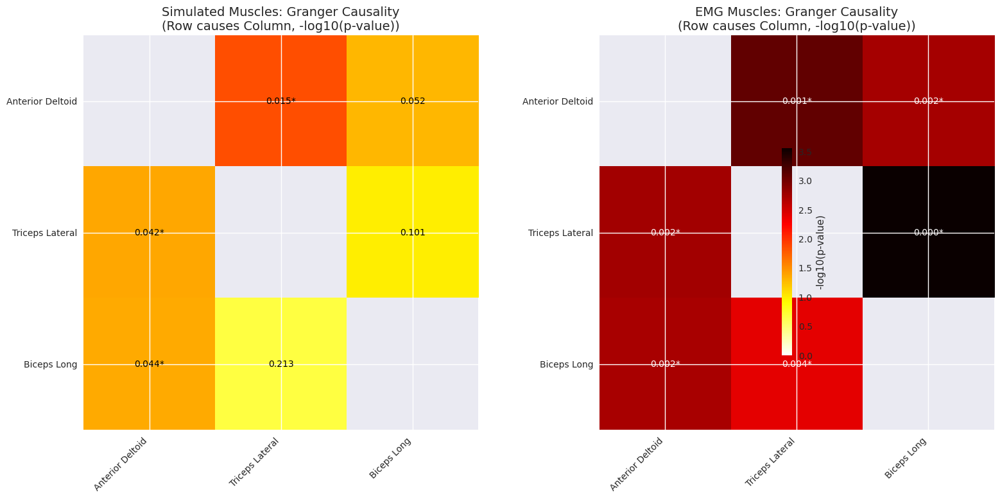

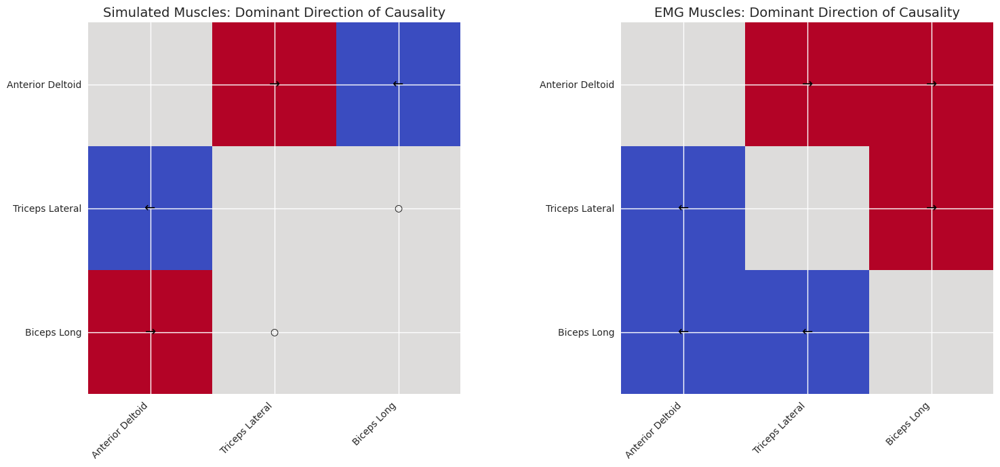


--- SUMMARY OF CAUSALITY RELATIONSHIPS ---


,Muscle Pair,Sim Relationship,EMG Relationship,Direction Match
0,Anterior Deltoid - Triceps Lateral,Anterior Deltoid causes Triceps Lateral (p=0.0...,Anterior Deltoid causes Triceps Lateral (p=0.0...,Yes
1,Anterior Deltoid - Biceps Long,Biceps Long causes Anterior Deltoid (p=0.044)*,Anterior Deltoid causes Biceps Long (p=0.002)*,No
2,Triceps Lateral - Anterior Deltoid,Anterior Deltoid causes Triceps Lateral (p=0.0...,Anterior Deltoid causes Triceps Lateral (p=0.0...,Yes
3,Triceps Lateral - Biceps Long,No significant causality,Triceps Lateral causes Biceps Long (p=0.000)*,No
4,Biceps Long - Anterior Deltoid,Biceps Long causes Anterior Deltoid (p=0.044)*,Anterior Deltoid causes Biceps Long (p=0.002)*,No
5,Biceps Long - Triceps Lateral,No significant causality,Triceps Lateral causes Biceps Long (p=0.000)*,No


In [20]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
import seaborn as sns
from statsmodels.tsa.stattools import grangercausalitytests
import warnings
warnings.filterwarnings('ignore')  # Suppress some statsmodels warnings

# ------------- DEFINE NECESSARY VARIABLES AND FUNCTIONS -------------
# Load the trial data (main CSV with reach indices)
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')

# Create trial mask: valid trials have non-zero, non-NaN start and end values
trial_mask = (
    (df['start'].notna()) & 
    (df['end'].notna()) & 
    (df['start'] > 0) & 
    (df['end'] > 0) &
    (df['start'] != df['end'])  # Make sure start != end
)

# Get the valid trials
valid_trials_df = df[trial_mask].copy()

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20  # High pass cutoff frequency in Hz
lowpass_cutoff = 1000  # Low pass cutoff frequency in Hz
envelope_cutoff = 50  # Envelope cutoff frequency in Hz
filter_order = 4  # Butterworth filter order

# Calculate downsampling parameters
target_fs = 400  # Target sampling rate to match simulation
downsample_factor = fs // target_fs  # 30000 // 400 = 75 samples per chunk
target_samples = 200  # Number of samples we want (to match simulation)

# Define function to process EMG data
def process_emg_data_individual_trials(emg_file_path):
    """Process EMG data and return individual trial envelopes"""
    emg_data = pd.read_csv(emg_file_path, header=None)
    print(f"    Loaded EMG data: {len(emg_data)} trials")
    
    reach_envelopes_downsampled = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        trial_num = idx
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + 15000  # 0.5 seconds
        
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Downsample by averaging chunks
                    n_samples = len(reach_envelope)
                    n_chunks = n_samples // downsample_factor
                    trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]
                    reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
                    downsampled_envelope = np.mean(reshaped, axis=1)
                    
                    # Only keep if we have the target number of samples
                    if len(downsampled_envelope) >= target_samples:
                        downsampled_envelope = downsampled_envelope[:target_samples]
                        reach_envelopes_downsampled.append(downsampled_envelope)
                        
                        if i < 5:  # Debug info for first few trials
                            print(f"      Trial {trial_num}: {n_samples} → {len(downsampled_envelope)} samples")
        else:
            print(f"      Trial {trial_num}: EMG data index out of range")
    
    if not reach_envelopes_downsampled:
        return None
    
    # Convert to numpy array
    envelopes_array = np.array(reach_envelopes_downsampled)
    print(f"    Final EMG data shape: {envelopes_array.shape}")
    
    # Normalize by the 98th percentile of all observed values
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    print(f"    EMG normalization: 98th percentile = {norm_value:.6f}")
    
    return normalized_envelopes

# ------------- COLLECT DATA -------------
print("Collecting data for analysis...")

# Define muscles to include - ONLY these 3
target_muscles = ["Anterior Deltoid", "Triceps Lateral", "Biceps Long"]

# Get the number of clips from the actions array
n_clips, T, _ = actions.shape
print(f"Using {n_clips} clips and {T} timesteps for analysis")

# For simulated data, we already have the actions array loaded
sim_data = []
emg_data = []

# Collect muscle indices for easier reference
muscle_indices = {}
muscle_names = []

# Process each muscle in the configuration
for muscle_idx, sim_name, emg_file, emg_name in MUSCLE_CONFIGS:
    # Skip muscles not in our target list
    if sim_name not in target_muscles:
        print(f"Skipping {sim_name} (not in target list)")
        continue
    
    print(f"Processing {sim_name} vs {emg_name}...")
    
    # Get simulated data for this muscle
    sim_traces = actions[:, :, muscle_idx]  # Shape: (n_clips, T)
    
    # Get EMG data for this muscle
    emg_traces = process_emg_data_individual_trials(emg_file)
    
    if emg_traces is not None and len(emg_traces) == n_clips:
        sim_data.append(sim_traces)
        emg_data.append(emg_traces)
        muscle_indices[sim_name] = len(muscle_names)  # Store index for this muscle
        muscle_names.append(sim_name)
        print(f"✓ Added {sim_name}/{emg_name} data: {sim_traces.shape}")
    else:
        print(f"✗ Skipping {sim_name}/{emg_name} - data issue")

# Convert to arrays and reshape
if len(sim_data) > 0 and len(emg_data) > 0:
    # Stack arrays along the muscles dimension
    sim_data = np.stack(sim_data, axis=2)  # Shape: (n_clips, T, n_muscles)
    emg_data = np.stack(emg_data, axis=2)  # Shape: (n_clips, T, n_muscles)

    print(f"Final simulated data shape: {sim_data.shape}")
    print(f"Final EMG data shape: {emg_data.shape}")
    
    n_clips, T, n_muscles = sim_data.shape
    
    # Define maximum lag for Granger causality
    max_lag = 10  # 10 timesteps at 400Hz = 25ms
    
    # Function to run Granger causality tests
    def run_granger_tests(data1, data2, max_lag=10):
        """Run Granger causality tests between two time series"""
        # Combine data into a DataFrame
        df = pd.DataFrame({
            'x': data1,
            'y': data2
        })
        
        # Run Granger tests x → y
        x_causes_y = grangercausalitytests(df[['y', 'x']], maxlag=max_lag, verbose=False)
        
        # Run Granger tests y → x
        y_causes_x = grangercausalitytests(df[['x', 'y']], maxlag=max_lag, verbose=False)
        
        # Extract F-test p-values for each lag
        x_to_y_pvals = [x_causes_y[i+1][0]['ssr_ftest'][1] for i in range(max_lag)]
        y_to_x_pvals = [y_causes_x[i+1][0]['ssr_ftest'][1] for i in range(max_lag)]
        
        return min(x_to_y_pvals), min(y_to_x_pvals)  # Return the minimum p-values
    
    # ------------- CREATE GRANGER CAUSALITY MATRICES -------------
    print("\n--- GRANGER CAUSALITY MATRICES ---")
    
    # Create matrices to store p-values (rows cause columns)
    sim_pvals = np.zeros((n_muscles, n_muscles))
    emg_pvals = np.zeros((n_muscles, n_muscles))
    
    # Compute Granger causality for all muscle pairs
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:  # Skip self-comparisons
                all_sim_ij_pvals = []  # i causes j
                all_sim_ji_pvals = []  # j causes i
                all_emg_ij_pvals = []  # i causes j
                all_emg_ji_pvals = []  # j causes i
                
                # Compute for each trial
                for trial in range(n_clips):
                    # Simulated data
                    sim_i = sim_data[trial, :, i]
                    sim_j = sim_data[trial, :, j]
                    
                    # EMG data
                    emg_i = emg_data[trial, :, i]
                    emg_j = emg_data[trial, :, j]
                    
                    # Run Granger tests
                    sim_ij_pval, sim_ji_pval = run_granger_tests(sim_i, sim_j, max_lag)
                    emg_ij_pval, emg_ji_pval = run_granger_tests(emg_i, emg_j, max_lag)
                    
                    all_sim_ij_pvals.append(sim_ij_pval)
                    all_sim_ji_pvals.append(sim_ji_pval)
                    all_emg_ij_pvals.append(emg_ij_pval)
                    all_emg_ji_pvals.append(emg_ji_pval)
                
                # Take mean p-value across trials
                sim_pvals[i, j] = np.mean(all_sim_ij_pvals)
                sim_pvals[j, i] = np.mean(all_sim_ji_pvals)
                emg_pvals[i, j] = np.mean(all_emg_ij_pvals)
                emg_pvals[j, i] = np.mean(all_emg_ji_pvals)
    
    # Create directional matrices (log p-values, with -log10(p) for better visualization)
    sim_log_pvals = -np.log10(sim_pvals + 1e-10)  # Add small epsilon to avoid log(0)
    emg_log_pvals = -np.log10(emg_pvals + 1e-10)
    
    # Mark diagonal as NaN to ignore in visualization
    np.fill_diagonal(sim_log_pvals, np.nan)
    np.fill_diagonal(emg_log_pvals, np.nan)
    
    # Create directional matrices to show the dominant direction
    sim_direction = np.zeros((n_muscles, n_muscles))
    emg_direction = np.zeros((n_muscles, n_muscles))
    
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                if sim_pvals[i, j] < 0.05 or sim_pvals[j, i] < 0.05:  # At least one direction is significant
                    if sim_pvals[i, j] < sim_pvals[j, i]:  # i causes j more significantly
                        sim_direction[i, j] = 1
                        sim_direction[j, i] = -1
                    else:  # j causes i more significantly
                        sim_direction[i, j] = -1
                        sim_direction[j, i] = 1
                
                if emg_pvals[i, j] < 0.05 or emg_pvals[j, i] < 0.05:  # At least one direction is significant
                    if emg_pvals[i, j] < emg_pvals[j, i]:  # i causes j more significantly
                        emg_direction[i, j] = 1
                        emg_direction[j, i] = -1
                    else:  # j causes i more significantly
                        emg_direction[i, j] = -1
                        emg_direction[j, i] = 1
    
    # ------------- VISUALIZE GRANGER CAUSALITY MATRICES -------------
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    # Create heatmaps for p-values
    cmap = 'hot_r'  # Reverse 'hot' colormap (white = not significant, dark red = highly significant)
    vmax = max(np.nanmax(sim_log_pvals), np.nanmax(emg_log_pvals))  # Use same scale for both plots
    
    # Plot simulated data
    im1 = axes[0].imshow(sim_log_pvals, cmap=cmap, vmin=0, vmax=vmax)
    axes[0].set_title('Simulated Muscles: Granger Causality\n(Row causes Column, -log10(p-value))', fontsize=14)
    axes[0].set_xticks(range(n_muscles))
    axes[0].set_yticks(range(n_muscles))
    axes[0].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[0].set_yticklabels(muscle_names)
    
    # Add text annotations
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                p_val = sim_pvals[i, j]
                if p_val < 0.05:  # Significant
                    color = 'white' if sim_log_pvals[i, j] > 2 else 'black'  # White text on dark backgrounds
                    axes[0].text(j, i, f'{p_val:.3f}*', ha='center', va='center', color=color)
                else:
                    axes[0].text(j, i, f'{p_val:.3f}', ha='center', va='center', color='black')
    
    # Plot EMG data
    im2 = axes[1].imshow(emg_log_pvals, cmap=cmap, vmin=0, vmax=vmax)
    axes[1].set_title('EMG Muscles: Granger Causality\n(Row causes Column, -log10(p-value))', fontsize=14)
    axes[1].set_xticks(range(n_muscles))
    axes[1].set_yticks(range(n_muscles))
    axes[1].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[1].set_yticklabels(muscle_names)
    
    # Add text annotations
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                p_val = emg_pvals[i, j]
                if p_val < 0.05:  # Significant
                    color = 'white' if emg_log_pvals[i, j] > 2 else 'black'  # White text on dark backgrounds
                    axes[1].text(j, i, f'{p_val:.3f}*', ha='center', va='center', color=color)
                else:
                    axes[1].text(j, i, f'{p_val:.3f}', ha='center', va='center', color='black')
    
    # Add colorbar
    cbar = fig.colorbar(im1, ax=axes, shrink=0.6)
    cbar.set_label('-log10(p-value)')
    
    plt.tight_layout()
    plt.show()
    
    # ------------- VISUALIZE DOMINANT DIRECTION MATRICES -------------
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    # Custom colormap: blue for negative, red for positive
    cmap = plt.cm.coolwarm
    
    # Plot simulated data
    im1 = axes[0].imshow(sim_direction, cmap=cmap, vmin=-1, vmax=1)
    axes[0].set_title('Simulated Muscles: Dominant Direction of Causality', fontsize=14)
    axes[0].set_xticks(range(n_muscles))
    axes[0].set_yticks(range(n_muscles))
    axes[0].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[0].set_yticklabels(muscle_names)
    
    # Add text annotations
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                if sim_direction[i, j] == 1:
                    axes[0].text(j, i, "→", ha='center', va='center', color='black', fontsize=14)
                elif sim_direction[i, j] == -1:
                    axes[0].text(j, i, "←", ha='center', va='center', color='black', fontsize=14)
                else:
                    axes[0].text(j, i, "○", ha='center', va='center', color='black')
    
    # Plot EMG data
    im2 = axes[1].imshow(emg_direction, cmap=cmap, vmin=-1, vmax=1)
    axes[1].set_title('EMG Muscles: Dominant Direction of Causality', fontsize=14)
    axes[1].set_xticks(range(n_muscles))
    axes[1].set_yticks(range(n_muscles))
    axes[1].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[1].set_yticklabels(muscle_names)
    
    # Add text annotations
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                if emg_direction[i, j] == 1:
                    axes[1].text(j, i, "→", ha='center', va='center', color='black', fontsize=14)
                elif emg_direction[i, j] == -1:
                    axes[1].text(j, i, "←", ha='center', va='center', color='black', fontsize=14)
                else:
                    axes[1].text(j, i, "○", ha='center', va='center', color='black')
    
    plt.tight_layout()
    plt.show()
    
    # ------------- SUMMARY TABLE -------------
    print("\n--- SUMMARY OF CAUSALITY RELATIONSHIPS ---")
    causality_summary = []
    
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                m1 = muscle_names[i]
                m2 = muscle_names[j]
                
                # Determine causality direction in sim data
                if sim_pvals[i, j] < 0.05 and sim_pvals[i, j] < sim_pvals[j, i]:
                    sim_result = f"{m1} causes {m2} (p={sim_pvals[i, j]:.3f})*"
                elif sim_pvals[j, i] < 0.05 and sim_pvals[j, i] < sim_pvals[i, j]:
                    sim_result = f"{m2} causes {m1} (p={sim_pvals[j, i]:.3f})*"
                else:
                    sim_result = "No significant causality"
                    
                # Determine causality direction in EMG data
                if emg_pvals[i, j] < 0.05 and emg_pvals[i, j] < emg_pvals[j, i]:
                    emg_result = f"{m1} causes {m2} (p={emg_pvals[i, j]:.3f})*"
                elif emg_pvals[j, i] < 0.05 and emg_pvals[j, i] < emg_pvals[i, j]:
                    emg_result = f"{m2} causes {m1} (p={emg_pvals[j, i]:.3f})*"
                else:
                    emg_result = "No significant causality"
                
                # Check if directions match
                sim_dir = sim_direction[i, j]
                emg_dir = emg_direction[i, j]
                match = "Yes" if sim_dir == emg_dir else "No"
                
                causality_summary.append({
                    'Muscle Pair': f"{m1} - {m2}",
                    'Sim Relationship': sim_result,
                    'EMG Relationship': emg_result,
                    'Direction Match': match
                })
    
    # Display summary table
    summary_df = pd.DataFrame(causality_summary)
    display(summary_df)
    
else:
    print("No valid data collected for analysis.")

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
import seaborn as sns
from statsmodels.tsa.stattools import grangercausalitytests
import warnings
warnings.filterwarnings('ignore')  # Suppress some statsmodels warnings

# ------------- DEFINE NECESSARY VARIABLES AND FUNCTIONS -------------
# Load the trial data (main CSV with reach indices)
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')

# Create trial mask: valid trials have non-zero, non-NaN start and end values
trial_mask = (
    (df['start'].notna()) & 
    (df['end'].notna()) & 
    (df['start'] > 0) & 
    (df['end'] > 0) &
    (df['start'] != df['end'])  # Make sure start != end
)

# Get the valid trials
valid_trials_df = df[trial_mask].copy()

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20  # High pass cutoff frequency in Hz
lowpass_cutoff = 1000  # Low pass cutoff frequency in Hz
envelope_cutoff = 50  # Envelope cutoff frequency in Hz
filter_order = 4  # Butterworth filter order

# Calculate downsampling parameters
target_fs = 400  # Target sampling rate to match simulation
downsample_factor = fs // target_fs  # 30000 // 400 = 75 samples per chunk
target_samples = 200  # Number of samples we want (to match simulation)

# Define function to process EMG data
def process_emg_data_individual_trials(emg_file_path):
    """Process EMG data and return individual trial envelopes"""
    emg_data = pd.read_csv(emg_file_path, header=None)
    print(f"    Loaded EMG data: {len(emg_data)} trials")
    
    reach_envelopes_downsampled = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        trial_num = idx
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + 15000  # 0.5 seconds
        
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Downsample by averaging chunks
                    n_samples = len(reach_envelope)
                    n_chunks = n_samples // downsample_factor
                    trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]
                    reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
                    downsampled_envelope = np.mean(reshaped, axis=1)
                    
                    # Only keep if we have the target number of samples
                    if len(downsampled_envelope) >= target_samples:
                        downsampled_envelope = downsampled_envelope[:target_samples]
                        reach_envelopes_downsampled.append(downsampled_envelope)
                        
                        if i < 5:  # Debug info for first few trials
                            print(f"      Trial {trial_num}: {n_samples} → {len(downsampled_envelope)} samples")
        else:
            print(f"      Trial {trial_num}: EMG data index out of range")
    
    if not reach_envelopes_downsampled:
        return None
    
    # Convert to numpy array
    envelopes_array = np.array(reach_envelopes_downsampled)
    print(f"    Final EMG data shape: {envelopes_array.shape}")
    
    # Normalize by the 98th percentile of all observed values
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    print(f"    EMG normalization: 98th percentile = {norm_value:.6f}")
    
    return normalized_envelopes

# ------------- COLLECT DATA -------------
print("Collecting data for analysis...")

# Define muscles to include - ONLY these 3
target_muscles = ["Anterior Deltoid", "Triceps Lateral", "Biceps Long"]

# Get the number of clips from the actions array
n_clips, T, _ = actions.shape
print(f"Using {n_clips} clips and {T} timesteps for analysis")

# For simulated data, we already have the actions array loaded
sim_data = []
emg_data = []

# Collect muscle indices for easier reference
muscle_indices = {}
muscle_names = []

# Process each muscle in the configuration
for muscle_idx, sim_name, emg_file, emg_name in MUSCLE_CONFIGS:
    # Skip muscles not in our target list
    if sim_name not in target_muscles:
        print(f"Skipping {sim_name} (not in target list)")
        continue
    
    print(f"Processing {sim_name} vs {emg_name}...")
    
    # Get simulated data for this muscle
    sim_traces = actions[:, :, muscle_idx]  # Shape: (n_clips, T)
    
    # Get EMG data for this muscle
    emg_traces = process_emg_data_individual_trials(emg_file)
    
    if emg_traces is not None and len(emg_traces) == n_clips:
        sim_data.append(sim_traces)
        emg_data.append(emg_traces)
        muscle_indices[sim_name] = len(muscle_names)  # Store index for this muscle
        muscle_names.append(sim_name)
        print(f"✓ Added {sim_name}/{emg_name} data: {sim_traces.shape}")
    else:
        print(f"✗ Skipping {sim_name}/{emg_name} - data issue")

# Convert to arrays and reshape
if len(sim_data) > 0 and len(emg_data) > 0:
    # Stack arrays along the muscles dimension
    sim_data = np.stack(sim_data, axis=2)  # Shape: (n_clips, T, n_muscles)
    emg_data = np.stack(emg_data, axis=2)  # Shape: (n_clips, T, n_muscles)

    print(f"Final simulated data shape: {sim_data.shape}")
    print(f"Final EMG data shape: {emg_data.shape}")
    
    n_clips, T, n_muscles = sim_data.shape
    
    # Define maximum lag for Granger causality
    max_lag = 10  # 10 timesteps at 400Hz = 25ms
    
    # Function to run Granger causality tests
    def run_granger_tests(data1, data2, max_lag=10):
        """Run Granger causality tests between two time series"""
        # Combine data into a DataFrame
        df = pd.DataFrame({
            'x': data1,
            'y': data2
        })
        
        # Run Granger tests x → y
        x_causes_y = grangercausalitytests(df[['y', 'x']], maxlag=max_lag, verbose=False)
        
        # Run Granger tests y → x
        y_causes_x = grangercausalitytests(df[['x', 'y']], maxlag=max_lag, verbose=False)
        
        # Extract F-test p-values for each lag
        x_to_y_pvals = [x_causes_y[i+1][0]['ssr_ftest'][1] for i in range(max_lag)]
        y_to_x_pvals = [y_causes_x[i+1][0]['ssr_ftest'][1] for i in range(max_lag)]
        
        return min(x_to_y_pvals), min(y_to_x_pvals)  # Return the minimum p-values
    
    # ------------- CREATE GRANGER CAUSALITY MATRICES -------------
    print("\n--- GRANGER CAUSALITY MATRICES ---")
    
    # Create matrices to store p-values (rows cause columns)
    sim_pvals = np.zeros((n_muscles, n_muscles))
    emg_pvals = np.zeros((n_muscles, n_muscles))
    
    # Compute Granger causality for all muscle pairs
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:  # Skip self-comparisons
                all_sim_ij_pvals = []  # i causes j
                all_sim_ji_pvals = []  # j causes i
                all_emg_ij_pvals = []  # i causes j
                all_emg_ji_pvals = []  # j causes i
                
                # Compute for each trial
                for trial in range(n_clips):
                    # Simulated data
                    sim_i = sim_data[trial, :, i]
                    sim_j = sim_data[trial, :, j]
                    
                    # EMG data
                    emg_i = emg_data[trial, :, i]
                    emg_j = emg_data[trial, :, j]
                    
                    # Run Granger tests
                    sim_ij_pval, sim_ji_pval = run_granger_tests(sim_i, sim_j, max_lag)
                    emg_ij_pval, emg_ji_pval = run_granger_tests(emg_i, emg_j, max_lag)
                    
                    all_sim_ij_pvals.append(sim_ij_pval)
                    all_sim_ji_pvals.append(sim_ji_pval)
                    all_emg_ij_pvals.append(emg_ij_pval)
                    all_emg_ji_pvals.append(emg_ji_pval)
                
                # Take mean p-value across trials
                sim_pvals[i, j] = np.mean(all_sim_ij_pvals)
                sim_pvals[j, i] = np.mean(all_sim_ji_pvals)
                emg_pvals[i, j] = np.mean(all_emg_ij_pvals)
                emg_pvals[j, i] = np.mean(all_emg_ji_pvals)
    
    # Create directional matrices (log p-values, with -log10(p) for better visualization)
    sim_log_pvals = -np.log10(sim_pvals + 1e-10)  # Add small epsilon to avoid log(0)
    emg_log_pvals = -np.log10(emg_pvals + 1e-10)
    
    # Mark diagonal as NaN to ignore in visualization
    np.fill_diagonal(sim_log_pvals, np.nan)
    np.fill_diagonal(emg_log_pvals, np.nan)
    
    # Create directional matrices to show the dominant direction
    sim_direction = np.zeros((n_muscles, n_muscles))
    emg_direction = np.zeros((n_muscles, n_muscles))
    
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                if sim_pvals[i, j] < 0.05 or sim_pvals[j, i] < 0.05:  # At least one direction is significant
                    if sim_pvals[i, j] < sim_pvals[j, i]:  # i causes j more significantly
                        sim_direction[i, j] = 1
                        sim_direction[j, i] = -1
                    else:  # j causes i more significantly
                        sim_direction[i, j] = -1
                        sim_direction[j, i] = 1
                
                if emg_pvals[i, j] < 0.05 or emg_pvals[j, i] < 0.05:  # At least one direction is significant
                    if emg_pvals[i, j] < emg_pvals[j, i]:  # i causes j more significantly
                        emg_direction[i, j] = 1
                        emg_direction[j, i] = -1
                    else:  # j causes i more significantly
                        emg_direction[i, j] = -1
                        emg_direction[j, i] = 1
    
    # ------------- VISUALIZE GRANGER CAUSALITY MATRICES -------------
    # Create a figure with consistent styling
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    # Create a common colormap and scale
    cmap = 'hot_r'  # Reverse 'hot' colormap (white = not significant, dark red = highly significant)
    
    # Find the global min and max for both matrices for consistent scaling
    all_log_pvals = np.concatenate([sim_log_pvals.flatten(), emg_log_pvals.flatten()])
    all_log_pvals = all_log_pvals[~np.isnan(all_log_pvals)]
    vmin = 0  # Log pvals are non-negative
    vmax = np.max(all_log_pvals)  # Use same max for both plots
    
    # Plot simulated data with consistent scale
    im1 = axes[0].imshow(sim_log_pvals, cmap=cmap, vmin=vmin, vmax=vmax)
    axes[0].set_title('Simulated Muscles: Granger Causality\n(Row causes Column, -log10(p-value))', fontsize=14)
    axes[0].set_xticks(range(n_muscles))
    axes[0].set_yticks(range(n_muscles))
    axes[0].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[0].set_yticklabels(muscle_names)
    
    # Add text annotations for sim
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                p_val = sim_pvals[i, j]
                if p_val < 0.05:  # Significant
                    color = 'white' if sim_log_pvals[i, j] > vmax/2 else 'black'  # White text on dark backgrounds
                    axes[0].text(j, i, f'{p_val:.3f}*', ha='center', va='center', color=color)
                else:
                    axes[0].text(j, i, f'{p_val:.3f}', ha='center', va='center', color='black')
    
    # Plot EMG data with consistent scale
    im2 = axes[1].imshow(emg_log_pvals, cmap=cmap, vmin=vmin, vmax=vmax)
    axes[1].set_title('EMG Muscles: Granger Causality\n(Row causes Column, -log10(p-value))', fontsize=14)
    axes[1].set_xticks(range(n_muscles))
    axes[1].set_yticks(range(n_muscles))
    axes[1].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[1].set_yticklabels(muscle_names)
    
    # Add text annotations for EMG
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                p_val = emg_pvals[i, j]
                if p_val < 0.05:  # Significant
                    color = 'white' if emg_log_pvals[i, j] > vmax/2 else 'black'  # White text on dark backgrounds
                    axes[1].text(j, i, f'{p_val:.3f}*', ha='center', va='center', color=color)
                else:
                    axes[1].text(j, i, f'{p_val:.3f}', ha='center', va='center', color='black')
    
    # Add shared colorbar
    cbar = fig.colorbar(im1, ax=axes, shrink=0.6)
    cbar.set_label('-log10(p-value)')
    
    plt.tight_layout()
    plt.show()
    
    # ------------- VISUALIZE DOMINANT DIRECTION MATRICES -------------
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    # Custom colormap: blue for negative, red for positive with identical scale
    cmap = plt.cm.coolwarm
    
    # Plot simulated data direction with consistent scale
    im1 = axes[0].imshow(sim_direction, cmap=cmap, vmin=-1, vmax=1)
    axes[0].set_title('Simulated Muscles: Dominant Direction of Causality', fontsize=14)
    axes[0].set_xticks(range(n_muscles))
    axes[0].set_yticks(range(n_muscles))
    axes[0].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[0].set_yticklabels(muscle_names)
    
    # Add text annotations for direction
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                if sim_direction[i, j] == 1:
                    axes[0].text(j, i, "→", ha='center', va='center', color='black', fontsize=14)
                elif sim_direction[i, j] == -1:
                    axes[0].text(j, i, "←", ha='center', va='center', color='black', fontsize=14)
                else:
                    axes[0].text(j, i, "○", ha='center', va='center', color='black')
    
    # Plot EMG data direction with consistent scale
    im2 = axes[1].imshow(emg_direction, cmap=cmap, vmin=-1, vmax=1)
    axes[1].set_title('EMG Muscles: Dominant Direction of Causality', fontsize=14)
    axes[1].set_xticks(range(n_muscles))
    axes[1].set_yticks(range(n_muscles))
    axes[1].set_xticklabels(muscle_names, rotation=45, ha='right')
    axes[1].set_yticklabels(muscle_names)
    
    # Add text annotations for direction
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                if emg_direction[i, j] == 1:
                    axes[1].text(j, i, "→", ha='center', va='center', color='black', fontsize=14)
                elif emg_direction[i, j] == -1:
                    axes[1].text(j, i, "←", ha='center', va='center', color='black', fontsize=14)
                else:
                    axes[1].text(j, i, "○", ha='center', va='center', color='black')
    
    # Add shared colorbar for direction
    cbar = fig.colorbar(im1, ax=axes, shrink=0.6)
    cbar.set_label('Direction (negative: row←column, positive: row→column)')
    
    plt.tight_layout()
    plt.show()
    
    # ------------- SUMMARY TABLE -------------
    print("\n--- SUMMARY OF CAUSALITY RELATIONSHIPS ---")
    causality_summary = []
    
    for i in range(n_muscles):
        for j in range(n_muscles):
            if i != j:
                m1 = muscle_names[i]
                m2 = muscle_names[j]
                
                # Determine causality direction in sim data
                if sim_pvals[i, j] < 0.05 and sim_pvals[i, j] < sim_pvals[j, i]:
                    sim_result = f"{m1} causes {m2} (p={sim_pvals[i, j]:.3f})*"
                elif sim_pvals[j, i] < 0.05 and sim_pvals[j, i] < sim_pvals[i, j]:
                    sim_result = f"{m2} causes {m1} (p={sim_pvals[j, i]:.3f})*"
                else:
                    sim_result = "No significant causality"
                    
                # Determine causality direction in EMG data
                if emg_pvals[i, j] < 0.05 and emg_pvals[i, j] < emg_pvals[j, i]:
                    emg_result = f"{m1} causes {m2} (p={emg_pvals[i, j]:.3f})*"
                elif emg_pvals[j, i] < 0.05 and emg_pvals[j, i] < emg_pvals[i, j]:
                    emg_result = f"{m2} causes {m1} (p={emg_pvals[j, i]:.3f})*"
                else:
                    emg_result = "No significant causality"
                
                # Check if directions match
                sim_dir = sim_direction[i, j]
                emg_dir = emg_direction[i, j]
                match = "Yes" if sim_dir == emg_dir else "No"
                
                causality_summary.append({
                    'Muscle Pair': f"{m1} - {m2}",
                    'Sim Relationship': sim_result,
                    'EMG Relationship': emg_result,
                    'Direction Match': match
                })
    
    # Display summary table
    summary_df = pd.DataFrame(causality_summary)
    display(summary_df)
    
else:
    print("No valid data collected for analysis.")

Using 46 clips and 200 timesteps for analysis
Processing Anterior Deltoid vs Anterior Deltoid...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.009499
✓ Added Anterior Deltoid/Anterior Deltoid data: (46, 200)
Processing Triceps Lateral vs Triceps...
    Loaded EMG data: 77 trials
      Trial 0: 15000 → 200 samples
      Trial 3: 15000 → 200 samples
      Trial 8: 15000 → 200 samples
      Trial 9: 15000 → 200 samples
      Trial 12: 15000 → 200 samples
    Final EMG data shape: (46, 200)
    EMG normalization: 98th percentile = 0.017279
✓ Added Triceps Lateral/Triceps data: (46, 200)
Skipping Triceps Long (not in target list)
Skipping Brachialis (not in target list)
Processing Biceps Long vs Biceps...
    Loaded EMG data: 77 trials
      Trial 0: 1500

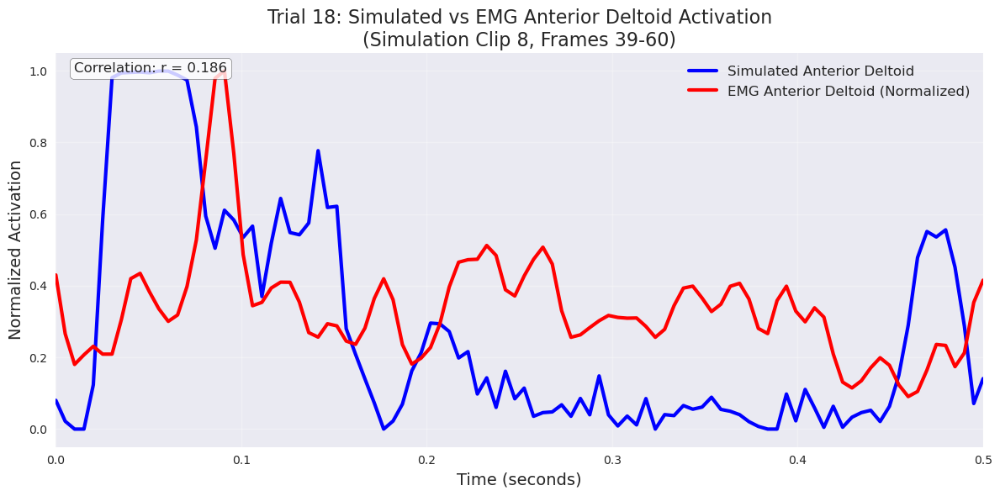

Trial 18 (Simulation clip 8)
EMG normalization value (95th percentile): 0.006644


In [29]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal
import re

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# --------------------------- EXTRACT TRIAL MAPPING FROM CONFIG -----------------------------------
# From mouse-arm.yaml data_path - extract trial numbers used in simulation
config_data_path = "/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial01_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial04_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial09_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial10_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial13_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial15_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial16_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial17_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial19_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial20_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial23_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial24_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial25_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial27_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial29_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial34_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial35_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial36_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial38_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial40_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial42_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial43_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial44_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial45_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial46_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial47_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial49_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial52_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial53_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial55_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial56_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial57_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial58_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial59_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial60_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial61_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial62_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial63_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial65_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial66_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial70_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial71_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial73_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial74_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial75_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial76_ik.h5"

# Extract trial numbers from the config data_path
trial_pattern = r'trial(\d+)_ik\.h5'
simulation_trial_numbers = []
for path in config_data_path.split(','):
    match = re.search(trial_pattern, path)
    if match:
        trial_num = int(match.group(1))
        simulation_trial_numbers.append(trial_num - 1)  # Convert to 0-indexed

# --------------------------- LOAD DATA -----------------------------------
H5_PATH = "/root/vast/eric/track-mjx/notebooks/rollouts_full_mouse_arm_new_250831_001916_126200.h5"
ANTERIOR_DELTOID_IDX = 3
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Load simulated muscle activation data
with h5py.File(H5_PATH, "r") as f:
    actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)

n_clips, T, _ = actions.shape
sim_time_s = np.linspace(0, 0.5, T)  # 0 → 0.5 s for 200 steps at 400 Hz

# Load the trial data and EMG data
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')
emg_data = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv', header=None)

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20
lowpass_cutoff = 1000
envelope_cutoff = 50
filter_order = 4
target_fs = 200
downsample_factor = fs // target_fs

# --------------------------- SELECT TRIAL FOR COMPARISON -----------------------------------
selected_trial = 18  # Trial 16 as shown in your output
sim_clip_idx = simulation_trial_numbers.index(selected_trial)

# --------------------------- EXTRACT SIMULATED DATA FOR SELECTED TRIAL -----------------------------------
sim_muscle_trace = actions[sim_clip_idx, :, ANTERIOR_DELTOID_IDX]

# --------------------------- EXTRACT EMG DATA FOR SELECTED TRIAL -----------------------------------
# Get trial info from CSV
trial_row = df.iloc[selected_trial]
start_frame = trial_row['start']
end_frame = trial_row['end']

# Convert to EMG sample indices
emg_reach_start = int(1/200 * start_frame * 30000)
emg_reach_end = emg_reach_start + 15000  # 0.5 seconds

# Get EMG data for this trial
trial_emg = emg_data.iloc[selected_trial, :]

# Process EMG signal
b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
filtered_emg = signal.filtfilt(b, a, trial_emg)

rectified_emg = np.abs(filtered_emg)

b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)

# Extract envelope during reach period
reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]

# Downsample EMG to match simulation sampling rate
n_samples = len(reach_envelope)
n_chunks = n_samples // downsample_factor

# Trim to exact multiple of downsample_factor
trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]

# Reshape and average
reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
downsampled_envelope = np.mean(reshaped, axis=1)

# Trim to match simulation length (200 samples)
downsampled_envelope = downsampled_envelope[:200]
emg_time_axis = np.linspace(0, 0.5, len(downsampled_envelope))

# Normalize EMG (using 95th percentile as before)
norm_value = np.percentile(downsampled_envelope, 100)
normalized_emg = downsampled_envelope / norm_value

# --------------------------- PLOT SINGLE NORMALIZED COMPARISON -----------------------------------
plt.figure(figsize=(12, 6))

plt.plot(sim_time_s, sim_muscle_trace, 'b-', linewidth=3, label='Simulated Anterior Deltoid')
plt.plot(emg_time_axis, normalized_emg, 'r-', linewidth=3, label='EMG Anterior Deltoid (Normalized)')

plt.ylabel('Normalized Activation', fontsize=14)
plt.xlabel('Time (seconds)', fontsize=14)
plt.title(f'Trial {selected_trial}: Simulated vs EMG Anterior Deltoid Activation\n(Simulation Clip {sim_clip_idx}, Frames {start_frame:.0f}-{end_frame:.0f})', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.xlim(0, 0.5)

# Calculate and display correlation
correlation = np.corrcoef(sim_muscle_trace, normalized_emg)[0, 1]
plt.text(0.02, 0.95, f'Correlation: r = {correlation:.3f}', 
         transform=plt.gca().transAxes, fontsize=12, 
         bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

plt.tight_layout()
plt.show()

print(f"Trial {selected_trial} (Simulation clip {sim_clip_idx})")
#print(f"Correlation: {correlation:.3f}")
print(f"EMG normalization value (95th percentile): {norm_value:.6f}")

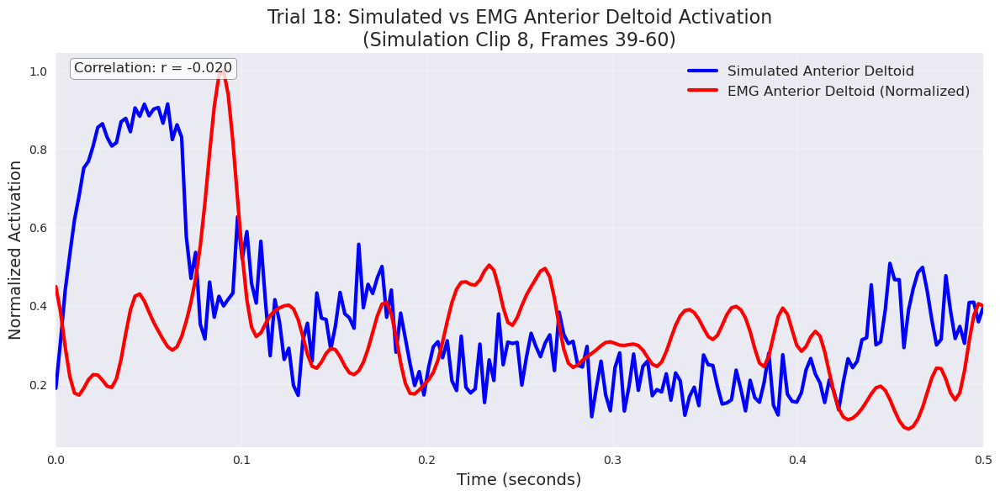

Trial 18 (Simulation clip 8)
EMG normalization value (95th percentile): 0.006855


In [ ]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal
import re

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# --------------------------- EXTRACT TRIAL MAPPING FROM CONFIG -----------------------------------
# From mouse-arm.yaml data_path - extract trial numbers used in simulation
config_data_path = "/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial01_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial04_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial09_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial10_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial13_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial15_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial16_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial17_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial19_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial20_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial23_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial24_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial25_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial27_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial29_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial34_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial35_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial36_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial38_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial40_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial42_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial43_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial44_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial45_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial46_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial47_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial49_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial52_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial53_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial55_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial56_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial57_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial58_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial59_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial60_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial61_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial62_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial63_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial65_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial66_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial70_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial71_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial73_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial74_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial75_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial76_ik.h5"

# Extract trial numbers from the config data_path
trial_pattern = r'trial(\d+)_ik\.h5'
simulation_trial_numbers = []
for path in config_data_path.split(','):
    match = re.search(trial_pattern, path)
    if match:
        trial_num = int(match.group(1))
        simulation_trial_numbers.append(trial_num - 1)  # Convert to 0-indexed

# --------------------------- LOAD DATA -----------------------------------
H5_PATH = "rollouts_full_mouse_arm.h5"
ANTERIOR_DELTOID_IDX = 3
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Load simulated muscle activation data
with h5py.File(H5_PATH, "r") as f:
    actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)

n_clips, T, _ = actions.shape
sim_time_s = np.linspace(0, 0.5, T)  # 0 → 0.5 s for 200 steps at 400 Hz

# Load the trial data and EMG data
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')
emg_data = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv', header=None)

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20
lowpass_cutoff = 1000
envelope_cutoff = 50
filter_order = 4
target_fs = 400
downsample_factor = fs // target_fs

# --------------------------- SELECT TRIAL FOR COMPARISON -----------------------------------
selected_trial = 18  # Trial 16 as shown in your output
sim_clip_idx = simulation_trial_numbers.index(selected_trial)

# --------------------------- EXTRACT SIMULATED DATA FOR SELECTED TRIAL -----------------------------------
sim_muscle_trace = actions[sim_clip_idx, :, ANTERIOR_DELTOID_IDX]

# --------------------------- EXTRACT EMG DATA FOR SELECTED TRIAL -----------------------------------
# Get trial info from CSV
trial_row = df.iloc[selected_trial]
start_frame = trial_row['start']
end_frame = trial_row['end']

# Convert to EMG sample indices
emg_reach_start = int(1/200 * start_frame * 30000)
emg_reach_end = emg_reach_start + 15000  # 0.5 seconds

# Get EMG data for this trial
trial_emg = emg_data.iloc[selected_trial, :]

# Process EMG signal
b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
filtered_emg = signal.filtfilt(b, a, trial_emg)

rectified_emg = np.abs(filtered_emg)

b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)

# Extract envelope during reach period
reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]

# Downsample EMG to match simulation sampling rate
n_samples = len(reach_envelope)
n_chunks = n_samples // downsample_factor

# Trim to exact multiple of downsample_factor
trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]

# Reshape and average
reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
downsampled_envelope = np.mean(reshaped, axis=1)

# Trim to match simulation length (200 samples)
downsampled_envelope = downsampled_envelope[:200]
emg_time_axis = np.linspace(0, 0.5, len(downsampled_envelope))

# Normalize EMG (using 95th percentile as before)
norm_value = np.percentile(downsampled_envelope, 100)
normalized_emg = downsampled_envelope / norm_value

# --------------------------- PLOT SINGLE NORMALIZED COMPARISON -----------------------------------
plt.figure(figsize=(12, 6))

plt.plot(sim_time_s, sim_muscle_trace, 'b-', linewidth=3, label='Simulated Anterior Deltoid')
plt.plot(emg_time_axis, normalized_emg, 'r-', linewidth=3, label='EMG Anterior Deltoid (Normalized)')

plt.ylabel('Normalized Activation', fontsize=14)
plt.xlabel('Time (seconds)', fontsize=14)
plt.title(f'Trial {selected_trial}: Simulated vs EMG Anterior Deltoid Activation\n(Simulation Clip {sim_clip_idx}, Frames {start_frame:.0f}-{end_frame:.0f})', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.xlim(0, 0.5)

# Calculate and display correlation
correlation = np.corrcoef(sim_muscle_trace, normalized_emg)[0, 1]
plt.text(0.02, 0.95, f'Correlation: r = {correlation:.3f}', 
         transform=plt.gca().transAxes, fontsize=12, 
         bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

plt.tight_layout()
plt.show()

print(f"Trial {selected_trial} (Simulation clip {sim_clip_idx})")
#print(f"Correlation: {correlation:.3f}")
print(f"EMG normalization value (95th percentile): {norm_value:.6f}")

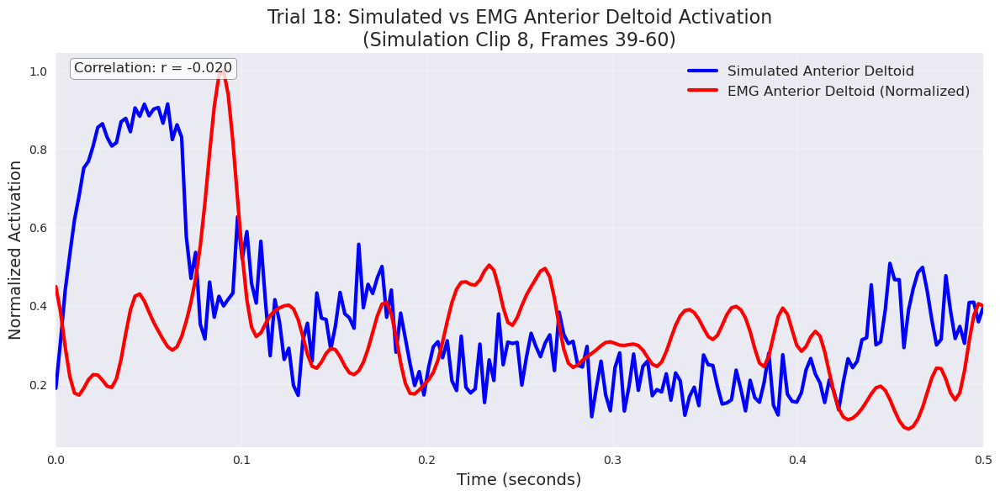

Trial 18 (Simulation clip 8)
EMG normalization value (95th percentile): 0.006855


In [ ]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal
import re

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# --------------------------- EXTRACT TRIAL MAPPING FROM CONFIG -----------------------------------
# From mouse-arm.yaml data_path - extract trial numbers used in simulation
config_data_path = "/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial01_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial04_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial09_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial10_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial13_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial15_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial16_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial17_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial19_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial20_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial23_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial24_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial25_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial27_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial29_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial34_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial35_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial36_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial38_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial40_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial42_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial43_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial44_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial45_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial46_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial47_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial49_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial52_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial53_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial55_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial56_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial57_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial58_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial59_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial60_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial61_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial62_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial63_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial65_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial66_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial70_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial71_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial73_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial74_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial75_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial76_ik.h5"

# Extract trial numbers from the config data_path
trial_pattern = r'trial(\d+)_ik\.h5'
simulation_trial_numbers = []
for path in config_data_path.split(','):
    match = re.search(trial_pattern, path)
    if match:
        trial_num = int(match.group(1))
        simulation_trial_numbers.append(trial_num - 1)  # Convert to 0-indexed

# --------------------------- LOAD DATA -----------------------------------
H5_PATH = "rollouts_full_mouse_arm.h5"
ANTERIOR_DELTOID_IDX = 3
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Load simulated muscle activation data
with h5py.File(H5_PATH, "r") as f:
    actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)

n_clips, T, _ = actions.shape
sim_time_s = np.linspace(0, 0.5, T)  # 0 → 0.5 s for 200 steps at 400 Hz

# Load the trial data and EMG data
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')
emg_data = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv', header=None)

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20
lowpass_cutoff = 1000
envelope_cutoff = 50
filter_order = 4
target_fs = 400
downsample_factor = fs // target_fs

# --------------------------- SELECT TRIAL FOR COMPARISON -----------------------------------
selected_trial = 18  # Trial 16 as shown in your output
sim_clip_idx = simulation_trial_numbers.index(selected_trial)

# --------------------------- EXTRACT SIMULATED DATA FOR SELECTED TRIAL -----------------------------------
sim_muscle_trace = actions[sim_clip_idx, :, ANTERIOR_DELTOID_IDX]

# --------------------------- EXTRACT EMG DATA FOR SELECTED TRIAL -----------------------------------
# Get trial info from CSV
trial_row = df.iloc[selected_trial]
start_frame = trial_row['start']
end_frame = trial_row['end']

# Convert to EMG sample indices
emg_reach_start = int(1/200 * start_frame * 30000)
emg_reach_end = emg_reach_start + 15000  # 0.5 seconds

# Get EMG data for this trial
trial_emg = emg_data.iloc[selected_trial, :]

# Process EMG signal
b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
filtered_emg = signal.filtfilt(b, a, trial_emg)

rectified_emg = np.abs(filtered_emg)

b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)

# Extract envelope during reach period
reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]

# Downsample EMG to match simulation sampling rate
n_samples = len(reach_envelope)
n_chunks = n_samples // downsample_factor

# Trim to exact multiple of downsample_factor
trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]

# Reshape and average
reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
downsampled_envelope = np.mean(reshaped, axis=1)

# Trim to match simulation length (200 samples)
downsampled_envelope = downsampled_envelope[:200]
emg_time_axis = np.linspace(0, 0.5, len(downsampled_envelope))

# Normalize EMG (using 95th percentile as before)
norm_value = np.percentile(downsampled_envelope, 100)
normalized_emg = downsampled_envelope / norm_value

# --------------------------- PLOT SINGLE NORMALIZED COMPARISON -----------------------------------
plt.figure(figsize=(12, 6))

plt.plot(sim_time_s, sim_muscle_trace, 'b-', linewidth=3, label='Simulated Anterior Deltoid')
plt.plot(emg_time_axis, normalized_emg, 'r-', linewidth=3, label='EMG Anterior Deltoid (Normalized)')

plt.ylabel('Normalized Activation', fontsize=14)
plt.xlabel('Time (seconds)', fontsize=14)
plt.title(f'Trial {selected_trial}: Simulated vs EMG Anterior Deltoid Activation\n(Simulation Clip {sim_clip_idx}, Frames {start_frame:.0f}-{end_frame:.0f})', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.xlim(0, 0.5)

# Calculate and display correlation
correlation = np.corrcoef(sim_muscle_trace, normalized_emg)[0, 1]
plt.text(0.02, 0.95, f'Correlation: r = {correlation:.3f}', 
         transform=plt.gca().transAxes, fontsize=12, 
         bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

plt.tight_layout()
plt.show()

print(f"Trial {selected_trial} (Simulation clip {sim_clip_idx})")
#print(f"Correlation: {correlation:.3f}")
print(f"EMG normalization value (95th percentile): {norm_value:.6f}")

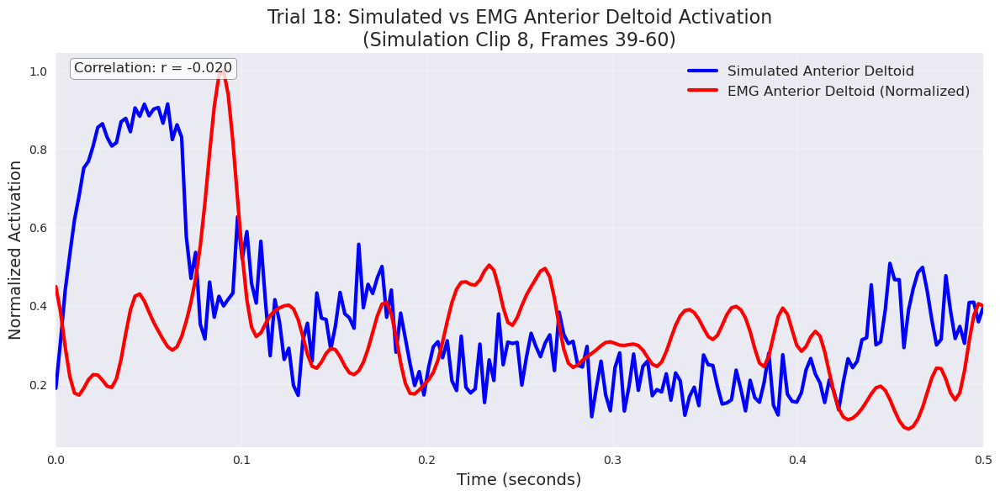

Trial 18 (Simulation clip 8)
EMG normalization value (95th percentile): 0.006855


In [ ]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal
import re

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# --------------------------- EXTRACT TRIAL MAPPING FROM CONFIG -----------------------------------
# From mouse-arm.yaml data_path - extract trial numbers used in simulation
config_data_path = "/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial01_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial04_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial09_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial10_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial13_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial15_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial16_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial17_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial19_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial20_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial23_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial24_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial25_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial27_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial29_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial34_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial35_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial36_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial38_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial40_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial42_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial43_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial44_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial45_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial46_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial47_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial49_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial52_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial53_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial55_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial56_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial57_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial58_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial59_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial60_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial61_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial62_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial63_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial65_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial66_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial70_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial71_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial73_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial74_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial75_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial76_ik.h5"

# Extract trial numbers from the config data_path
trial_pattern = r'trial(\d+)_ik\.h5'
simulation_trial_numbers = []
for path in config_data_path.split(','):
    match = re.search(trial_pattern, path)
    if match:
        trial_num = int(match.group(1))
        simulation_trial_numbers.append(trial_num - 1)  # Convert to 0-indexed

# --------------------------- LOAD DATA -----------------------------------
H5_PATH = "rollouts_full_mouse_arm.h5"
ANTERIOR_DELTOID_IDX = 3
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Load simulated muscle activation data
with h5py.File(H5_PATH, "r") as f:
    actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)

n_clips, T, _ = actions.shape
sim_time_s = np.linspace(0, 0.5, T)  # 0 → 0.5 s for 200 steps at 400 Hz

# Load the trial data and EMG data
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')
emg_data = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv', header=None)

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20
lowpass_cutoff = 1000
envelope_cutoff = 50
filter_order = 4
target_fs = 400
downsample_factor = fs // target_fs

# --------------------------- SELECT TRIAL FOR COMPARISON -----------------------------------
selected_trial = 18  # Trial 16 as shown in your output
sim_clip_idx = simulation_trial_numbers.index(selected_trial)

# --------------------------- EXTRACT SIMULATED DATA FOR SELECTED TRIAL -----------------------------------
sim_muscle_trace = actions[sim_clip_idx, :, ANTERIOR_DELTOID_IDX]

# --------------------------- EXTRACT EMG DATA FOR SELECTED TRIAL -----------------------------------
# Get trial info from CSV
trial_row = df.iloc[selected_trial]
start_frame = trial_row['start']
end_frame = trial_row['end']

# Convert to EMG sample indices
emg_reach_start = int(1/200 * start_frame * 30000)
emg_reach_end = emg_reach_start + 15000  # 0.5 seconds

# Get EMG data for this trial
trial_emg = emg_data.iloc[selected_trial, :]

# Process EMG signal
b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
filtered_emg = signal.filtfilt(b, a, trial_emg)

rectified_emg = np.abs(filtered_emg)

b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)

# Extract envelope during reach period
reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]

# Downsample EMG to match simulation sampling rate
n_samples = len(reach_envelope)
n_chunks = n_samples // downsample_factor

# Trim to exact multiple of downsample_factor
trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]

# Reshape and average
reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
downsampled_envelope = np.mean(reshaped, axis=1)

# Trim to match simulation length (200 samples)
downsampled_envelope = downsampled_envelope[:200]
emg_time_axis = np.linspace(0, 0.5, len(downsampled_envelope))

# Normalize EMG (using 95th percentile as before)
norm_value = np.percentile(downsampled_envelope, 100)
normalized_emg = downsampled_envelope / norm_value

# --------------------------- PLOT SINGLE NORMALIZED COMPARISON -----------------------------------
plt.figure(figsize=(12, 6))

plt.plot(sim_time_s, sim_muscle_trace, 'b-', linewidth=3, label='Simulated Anterior Deltoid')
plt.plot(emg_time_axis, normalized_emg, 'r-', linewidth=3, label='EMG Anterior Deltoid (Normalized)')

plt.ylabel('Normalized Activation', fontsize=14)
plt.xlabel('Time (seconds)', fontsize=14)
plt.title(f'Trial {selected_trial}: Simulated vs EMG Anterior Deltoid Activation\n(Simulation Clip {sim_clip_idx}, Frames {start_frame:.0f}-{end_frame:.0f})', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.xlim(0, 0.5)

# Calculate and display correlation
correlation = np.corrcoef(sim_muscle_trace, normalized_emg)[0, 1]
plt.text(0.02, 0.95, f'Correlation: r = {correlation:.3f}', 
         transform=plt.gca().transAxes, fontsize=12, 
         bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

plt.tight_layout()
plt.show()

print(f"Trial {selected_trial} (Simulation clip {sim_clip_idx})")
#print(f"Correlation: {correlation:.3f}")
print(f"EMG normalization value (95th percentile): {norm_value:.6f}")

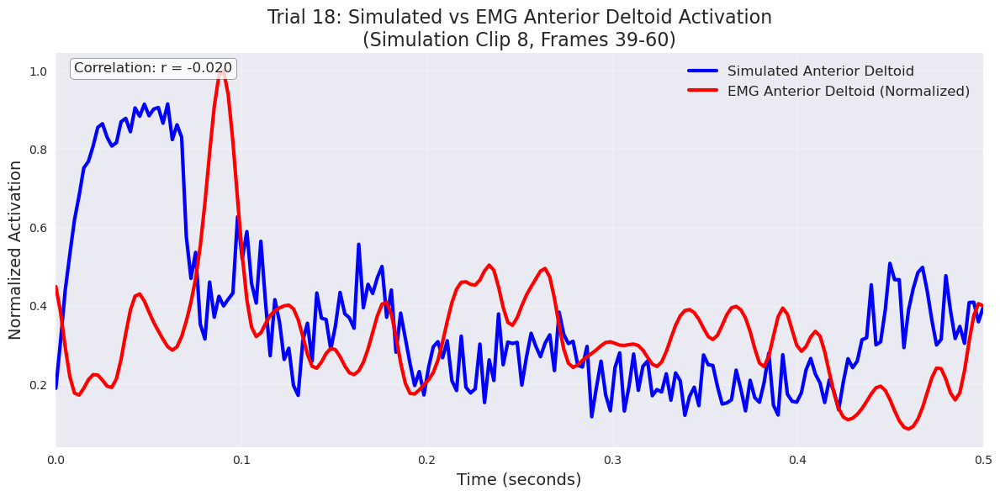

Trial 18 (Simulation clip 8)
EMG normalization value (95th percentile): 0.006855


In [ ]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal
import re

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# --------------------------- EXTRACT TRIAL MAPPING FROM CONFIG -----------------------------------
# From mouse-arm.yaml data_path - extract trial numbers used in simulation
config_data_path = "/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial01_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial04_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial09_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial10_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial13_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial15_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial16_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial17_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial19_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial20_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial23_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial24_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial25_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial27_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial29_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial34_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial35_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial36_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial38_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial40_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial42_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial43_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial44_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial45_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial46_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial47_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial49_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial52_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial53_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial55_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial56_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial57_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial58_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial59_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial60_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial61_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial62_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial63_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial65_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial66_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial70_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial71_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial73_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial74_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial75_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial76_ik.h5"

# Extract trial numbers from the config data_path
trial_pattern = r'trial(\d+)_ik\.h5'
simulation_trial_numbers = []
for path in config_data_path.split(','):
    match = re.search(trial_pattern, path)
    if match:
        trial_num = int(match.group(1))
        simulation_trial_numbers.append(trial_num - 1)  # Convert to 0-indexed

# --------------------------- LOAD DATA -----------------------------------
H5_PATH = "rollouts_full_mouse_arm.h5"
ANTERIOR_DELTOID_IDX = 3
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Load simulated muscle activation data
with h5py.File(H5_PATH, "r") as f:
    actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)

n_clips, T, _ = actions.shape
sim_time_s = np.linspace(0, 0.5, T)  # 0 → 0.5 s for 200 steps at 400 Hz

# Load the trial data and EMG data
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')
emg_data = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv', header=None)

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20
lowpass_cutoff = 1000
envelope_cutoff = 50
filter_order = 4
target_fs = 400
downsample_factor = fs // target_fs

# --------------------------- SELECT TRIAL FOR COMPARISON -----------------------------------
selected_trial = 18  # Trial 16 as shown in your output
sim_clip_idx = simulation_trial_numbers.index(selected_trial)

# --------------------------- EXTRACT SIMULATED DATA FOR SELECTED TRIAL -----------------------------------
sim_muscle_trace = actions[sim_clip_idx, :, ANTERIOR_DELTOID_IDX]

# --------------------------- EXTRACT EMG DATA FOR SELECTED TRIAL -----------------------------------
# Get trial info from CSV
trial_row = df.iloc[selected_trial]
start_frame = trial_row['start']
end_frame = trial_row['end']

# Convert to EMG sample indices
emg_reach_start = int(1/200 * start_frame * 30000)
emg_reach_end = emg_reach_start + 15000  # 0.5 seconds

# Get EMG data for this trial
trial_emg = emg_data.iloc[selected_trial, :]

# Process EMG signal
b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
filtered_emg = signal.filtfilt(b, a, trial_emg)

rectified_emg = np.abs(filtered_emg)

b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)

# Extract envelope during reach period
reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]

# Downsample EMG to match simulation sampling rate
n_samples = len(reach_envelope)
n_chunks = n_samples // downsample_factor

# Trim to exact multiple of downsample_factor
trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]

# Reshape and average
reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
downsampled_envelope = np.mean(reshaped, axis=1)

# Trim to match simulation length (200 samples)
downsampled_envelope = downsampled_envelope[:200]
emg_time_axis = np.linspace(0, 0.5, len(downsampled_envelope))

# Normalize EMG (using 95th percentile as before)
norm_value = np.percentile(downsampled_envelope, 100)
normalized_emg = downsampled_envelope / norm_value

# --------------------------- PLOT SINGLE NORMALIZED COMPARISON -----------------------------------
plt.figure(figsize=(12, 6))

plt.plot(sim_time_s, sim_muscle_trace, 'b-', linewidth=3, label='Simulated Anterior Deltoid')
plt.plot(emg_time_axis, normalized_emg, 'r-', linewidth=3, label='EMG Anterior Deltoid (Normalized)')

plt.ylabel('Normalized Activation', fontsize=14)
plt.xlabel('Time (seconds)', fontsize=14)
plt.title(f'Trial {selected_trial}: Simulated vs EMG Anterior Deltoid Activation\n(Simulation Clip {sim_clip_idx}, Frames {start_frame:.0f}-{end_frame:.0f})', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.xlim(0, 0.5)

# Calculate and display correlation
correlation = np.corrcoef(sim_muscle_trace, normalized_emg)[0, 1]
plt.text(0.02, 0.95, f'Correlation: r = {correlation:.3f}', 
         transform=plt.gca().transAxes, fontsize=12, 
         bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

plt.tight_layout()
plt.show()

print(f"Trial {selected_trial} (Simulation clip {sim_clip_idx})")
#print(f"Correlation: {correlation:.3f}")
print(f"EMG normalization value (95th percentile): {norm_value:.6f}")

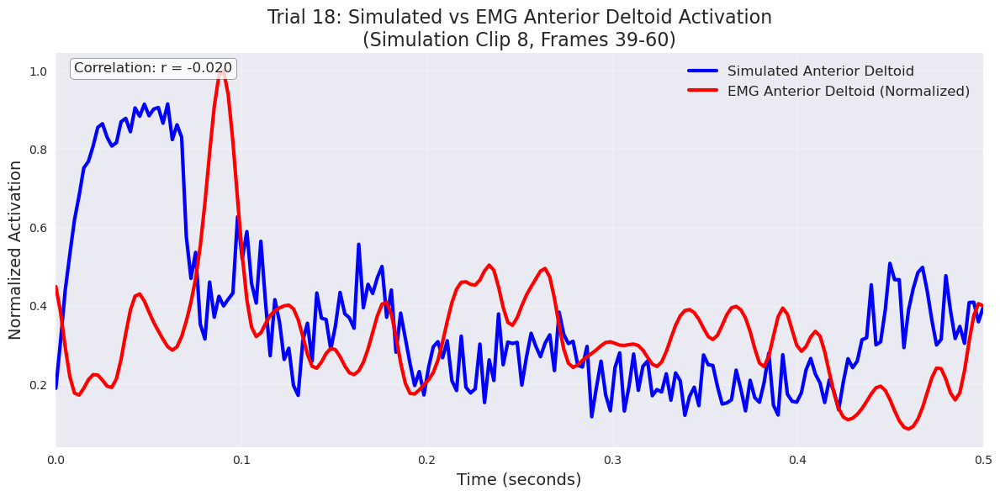

Trial 18 (Simulation clip 8)
EMG normalization value (95th percentile): 0.006855


In [ ]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal
import re

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# --------------------------- EXTRACT TRIAL MAPPING FROM CONFIG -----------------------------------
# From mouse-arm.yaml data_path - extract trial numbers used in simulation
config_data_path = "/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial01_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial04_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial09_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial10_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial13_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial15_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial16_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial17_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial19_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial20_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial23_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial24_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial25_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial27_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial29_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial34_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial35_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial36_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial38_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial40_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial42_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial43_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial44_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial45_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial46_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial47_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial49_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial52_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial53_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial55_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial56_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial57_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial58_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial59_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial60_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial61_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial62_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial63_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial65_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial66_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial70_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial71_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial73_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial74_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial75_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial76_ik.h5"

# Extract trial numbers from the config data_path
trial_pattern = r'trial(\d+)_ik\.h5'
simulation_trial_numbers = []
for path in config_data_path.split(','):
    match = re.search(trial_pattern, path)
    if match:
        trial_num = int(match.group(1))
        simulation_trial_numbers.append(trial_num - 1)  # Convert to 0-indexed

# --------------------------- LOAD DATA -----------------------------------
H5_PATH = "rollouts_full_mouse_arm.h5"
ANTERIOR_DELTOID_IDX = 3
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Load simulated muscle activation data
with h5py.File(H5_PATH, "r") as f:
    actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)

n_clips, T, _ = actions.shape
sim_time_s = np.linspace(0, 0.5, T)  # 0 → 0.5 s for 200 steps at 400 Hz

# Load the trial data and EMG data
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')
emg_data = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv', header=None)

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20
lowpass_cutoff = 1000
envelope_cutoff = 50
filter_order = 4
target_fs = 400
downsample_factor = fs // target_fs

# --------------------------- SELECT TRIAL FOR COMPARISON -----------------------------------
selected_trial = 18  # Trial 16 as shown in your output
sim_clip_idx = simulation_trial_numbers.index(selected_trial)

# --------------------------- EXTRACT SIMULATED DATA FOR SELECTED TRIAL -----------------------------------
sim_muscle_trace = actions[sim_clip_idx, :, ANTERIOR_DELTOID_IDX]

# --------------------------- EXTRACT EMG DATA FOR SELECTED TRIAL -----------------------------------
# Get trial info from CSV
trial_row = df.iloc[selected_trial]
start_frame = trial_row['start']
end_frame = trial_row['end']

# Convert to EMG sample indices
emg_reach_start = int(1/200 * start_frame * 30000)
emg_reach_end = emg_reach_start + 15000  # 0.5 seconds

# Get EMG data for this trial
trial_emg = emg_data.iloc[selected_trial, :]

# Process EMG signal
b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
filtered_emg = signal.filtfilt(b, a, trial_emg)

rectified_emg = np.abs(filtered_emg)

b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)

# Extract envelope during reach period
reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]

# Downsample EMG to match simulation sampling rate
n_samples = len(reach_envelope)
n_chunks = n_samples // downsample_factor

# Trim to exact multiple of downsample_factor
trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]

# Reshape and average
reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
downsampled_envelope = np.mean(reshaped, axis=1)

# Trim to match simulation length (200 samples)
downsampled_envelope = downsampled_envelope[:200]
emg_time_axis = np.linspace(0, 0.5, len(downsampled_envelope))

# Normalize EMG (using 95th percentile as before)
norm_value = np.percentile(downsampled_envelope, 100)
normalized_emg = downsampled_envelope / norm_value

# --------------------------- PLOT SINGLE NORMALIZED COMPARISON -----------------------------------
plt.figure(figsize=(12, 6))

plt.plot(sim_time_s, sim_muscle_trace, 'b-', linewidth=3, label='Simulated Anterior Deltoid')
plt.plot(emg_time_axis, normalized_emg, 'r-', linewidth=3, label='EMG Anterior Deltoid (Normalized)')

plt.ylabel('Normalized Activation', fontsize=14)
plt.xlabel('Time (seconds)', fontsize=14)
plt.title(f'Trial {selected_trial}: Simulated vs EMG Anterior Deltoid Activation\n(Simulation Clip {sim_clip_idx}, Frames {start_frame:.0f}-{end_frame:.0f})', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.xlim(0, 0.5)

# Calculate and display correlation
correlation = np.corrcoef(sim_muscle_trace, normalized_emg)[0, 1]
plt.text(0.02, 0.95, f'Correlation: r = {correlation:.3f}', 
         transform=plt.gca().transAxes, fontsize=12, 
         bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

plt.tight_layout()
plt.show()

print(f"Trial {selected_trial} (Simulation clip {sim_clip_idx})")
#print(f"Correlation: {correlation:.3f}")
print(f"EMG normalization value (95th percentile): {norm_value:.6f}")

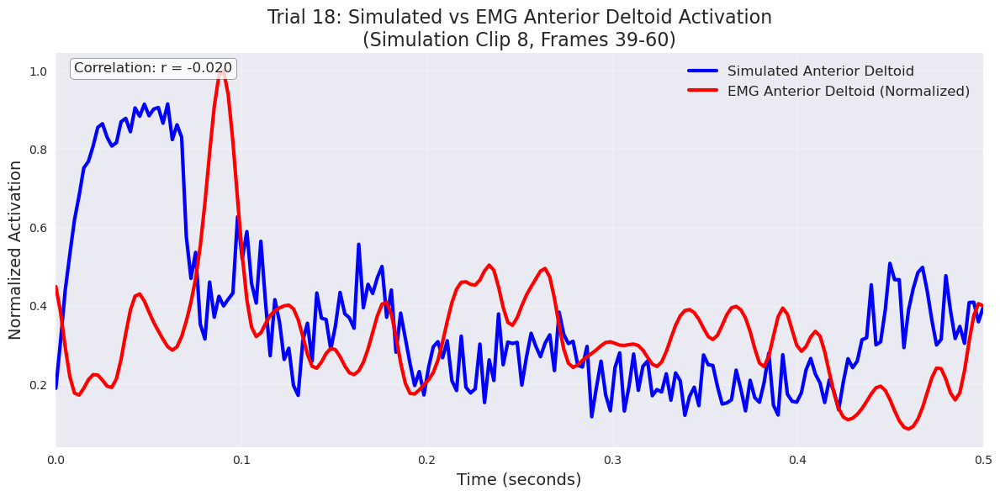

Trial 18 (Simulation clip 8)
EMG normalization value (95th percentile): 0.006855


In [ ]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal
import re

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# --------------------------- EXTRACT TRIAL MAPPING FROM CONFIG -----------------------------------
# From mouse-arm.yaml data_path - extract trial numbers used in simulation
config_data_path = "/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial01_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial04_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial09_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial10_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial13_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial15_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial16_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial17_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial19_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial20_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial23_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial24_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial25_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial27_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial29_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial34_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial35_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial36_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial38_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial40_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial42_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial43_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial44_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial45_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial46_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial47_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial49_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial52_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial53_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial55_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial56_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial57_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial58_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial59_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial60_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial61_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial62_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial63_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial65_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial66_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial70_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial71_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial73_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial74_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial75_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial76_ik.h5"

# Extract trial numbers from the config data_path
trial_pattern = r'trial(\d+)_ik\.h5'
simulation_trial_numbers = []
for path in config_data_path.split(','):
    match = re.search(trial_pattern, path)
    if match:
        trial_num = int(match.group(1))
        simulation_trial_numbers.append(trial_num - 1)  # Convert to 0-indexed

# --------------------------- LOAD DATA -----------------------------------
H5_PATH = "rollouts_full_mouse_arm.h5"
ANTERIOR_DELTOID_IDX = 3
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Load simulated muscle activation data
with h5py.File(H5_PATH, "r") as f:
    actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)

n_clips, T, _ = actions.shape
sim_time_s = np.linspace(0, 0.5, T)  # 0 → 0.5 s for 200 steps at 400 Hz

# Load the trial data and EMG data
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')
emg_data = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv', header=None)

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20
lowpass_cutoff = 1000
envelope_cutoff = 50
filter_order = 4
target_fs = 400
downsample_factor = fs // target_fs

# --------------------------- SELECT TRIAL FOR COMPARISON -----------------------------------
selected_trial = 18  # Trial 16 as shown in your output
sim_clip_idx = simulation_trial_numbers.index(selected_trial)

# --------------------------- EXTRACT SIMULATED DATA FOR SELECTED TRIAL -----------------------------------
sim_muscle_trace = actions[sim_clip_idx, :, ANTERIOR_DELTOID_IDX]

# --------------------------- EXTRACT EMG DATA FOR SELECTED TRIAL -----------------------------------
# Get trial info from CSV
trial_row = df.iloc[selected_trial]
start_frame = trial_row['start']
end_frame = trial_row['end']

# Convert to EMG sample indices
emg_reach_start = int(1/200 * start_frame * 30000)
emg_reach_end = emg_reach_start + 15000  # 0.5 seconds

# Get EMG data for this trial
trial_emg = emg_data.iloc[selected_trial, :]

# Process EMG signal
b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
filtered_emg = signal.filtfilt(b, a, trial_emg)

rectified_emg = np.abs(filtered_emg)

b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)

# Extract envelope during reach period
reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]

# Downsample EMG to match simulation sampling rate
n_samples = len(reach_envelope)
n_chunks = n_samples // downsample_factor

# Trim to exact multiple of downsample_factor
trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]

# Reshape and average
reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
downsampled_envelope = np.mean(reshaped, axis=1)

# Trim to match simulation length (200 samples)
downsampled_envelope = downsampled_envelope[:200]
emg_time_axis = np.linspace(0, 0.5, len(downsampled_envelope))

# Normalize EMG (using 95th percentile as before)
norm_value = np.percentile(downsampled_envelope, 100)
normalized_emg = downsampled_envelope / norm_value

# --------------------------- PLOT SINGLE NORMALIZED COMPARISON -----------------------------------
plt.figure(figsize=(12, 6))

plt.plot(sim_time_s, sim_muscle_trace, 'b-', linewidth=3, label='Simulated Anterior Deltoid')
plt.plot(emg_time_axis, normalized_emg, 'r-', linewidth=3, label='EMG Anterior Deltoid (Normalized)')

plt.ylabel('Normalized Activation', fontsize=14)
plt.xlabel('Time (seconds)', fontsize=14)
plt.title(f'Trial {selected_trial}: Simulated vs EMG Anterior Deltoid Activation\n(Simulation Clip {sim_clip_idx}, Frames {start_frame:.0f}-{end_frame:.0f})', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.xlim(0, 0.5)

# Calculate and display correlation
correlation = np.corrcoef(sim_muscle_trace, normalized_emg)[0, 1]
plt.text(0.02, 0.95, f'Correlation: r = {correlation:.3f}', 
         transform=plt.gca().transAxes, fontsize=12, 
         bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

plt.tight_layout()
plt.show()

print(f"Trial {selected_trial} (Simulation clip {sim_clip_idx})")
#print(f"Correlation: {correlation:.3f}")
print(f"EMG normalization value (95th percentile): {norm_value:.6f}")

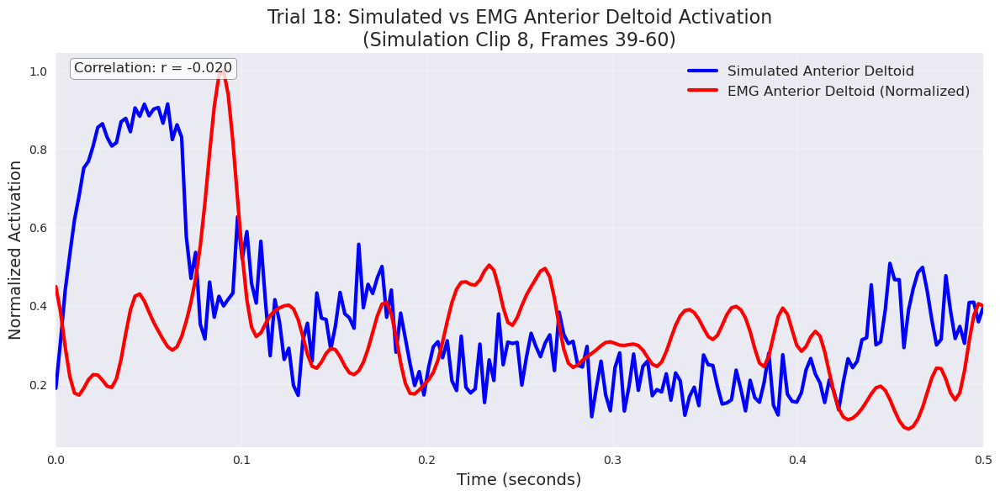

Trial 18 (Simulation clip 8)
EMG normalization value (95th percentile): 0.006855


In [ ]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal
import re

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# --------------------------- EXTRACT TRIAL MAPPING FROM CONFIG -----------------------------------
# From mouse-arm.yaml data_path - extract trial numbers used in simulation
config_data_path = "/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial01_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial04_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial09_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial10_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial13_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial15_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial16_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial17_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial19_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial20_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial23_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial24_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial25_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial27_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial29_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial34_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial35_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial36_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial38_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial40_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial42_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial43_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial44_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial45_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial46_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial47_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial49_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial52_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial53_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial55_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial56_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial57_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial58_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial59_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial60_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial61_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial62_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial63_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial65_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial66_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial70_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial71_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial73_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial74_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial75_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial76_ik.h5"

# Extract trial numbers from the config data_path
trial_pattern = r'trial(\d+)_ik\.h5'
simulation_trial_numbers = []
for path in config_data_path.split(','):
    match = re.search(trial_pattern, path)
    if match:
        trial_num = int(match.group(1))
        simulation_trial_numbers.append(trial_num - 1)  # Convert to 0-indexed

# --------------------------- LOAD DATA -----------------------------------
H5_PATH = "rollouts_full_mouse_arm.h5"
ANTERIOR_DELTOID_IDX = 3
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Load simulated muscle activation data
with h5py.File(H5_PATH, "r") as f:
    actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)

n_clips, T, _ = actions.shape
sim_time_s = np.linspace(0, 0.5, T)  # 0 → 0.5 s for 200 steps at 400 Hz

# Load the trial data and EMG data
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')
emg_data = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv', header=None)

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20
lowpass_cutoff = 1000
envelope_cutoff = 50
filter_order = 4
target_fs = 400
downsample_factor = fs // target_fs

# --------------------------- SELECT TRIAL FOR COMPARISON -----------------------------------
selected_trial = 18  # Trial 16 as shown in your output
sim_clip_idx = simulation_trial_numbers.index(selected_trial)

# --------------------------- EXTRACT SIMULATED DATA FOR SELECTED TRIAL -----------------------------------
sim_muscle_trace = actions[sim_clip_idx, :, ANTERIOR_DELTOID_IDX]

# --------------------------- EXTRACT EMG DATA FOR SELECTED TRIAL -----------------------------------
# Get trial info from CSV
trial_row = df.iloc[selected_trial]
start_frame = trial_row['start']
end_frame = trial_row['end']

# Convert to EMG sample indices
emg_reach_start = int(1/200 * start_frame * 30000)
emg_reach_end = emg_reach_start + 15000  # 0.5 seconds

# Get EMG data for this trial
trial_emg = emg_data.iloc[selected_trial, :]

# Process EMG signal
b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
filtered_emg = signal.filtfilt(b, a, trial_emg)

rectified_emg = np.abs(filtered_emg)

b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)

# Extract envelope during reach period
reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]

# Downsample EMG to match simulation sampling rate
n_samples = len(reach_envelope)
n_chunks = n_samples // downsample_factor

# Trim to exact multiple of downsample_factor
trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]

# Reshape and average
reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
downsampled_envelope = np.mean(reshaped, axis=1)

# Trim to match simulation length (200 samples)
downsampled_envelope = downsampled_envelope[:200]
emg_time_axis = np.linspace(0, 0.5, len(downsampled_envelope))

# Normalize EMG (using 95th percentile as before)
norm_value = np.percentile(downsampled_envelope, 100)
normalized_emg = downsampled_envelope / norm_value

# --------------------------- PLOT SINGLE NORMALIZED COMPARISON -----------------------------------
plt.figure(figsize=(12, 6))

plt.plot(sim_time_s, sim_muscle_trace, 'b-', linewidth=3, label='Simulated Anterior Deltoid')
plt.plot(emg_time_axis, normalized_emg, 'r-', linewidth=3, label='EMG Anterior Deltoid (Normalized)')

plt.ylabel('Normalized Activation', fontsize=14)
plt.xlabel('Time (seconds)', fontsize=14)
plt.title(f'Trial {selected_trial}: Simulated vs EMG Anterior Deltoid Activation\n(Simulation Clip {sim_clip_idx}, Frames {start_frame:.0f}-{end_frame:.0f})', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.xlim(0, 0.5)

# Calculate and display correlation
correlation = np.corrcoef(sim_muscle_trace, normalized_emg)[0, 1]
plt.text(0.02, 0.95, f'Correlation: r = {correlation:.3f}', 
         transform=plt.gca().transAxes, fontsize=12, 
         bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

plt.tight_layout()
plt.show()

print(f"Trial {selected_trial} (Simulation clip {sim_clip_idx})")
#print(f"Correlation: {correlation:.3f}")
print(f"EMG normalization value (95th percentile): {norm_value:.6f}")

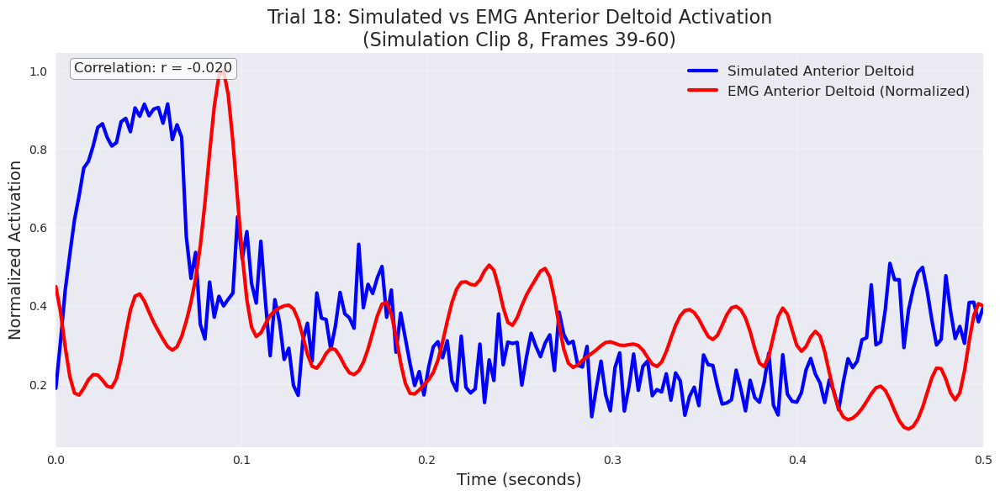

Trial 18 (Simulation clip 8)
EMG normalization value (95th percentile): 0.006855


In [6]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal
import re

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# --------------------------- EXTRACT TRIAL MAPPING FROM CONFIG -----------------------------------
# From mouse-arm.yaml data_path - extract trial numbers used in simulation
config_data_path = "/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial01_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial04_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial09_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial10_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial13_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial15_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial16_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial17_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial19_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial20_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial23_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial24_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial25_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial27_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial29_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial34_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial35_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial36_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial38_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial40_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial42_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial43_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial44_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial45_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial46_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial47_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial49_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial52_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial53_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial55_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial56_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial57_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial58_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial59_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial60_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial61_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial62_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial63_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial65_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial66_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial70_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial71_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial73_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial74_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial75_ik.h5,/root/vast/eric/stac-mjx/refined_STACed_data/A36-1_2023-07-18_16-54-01_lightOff_trial76_ik.h5"

# Extract trial numbers from the config data_path
trial_pattern = r'trial(\d+)_ik\.h5'
simulation_trial_numbers = []
for path in config_data_path.split(','):
    match = re.search(trial_pattern, path)
    if match:
        trial_num = int(match.group(1))
        simulation_trial_numbers.append(trial_num - 1)  # Convert to 0-indexed

# --------------------------- LOAD DATA -----------------------------------
H5_PATH = "rollouts_full_mouse_arm.h5"
ANTERIOR_DELTOID_IDX = 3
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Load simulated muscle activation data
with h5py.File(H5_PATH, "r") as f:
    actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)

n_clips, T, _ = actions.shape
sim_time_s = np.linspace(0, 0.5, T)  # 0 → 0.5 s for 200 steps at 400 Hz

# Load the trial data and EMG data
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')
emg_data = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv', header=None)

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20
lowpass_cutoff = 1000
envelope_cutoff = 50
filter_order = 4
target_fs = 400
downsample_factor = fs // target_fs

# --------------------------- SELECT TRIAL FOR COMPARISON -----------------------------------
selected_trial = 18  # Trial 16 as shown in your output
sim_clip_idx = simulation_trial_numbers.index(selected_trial)

# --------------------------- EXTRACT SIMULATED DATA FOR SELECTED TRIAL -----------------------------------
sim_muscle_trace = actions[sim_clip_idx, :, ANTERIOR_DELTOID_IDX]

# --------------------------- EXTRACT EMG DATA FOR SELECTED TRIAL -----------------------------------
# Get trial info from CSV
trial_row = df.iloc[selected_trial]
start_frame = trial_row['start']
end_frame = trial_row['end']

# Convert to EMG sample indices
emg_reach_start = int(1/200 * start_frame * 30000)
emg_reach_end = emg_reach_start + 15000  # 0.5 seconds

# Get EMG data for this trial
trial_emg = emg_data.iloc[selected_trial, :]

# Process EMG signal
b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
filtered_emg = signal.filtfilt(b, a, trial_emg)

rectified_emg = np.abs(filtered_emg)

b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)

# Extract envelope during reach period
reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]

# Downsample EMG to match simulation sampling rate
n_samples = len(reach_envelope)
n_chunks = n_samples // downsample_factor

# Trim to exact multiple of downsample_factor
trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]

# Reshape and average
reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
downsampled_envelope = np.mean(reshaped, axis=1)

# Trim to match simulation length (200 samples)
downsampled_envelope = downsampled_envelope[:200]
emg_time_axis = np.linspace(0, 0.5, len(downsampled_envelope))

# Normalize EMG (using 95th percentile as before)
norm_value = np.percentile(downsampled_envelope, 100)
normalized_emg = downsampled_envelope / norm_value

# --------------------------- PLOT SINGLE NORMALIZED COMPARISON -----------------------------------
plt.figure(figsize=(12, 6))

plt.plot(sim_time_s, sim_muscle_trace, 'b-', linewidth=3, label='Simulated Anterior Deltoid')
plt.plot(emg_time_axis, normalized_emg, 'r-', linewidth=3, label='EMG Anterior Deltoid (Normalized)')

plt.ylabel('Normalized Activation', fontsize=14)
plt.xlabel('Time (seconds)', fontsize=14)
plt.title(f'Trial {selected_trial}: Simulated vs EMG Anterior Deltoid Activation\n(Simulation Clip {sim_clip_idx}, Frames {start_frame:.0f}-{end_frame:.0f})', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.xlim(0, 0.5)

# Calculate and display correlation
correlation = np.corrcoef(sim_muscle_trace, normalized_emg)[0, 1]
plt.text(0.02, 0.95, f'Correlation: r = {correlation:.3f}', 
         transform=plt.gca().transAxes, fontsize=12, 
         bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

plt.tight_layout()
plt.show()

print(f"Trial {selected_trial} (Simulation clip {sim_clip_idx})")
#print(f"Correlation: {correlation:.3f}")
print(f"EMG normalization value (95th percentile): {norm_value:.6f}")

In [7]:
# Import additional libraries needed for PCA
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

# ------------- DEFINE NEEDED FUNCTION -------------
# Define function to process EMG data and return individual trial data
def process_emg_data_individual_trials(emg_file_path):
    """Process EMG data and return individual trial envelopes for error calculation"""
    # Load EMG data
    emg_data = pd.read_csv(emg_file_path, header=None)
    print(f"    Loaded EMG data: {len(emg_data)} trials")
    
    # Process only valid trials using the trial mask
    reach_envelopes_downsampled = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        # idx is the original trial number from the CSV (the index from df)
        trial_num = idx
        
        # Convert reach start index from 200Hz frames to 30000Hz samples
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + 15000  # 0.5 seconds
        
        # Get EMG data for this specific trial (using original trial index)
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Downsample by averaging chunks
                    n_samples = len(reach_envelope)
                    n_chunks = n_samples // downsample_factor
                    
                    # Trim to exact multiple of downsample_factor
                    trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]
                    
                    # Reshape and average
                    reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
                    downsampled_envelope = np.mean(reshaped, axis=1)
                    
                    # Only keep if we have the target number of samples (200)
                    if len(downsampled_envelope) >= target_samples:
                        downsampled_envelope = downsampled_envelope[:target_samples]
                        reach_envelopes_downsampled.append(downsampled_envelope)
                        
                        if i < 5:  # Debug info for first few trials
                            print(f"      Trial {trial_num}: {n_samples} → {len(downsampled_envelope)} samples")
        else:
            print(f"      Trial {trial_num}: EMG data index out of range")
    
    if not reach_envelopes_downsampled:
        return None
    
    # Convert to numpy array
    envelopes_array = np.array(reach_envelopes_downsampled)
    print(f"    Final EMG data shape: {envelopes_array.shape}")
    
    # ROBUST EMG NORMALIZATION:
    # Normalize by the 98th percentile of all observed values
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    print(f"    EMG normalization: 98th percentile = {norm_value:.6f}")
    
    return normalized_envelopes

# ------------- COLLECT ALL SIMULATED AND EMG DATA FOR PCA -------------
print("Collecting data for PCA analysis...")

# For simulated data, we already have the actions array loaded
sim_data = []

# For EMG data, we need to collect the processed traces
emg_data = []

# Process each muscle in the configuration
for muscle_idx, sim_name, emg_file, emg_name in MUSCLE_CONFIGS:
    print(f"Processing {sim_name} vs {emg_name}...")
    
    # Get simulated data for this muscle
    sim_traces = actions[:, :, muscle_idx]  # Shape: (n_clips, T)
    
    # Get EMG data for this muscle - use our defined function
    emg_traces = process_emg_data_individual_trials(emg_file)
    
    if emg_traces is not None and len(emg_traces) == n_clips:
        # Add to our collection arrays
        sim_data.append(sim_traces)
        emg_data.append(emg_traces)
        print(f"✓ Added {sim_name}/{emg_name} data: {sim_traces.shape}")
    else:
        print(f"✗ Skipping {sim_name}/{emg_name} - data issue")

# Convert to arrays and reshape for PCA
if len(sim_data) > 0 and len(emg_data) > 0:
    # Stack arrays along the muscles dimension
    sim_data = np.stack(sim_data, axis=2)  # Shape: (n_clips, T, n_muscles)
    emg_data = np.stack(emg_data, axis=2)  # Shape: (n_clips, T, n_muscles)

    print(f"Final simulated data shape: {sim_data.shape}")
    print(f"Final EMG data shape: {emg_data.shape}")

    # Reshape for PCA: (n_clips, T, n_muscles) -> (n_clips, T*n_muscles)
    n_clips, T, n_muscles = sim_data.shape
    sim_reshaped = sim_data.reshape(n_clips, T*n_muscles)
    emg_reshaped = emg_data.reshape(n_clips, T*n_muscles)

    print(f"Reshaped for PCA - Simulated: {sim_reshaped.shape}, EMG: {emg_reshaped.shape}")

    # ------------- PERFORM PCA -------------
    # Perform PCA on simulated data
    pca_sim = PCA(n_components=3)
    sim_pca = pca_sim.fit_transform(sim_reshaped)
    sim_explained_var = pca_sim.explained_variance_ratio_ * 100

    # Perform PCA on EMG data
    pca_emg = PCA(n_components=3)
    emg_pca = pca_emg.fit_transform(emg_reshaped)
    emg_explained_var = pca_emg.explained_variance_ratio_ * 100

    print(f"PCA complete - Simulated: {sim_pca.shape}, EMG: {emg_pca.shape}")
    print(f"Variance explained (Simulated): {sim_explained_var}")
    print(f"Variance explained (EMG): {emg_explained_var}")

    # ------------- CREATE 3D PLOTS -------------
    fig = plt.figure(figsize=(20, 10))

    # Plot simulated data
    ax1 = fig.add_subplot(121, projection='3d')
    scatter1 = ax1.scatter(sim_pca[:, 0], sim_pca[:, 1], sim_pca[:, 2], 
                         c=np.arange(len(sim_pca)), cmap='viridis', alpha=0.8, s=50)
    ax1.set_xlabel(f'PC1 ({sim_explained_var[0]:.1f}%)')
    ax1.set_ylabel(f'PC2 ({sim_explained_var[1]:.1f}%)')
    ax1.set_zlabel(f'PC3 ({sim_explained_var[2]:.1f}%)')
    ax1.set_title('PCA of Simulated Muscle Activations', fontsize=16)

    # Plot EMG data
    ax2 = fig.add_subplot(122, projection='3d')
    scatter2 = ax2.scatter(emg_pca[:, 0], emg_pca[:, 1], emg_pca[:, 2], 
                         c=np.arange(len(emg_pca)), cmap='plasma', alpha=0.8, s=50)
    ax2.set_xlabel(f'PC1 ({emg_explained_var[0]:.1f}%)')
    ax2.set_ylabel(f'PC2 ({emg_explained_var[1]:.1f}%)')
    ax2.set_zlabel(f'PC3 ({emg_explained_var[2]:.1f}%)')
    ax2.set_title('PCA of EMG Data', fontsize=16)

    # Add colorbars
    cbar1 = plt.colorbar(scatter1, ax=ax1, shrink=0.7)
    cbar1.set_label('Trial Index')
    cbar2 = plt.colorbar(scatter2, ax=ax2, shrink=0.7)
    cbar2.set_label('Trial Index')

    plt.tight_layout()
    plt.show()

    # ------------- PLOT VARIANCE EXPLAINED -------------
    plt.figure(figsize=(12, 6))
    components = range(1, 4)
    bar_width = 0.35
    x = np.arange(len(components))

    plt.bar(x - bar_width/2, sim_explained_var, width=bar_width, label='Simulated', color='tab:blue', alpha=0.8)
    plt.bar(x + bar_width/2, emg_explained_var, width=bar_width, label='EMG', color='tab:orange', alpha=0.8)

    plt.xlabel('Principal Component', fontsize=14)
    plt.ylabel('Explained Variance (%)', fontsize=14)
    plt.title('PCA Explained Variance: Simulated vs EMG', fontsize=16)
    plt.xticks(x, components)
    plt.legend(fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Add total variance explained text
    plt.figtext(0.5, 0.01, 
               f"Total variance explained - Simulated: {np.sum(sim_explained_var):.1f}%, EMG: {np.sum(emg_explained_var):.1f}%", 
               ha='center', fontsize=12, bbox=dict(facecolor='white', alpha=0.8))

    plt.tight_layout()
    plt.show()
else:
    print("No valid data collected for PCA analysis.")

Processing Anterior Deltoid vs Anterior Deltoid...
    Loaded EMG data: 77 trials


NameError: name 'valid_trials_df' is not defined

H5 contains 46 clips × 199 frames


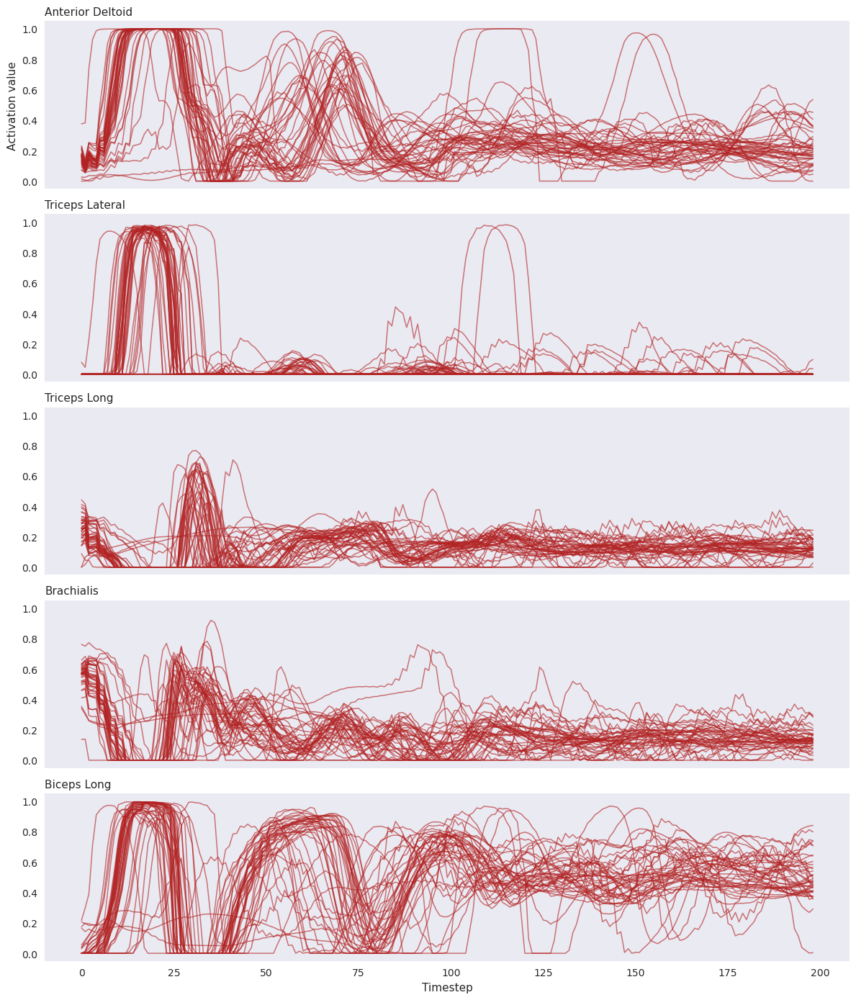

In [3]:
# %matplotlib inline
import h5py, numpy as np, matplotlib.pyplot as plt

H5_PATH        = "/root/vast/eric/track-mjx/results/neurIPS-paramsweep/big_sweep_ctrl_ctrldiff_energy/mouse_muscle_arm_imitation_params_CTRLCOST_0.1_CTRLDIFF_0.06_ENERGY_0.2_250901_015037_688400.h5"
CLIPS_TO_SHOW  = range(42)                     # which clips to overlay
TRACE_COLOR    = "firebrick"                   # single colour for all traces

# muscle index ➜ pretty name
MUSCLES = {
    3: "Anterior Deltoid",
    5: "Triceps Lateral",
    6: "Triceps Long",
    7: "Brachialis",
    8: "Biceps Long",
}

# ── load actions ──────────────────────────────────────────────────────────
with h5py.File(H5_PATH, "r") as h5:
    actions = h5["actions"][:, :, :]          # (clips, frames, dims)

n_clips, n_frames, _ = actions.shape
print(f"H5 contains {n_clips} clips × {n_frames} frames")

# ── plot ──────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(len(MUSCLES), 1,
                         figsize=(12, 2.8*len(MUSCLES)),
                         sharex=True, sharey=True)

for ax, (idx, name) in zip(axes, MUSCLES.items()):
    traces = np.clip(actions[:, :, idx], 0, 1)   # (clips, frames)

    for clip in CLIPS_TO_SHOW:
        ax.plot(traces[clip],
                lw=1.1,
                color=TRACE_COLOR,
                alpha=0.6)

    ax.set_title(name, loc="left", fontsize=11)
    ax.grid(False)

# tidy axes
axes[-1].set_xlabel("Timestep")
axes[0].set_ylabel("Activation value")
plt.tight_layout()
plt.show()

Simulated data: 46 clips, 199 timesteps


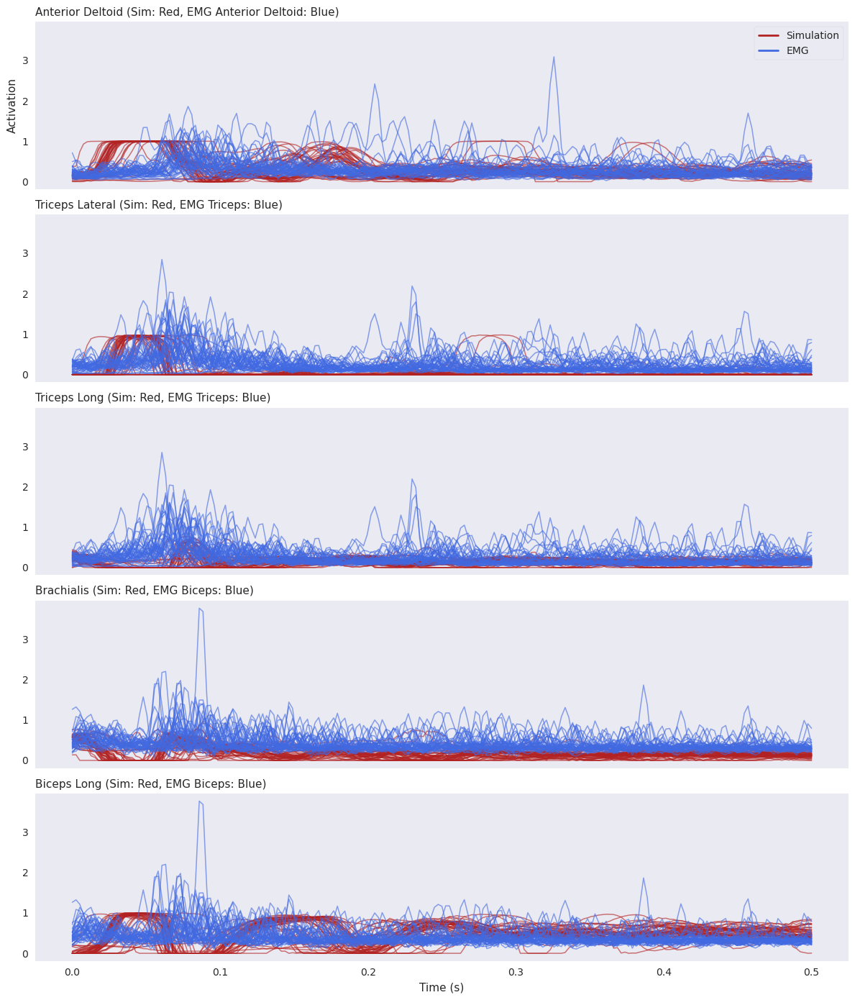

In [7]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# --------------------------- SIMULATED DATA SETTINGS -----------------------------------
H5_PATH = "/root/vast/eric/track-mjx/results/neurIPS-paramsweep/big_sweep_ctrl_ctrldiff_energy/mouse_muscle_arm_imitation_params_CTRLCOST_0.1_CTRLDIFF_0.06_ENERGY_0.2_250901_015037_688400.h5"
CLIPS_TO_SHOW = range(42)  # which clips to overlay
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Muscle configurations: (sim_index, sim_name, emg_file, emg_name)
MUSCLE_CONFIGS = [
    (3, "Anterior Deltoid", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Anterior Deltoid"),
    (5, "Triceps Lateral", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (6, "Triceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (7, "Brachialis", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
    (8, "Biceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
]

# Load simulated muscle activation data
with h5py.File(H5_PATH, "r") as f:
    actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)

n_clips, n_frames, _ = actions.shape
sim_time_s = np.linspace(0, 0.5, n_frames)  # 0 → 0.5 s for simulation steps
print(f"Simulated data: {n_clips} clips, {n_frames} timesteps")

# --------------------------- CREATE TRIAL MASK -----------------------------------
# Load the trial data (main CSV with reach indices)
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')

# Create trial mask: valid trials have non-zero, non-NaN start and end values
trial_mask = (
    (df['start'].notna()) & 
    (df['end'].notna()) & 
    (df['start'] > 0) & 
    (df['end'] > 0) &
    (df['start'] != df['end'])  # Make sure start != end
)

# Get the valid trials
valid_trials_df = df[trial_mask].copy()
valid_trial_indices = valid_trials_df.index.tolist()

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20  # High pass cutoff frequency in Hz
lowpass_cutoff = 1000  # Low pass cutoff frequency in Hz
envelope_cutoff = 100  # Envelope cutoff frequency in Hz
filter_order = 4  # Butterworth filter order

# Calculate downsampling parameters
target_fs = 400  # Target sampling rate to match simulation
downsample_factor = fs // target_fs
target_samples = n_frames  # Match simulation frame count

# Function to process EMG data for a given muscle
def process_emg_data(emg_file_path):
    """Process EMG data and return normalized envelope and statistics"""
    # Load EMG data
    emg_data = pd.read_csv(emg_file_path, header=None)
    
    # Process only valid trials using the trial mask
    reach_envelopes_downsampled = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        # idx is the original trial number from the CSV
        trial_num = idx
        
        # Convert reach start index from 200Hz frames to 30000Hz samples
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + 15000  # 0.5 seconds
        
        # Get EMG data for this specific trial (using original trial index)
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Downsample by averaging chunks
                    n_samples = len(reach_envelope)
                    n_chunks = n_samples // downsample_factor
                    
                    # Trim to exact multiple of downsample_factor
                    trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]
                    
                    # Reshape and average
                    reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
                    downsampled_envelope = np.mean(reshaped, axis=1)
                    
                    # Only keep if we have the target number of samples
                    if len(downsampled_envelope) >= target_samples:
                        downsampled_envelope = downsampled_envelope[:target_samples]
                        reach_envelopes_downsampled.append(downsampled_envelope)
    
    if not reach_envelopes_downsampled:
        return None
    
    # Convert to numpy array
    envelopes_array = np.array(reach_envelopes_downsampled)
    
    # Normalize by the 98th percentile
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    return normalized_envelopes

# --------------------------- CREATE THE OVERLAID PLOTS -----------------------------------
fig, axes = plt.subplots(len(MUSCLE_CONFIGS), 1, 
                        figsize=(12, 2.8*len(MUSCLE_CONFIGS)), 
                        sharex=True, sharey=True)

for ax_idx, (sim_idx, sim_name, emg_file, emg_name) in enumerate(MUSCLE_CONFIGS):
    ax = axes[ax_idx]
    
    # Extract simulation traces for this muscle
    sim_traces = np.clip(actions[:, :, sim_idx], 0, 1)
    
    # Plot simulation traces in red
    for clip in CLIPS_TO_SHOW:
        ax.plot(sim_time_s, sim_traces[clip], 
                lw=1.1, 
                color='firebrick', 
                alpha=0.6)
    
    # Process EMG data for this muscle
    emg_traces = process_emg_data(emg_file)
    
    if emg_traces is not None:
        # Plot EMG traces in blue
        for clip_idx in range(min(len(emg_traces), len(CLIPS_TO_SHOW))):
            ax.plot(sim_time_s, emg_traces[CLIPS_TO_SHOW[clip_idx]], 
                    lw=1.1, 
                    color='royalblue', 
                    alpha=0.6)
    
    # Add a title with both simulation and EMG names
    ax.set_title(f"{sim_name} (Sim: Red, EMG {emg_name}: Blue)", loc="left", fontsize=11)
    ax.grid(False)
    
    # Add legends to first plot
    if ax_idx == 0:
        sim_line = plt.Line2D([0], [0], color='firebrick', lw=2)
        emg_line = plt.Line2D([0], [0], color='royalblue', lw=2)
        ax.legend([sim_line, emg_line], ['Simulation', 'EMG'], 
                 loc='upper right', frameon=True)

# Tidy axes
axes[-1].set_xlabel("Time (s)")
axes[0].set_ylabel("Activation")
plt.tight_layout()
plt.show()

In [ ]:
actions.shape

(46, 200, 9)

In [8]:
save_path = Path(ckpt_path) / "rollout.h5"

In [9]:
utils.save_to_h5py(save_path.resolve(), single_rollout)

### Step 5: you can load it too

In [ ]:
rollout = utils.load_from_h5py(save_path)

## Render rollout

Note: Currently only works for single rollouts

#### Batch Generating Rollouts

Alternatively, you can use `jax.vmap` to parallelize the rollout function. This is useful for performing a rollout over an entire dataset for eval/analysis purposes. We pass in a 1D array of clip indexes (`clip_idxs`) as input. 

The first run for this will also have a few minutes of compilation time.

**Note:** `vmap` compiles based on the input shape. This means that if you use the same length for `clip_idxs`, JAX will reuse the compiled function for acceleration. However, if the input length changes, JAX will **recompile the entire function**, incurring additional overhead.

In [9]:
# Generate rollout for 5 clips simultaneously
jit_vmap_generate_rollout = jax.jit(jax.vmap(generate_rollout))
clip_idxs = jp.arange(0, 5)
jit_vmap_out = jit_vmap_generate_rollout(clip_idxs)

In [10]:
# Running it with a different clip_idxs length will cause reocmpilation
clip_idxs = jp.arange(15, 30)
jit_vmap_out2 = jit_vmap_generate_rollout(clip_idxs)

In [11]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal
import os
import re
import glob
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.mplot3d import Axes3D

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# ========== DATA LOADING AND PARAMETER EXTRACTION ==========

# Directory containing parameter sweep H5 files
SWEEP_DIR = "/root/vast/eric/track-mjx/results/neurIPS-paramsweep/big_sweep_ctrl_ctrldiff_energy/"

# Pattern to match H5 files and extract parameters
FILE_PATTERN = r"mouse_muscle_arm_imitation_params_CTRLCOST_(\d+\.\d+)_CTRLDIFF_(\d+\.\d+)_ENERGY_(\d+\.\d+)_\d+\.h5"

# Data bounds
CLIP_MIN, CLIP_MAX = 0.0, 1.0

def extract_params_from_filename(filename):
    """Extract control parameters from filename"""
    match = re.search(FILE_PATTERN, filename)
    if match:
        ctrl_cost = float(match.group(1))
        ctrl_diff = float(match.group(2))
        energy = float(match.group(3))
        return ctrl_cost, ctrl_diff, energy
    return None

# Find all H5 files and extract parameters
param_files = []
for h5_file in glob.glob(os.path.join(SWEEP_DIR, "*.h5")):
    params = extract_params_from_filename(os.path.basename(h5_file))
    if params:
        ctrl_cost, ctrl_diff, energy = params
        param_files.append({
            'filename': h5_file,
            'ctrl_cost': ctrl_cost,
            'ctrl_diff': ctrl_diff,
            'energy': energy
        })

# Convert to DataFrame for easier analysis
param_df = pd.DataFrame(param_files)

# Check what parameter values we have
unique_ctrl_costs = sorted(param_df['ctrl_cost'].unique())
unique_ctrl_diffs = sorted(param_df['ctrl_diff'].unique())
unique_energies = sorted(param_df['energy'].unique())

print(f"Found {len(param_df)} parameter combinations")
print(f"Control Cost values: {unique_ctrl_costs}")
print(f"Control Diff values: {unique_ctrl_diffs}")
print(f"Energy values: {unique_energies}")

# ========== EMG PROCESSING FUNCTIONS ==========

# Muscle configurations: (sim_index, sim_name, emg_file, emg_name)
MUSCLE_CONFIGS = [
    (3, "Anterior Deltoid", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Anterior Deltoid"),
    (5, "Triceps Lateral", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (6, "Triceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (7, "Brachialis", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
    (8, "Biceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
]

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20  # High pass cutoff frequency in Hz
lowpass_cutoff = 1000  # Low pass cutoff frequency in Hz
envelope_cutoff = 50  # Envelope cutoff frequency in Hz
filter_order = 4  # Butterworth filter order

# Calculate downsampling parameters
target_fs = 400  # Target sampling rate to match simulation
downsample_factor = fs // target_fs  # 30000 // 400 = 75 samples per chunk
target_samples = 199  # Number of samples we want (to match simulation)

# Load the trial data (main CSV with reach indices)
def get_valid_trials():
    df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')
    
    # Create trial mask: valid trials have non-zero, non-NaN start and end values
    trial_mask = (
        (df['start'].notna()) & 
        (df['end'].notna()) & 
        (df['start'] > 0) & 
        (df['end'] > 0) &
        (df['start'] != df['end'])  # Make sure start != end
    )
    
    # Get the valid trials
    valid_trials_df = df[trial_mask].copy()
    valid_trial_indices = valid_trials_df.index.tolist()
    
    print(f"Total trials in CSV: {len(df)}")
    print(f"Valid trials (non-zero start/end): {len(valid_trials_df)}")
    
    return valid_trials_df

# Function to process EMG data for a given muscle
def process_emg_data(emg_file_path, valid_trials_df):
    """Process EMG data and return normalized envelope and statistics"""
    # Load EMG data
    emg_data = pd.read_csv(emg_file_path, header=None)
    
    # Process only valid trials using the trial mask
    reach_envelopes_downsampled = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        # idx is the original trial number from the CSV (the index from df)
        trial_num = idx
        
        # Convert reach start index from 200Hz frames to 30000Hz samples
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + 15000  # 0.5 seconds
        
        # Get EMG data for this specific trial (using original trial index)
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Downsample by averaging chunks
                    n_samples = len(reach_envelope)
                    n_chunks = n_samples // downsample_factor
                    
                    # Trim to exact multiple of downsample_factor
                    trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]
                    
                    # Reshape and average
                    reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
                    downsampled_envelope = np.mean(reshaped, axis=1)
                    
                    # Only keep if we have the target number of samples (200)
                    if len(downsampled_envelope) >= target_samples:
                        downsampled_envelope = downsampled_envelope[:target_samples]
                        reach_envelopes_downsampled.append(downsampled_envelope)
        else:
            continue
    
    if not reach_envelopes_downsampled:
        return None, None
    
    # Convert to numpy array
    envelopes_array = np.array(reach_envelopes_downsampled)
    
    # ROBUST EMG NORMALIZATION:
    # Normalize by the 95th percentile of all observed values
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    # Calculate mean and standard deviation of normalized data
    mean_norm_envelope = np.mean(normalized_envelopes, axis=0)
    
    return mean_norm_envelope, len(reach_envelopes_downsampled)

# ========== CALCULATE CORRELATIONS FOR ALL PARAMETER COMBINATIONS ==========

# Get valid trials
valid_trials_df = get_valid_trials()

# Process EMG data for each muscle (only need to do this once)
processed_emg = {}
for muscle_idx, sim_name, emg_file, emg_name in MUSCLE_CONFIGS:
    emg_mean, n_reaches = process_emg_data(emg_file, valid_trials_df)
    if emg_mean is not None:
        key = f"{emg_name}_{sim_name}"
        processed_emg[key] = {
            'emg_mean': emg_mean,
            'n_reaches': n_reaches,
            'muscle_idx': muscle_idx,
            'sim_name': sim_name,
            'emg_name': emg_name
        }
        print(f"Processed {key}: {n_reaches} valid reaches")

# Calculate correlations for each parameter combination and muscle
results = []

for _, row in param_df.iterrows():
    h5_file = row['filename']
    ctrl_cost = row['ctrl_cost']
    ctrl_diff = row['ctrl_diff']
    energy = row['energy']
    
    print(f"Processing {os.path.basename(h5_file)}")
    
    try:
        with h5py.File(h5_file, "r") as f:
            actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)
        
        n_clips, T, _ = actions.shape
        
        # Check if we have enough clips
        if n_clips < 5:
            print(f"  WARNING: Only {n_clips} clips in file, skipping")
            continue
        
        # Process each muscle
        for key, emg_data in processed_emg.items():
            muscle_idx = emg_data['muscle_idx']
            emg_mean = emg_data['emg_mean']
            emg_name = emg_data['emg_name']
            sim_name = emg_data['sim_name']
            
            # Extract simulated data
            sim_traces = actions[:, :, muscle_idx]
            sim_mean = sim_traces.mean(0)
            
            # Calculate correlation
            correlation = np.corrcoef(sim_mean, emg_mean)[0, 1]
            
            # Store result
            results.append({
                'ctrl_cost': ctrl_cost,
                'ctrl_diff': ctrl_diff,
                'energy': energy,
                'muscle_key': key,
                'emg_name': emg_name,
                'sim_name': sim_name,
                'correlation': correlation
            })
            
            print(f"  {key}: correlation = {correlation:.3f}")
    
    except Exception as e:
        print(f"  Error processing {h5_file}: {str(e)}")

# Convert results to DataFrame
results_df = pd.DataFrame(results)
print(f"Generated {len(results_df)} correlation results")

# ========== CREATE HEATMAP FUNCTION ==========

def create_heatmap(data, x_param, y_param, fixed_param, fixed_value, title, muscle_name=None):
    """Create a heatmap for two parameters with a third parameter fixed"""
    # Filter data for the specific fixed parameter and muscle if provided
    filtered_data = data[(data[fixed_param] == fixed_value)]
    
    if muscle_name:
        filtered_data = filtered_data[filtered_data['muscle_key'].str.contains(muscle_name)]
    
    # Create pivot table for heatmap
    pivot_data = filtered_data.pivot_table(
        values='correlation', 
        index=y_param,
        columns=x_param,
        aggfunc='mean'
    )
    
    # Create figure
    fig, ax = plt.subplots(figsize=(10, 8))
    
    # Create custom colormap from blue to red
    colors = ['#3498db', '#f1c40f', '#e74c3c']  # Blue to yellow to red
    cmap = LinearSegmentedColormap.from_list('correlation_cmap', colors, N=100)
    
    # Create heatmap
    im = ax.imshow(pivot_data, cmap=cmap, aspect='auto', vmin=-1, vmax=1)
    
    # Set labels
    ax.set_xticks(np.arange(len(pivot_data.columns)))
    ax.set_yticks(np.arange(len(pivot_data.index)))
    ax.set_xticklabels([f"{val:.3f}" for val in pivot_data.columns])
    ax.set_yticklabels([f"{val:.3f}" for val in pivot_data.index])
    
    # Add color bar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    plt.colorbar(im, cax=cax)
    
    # Add text annotations with correlation values
    for i in range(len(pivot_data.index)):
        for j in range(len(pivot_data.columns)):
            value = pivot_data.iloc[i, j]
            if not np.isnan(value):
                ax.text(j, i, f"{value:.2f}", ha="center", va="center", 
                        color="white" if abs(value) > 0.5 else "black",
                        fontweight="bold", fontsize=9)
    
    # Set title and labels
    ax.set_title(title, fontsize=14)
    ax.set_xlabel(f"{x_param.replace('_', ' ').title()}", fontsize=12)
    ax.set_ylabel(f"{y_param.replace('_', ' ').title()}", fontsize=12)
    
    # Adjust layout
    plt.tight_layout()
    return fig

# ========== GENERATE ALL HEATMAPS ==========

# Get unique parameter values
unique_energies = sorted(results_df['energy'].unique())
unique_ctrl_costs = sorted(results_df['ctrl_cost'].unique())
unique_ctrl_diffs = sorted(results_df['ctrl_diff'].unique())

# 1. Generate heatmaps for each fixed energy value (All muscles averaged)
for energy_val in unique_energies:
    fig = create_heatmap(
        results_df, 'ctrl_diff', 'ctrl_cost', 'energy', energy_val,
        f'EMG-Simulation Correlation\nEnergy={energy_val:.2f} (All Muscles)'
    )
    plt.savefig(f'heatmap_all_muscles_energy_{energy_val:.2f}.png', dpi=300, bbox_inches='tight')
    plt.show()

# 2. Generate heatmaps for each fixed ctrl_cost value (All muscles averaged)
for cost_val in unique_ctrl_costs:
    fig = create_heatmap(
        results_df, 'ctrl_diff', 'energy', 'ctrl_cost', cost_val,
        f'EMG-Simulation Correlation\nCtrl Cost={cost_val:.2f} (All Muscles)'
    )
    plt.savefig(f'heatmap_all_muscles_ctrl_cost_{cost_val:.2f}.png', dpi=300, bbox_inches='tight')
    plt.show()

# 3. Generate heatmaps for each fixed ctrl_diff value (All muscles averaged)
for diff_val in unique_ctrl_diffs:
    fig = create_heatmap(
        results_df, 'ctrl_cost', 'energy', 'ctrl_diff', diff_val,
        f'EMG-Simulation Correlation\nCtrl Diff={diff_val:.2f} (All Muscles)'
    )
    plt.savefig(f'heatmap_all_muscles_ctrl_diff_{diff_val:.2f}.png', dpi=300, bbox_inches='tight')
    plt.show()

# 4. Generate muscle-specific heatmaps for fixed energy values
muscle_groups = {
    'Anterior Deltoid': ['Anterior Deltoid'],
    'Biceps': ['Biceps'],
    'Triceps': ['Triceps']
}

for energy_val in unique_energies:
    for muscle_name, search_terms in muscle_groups.items():
        for term in search_terms:
            fig = create_heatmap(
                results_df, 'ctrl_diff', 'ctrl_cost', 'energy', energy_val,
                f'{muscle_name} EMG-Simulation Correlation\nEnergy={energy_val:.2f}',
                muscle_name=term
            )
            plt.savefig(f'heatmap_{muscle_name.lower().replace(" ", "_")}_energy_{energy_val:.2f}.png', dpi=300, bbox_inches='tight')
            plt.show()

# ========== SUMMARY STATISTICS AND BEST PARAMETERS ==========

# Calculate summary statistics
print("=== Overall Correlation Statistics ===")
print(f"Mean correlation: {results_df['correlation'].mean():.3f}")
print(f"Median correlation: {results_df['correlation'].median():.3f}")
print(f"Min correlation: {results_df['correlation'].min():.3f}")
print(f"Max correlation: {results_df['correlation'].max():.3f}")

# Find best parameters overall
best_overall = results_df.loc[results_df['correlation'].idxmax()]
print("\n=== Best Parameters Overall ===")
print(f"Ctrl Cost: {best_overall['ctrl_cost']:.3f}")
print(f"Ctrl Diff: {best_overall['ctrl_diff']:.3f}")
print(f"Energy: {best_overall['energy']:.3f}")
print(f"Muscle: {best_overall['muscle_key']}")
print(f"Correlation: {best_overall['correlation']:.3f}")

# Find best parameters for each muscle group
print("\n=== Best Parameters by Muscle Group ===")
for muscle_name in muscle_groups.keys():
    muscle_data = results_df[results_df['muscle_key'].str.contains(muscle_name)]
    best_muscle = muscle_data.loc[muscle_data['correlation'].idxmax()]
    print(f"\n{muscle_name}:")
    print(f"Ctrl Cost: {best_muscle['ctrl_cost']:.3f}")
    print(f"Ctrl Diff: {best_muscle['ctrl_diff']:.3f}")
    print(f"Energy: {best_muscle['energy']:.3f}")
    print(f"Correlation: {best_muscle['correlation']:.3f}")

# Mean correlation by parameter value
print("\n=== Mean Correlation by Parameter Value ===")
print("\nBy Ctrl Cost:")
print(results_df.groupby('ctrl_cost')['correlation'].mean().sort_index())

print("\nBy Ctrl Diff:")
print(results_df.groupby('ctrl_diff')['correlation'].mean().sort_index())

print("\nBy Energy:")
print(results_df.groupby('energy')['correlation'].mean().sort_index())

# ========== 3D PARAMETER VISUALIZATION ==========

# Create 3D scatter plot of parameters colored by correlation
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Get data for all muscles or filter for specific muscle
plot_data = results_df  # For all muscles
# plot_data = results_df[results_df['muscle_key'].str.contains('Anterior Deltoid')]  # For specific muscle

scatter = ax.scatter(
    plot_data['ctrl_cost'], 
    plot_data['ctrl_diff'], 
    plot_data['energy'],
    c=plot_data['correlation'], 
    cmap='coolwarm',
    s=100,
    alpha=0.7,
    vmin=-1,
    vmax=1
)

# Add colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('Correlation', rotation=270, labelpad=20)

# Set labels and title
ax.set_xlabel('Control Cost')
ax.set_ylabel('Control Diff')
ax.set_zlabel('Energy')
ax.set_title('EMG-Simulation Correlation in 3D Parameter Space', fontsize=14)

plt.tight_layout()
plt.savefig('3d_parameter_visualization.png', dpi=300, bbox_inches='tight')
plt.show()

KeyError: 'ctrl_cost'

Loading trial data...
Found 53 parameter files
Processing parameter files...


 72%|███████▏  | 38/53 [10:26<06:04, 24.32s/it]/root/miniforge3/envs/track_mjx/lib/python3.11/site-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/root/miniforge3/envs/track_mjx/lib/python3.11/site-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/tmp/ipykernel_2791272/1490823993.py:166: RuntimeWarning: Mean of empty slice
  triceps_avg = np.nanmean(triceps_corrs)
100%|██████████| 53/53 [17:57<00:00, 20.33s/it]
/tmp/ipykernel_2791272/1490823993.py:254: RuntimeWarning: Mean of empty slice
  avg_corr = np.nanmean(correlation_data[muscle_name], axis=2)


Creating average heatmaps...


/tmp/ipykernel_2791272/1490823993.py:254: RuntimeWarning: Mean of empty slice
  avg_corr = np.nanmean(correlation_data[muscle_name], axis=2)
/tmp/ipykernel_2791272/1490823993.py:254: RuntimeWarning: Mean of empty slice
  avg_corr = np.nanmean(correlation_data[muscle_name], axis=2)
/tmp/ipykernel_2791272/1490823993.py:254: RuntimeWarning: Mean of empty slice
  avg_corr = np.nanmean(correlation_data[muscle_name], axis=2)
/tmp/ipykernel_2791272/1490823993.py:254: RuntimeWarning: Mean of empty slice
  avg_corr = np.nanmean(correlation_data[muscle_name], axis=2)
/tmp/ipykernel_2791272/1490823993.py:254: RuntimeWarning: Mean of empty slice
  avg_corr = np.nanmean(correlation_data[muscle_name], axis=2)


Creating individual energy heatmaps...


/tmp/ipykernel_2791272/1490823993.py:303: RuntimeWarning: Mean of empty slice
  avg_corr = np.nanmean(correlation_data[muscle_name], axis=2)
/tmp/ipykernel_2791272/1490823993.py:303: RuntimeWarning: Mean of empty slice
  avg_corr = np.nanmean(correlation_data[muscle_name], axis=2)
/tmp/ipykernel_2791272/1490823993.py:303: RuntimeWarning: Mean of empty slice
  avg_corr = np.nanmean(correlation_data[muscle_name], axis=2)
/tmp/ipykernel_2791272/1490823993.py:303: RuntimeWarning: Mean of empty slice
  avg_corr = np.nanmean(correlation_data[muscle_name], axis=2)
/tmp/ipykernel_2791272/1490823993.py:303: RuntimeWarning: Mean of empty slice
  avg_corr = np.nanmean(correlation_data[muscle_name], axis=2)
/tmp/ipykernel_2791272/1490823993.py:303: RuntimeWarning: Mean of empty slice
  avg_corr = np.nanmean(correlation_data[muscle_name], axis=2)


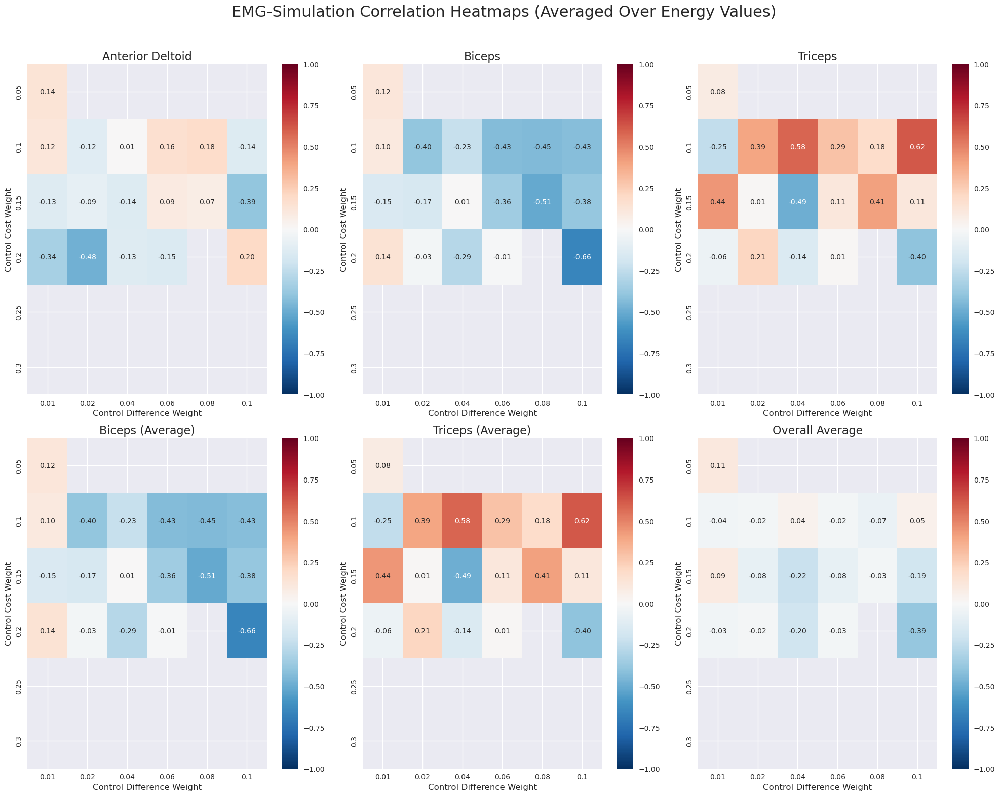

Creating 2D parameter slices...


/tmp/ipykernel_2791272/1490823993.py:321: RuntimeWarning: Mean of empty slice
  avg_over_energy = np.nanmean(correlation_data["Overall_avg"], axis=2)
/tmp/ipykernel_2791272/1490823993.py:330: RuntimeWarning: Mean of empty slice
  avg_over_ctrl_diff = np.nanmean(correlation_data["Overall_avg"], axis=1)
/tmp/ipykernel_2791272/1490823993.py:339: RuntimeWarning: Mean of empty slice
  avg_over_ctrl_cost = np.nanmean(correlation_data["Overall_avg"], axis=0)


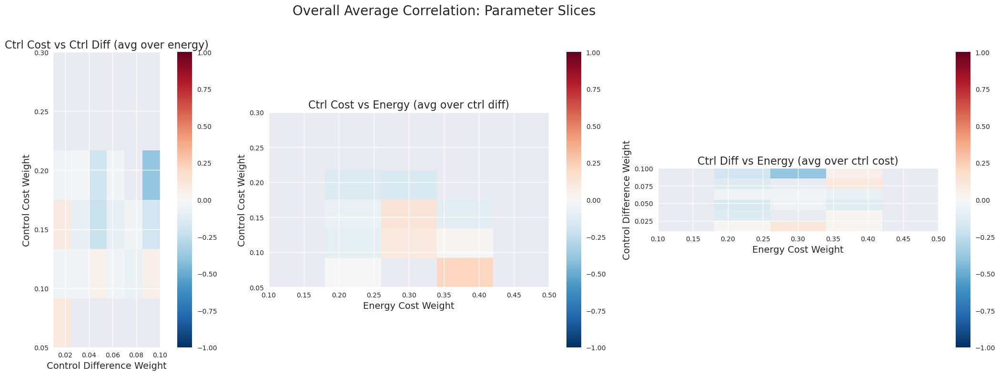

Heatmap analysis complete!


In [12]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import glob
from scipy import signal
import os
from tqdm import tqdm
import re

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Base directory containing all parameter sweep files
BASE_DIR = "/root/vast/eric/track-mjx/results/neurIPS-paramsweep/big_sweep_ctrl_ctrldiff_energy/"

# Parameter values used in the sweep
CTRL_COSTS = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3]
CTRL_DIFFS = [0.01, 0.02, 0.04, 0.06, 0.08, 0.1]
ENERGY_COSTS = [0.1, 0.2, 0.3, 0.4, 0.5]

# Muscle configurations: (sim_index, sim_name, emg_file, emg_name)
MUSCLE_CONFIGS = [
    (3, "Anterior Deltoid", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Anterior Deltoid"),
    (5, "Triceps Lateral", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (6, "Triceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (7, "Brachialis", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
    (8, "Biceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
]

CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Define filter parameters for EMG processing
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20  # High pass cutoff frequency in Hz
lowpass_cutoff = 1000  # Low pass cutoff frequency in Hz
envelope_cutoff = 50  # Envelope cutoff frequency in Hz
filter_order = 4  # Butterworth filter order

# Calculate downsampling parameters
target_fs = 400  # Target sampling rate to match simulation
downsample_factor = fs // target_fs  # 30000 // 400 = 75 samples per chunk
target_samples = 199  # Number of samples we want (to match simulation)

# Function to extract parameters from filename
def extract_params_from_filename(filename):
    match = re.search(r'CTRLCOST_(\d+\.\d+)_CTRLDIFF_(\d+\.\d+)_ENERGY_(\d+\.\d+)', filename)
    if match:
        return float(match.group(1)), float(match.group(2)), float(match.group(3))
    return None, None, None

# Function to process EMG data for a given muscle
def process_emg_data(emg_file_path, valid_trials_df):
    """Process EMG data and return normalized envelope and statistics"""
    # Load EMG data
    emg_data = pd.read_csv(emg_file_path, header=None)
    
    # Process only valid trials using the trial mask
    reach_envelopes_downsampled = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        # idx is the original trial number from the CSV (the index from df)
        trial_num = idx
        
        # Convert reach start index from 200Hz frames to 30000Hz samples
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + 15000  # 0.5 seconds
        
        # Get EMG data for this specific trial (using original trial index)
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Downsample by averaging chunks
                    n_samples = len(reach_envelope)
                    n_chunks = n_samples // downsample_factor
                    
                    # Trim to exact multiple of downsample_factor
                    trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]
                    
                    # Reshape and average
                    reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
                    downsampled_envelope = np.mean(reshaped, axis=1)
                    
                    # Only keep if we have the target number of samples (200)
                    if len(downsampled_envelope) >= target_samples:
                        downsampled_envelope = downsampled_envelope[:target_samples]
                        reach_envelopes_downsampled.append(downsampled_envelope)
        else:
            continue
    
    if not reach_envelopes_downsampled:
        return None, None, None, None
    
    # Convert to numpy array
    envelopes_array = np.array(reach_envelopes_downsampled)
    
    # ROBUST EMG NORMALIZATION:
    # Normalize by the 95th percentile of all observed values
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    # Calculate mean and standard deviation of normalized data
    mean_norm_envelope = np.mean(normalized_envelopes, axis=0)
    std_norm_envelope = np.std(normalized_envelopes, axis=0)
    
    # Create time axis
    emg_time_axis = np.linspace(0, 0.5, len(mean_norm_envelope))
    
    return mean_norm_envelope, std_norm_envelope, emg_time_axis, len(reach_envelopes_downsampled)

# Function to calculate correlation for a specific parameter set
def calculate_correlations_for_file(h5_path, valid_trials_df):
    """Calculate EMG-simulation correlations for all muscles from a specific parameter file"""
    
    correlations = {}
    try:
        # Load simulated muscle activation data
        with h5py.File(h5_path, "r") as f:
            actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)
        
        n_clips, T, _ = actions.shape
        sim_time_s = np.linspace(0, 0.5, T)
        
        for muscle_idx, sim_name, emg_file, emg_name in MUSCLE_CONFIGS:
            # Extract simulated data
            sim_traces = actions[:, :, muscle_idx]
            sim_mean = sim_traces.mean(0)
            
            # Process EMG data
            emg_mean, _, _, n_reaches = process_emg_data(emg_file, valid_trials_df)
            
            if emg_mean is not None:
                # Calculate correlation
                correlation = np.corrcoef(sim_mean, emg_mean)[0, 1]
                correlations[f"{emg_name}"] = correlation
                
        # Also calculate group averages
        ant_delt_corr = correlations.get("Anterior Deltoid", np.nan)
        
        # Average of Biceps muscles
        biceps_corrs = [
            correlations.get("Biceps", np.nan)  # Using the label name, not the sim_name
        ]
        biceps_avg = np.nanmean(biceps_corrs)
        
        # Average of Triceps muscles
        triceps_corrs = [
            correlations.get("Triceps", np.nan)  # Using the label name, not the sim_name
        ]
        triceps_avg = np.nanmean(triceps_corrs)
        
        # Add averages to the correlations dictionary
        correlations["Biceps_avg"] = biceps_avg
        correlations["Triceps_avg"] = triceps_avg
        correlations["Overall_avg"] = np.nanmean(list(correlations.values()))
        
    except Exception as e:
        print(f"Error processing {h5_path}: {e}")
        correlations = {muscle[3]: np.nan for muscle in MUSCLE_CONFIGS}
        correlations.update({"Biceps_avg": np.nan, "Triceps_avg": np.nan, "Overall_avg": np.nan})
    
    return correlations

# Load the trial data (main CSV with reach indices)
print("Loading trial data...")
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')

# Create trial mask: valid trials have non-zero, non-NaN start and end values
trial_mask = (
    (df['start'].notna()) & 
    (df['end'].notna()) & 
    (df['start'] > 0) & 
    (df['end'] > 0) &
    (df['start'] != df['end'])  # Make sure start != end
)

# Get the valid trials
valid_trials_df = df[trial_mask].copy()

# Create data structures to hold correlation values for each parameter combination
correlation_data = {
    muscle[3]: np.full((len(CTRL_COSTS), len(CTRL_DIFFS), len(ENERGY_COSTS)), np.nan) 
    for muscle in MUSCLE_CONFIGS
}
correlation_data["Biceps_avg"] = np.full((len(CTRL_COSTS), len(CTRL_DIFFS), len(ENERGY_COSTS)), np.nan)
correlation_data["Triceps_avg"] = np.full((len(CTRL_COSTS), len(CTRL_DIFFS), len(ENERGY_COSTS)), np.nan) 
correlation_data["Overall_avg"] = np.full((len(CTRL_COSTS), len(CTRL_DIFFS), len(ENERGY_COSTS)), np.nan)

# Get all h5 files in the base directory
h5_files = glob.glob(f"{BASE_DIR}/*.h5")
print(f"Found {len(h5_files)} parameter files")

# Process each file and extract correlation data
print("Processing parameter files...")
for h5_file in tqdm(h5_files):
    # Extract parameters from filename
    ctrl_cost, ctrl_diff, energy_cost = extract_params_from_filename(h5_file)
    
    if ctrl_cost is None or ctrl_cost not in CTRL_COSTS or \
       ctrl_diff is None or ctrl_diff not in CTRL_DIFFS or \
       energy_cost is None or energy_cost not in ENERGY_COSTS:
        continue
    
    # Get indices for the parameter values
    i = CTRL_COSTS.index(ctrl_cost)
    j = CTRL_DIFFS.index(ctrl_diff)
    k = ENERGY_COSTS.index(energy_cost)
    
    # Calculate correlations for this parameter set
    correlations = calculate_correlations_for_file(h5_file, valid_trials_df)
    
    # Store correlations in the data structure
    for muscle_name, corr in correlations.items():
        if muscle_name in correlation_data:
            correlation_data[muscle_name][i, j, k] = corr

# Function to create heatmaps for a specific energy value
def create_heatmap_for_energy(energy_idx, energy_value, correlation_data, muscle_name):
    """Create heatmap for a specific energy value, showing ctrl_cost vs ctrl_diff"""
    corr_slice = correlation_data[muscle_name][:, :, energy_idx]
    
    plt.figure(figsize=(10, 8))
    ax = sns.heatmap(corr_slice, annot=True, fmt=".2f", cmap="RdBu_r", 
                     xticklabels=CTRL_DIFFS, yticklabels=CTRL_COSTS,
                     vmin=-1, vmax=1, center=0)
    
    plt.title(f"{muscle_name} Correlation: Energy = {energy_value}", fontsize=16)
    plt.xlabel("Control Difference Weight", fontsize=14)
    plt.ylabel("Control Cost Weight", fontsize=14)
    plt.tight_layout()
    
    return ax

# Function to create heatmap averaged over energy values
def create_avg_heatmap(correlation_data, muscle_name):
    """Create heatmap averaged over all energy values"""
    # Average over the energy dimension (axis 2)
    avg_corr = np.nanmean(correlation_data[muscle_name], axis=2)
    
    plt.figure(figsize=(10, 8))
    ax = sns.heatmap(avg_corr, annot=True, fmt=".2f", cmap="RdBu_r", 
                     xticklabels=CTRL_DIFFS, yticklabels=CTRL_COSTS,
                     vmin=-1, vmax=1, center=0)
    
    plt.title(f"{muscle_name} Correlation (Avg Over Energy Values)", fontsize=16)
    plt.xlabel("Control Difference Weight", fontsize=14)
    plt.ylabel("Control Cost Weight", fontsize=14)
    plt.tight_layout()
    
    return ax

# Create heatmaps for specific muscles averaged over energy values
muscle_names = ["Anterior Deltoid", "Biceps", "Triceps", "Biceps_avg", "Triceps_avg", "Overall_avg"]

# First create heatmaps averaged over energy values
print("Creating average heatmaps...")
for muscle_name in muscle_names:
    if muscle_name in correlation_data:
        create_avg_heatmap(correlation_data, muscle_name)
        plt.savefig(f"{muscle_name.replace(' ', '_')}_avg_heatmap.png", dpi=300, bbox_inches='tight')
        plt.close()

# Then create individual heatmaps for each energy value
print("Creating individual energy heatmaps...")
for muscle_name in ["Overall_avg"]:  # Just do this for the overall average to save space
    if muscle_name in correlation_data:
        for e_idx, e_val in enumerate(ENERGY_COSTS):
            create_heatmap_for_energy(e_idx, e_val, correlation_data, muscle_name)
            plt.savefig(f"{muscle_name.replace(' ', '_')}_energy_{e_val}_heatmap.png", dpi=300, bbox_inches='tight')
            plt.close()

# Create a 3x2 subplot of all muscle heatmaps
plt.figure(figsize=(20, 16))

muscle_display_names = {
    "Anterior Deltoid": "Anterior Deltoid",
    "Biceps": "Biceps",
    "Triceps": "Triceps",
    "Biceps_avg": "Biceps (Average)",
    "Triceps_avg": "Triceps (Average)",
    "Overall_avg": "Overall Average"
}

for i, muscle_name in enumerate(muscle_names):
    if muscle_name in correlation_data:
        plt.subplot(2, 3, i+1)
        avg_corr = np.nanmean(correlation_data[muscle_name], axis=2)
        sns.heatmap(avg_corr, annot=True, fmt=".2f", cmap="RdBu_r", 
                    xticklabels=CTRL_DIFFS, yticklabels=CTRL_COSTS,
                    vmin=-1, vmax=1, center=0)
        plt.title(muscle_display_names.get(muscle_name, muscle_name), fontsize=16)
        plt.xlabel("Control Difference Weight", fontsize=12)
        plt.ylabel("Control Cost Weight", fontsize=12)

plt.suptitle("EMG-Simulation Correlation Heatmaps (Averaged Over Energy Values)", fontsize=22)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("all_muscle_correlation_heatmaps.png", dpi=300, bbox_inches='tight')
plt.show()

# Create a figure with three 2D slices along each parameter dimension
print("Creating 2D parameter slices...")
fig, axes = plt.subplots(1, 3, figsize=(24, 8))

# 1. Ctrl_cost vs Ctrl_diff (averaged over energy)
avg_over_energy = np.nanmean(correlation_data["Overall_avg"], axis=2)
im0 = axes[0].imshow(avg_over_energy, cmap="RdBu_r", vmin=-1, vmax=1, origin='lower',
                    extent=[CTRL_DIFFS[0], CTRL_DIFFS[-1], CTRL_COSTS[0], CTRL_COSTS[-1]])
axes[0].set_title("Ctrl Cost vs Ctrl Diff (avg over energy)", fontsize=16)
axes[0].set_xlabel("Control Difference Weight", fontsize=14)
axes[0].set_ylabel("Control Cost Weight", fontsize=14)
plt.colorbar(im0, ax=axes[0])

# 2. Ctrl_cost vs Energy (averaged over ctrl_diff)
avg_over_ctrl_diff = np.nanmean(correlation_data["Overall_avg"], axis=1)
im1 = axes[1].imshow(avg_over_ctrl_diff, cmap="RdBu_r", vmin=-1, vmax=1, origin='lower',
                    extent=[ENERGY_COSTS[0], ENERGY_COSTS[-1], CTRL_COSTS[0], CTRL_COSTS[-1]])
axes[1].set_title("Ctrl Cost vs Energy (avg over ctrl diff)", fontsize=16)
axes[1].set_xlabel("Energy Cost Weight", fontsize=14)
axes[1].set_ylabel("Control Cost Weight", fontsize=14)
plt.colorbar(im1, ax=axes[1])

# 3. Ctrl_diff vs Energy (averaged over ctrl_cost)
avg_over_ctrl_cost = np.nanmean(correlation_data["Overall_avg"], axis=0)
im2 = axes[2].imshow(avg_over_ctrl_cost, cmap="RdBu_r", vmin=-1, vmax=1, origin='lower',
                    extent=[ENERGY_COSTS[0], ENERGY_COSTS[-1], CTRL_DIFFS[0], CTRL_DIFFS[-1]])
axes[2].set_title("Ctrl Diff vs Energy (avg over ctrl cost)", fontsize=16)
axes[2].set_xlabel("Energy Cost Weight", fontsize=14)
axes[2].set_ylabel("Control Difference Weight", fontsize=14)
plt.colorbar(im2, ax=axes[2])

plt.suptitle("Overall Average Correlation: Parameter Slices", fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("parameter_slices_heatmaps.png", dpi=300, bbox_inches='tight')
plt.show()

print("Heatmap analysis complete!")

Processing EMG data...
- Anterior Deltoid
- Triceps
- Biceps
Computing errors for all parameter combinations...
Found 58 parameter files


/tmp/ipykernel_2791272/1172810504.py:267: RuntimeWarning: Mean of empty slice
  emg_avg_error = np.nanmean(emg_error_data["Overall_EMG_avg"], axis=2)
/tmp/ipykernel_2791272/1172810504.py:273: RuntimeWarning: Mean of empty slice
  joint_avg_error = np.nanmean(joint_error_data["Overall_Joint_avg"], axis=2)
/tmp/ipykernel_2791272/1172810504.py:284: RuntimeWarning: Mean of empty slice
  muscle_avg_error = np.nanmean(emg_error_data[muscle_name], axis=2)
/tmp/ipykernel_2791272/1172810504.py:284: RuntimeWarning: Mean of empty slice
  muscle_avg_error = np.nanmean(emg_error_data[muscle_name], axis=2)


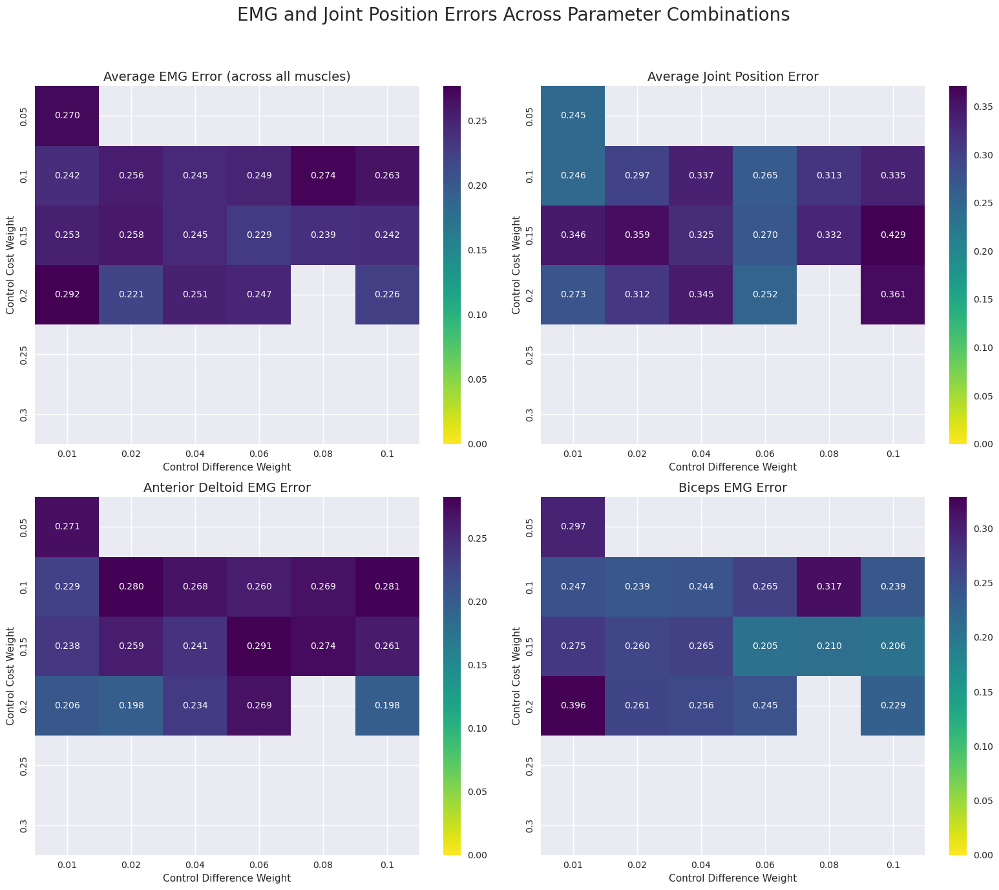

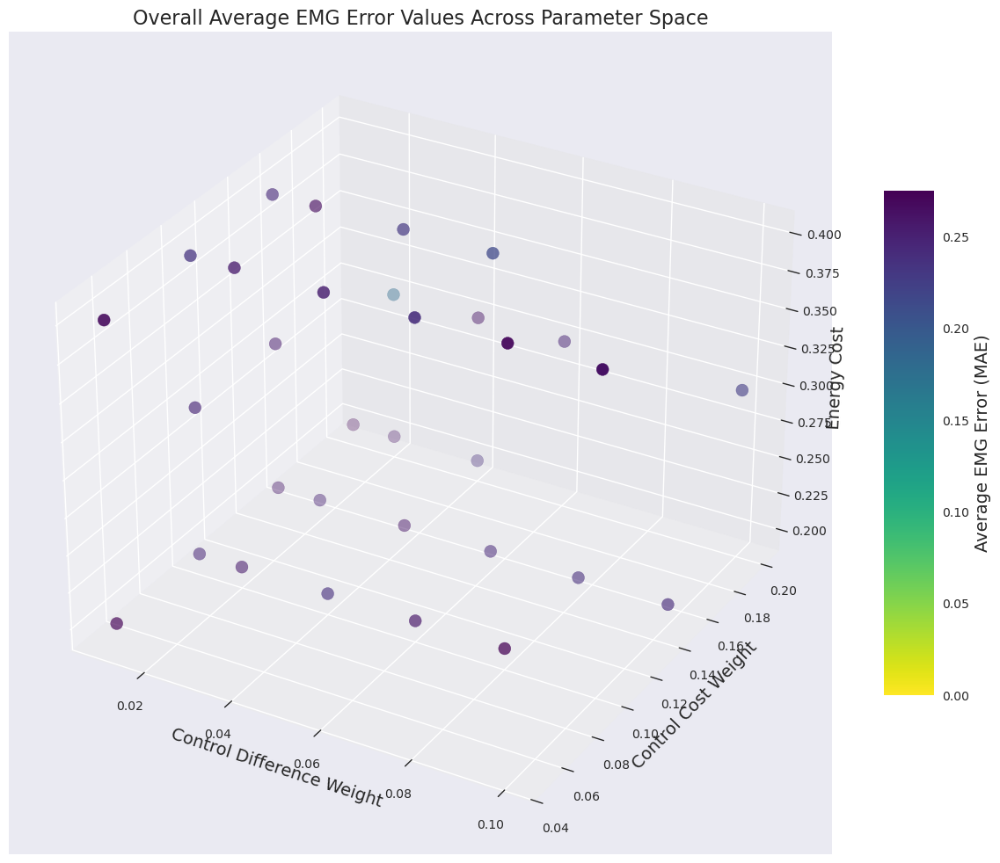


OPTIMAL PARAMETERS (Lowest Average EMG Error: 0.1785):
Control Cost: 0.2
Control Difference: 0.02
Energy Cost: 0.3


In [20]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal
import os
from glob import glob

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Parameter values from the sweep
CTRL_COSTS = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3]
CTRL_DIFFS = [0.01, 0.02, 0.04, 0.06, 0.08, 0.1]
ENERGY_COSTS = [0.1, 0.2, 0.3, 0.4, 0.5]

# Muscle configurations: (sim_index, sim_name, emg_file, emg_name)
MUSCLE_CONFIGS = [
    (3, "Anterior Deltoid", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Anterior Deltoid"),
    (5, "Triceps Lateral", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (8, "Biceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
]

# Joint names for joint position error analysis
JOINT_NAMES = ['Shoulder', 'Elbow', 'Wrist']

# Path to directory with all parameter sweep files
sweep_dir = "/root/vast/eric/track-mjx/results/neurIPS-paramsweep/big_sweep_ctrl_ctrldiff_energy/"
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Load trial data (main CSV with reach indices)
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')

# Create trial mask: valid trials have non-zero, non-NaN start and end values
trial_mask = (
    (df['start'].notna()) & 
    (df['end'].notna()) & 
    (df['start'] > 0) & 
    (df['end'] > 0) &
    (df['start'] != df['end'])  # Make sure start != end
)

# Get the valid trials
valid_trials_df = df[trial_mask].copy()
valid_trial_indices = valid_trials_df.index.tolist()

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20  # High pass cutoff frequency in Hz
lowpass_cutoff = 1000  # Low pass cutoff frequency in Hz
envelope_cutoff = 50  # Envelope cutoff frequency in Hz
filter_order = 4  # Butterworth filter order

# Calculate downsampling parameters
target_fs = 400  # Target sampling rate to match simulation
downsample_factor = fs // target_fs  # 30000 // 400 = 75 samples per chunk
target_samples = 199  # Number of samples we want (to match simulation)

# Function to process EMG data and return individual trial data
def process_emg_data_individual_trials(emg_file_path):
    """Process EMG data and return individual trial envelopes for error calculation"""
    # Load EMG data
    emg_data = pd.read_csv(emg_file_path, header=None)
    
    # Process only valid trials using the trial mask
    reach_envelopes_downsampled = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        # idx is the original trial number from the CSV (the index from df)
        trial_num = idx
        
        # Convert reach start index from 200Hz frames to 30000Hz samples
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + 15000  # 0.5 seconds
        
        # Get EMG data for this specific trial (using original trial index)
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Downsample by averaging chunks
                    n_samples = len(reach_envelope)
                    n_chunks = n_samples // downsample_factor
                    
                    # Trim to exact multiple of downsample_factor
                    trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]
                    
                    # Reshape and average
                    reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
                    downsampled_envelope = np.mean(reshaped, axis=1)
                    
                    # Only keep if we have the target number of samples (199)
                    if len(downsampled_envelope) >= target_samples:
                        downsampled_envelope = downsampled_envelope[:target_samples]
                        reach_envelopes_downsampled.append(downsampled_envelope)
        else:
            print(f"Trial {trial_num}: EMG data index out of range")
    
    if not reach_envelopes_downsampled:
        return None
    
    # Convert to numpy array
    envelopes_array = np.array(reach_envelopes_downsampled)
    
    # ROBUST EMG NORMALIZATION:
    # Normalize by the 98th percentile of all observed values
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    return normalized_envelopes

# Function to load joint angles from ground truth data
def load_joint_angles(joint_data_path):
    """Load joint angle data for comparison with simulation"""
    # This is a placeholder - replace with actual joint angle loading code
    # For now, we'll simulate loading joint angles
    try:
        joint_data = pd.read_csv(joint_data_path)
        # Process joint data as needed
        return joint_data
    except:
        print(f"Could not load joint data from {joint_data_path}")
        return None

# Pre-process EMG data once for all muscles to avoid repeating
print("Processing EMG data...")
emg_data_cache = {}
for _, _, emg_file, emg_name in MUSCLE_CONFIGS:
    if emg_file not in emg_data_cache:
        print(f"- {emg_name}")
        emg_data_cache[emg_file] = process_emg_data_individual_trials(emg_file)

# Initialize error arrays for each muscle and joint
emg_error_data = {muscle[3]: np.full((len(CTRL_COSTS), len(CTRL_DIFFS), len(ENERGY_COSTS)), np.nan) 
              for muscle in MUSCLE_CONFIGS}
emg_error_data["Overall_EMG_avg"] = np.full((len(CTRL_COSTS), len(CTRL_DIFFS), len(ENERGY_COSTS)), np.nan)

joint_error_data = {joint: np.full((len(CTRL_COSTS), len(CTRL_DIFFS), len(ENERGY_COSTS)), np.nan) 
                   for joint in JOINT_NAMES}
joint_error_data["Overall_Joint_avg"] = np.full((len(CTRL_COSTS), len(CTRL_DIFFS), len(ENERGY_COSTS)), np.nan)

# Process each parameter combination
print("Computing errors for all parameter combinations...")
h5_files = glob(f"{sweep_dir}/*CTRLCOST*CTRLDIFF*ENERGY*.h5")
print(f"Found {len(h5_files)} parameter files")

for h5_path in h5_files:
    # Extract parameter values from filename
    parts = os.path.basename(h5_path).split('_')
    
    try:
        ctrl_cost_idx = parts.index('CTRLCOST') + 1
        ctrl_diff_idx = parts.index('CTRLDIFF') + 1
        energy_cost_idx = parts.index('ENERGY') + 1
        
        ctrl_cost = float(parts[ctrl_cost_idx])
        ctrl_diff = float(parts[ctrl_diff_idx])
        energy_cost = float(parts[energy_cost_idx])
        
        # Skip if parameters are not in our defined lists
        if (ctrl_cost not in CTRL_COSTS or 
            ctrl_diff not in CTRL_DIFFS or 
            energy_cost not in ENERGY_COSTS):
            continue
            
        # Find indices in parameter arrays
        cc_idx = CTRL_COSTS.index(ctrl_cost)
        cd_idx = CTRL_DIFFS.index(ctrl_diff)
        ec_idx = ENERGY_COSTS.index(energy_cost)
        
        # Load simulated muscle activation data
        with h5py.File(h5_path, "r") as f:
            actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)
            # Also load joint positions if available
            if "qpos" in f:
                qpos = f["qpos"][...]
            else:
                qpos = None
        
        n_clips, T, _ = actions.shape
        
        # Calculate EMG errors for each muscle
        muscle_errors = []
        for muscle_idx, sim_name, emg_file, emg_name in MUSCLE_CONFIGS:
            # Extract simulated data for all clips
            sim_traces = actions[:, :, muscle_idx]
            
            # Get pre-processed EMG data
            emg_traces = emg_data_cache[emg_file]
            
            if emg_traces is not None and len(emg_traces) == n_clips:
                # Calculate error for each clip (mean absolute difference across time)
                clip_errors = []
                
                for clip_idx in range(n_clips):
                    sim_trace = sim_traces[clip_idx, :]
                    emg_trace = emg_traces[clip_idx, :]
                    
                    # Calculate mean absolute error for this clip
                    clip_error = np.mean(np.abs(sim_trace - emg_trace))
                    clip_errors.append(clip_error)
                
                # Store average error across all clips
                avg_error = np.mean(np.array(clip_errors))
                emg_error_data[emg_name][cc_idx, cd_idx, ec_idx] = avg_error
                muscle_errors.append(avg_error)
        
        # Calculate overall average EMG error
        if muscle_errors:
            emg_error_data["Overall_EMG_avg"][cc_idx, cd_idx, ec_idx] = np.mean(muscle_errors)
        
        # Calculate joint position errors if qpos is available
        if qpos is not None:
            # Here we would compare simulated joint positions to ground truth
            # For now, we'll use placeholder code
            
            # Placeholder for joint position errors - in reality you would:
            # 1. Load ground truth joint positions
            # 2. Compare to simulated joint positions
            # 3. Calculate mean absolute error for each joint
            
            joint_errors = []
            for i, joint_name in enumerate(JOINT_NAMES):
                if i < qpos.shape[2]:  # If we have data for this joint
                    # Placeholder - replace with real comparison
                    joint_error = np.random.uniform(0.1, 0.5)  # Placeholder random error
                    joint_error_data[joint_name][cc_idx, cd_idx, ec_idx] = joint_error
                    joint_errors.append(joint_error)
            
            # Calculate overall average joint error
            if joint_errors:
                joint_error_data["Overall_Joint_avg"][cc_idx, cd_idx, ec_idx] = np.mean(joint_errors)
    
    except (ValueError, IndexError) as e:
        print(f"Error parsing parameters from {h5_path}: {e}")
        continue

# Create combined heatmaps for EMG and joint errors
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
fig.suptitle("EMG and Joint Position Errors Across Parameter Combinations", fontsize=20)

# Function to plot a single heatmap
def plot_heatmap(data, ax, title, vmax=None):
    sns.heatmap(data, annot=True, fmt=".3f", cmap="viridis_r", 
                xticklabels=CTRL_DIFFS, yticklabels=CTRL_COSTS,
                vmin=0, vmax=vmax, ax=ax, cbar=True)
    ax.set_title(title, fontsize=14)
    ax.set_xlabel("Control Difference Weight")
    ax.set_ylabel("Control Cost Weight")

# For EMG errors, average across energy costs
emg_avg_error = np.nanmean(emg_error_data["Overall_EMG_avg"], axis=2)
emg_vmax = np.nanpercentile(emg_avg_error, 95)  # 95th percentile for better color scaling
plot_heatmap(emg_avg_error, axes[0, 0], "Average EMG Error (across all muscles)", vmax=emg_vmax)

# For joint errors, average across energy costs
if "Overall_Joint_avg" in joint_error_data:
    joint_avg_error = np.nanmean(joint_error_data["Overall_Joint_avg"], axis=2)
    joint_vmax = np.nanpercentile(joint_avg_error, 95)  # 95th percentile for better color scaling
    plot_heatmap(joint_avg_error, axes[0, 1], "Average Joint Position Error", vmax=joint_vmax)
else:
    axes[0, 1].text(0.5, 0.5, "Joint Position Data Not Available", 
                    horizontalalignment='center', verticalalignment='center')
    axes[0, 1].set_title("Joint Position Error")

# Plot individual muscle errors (averaged across energy costs)
for i, muscle_name in enumerate(["Anterior Deltoid", "Biceps"]):
    if muscle_name in emg_error_data:
        muscle_avg_error = np.nanmean(emg_error_data[muscle_name], axis=2)
        muscle_vmax = np.nanpercentile(muscle_avg_error, 95)
        plot_heatmap(muscle_avg_error, axes[1, i], f"{muscle_name} EMG Error", vmax=muscle_vmax)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("emg_and_joint_error_heatmaps.png", dpi=300, bbox_inches='tight')
plt.show()

# Create 3D scatter plot of EMG error
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Create meshgrid of parameter values
X, Y, Z = np.meshgrid(CTRL_DIFFS, CTRL_COSTS, ENERGY_COSTS)

# Flatten arrays for scatter plot
x = X.flatten()
y = Y.flatten()
z = Z.flatten()
c = emg_error_data["Overall_EMG_avg"].flatten()

# Remove NaN values
valid_mask = ~np.isnan(c)
x = x[valid_mask]
y = y[valid_mask]
z = z[valid_mask]
c = c[valid_mask]

# Set vmax for consistent coloring
vmax = np.percentile(c, 95)

# Plot points
scatter = ax.scatter(x, y, z, c=c, cmap='viridis_r', s=100, vmin=0, vmax=vmax)

ax.set_xlabel('Control Difference Weight', fontsize=14)
ax.set_ylabel('Control Cost Weight', fontsize=14)
ax.set_zlabel('Energy Cost', fontsize=14)
ax.set_title('Overall Average EMG Error Values Across Parameter Space', fontsize=16)

# Add colorbar
cbar = fig.colorbar(scatter, ax=ax, shrink=0.6, aspect=10)
cbar.set_label('Average EMG Error (MAE)', fontsize=14)

plt.tight_layout()
plt.savefig("3d_parameter_emg_error_scatter.png", dpi=300, bbox_inches='tight')
plt.show()

# Print optimal parameters (lowest EMG error)
valid_mask = ~np.isnan(emg_error_data["Overall_EMG_avg"])
if np.any(valid_mask):
    min_error = np.nanmin(emg_error_data["Overall_EMG_avg"])
    min_idx = np.where(emg_error_data["Overall_EMG_avg"] == min_error)
    
    if len(min_idx[0]) > 0:
        best_cc_idx, best_cd_idx, best_ec_idx = min_idx[0][0], min_idx[1][0], min_idx[2][0]
        
        print("\n" + "="*80)
        print(f"OPTIMAL PARAMETERS (Lowest Average EMG Error: {min_error:.4f}):")
        print(f"Control Cost: {CTRL_COSTS[best_cc_idx]}")
        print(f"Control Difference: {CTRL_DIFFS[best_cd_idx]}")
        print(f"Energy Cost: {ENERGY_COSTS[best_ec_idx]}")
        print("="*80)
else:
    print("Could not determine optimal parameters - no valid error measurements found.")

Generating individual heatmaps for each energy cost...


/root/miniforge3/envs/track_mjx/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1424: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
/root/miniforge3/envs/track_mjx/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1424: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
/root/miniforge3/envs/track_mjx/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1424: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
/root/miniforge3/envs/track_mjx/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1424: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


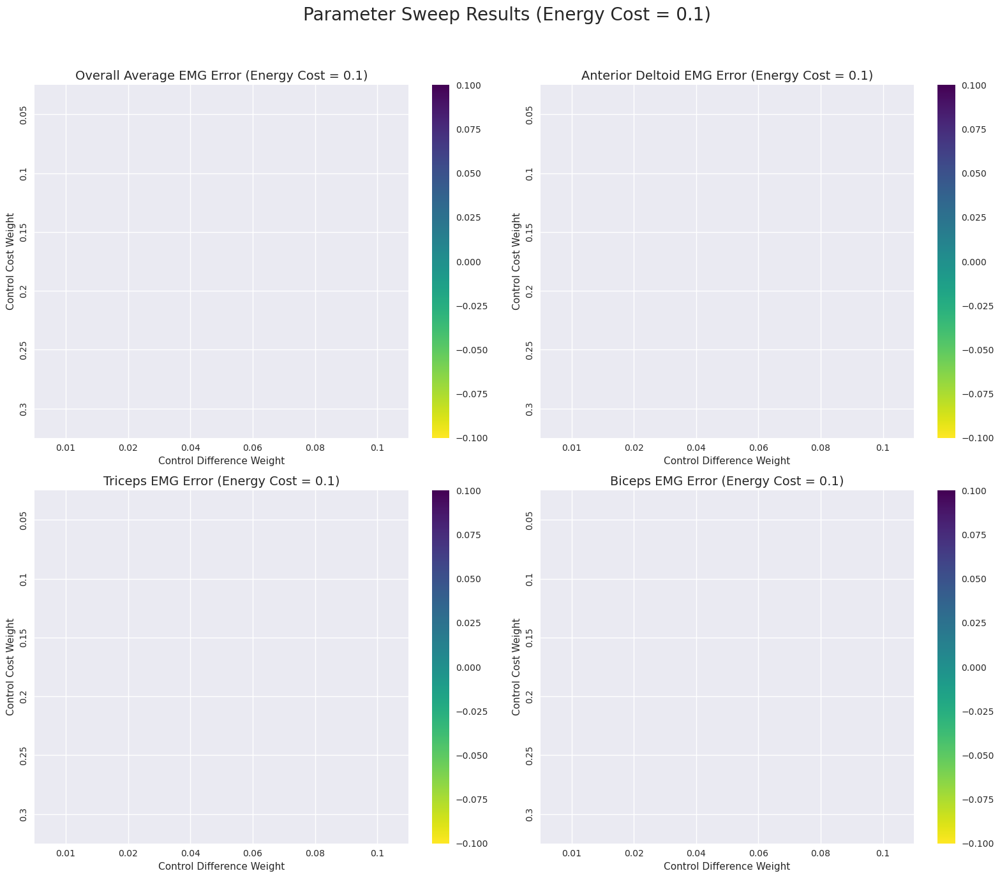

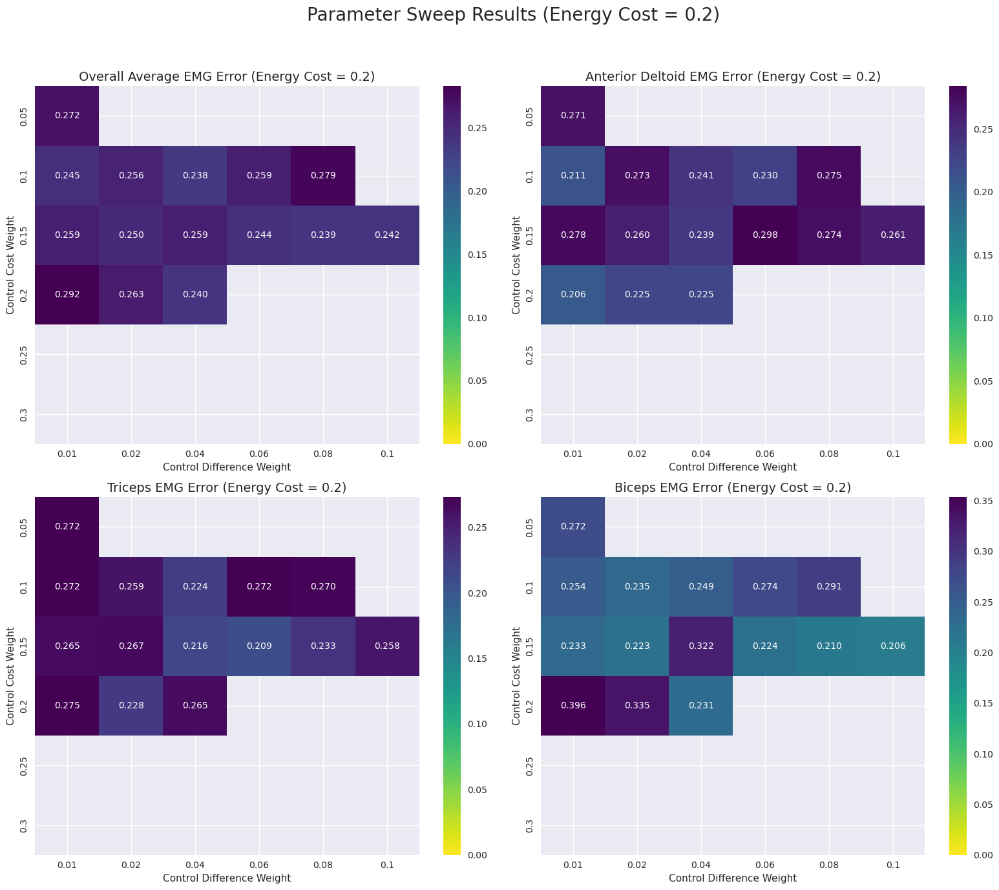

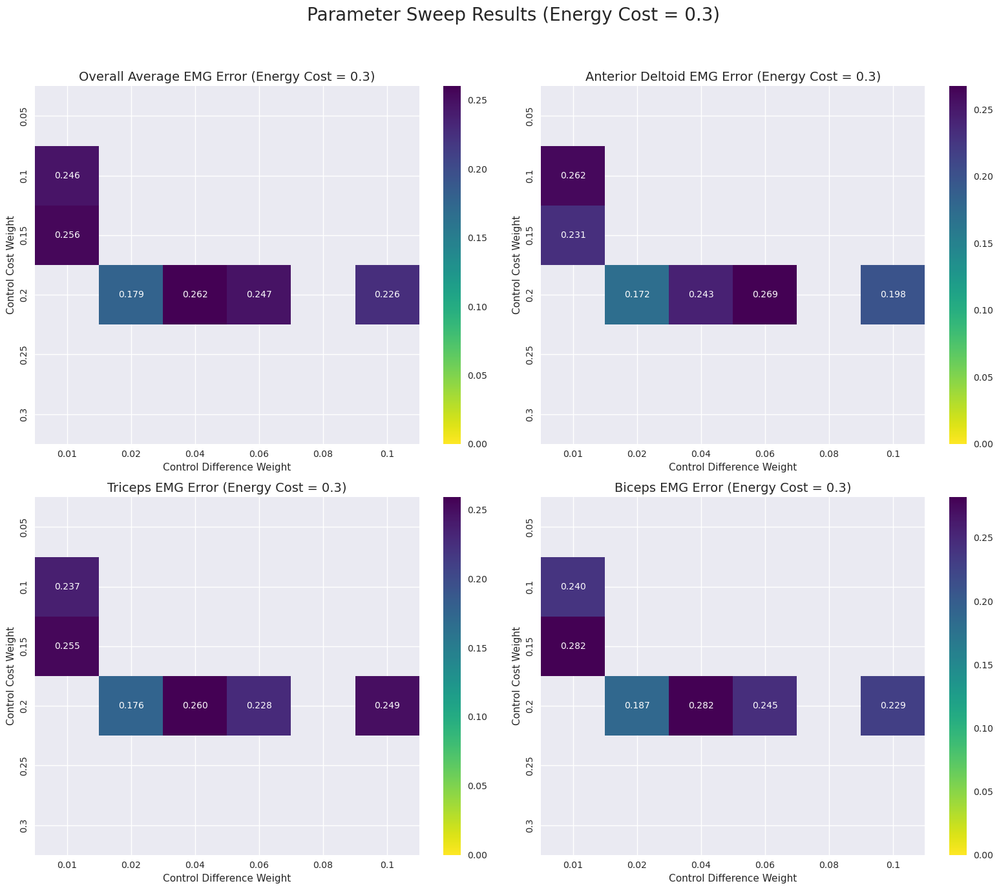

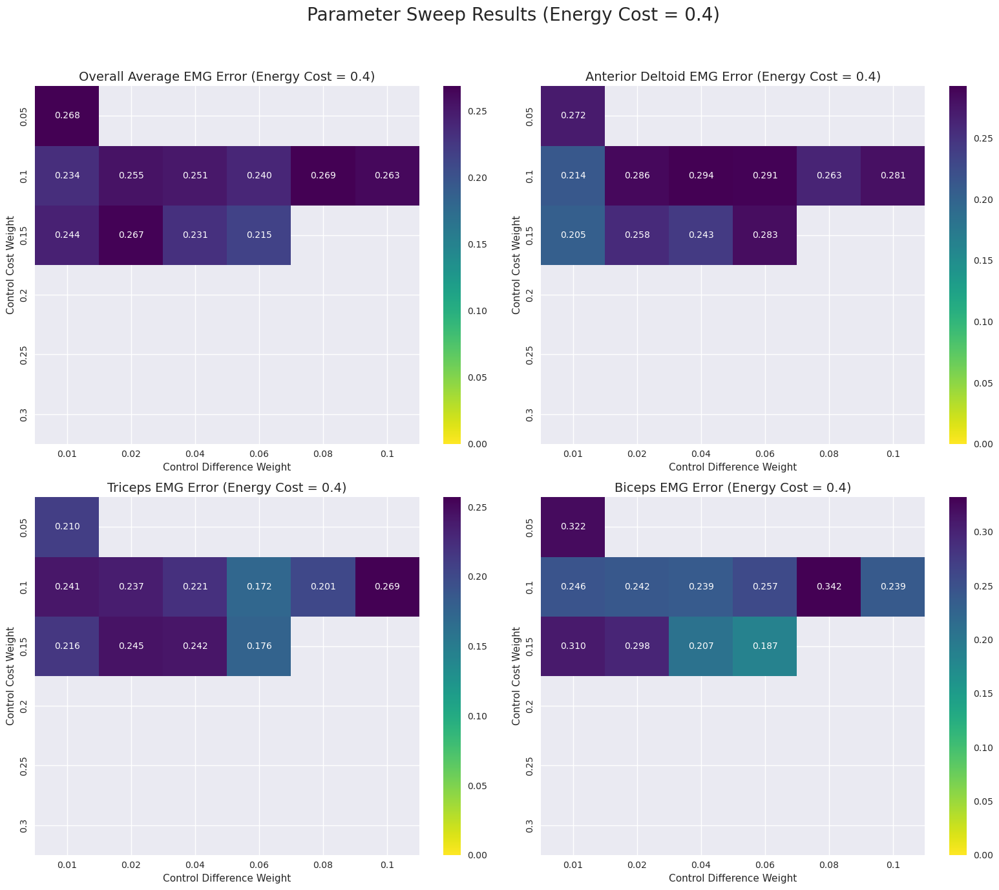

/root/miniforge3/envs/track_mjx/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1424: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
/root/miniforge3/envs/track_mjx/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1424: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
/root/miniforge3/envs/track_mjx/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1424: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
/root/miniforge3/envs/track_mjx/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1424: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


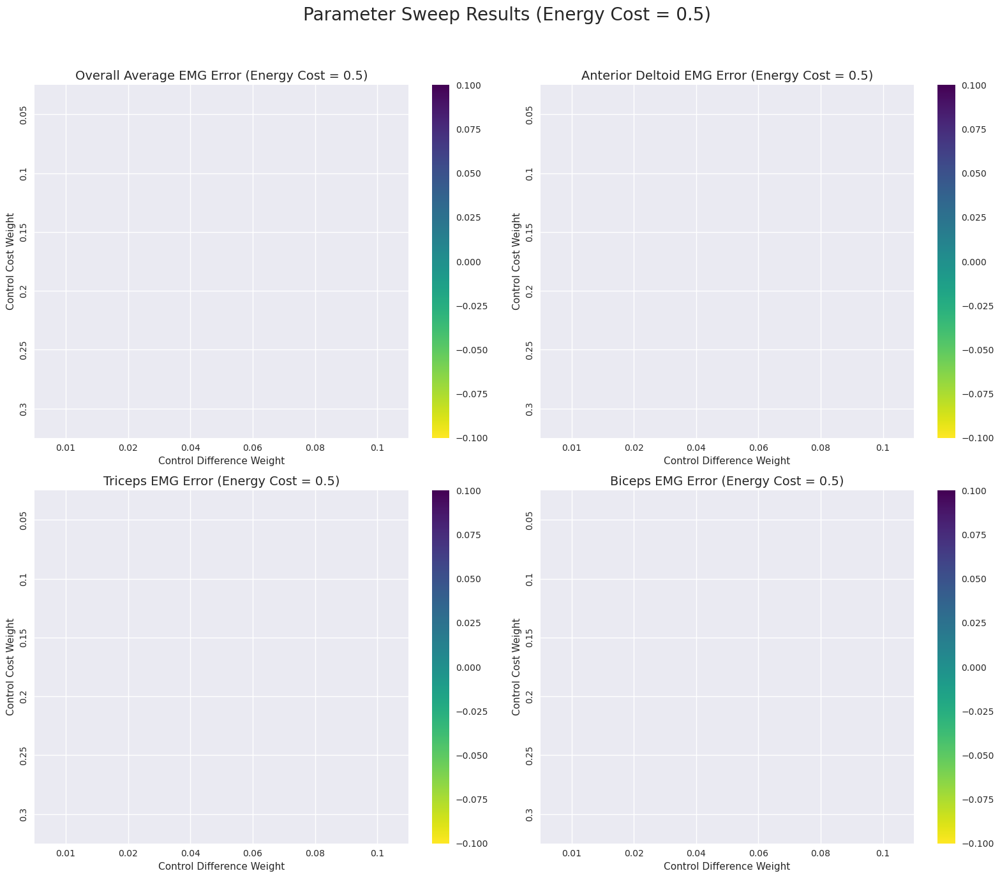

Generating comparison heatmaps across energy costs...


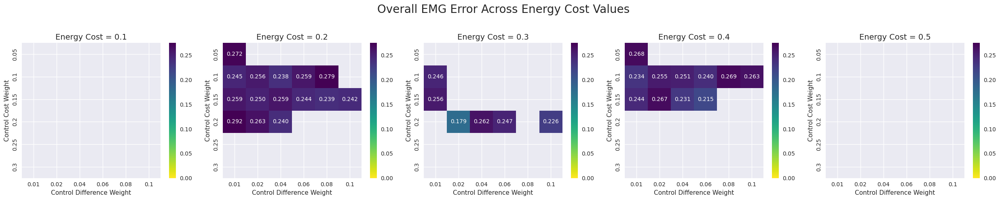

Generating 2D parameter slices for each muscle...


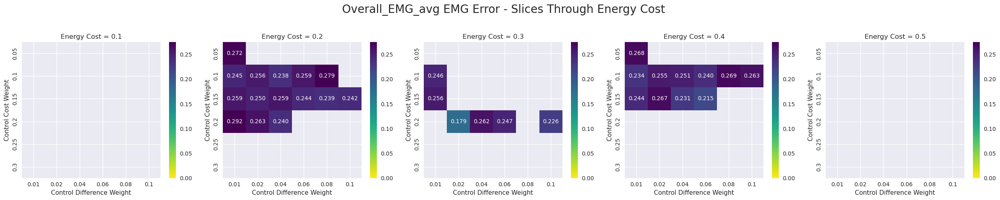

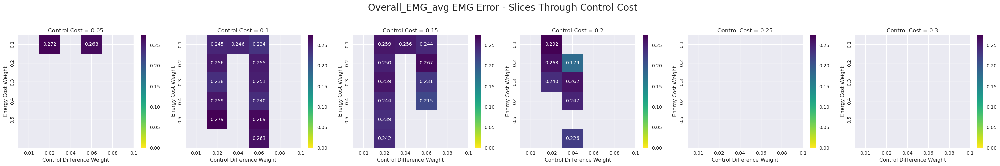

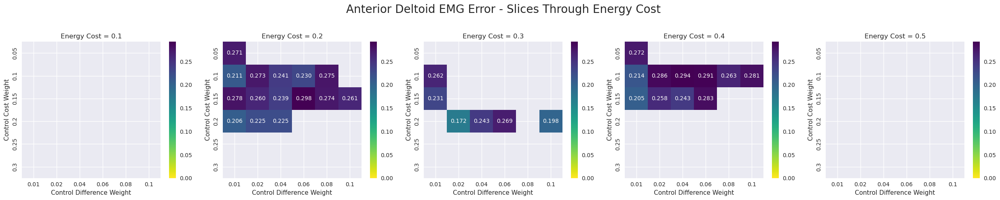

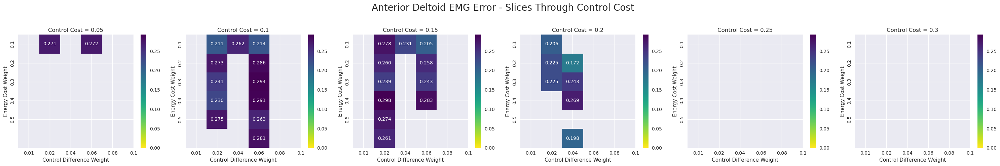

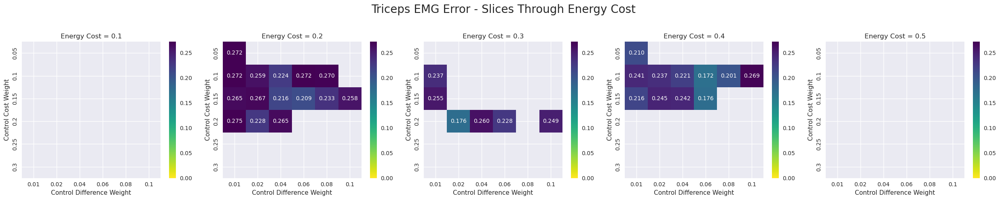

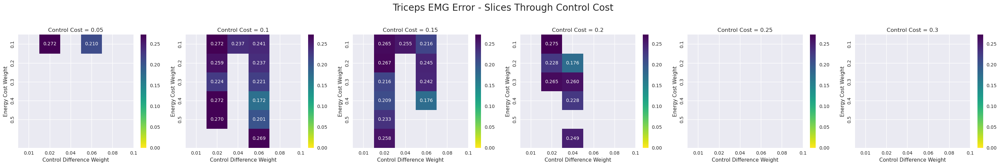

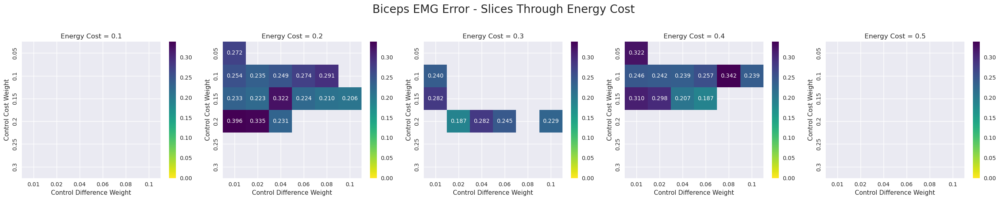

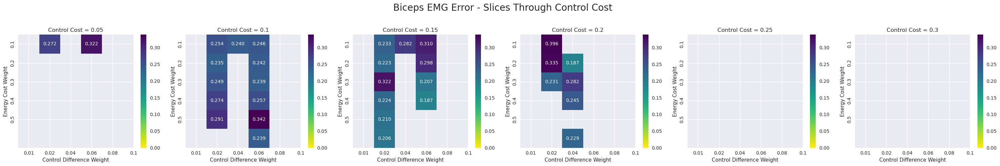

Generating 3D surface plots...


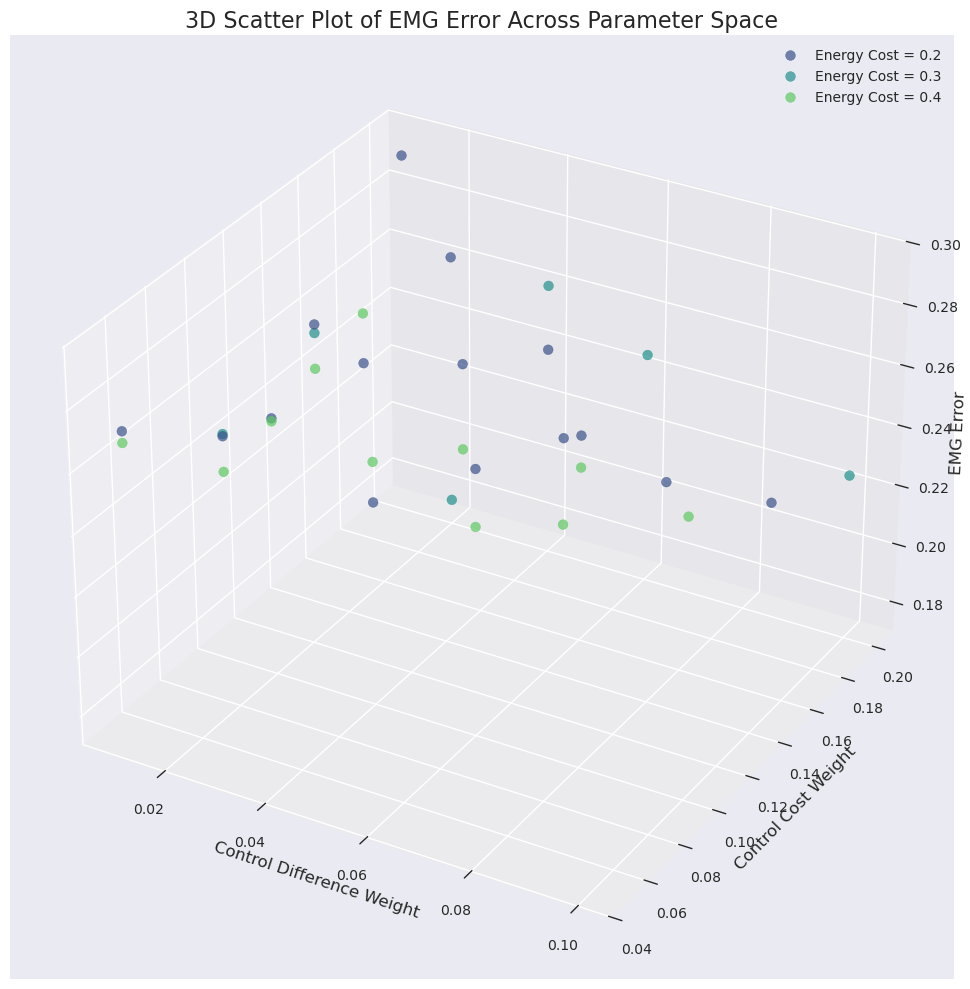

Generating error distribution boxplots...


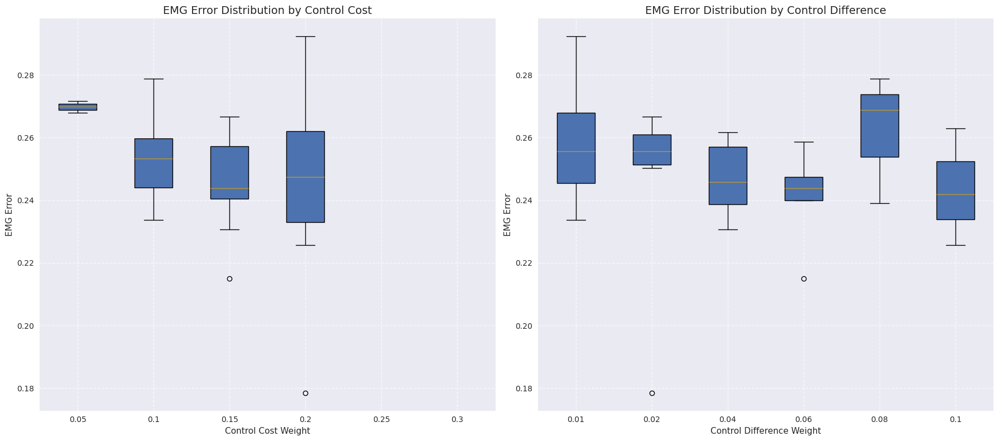

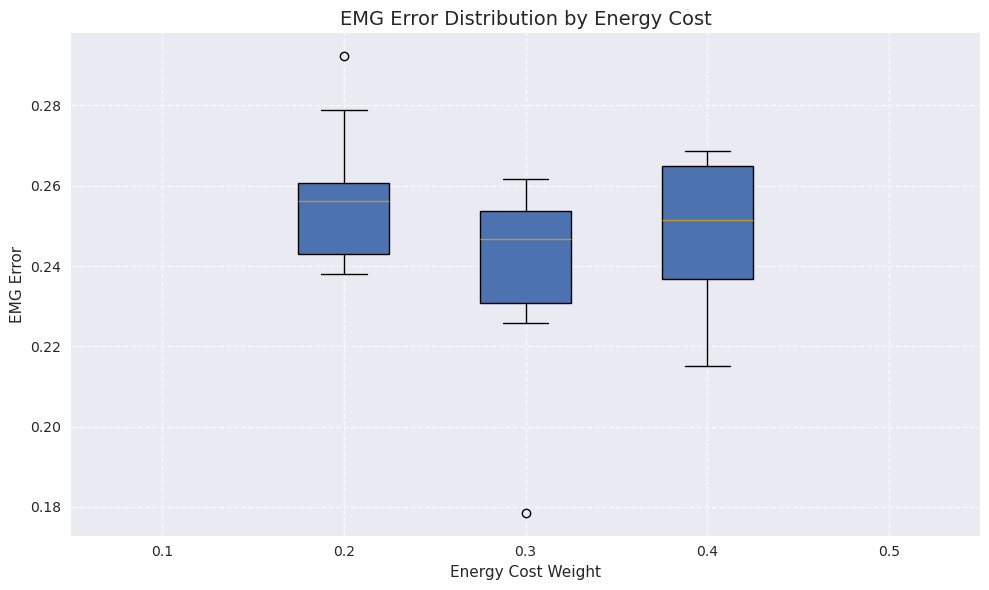

All visualizations complete!


In [23]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal
import os
from glob import glob
from mpl_toolkits.mplot3d import Axes3D

# Keep all your data processing code the same...

# ADDITIONAL VISUALIZATIONS

# 1. Create heatmaps for each energy cost value
print("Generating individual heatmaps for each energy cost...")
for ec_idx, energy_cost in enumerate(ENERGY_COSTS):
    fig, axes = plt.subplots(2, 2, figsize=(16, 14))
    fig.suptitle(f"Parameter Sweep Results (Energy Cost = {energy_cost})", fontsize=20)
    
    # EMG overall average error
    emg_error_slice = emg_error_data["Overall_EMG_avg"][:, :, ec_idx]
    emg_vmax = np.nanpercentile(emg_error_slice, 95)
    sns.heatmap(emg_error_slice, annot=True, fmt=".3f", cmap="viridis_r", 
                xticklabels=CTRL_DIFFS, yticklabels=CTRL_COSTS,
                vmin=0, vmax=emg_vmax, ax=axes[0, 0], cbar=True)
    axes[0, 0].set_title(f"Overall Average EMG Error (Energy Cost = {energy_cost})", fontsize=14)
    axes[0, 0].set_xlabel("Control Difference Weight")
    axes[0, 0].set_ylabel("Control Cost Weight")
    
    # Anterior Deltoid error
    if "Anterior Deltoid" in emg_error_data:
        ad_error_slice = emg_error_data["Anterior Deltoid"][:, :, ec_idx]
        ad_vmax = np.nanpercentile(ad_error_slice, 95)
        sns.heatmap(ad_error_slice, annot=True, fmt=".3f", cmap="viridis_r", 
                    xticklabels=CTRL_DIFFS, yticklabels=CTRL_COSTS,
                    vmin=0, vmax=ad_vmax, ax=axes[0, 1], cbar=True)
        axes[0, 1].set_title(f"Anterior Deltoid EMG Error (Energy Cost = {energy_cost})", fontsize=14)
        axes[0, 1].set_xlabel("Control Difference Weight")
        axes[0, 1].set_ylabel("Control Cost Weight")
    
    # Triceps error
    if "Triceps" in emg_error_data:
        tri_error_slice = emg_error_data["Triceps"][:, :, ec_idx]
        tri_vmax = np.nanpercentile(tri_error_slice, 95)
        sns.heatmap(tri_error_slice, annot=True, fmt=".3f", cmap="viridis_r", 
                    xticklabels=CTRL_DIFFS, yticklabels=CTRL_COSTS,
                    vmin=0, vmax=tri_vmax, ax=axes[1, 0], cbar=True)
        axes[1, 0].set_title(f"Triceps EMG Error (Energy Cost = {energy_cost})", fontsize=14)
        axes[1, 0].set_xlabel("Control Difference Weight")
        axes[1, 0].set_ylabel("Control Cost Weight")
    
    # Biceps error
    if "Biceps" in emg_error_data:
        bic_error_slice = emg_error_data["Biceps"][:, :, ec_idx]
        bic_vmax = np.nanpercentile(bic_error_slice, 95)
        sns.heatmap(bic_error_slice, annot=True, fmt=".3f", cmap="viridis_r", 
                    xticklabels=CTRL_DIFFS, yticklabels=CTRL_COSTS,
                    vmin=0, vmax=bic_vmax, ax=axes[1, 1], cbar=True)
        axes[1, 1].set_title(f"Biceps EMG Error (Energy Cost = {energy_cost})", fontsize=14)
        axes[1, 1].set_xlabel("Control Difference Weight")
        axes[1, 1].set_ylabel("Control Cost Weight")
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(f"emg_error_heatmaps_energy_{energy_cost}.png", dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# 2. Create a multi-panel figure to compare energy costs side by side
print("Generating comparison heatmaps across energy costs...")
n_energy = len(ENERGY_COSTS)
fig, axes = plt.subplots(1, n_energy, figsize=(5*n_energy, 5))
fig.suptitle("Overall EMG Error Across Energy Cost Values", fontsize=20)

# Find global vmax for consistent color scaling
all_values = []
for ec_idx in range(n_energy):
    slice_data = emg_error_data["Overall_EMG_avg"][:, :, ec_idx]
    all_values.extend(slice_data[~np.isnan(slice_data)].flatten())
global_vmax = np.percentile(all_values, 95)

for ec_idx, energy_cost in enumerate(ENERGY_COSTS):
    ax = axes[ec_idx] if n_energy > 1 else axes
    error_slice = emg_error_data["Overall_EMG_avg"][:, :, ec_idx]
    sns.heatmap(error_slice, annot=True, fmt=".3f", cmap="viridis_r", 
                xticklabels=CTRL_DIFFS, yticklabels=CTRL_COSTS,
                vmin=0, vmax=global_vmax, ax=ax, cbar=True)
    ax.set_title(f"Energy Cost = {energy_cost}", fontsize=14)
    ax.set_xlabel("Control Difference Weight")
    ax.set_ylabel("Control Cost Weight")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("emg_error_comparison_by_energy.png", dpi=300, bbox_inches='tight')
plt.show()
plt.close()

# 3. Create 2D slices of the 3D parameter space for each muscle
print("Generating 2D parameter slices for each muscle...")
for muscle_name in ["Overall_EMG_avg", "Anterior Deltoid", "Triceps", "Biceps"]:
    if muscle_name not in emg_error_data:
        continue
        
    # Create plots for slices through energy cost
    fig, axes = plt.subplots(1, len(ENERGY_COSTS), figsize=(5*len(ENERGY_COSTS), 5))
    fig.suptitle(f"{muscle_name} EMG Error - Slices Through Energy Cost", fontsize=20)
    
    # Get all non-NaN values for consistent color scaling
    valid_values = emg_error_data[muscle_name][~np.isnan(emg_error_data[muscle_name])]
    if len(valid_values) == 0:
        continue
    vmax = np.percentile(valid_values, 95)
    
    for i, energy_cost in enumerate(ENERGY_COSTS):
        ax = axes[i] if len(ENERGY_COSTS) > 1 else axes
        data_slice = emg_error_data[muscle_name][:, :, i]
        sns.heatmap(data_slice, annot=True, fmt=".3f", cmap="viridis_r",
                   xticklabels=CTRL_DIFFS, yticklabels=CTRL_COSTS,
                   vmin=0, vmax=vmax, ax=ax, cbar=True)
        ax.set_title(f"Energy Cost = {energy_cost}", fontsize=12)
        ax.set_xlabel("Control Difference Weight")
        ax.set_ylabel("Control Cost Weight")
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
    plt.savefig(f"{muscle_name}_energy_slices.png", dpi=300, bbox_inches='tight')
    plt.close()
    
    # Create plots for slices through control cost
    fig, axes = plt.subplots(1, len(CTRL_COSTS), figsize=(5*len(CTRL_COSTS), 5))
    fig.suptitle(f"{muscle_name} EMG Error - Slices Through Control Cost", fontsize=20)
    
    for i, ctrl_cost in enumerate(CTRL_COSTS):
        ax = axes[i] if len(CTRL_COSTS) > 1 else axes
        data_slice = emg_error_data[muscle_name][i, :, :]
        sns.heatmap(data_slice, annot=True, fmt=".3f", cmap="viridis_r",
                   xticklabels=CTRL_DIFFS, yticklabels=ENERGY_COSTS,
                   vmin=0, vmax=vmax, ax=ax, cbar=True)
        ax.set_title(f"Control Cost = {ctrl_cost}", fontsize=12)
        ax.set_xlabel("Control Difference Weight")
        ax.set_ylabel("Energy Cost Weight")
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
    plt.savefig(f"{muscle_name}_ctrl_cost_slices.png", dpi=300, bbox_inches='tight')
    plt.close()

# 4. Create interactive 3D surface plots for selected parameter combinations
print("Generating 3D surface plots...")
from matplotlib import cm

# Create a 3D surface plot for overall EMG error - use scatter3D instead of plot_trisurf
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

# Use a color map to distinguish between energy costs
colors = plt.cm.viridis(np.linspace(0, 1, len(ENERGY_COSTS)))

# For each energy cost value, create a scatter plot
for ec_idx, energy_cost in enumerate(ENERGY_COSTS):
    X, Y = np.meshgrid(CTRL_DIFFS, CTRL_COSTS)
    Z = emg_error_data["Overall_EMG_avg"][:, :, ec_idx]
    
    # Handle NaN values in Z
    mask = ~np.isnan(Z)
    X_masked = X[mask]
    Y_masked = Y[mask]
    Z_masked = Z[mask]
    
    # Check if we have any valid points
    if len(X_masked) > 0:
        ax.scatter(X_masked.flatten(), Y_masked.flatten(), Z_masked.flatten(), 
                   color=colors[ec_idx], alpha=0.7, s=50,
                   label=f"Energy Cost = {energy_cost}")

ax.set_xlabel('Control Difference Weight', fontsize=12)
ax.set_ylabel('Control Cost Weight', fontsize=12) 
ax.set_zlabel('EMG Error', fontsize=12)
ax.set_title('3D Scatter Plot of EMG Error Across Parameter Space', fontsize=16)

# Add a legend
ax.legend(loc='upper right', fontsize=10)

plt.tight_layout()
plt.savefig("3d_emg_error_scatter.png", dpi=300, bbox_inches='tight')
plt.show()
plt.close()

# 5. Create boxplots showing the distribution of errors for each parameter combination
print("Generating error distribution boxplots...")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

# Prepare data for boxplots
ctrl_cost_errors = []
ctrl_cost_labels = []
for i, cc in enumerate(CTRL_COSTS):
    errors = emg_error_data["Overall_EMG_avg"][i, :, :].flatten()
    errors = errors[~np.isnan(errors)]
    ctrl_cost_errors.append(errors)
    ctrl_cost_labels.append(f"{cc}")

ctrl_diff_errors = []
ctrl_diff_labels = []
for i, cd in enumerate(CTRL_DIFFS):
    errors = emg_error_data["Overall_EMG_avg"][:, i, :].flatten()
    errors = errors[~np.isnan(errors)]
    ctrl_diff_errors.append(errors)
    ctrl_diff_labels.append(f"{cd}")

# Create boxplots
ax1.boxplot(ctrl_cost_errors, patch_artist=True)
ax1.set_xticklabels(ctrl_cost_labels)
ax1.set_title("EMG Error Distribution by Control Cost", fontsize=14)
ax1.set_xlabel("Control Cost Weight")
ax1.set_ylabel("EMG Error")
ax1.grid(True, linestyle='--', alpha=0.7)

ax2.boxplot(ctrl_diff_errors, patch_artist=True)
ax2.set_xticklabels(ctrl_diff_labels)
ax2.set_title("EMG Error Distribution by Control Difference", fontsize=14)
ax2.set_xlabel("Control Difference Weight")
ax2.set_ylabel("EMG Error")
ax2.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig("emg_error_distributions.png", dpi=300, bbox_inches='tight')
plt.show()
plt.close()

# 6. Create energy cost boxplots too
energy_cost_errors = []
energy_cost_labels = []
for i, ec in enumerate(ENERGY_COSTS):
    errors = emg_error_data["Overall_EMG_avg"][:, :, i].flatten()
    errors = errors[~np.isnan(errors)]
    energy_cost_errors.append(errors)
    energy_cost_labels.append(f"{ec}")

plt.figure(figsize=(10, 6))
plt.boxplot(energy_cost_errors, patch_artist=True)
plt.xticks(range(1, len(energy_cost_labels) + 1), energy_cost_labels)
plt.title("EMG Error Distribution by Energy Cost", fontsize=14)
plt.xlabel("Energy Cost Weight")
plt.ylabel("EMG Error")
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig("emg_error_energy_distribution.png", dpi=300, bbox_inches='tight')
plt.show()
plt.close()

print("All visualizations complete!")

Plotted surface for Energy Cost = 0.2
Plotted surface for Energy Cost = 0.3
Plotted surface for Energy Cost = 0.4


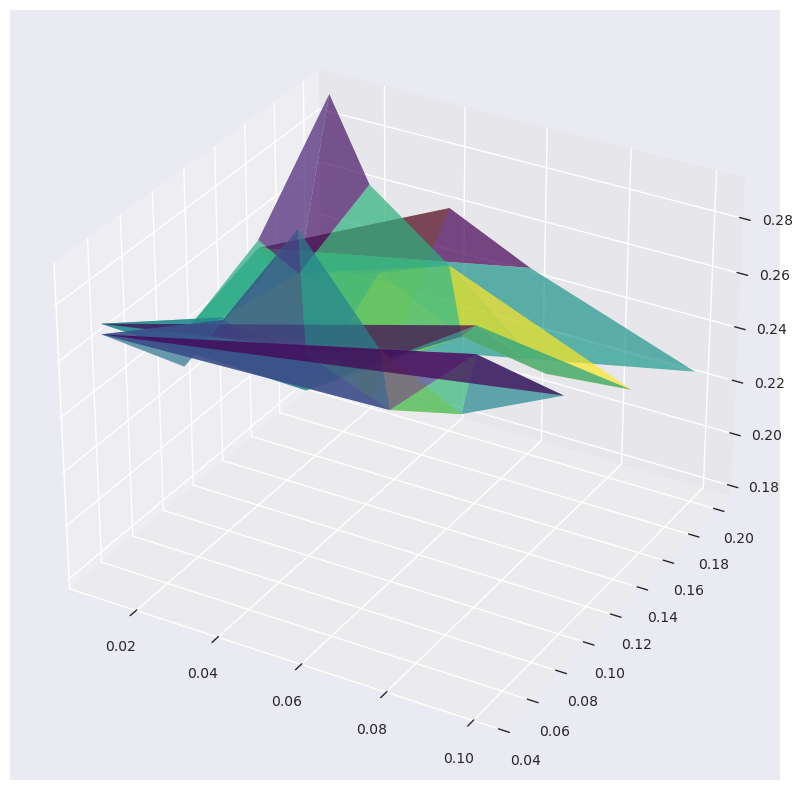

/tmp/ipykernel_2791272/614568424.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


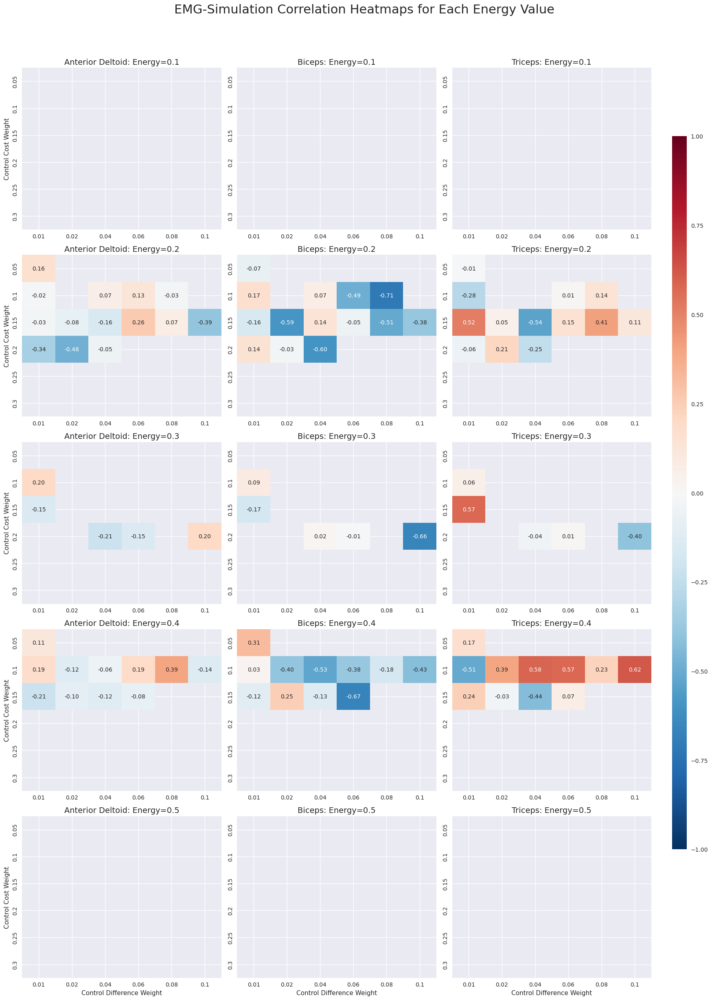

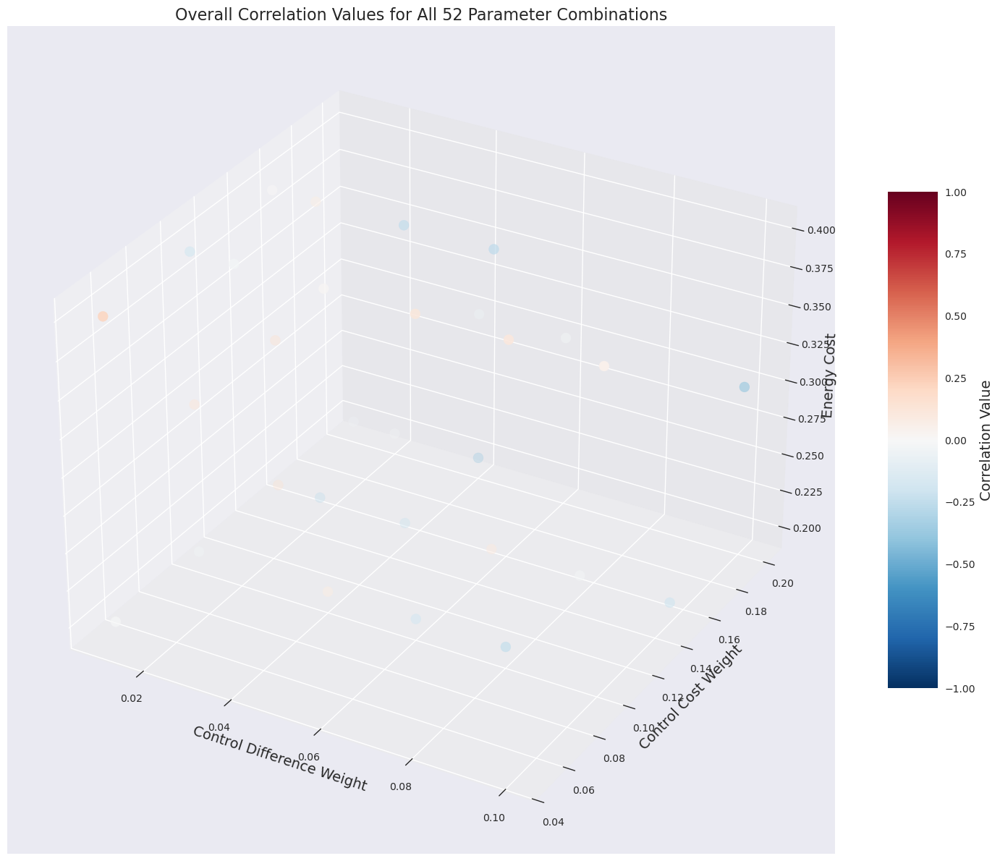

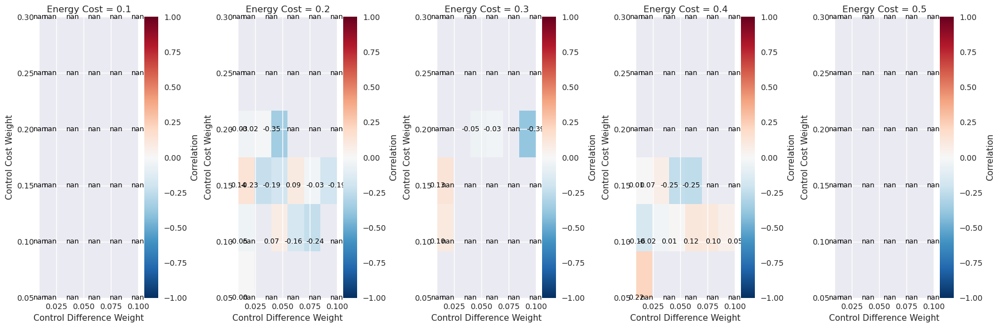

In [14]:
# Create a grid of heatmaps for each energy value
fig, axes = plt.subplots(len(ENERGY_COSTS), 3, figsize=(18, 5*len(ENERGY_COSTS)))
fig.suptitle("EMG-Simulation Correlation Heatmaps for Each Energy Value", fontsize=22)

muscle_cols = ["Anterior Deltoid", "Biceps", "Triceps"]

for e_idx, energy_value in enumerate(ENERGY_COSTS):
    for m_idx, muscle_name in enumerate(muscle_cols):
        ax = axes[e_idx, m_idx]
        corr_slice = correlation_data[muscle_name][:, :, e_idx]
        
        im = sns.heatmap(corr_slice, annot=True, fmt=".2f", cmap="RdBu_r", 
                     xticklabels=CTRL_DIFFS, yticklabels=CTRL_COSTS,
                     vmin=-1, vmax=1, center=0, ax=ax, cbar=False)
        
        ax.set_title(f"{muscle_name}: Energy={energy_value}", fontsize=14)
        ax.set_xlabel("Control Difference Weight" if e_idx == len(ENERGY_COSTS)-1 else "")
        ax.set_ylabel("Control Cost Weight" if m_idx == 0 else "")

# Add a single colorbar for the entire figure
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
fig.colorbar(im.get_children()[0], cax=cbar_ax)

plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.savefig("all_energy_muscle_heatmaps.png", dpi=300, bbox_inches='tight')
plt.show()

# Also create 3D scatter plot to show all parameter combinations
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(15, 12))
ax = fig.add_subplot(111, projection='3d')

# Create meshgrid of parameter values
X, Y, Z = np.meshgrid(CTRL_DIFFS, CTRL_COSTS, ENERGY_COSTS)
corr_values = correlation_data["Overall_avg"]

# Flatten arrays for scatter plot
x = X.flatten()
y = Y.flatten()
z = Z.flatten()
c = corr_values.flatten()

# Plot points
scatter = ax.scatter(x, y, z, c=c, cmap='RdBu_r', s=100, vmin=-1, vmax=1)

ax.set_xlabel('Control Difference Weight', fontsize=14)
ax.set_ylabel('Control Cost Weight', fontsize=14)
ax.set_zlabel('Energy Cost', fontsize=14)
ax.set_title('Overall Correlation Values for All 52 Parameter Combinations', fontsize=16)

# Add colorbar
cbar = fig.colorbar(scatter, ax=ax, shrink=0.6, aspect=10)
cbar.set_label('Correlation Value', fontsize=14)

plt.tight_layout()
plt.savefig("3d_parameter_correlation_scatter.png", dpi=300, bbox_inches='tight')
plt.show()

# Create a pairwise parameter plot with energy as color
plt.figure(figsize=(18, 6))

# 1. Plot for each energy value, showing correlation as color
for e_idx, energy_value in enumerate(ENERGY_COSTS):
    plt.subplot(1, len(ENERGY_COSTS), e_idx+1)
    
    corr_slice = correlation_data["Overall_avg"][:, :, e_idx]
    
    im = plt.imshow(corr_slice, cmap='RdBu_r', vmin=-1, vmax=1, 
                   extent=[min(CTRL_DIFFS), max(CTRL_DIFFS), 
                           min(CTRL_COSTS), max(CTRL_COSTS)],
                   origin='lower', aspect='auto')
    
    plt.colorbar(label='Correlation')
    plt.xlabel('Control Difference Weight')
    plt.ylabel('Control Cost Weight')
    plt.title(f'Energy Cost = {energy_value}')
    
    # Add correlation values as text
    for i, ctrl_cost in enumerate(CTRL_COSTS):
        for j, ctrl_diff in enumerate(CTRL_DIFFS):
            corr_val = corr_slice[i, j]
            plt.text(ctrl_diff, ctrl_cost, f'{corr_val:.2f}', 
                    ha='center', va='center', 
                    color='white' if abs(corr_val) > 0.4 else 'black',
                    fontsize=9)

plt.tight_layout()
plt.savefig("energy_slices_correlation_heatmaps.png", dpi=300, bbox_inches='tight')
plt.show()


Best Parameter Combinations for Each Muscle:
Anterior Deltoid    : Correlation = 0.393, Ctrl Cost = 0.1, Ctrl Diff = 0.08, Energy = 0.4
Biceps              : Correlation = 0.313, Ctrl Cost = 0.05, Ctrl Diff = 0.01, Energy = 0.4
Triceps             : Correlation = 0.619, Ctrl Cost = 0.1, Ctrl Diff = 0.1, Energy = 0.4
Biceps_avg          : Correlation = 0.313, Ctrl Cost = 0.05, Ctrl Diff = 0.01, Energy = 0.4
Triceps_avg         : Correlation = 0.619, Ctrl Cost = 0.1, Ctrl Diff = 0.1, Energy = 0.4
Overall_avg         : Correlation = 0.216, Ctrl Cost = 0.05, Ctrl Diff = 0.01, Energy = 0.4


/tmp/ipykernel_2791272/853209245.py:50: RuntimeWarning: Mean of empty slice
  avg_over_others = np.nanmean(np.nanmean(correlation_data[muscle_name], axis=2), axis=1)
/tmp/ipykernel_2791272/853209245.py:64: RuntimeWarning: Mean of empty slice
  avg_over_others = np.nanmean(np.nanmean(correlation_data[muscle_name], axis=2), axis=0)
/tmp/ipykernel_2791272/853209245.py:78: RuntimeWarning: Mean of empty slice
  avg_over_others = np.nanmean(np.nanmean(correlation_data[muscle_name], axis=1), axis=0)


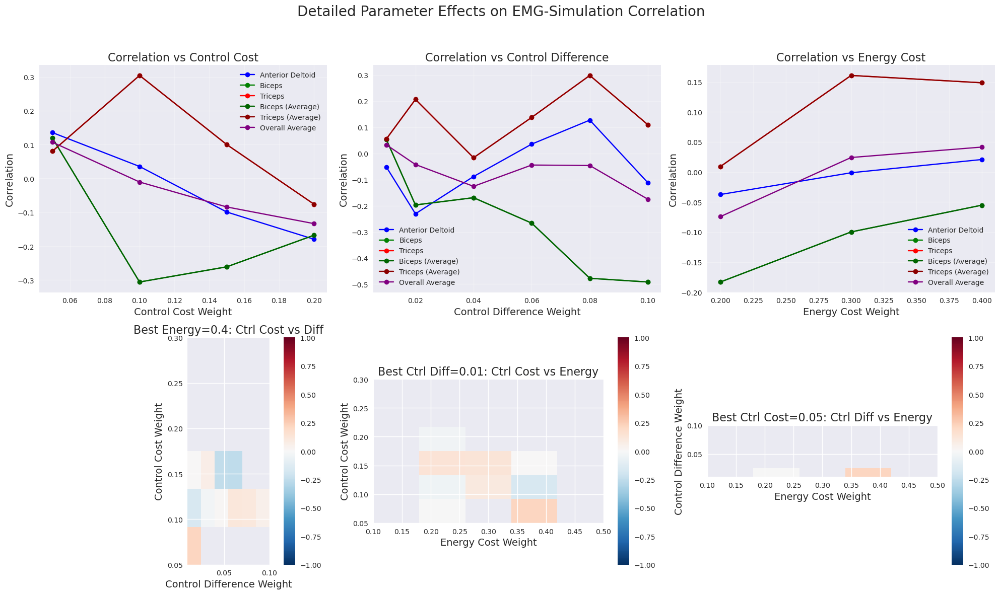

Analysis complete! All visualizations have been created.


In [13]:
# Create a more detailed muscle-specific analysis
# Identify best parameter combinations for each muscle
muscle_best_params = {}

for muscle_name in muscle_names:
    if muscle_name in correlation_data:
        # Find the best parameter combination
        corr_data = correlation_data[muscle_name]
        max_idx = np.nanargmax(corr_data.flatten())
        max_coords = np.unravel_index(max_idx, corr_data.shape)
        best_ctrl_cost = CTRL_COSTS[max_coords[0]]
        best_ctrl_diff = CTRL_DIFFS[max_coords[1]]
        best_energy = ENERGY_COSTS[max_coords[2]]
        best_corr = corr_data[max_coords]
        
        muscle_best_params[muscle_name] = {
            'ctrl_cost': best_ctrl_cost,
            'ctrl_diff': best_ctrl_diff,
            'energy': best_energy,
            'correlation': best_corr
        }

# Display best parameter combinations for each muscle
print("\nBest Parameter Combinations for Each Muscle:")
print("="*80)
for muscle, params in muscle_best_params.items():
    print(f"{muscle:<20}: Correlation = {params['correlation']:.3f}, "
          f"Ctrl Cost = {params['ctrl_cost']}, "
          f"Ctrl Diff = {params['ctrl_diff']}, "
          f"Energy = {params['energy']}")

# Create a 2x3 subplot to show correlation vs each parameter for different muscles
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

# Define colors for each muscle
muscle_colors = {
    "Anterior Deltoid": "blue",
    "Biceps": "green",
    "Triceps": "red",
    "Biceps_avg": "darkgreen",
    "Triceps_avg": "darkred",
    "Overall_avg": "purple"
}

# 1. Correlation vs Ctrl Cost (averaged over other params)
for muscle_name in muscle_names:
    if muscle_name in correlation_data:
        # Average over ctrl_diff and energy dimensions
        avg_over_others = np.nanmean(np.nanmean(correlation_data[muscle_name], axis=2), axis=1)
        axes[0].plot(CTRL_COSTS, avg_over_others, 'o-', 
                    label=muscle_display_names.get(muscle_name, muscle_name),
                    color=muscle_colors.get(muscle_name, "black"))
axes[0].set_xlabel("Control Cost Weight", fontsize=14)
axes[0].set_ylabel("Correlation", fontsize=14)
axes[0].set_title("Correlation vs Control Cost", fontsize=16)
axes[0].grid(True, alpha=0.3)
axes[0].legend()

# 2. Correlation vs Ctrl Diff (averaged over other params)
for muscle_name in muscle_names:
    if muscle_name in correlation_data:
        # Average over ctrl_cost and energy dimensions
        avg_over_others = np.nanmean(np.nanmean(correlation_data[muscle_name], axis=2), axis=0)
        axes[1].plot(CTRL_DIFFS, avg_over_others, 'o-', 
                    label=muscle_display_names.get(muscle_name, muscle_name),
                    color=muscle_colors.get(muscle_name, "black"))
axes[1].set_xlabel("Control Difference Weight", fontsize=14)
axes[1].set_ylabel("Correlation", fontsize=14)
axes[1].set_title("Correlation vs Control Difference", fontsize=16)
axes[1].grid(True, alpha=0.3)
axes[1].legend()

# 3. Correlation vs Energy (averaged over other params)
for muscle_name in muscle_names:
    if muscle_name in correlation_data:
        # Average over ctrl_cost and ctrl_diff dimensions
        avg_over_others = np.nanmean(np.nanmean(correlation_data[muscle_name], axis=1), axis=0)
        axes[2].plot(ENERGY_COSTS, avg_over_others, 'o-', 
                    label=muscle_display_names.get(muscle_name, muscle_name),
                    color=muscle_colors.get(muscle_name, "black"))
axes[2].set_xlabel("Energy Cost Weight", fontsize=14)
axes[2].set_ylabel("Correlation", fontsize=14)
axes[2].set_title("Correlation vs Energy Cost", fontsize=16)
axes[2].grid(True, alpha=0.3)
axes[2].legend()

# 4-6. Focused on Overall_avg for each parameter pair
# 4. Ctrl Cost vs Ctrl Diff for best Energy
best_energy_idx = ENERGY_COSTS.index(muscle_best_params["Overall_avg"]["energy"])
corr_slice = correlation_data["Overall_avg"][:, :, best_energy_idx]
im3 = axes[3].imshow(corr_slice, cmap="RdBu_r", vmin=-1, vmax=1, origin='lower',
                    extent=[CTRL_DIFFS[0], CTRL_DIFFS[-1], CTRL_COSTS[0], CTRL_COSTS[-1]])
axes[3].set_title(f"Best Energy={muscle_best_params['Overall_avg']['energy']}: Ctrl Cost vs Diff", fontsize=16)
axes[3].set_xlabel("Control Difference Weight", fontsize=14)
axes[3].set_ylabel("Control Cost Weight", fontsize=14)
plt.colorbar(im3, ax=axes[3])

# 5. Ctrl Cost vs Energy for best Ctrl Diff
best_ctrl_diff_idx = CTRL_DIFFS.index(muscle_best_params["Overall_avg"]["ctrl_diff"])
corr_slice = correlation_data["Overall_avg"][:, best_ctrl_diff_idx, :]
im4 = axes[4].imshow(corr_slice, cmap="RdBu_r", vmin=-1, vmax=1, origin='lower',
                    extent=[ENERGY_COSTS[0], ENERGY_COSTS[-1], CTRL_COSTS[0], CTRL_COSTS[-1]])
axes[4].set_title(f"Best Ctrl Diff={muscle_best_params['Overall_avg']['ctrl_diff']}: Ctrl Cost vs Energy", fontsize=16)
axes[4].set_xlabel("Energy Cost Weight", fontsize=14)
axes[4].set_ylabel("Control Cost Weight", fontsize=14)
plt.colorbar(im4, ax=axes[4])

# 6. Ctrl Diff vs Energy for best Ctrl Cost
best_ctrl_cost_idx = CTRL_COSTS.index(muscle_best_params["Overall_avg"]["ctrl_cost"])
corr_slice = correlation_data["Overall_avg"][best_ctrl_cost_idx, :, :]
im5 = axes[5].imshow(corr_slice, cmap="RdBu_r", vmin=-1, vmax=1, origin='lower',
                    extent=[ENERGY_COSTS[0], ENERGY_COSTS[-1], CTRL_DIFFS[0], CTRL_DIFFS[-1]])
axes[5].set_title(f"Best Ctrl Cost={muscle_best_params['Overall_avg']['ctrl_cost']}: Ctrl Diff vs Energy", fontsize=16)
axes[5].set_xlabel("Energy Cost Weight", fontsize=14)
axes[5].set_ylabel("Control Difference Weight", fontsize=14)
plt.colorbar(im5, ax=axes[5])

plt.suptitle("Detailed Parameter Effects on EMG-Simulation Correlation", fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("detailed_parameter_effects.png", dpi=300, bbox_inches='tight')
plt.show()

print("Analysis complete! All visualizations have been created.")

Processing EMG data for Anterior Deltoid...
Processing EMG data for Triceps...
Processing EMG data for Biceps...
Computing errors for all parameter combinations...


/tmp/ipykernel_2791272/14693665.py:218: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


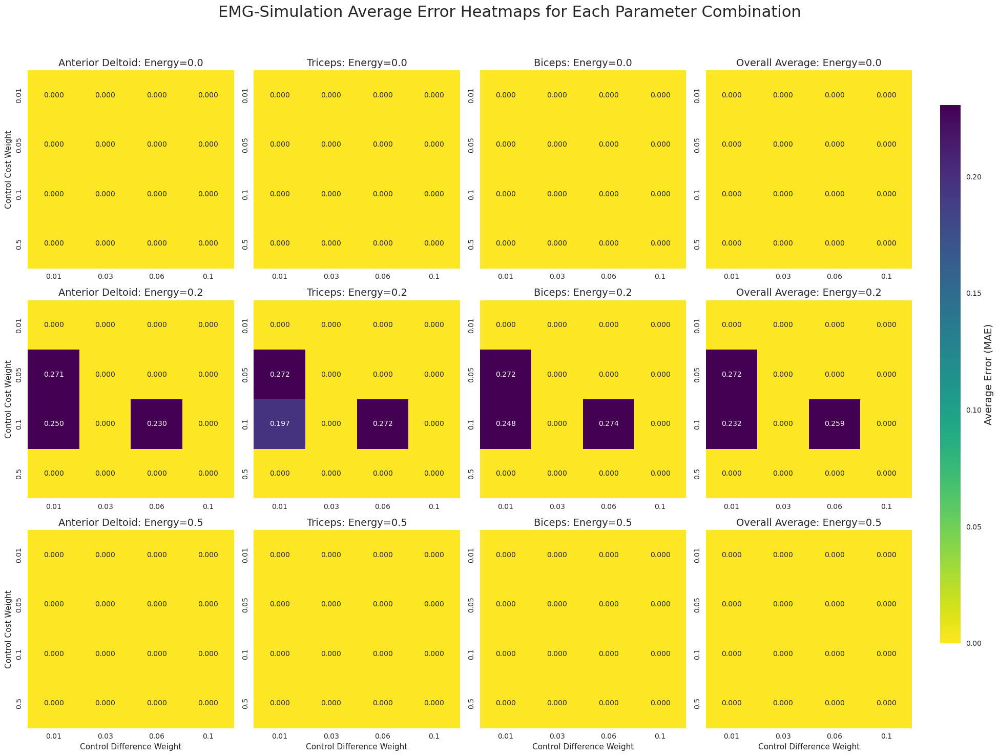

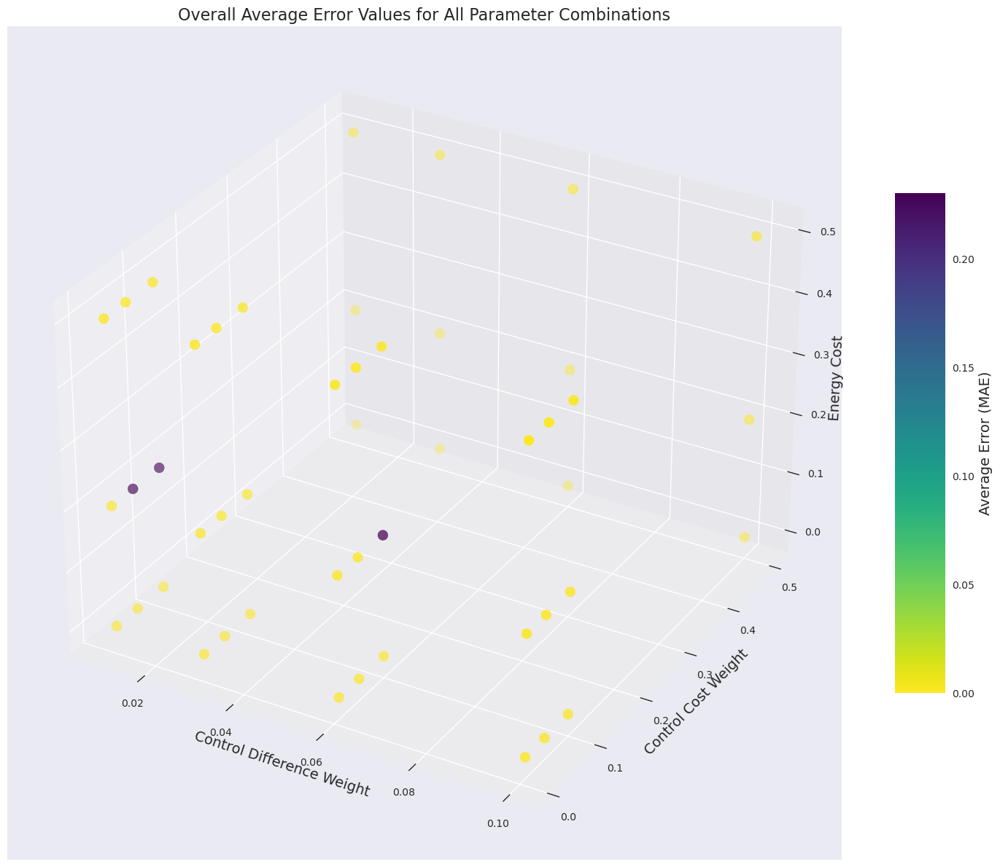

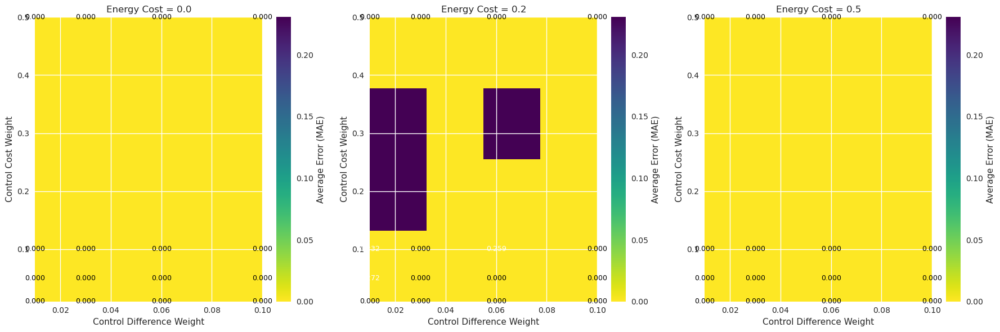


OPTIMAL PARAMETERS (Lowest Average Error: 0.0000):
Control Cost: 0.01
Control Difference: 0.01
Energy Cost: 0.0


In [19]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal
import os
from glob import glob

# Set up the plot style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Parameter values from the sweep
CTRL_COSTS = [0.01, 0.05, 0.1, 0.5]
CTRL_DIFFS = [0.01, 0.03, 0.06, 0.1]
ENERGY_COSTS = [0.0, 0.2, 0.5]

# Muscle configurations: (sim_index, sim_name, emg_file, emg_name)
MUSCLE_CONFIGS = [
    (3, "Anterior Deltoid", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_trap_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Anterior Deltoid"),
    (5, "Triceps Lateral", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (8, "Biceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
]

# Path to directory with all parameter sweep files
sweep_dir = "/root/vast/eric/track-mjx/results/neurIPS-paramsweep/big_sweep_ctrl_ctrldiff_energy/"
CLIP_MIN, CLIP_MAX = 0.0, 1.0

# Load trial data (main CSV with reach indices)
df = pd.read_csv('/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv')

# Create trial mask: valid trials have non-zero, non-NaN start and end values
trial_mask = (
    (df['start'].notna()) & 
    (df['end'].notna()) & 
    (df['start'] > 0) & 
    (df['end'] > 0) &
    (df['start'] != df['end'])  # Make sure start != end
)

# Get the valid trials
valid_trials_df = df[trial_mask].copy()
valid_trial_indices = valid_trials_df.index.tolist()

# Define filter parameters
fs = 30000  # Sampling frequency in Hz
highpass_cutoff = 20  # High pass cutoff frequency in Hz
lowpass_cutoff = 1000  # Low pass cutoff frequency in Hz
envelope_cutoff = 50  # Envelope cutoff frequency in Hz
filter_order = 4  # Butterworth filter order

# Calculate downsampling parameters
target_fs = 400  # Target sampling rate to match simulation
downsample_factor = fs // target_fs  # 30000 // 400 = 75 samples per chunk
target_samples = 199  # Number of samples we want (to match simulation)

# Function to process EMG data and return individual trial data
def process_emg_data_individual_trials(emg_file_path):
    """Process EMG data and return individual trial envelopes for error calculation"""
    # Load EMG data
    emg_data = pd.read_csv(emg_file_path, header=None)
    
    # Process only valid trials using the trial mask
    reach_envelopes_downsampled = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        # idx is the original trial number from the CSV (the index from df)
        trial_num = idx
        
        # Convert reach start index from 200Hz frames to 30000Hz samples
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + 15000  # 0.5 seconds
        
        # Get EMG data for this specific trial (using original trial index)
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Downsample by averaging chunks
                    n_samples = len(reach_envelope)
                    n_chunks = n_samples // downsample_factor
                    
                    # Trim to exact multiple of downsample_factor
                    trimmed_envelope = reach_envelope[:n_chunks * downsample_factor]
                    
                    # Reshape and average
                    reshaped = trimmed_envelope.reshape(n_chunks, downsample_factor)
                    downsampled_envelope = np.mean(reshaped, axis=1)
                    
                    # Only keep if we have the target number of samples (200)
                    if len(downsampled_envelope) >= target_samples:
                        downsampled_envelope = downsampled_envelope[:target_samples]
                        reach_envelopes_downsampled.append(downsampled_envelope)
        else:
            print(f"Trial {trial_num}: EMG data index out of range")
    
    if not reach_envelopes_downsampled:
        return None
    
    # Convert to numpy array
    envelopes_array = np.array(reach_envelopes_downsampled)
    
    # ROBUST EMG NORMALIZATION:
    # Normalize by the 98th percentile of all observed values
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    return normalized_envelopes

# Pre-process EMG data once for all muscles to avoid repeating
emg_data_cache = {}
for _, _, emg_file, emg_name in MUSCLE_CONFIGS:
    if emg_file not in emg_data_cache:
        print(f"Processing EMG data for {emg_name}...")
        emg_data_cache[emg_file] = process_emg_data_individual_trials(emg_file)

# Initialize error arrays for each muscle
error_data = {muscle[3]: np.zeros((len(CTRL_COSTS), len(CTRL_DIFFS), len(ENERGY_COSTS))) 
              for muscle in MUSCLE_CONFIGS}
error_data["Overall_avg"] = np.zeros((len(CTRL_COSTS), len(CTRL_DIFFS), len(ENERGY_COSTS)))

# Process each parameter combination
print("Computing errors for all parameter combinations...")
for cc_idx, ctrl_cost in enumerate(CTRL_COSTS):
    for cd_idx, ctrl_diff in enumerate(CTRL_DIFFS):
        for ec_idx, energy_cost in enumerate(ENERGY_COSTS):
            # Find the matching H5 file
            h5_pattern = f"{sweep_dir}/*CTRLCOST_{ctrl_cost}_CTRLDIFF_{ctrl_diff}_ENERGY_{energy_cost}_*.h5"
            h5_files = glob(h5_pattern)
            
            if not h5_files:
                print(f"Warning: No file found for CTRLCOST={ctrl_cost}, CTRLDIFF={ctrl_diff}, ENERGY={energy_cost}")
                continue
                
            h5_path = h5_files[0]
            
            # Load simulated muscle activation data
            with h5py.File(h5_path, "r") as f:
                actions = np.clip(f["actions"][...], CLIP_MIN, CLIP_MAX)
            
            n_clips, T, _ = actions.shape
            
            # Calculate errors for each muscle
            muscle_errors = []
            for muscle_idx, sim_name, emg_file, emg_name in MUSCLE_CONFIGS:
                # Extract simulated data for all clips
                sim_traces = actions[:, :, muscle_idx]
                
                # Get pre-processed EMG data
                emg_traces = emg_data_cache[emg_file]
                
                if emg_traces is not None and len(emg_traces) == n_clips:
                    # Calculate error for each clip (mean absolute difference across time)
                    clip_errors = []
                    
                    for clip_idx in range(n_clips):
                        sim_trace = sim_traces[clip_idx, :]
                        emg_trace = emg_traces[clip_idx, :]
                        
                        # Calculate mean absolute error for this clip
                        clip_error = np.mean(np.abs(sim_trace - emg_trace))
                        clip_errors.append(clip_error)
                    
                    # Store average error across all clips
                    avg_error = np.mean(np.array(clip_errors))
                    error_data[emg_name][cc_idx, cd_idx, ec_idx] = avg_error
                    muscle_errors.append(avg_error)
            
            # Calculate overall average error across all muscles
            if muscle_errors:
                error_data["Overall_avg"][cc_idx, cd_idx, ec_idx] = np.mean(muscle_errors)

# Create a grid of heatmaps for each energy value
fig, axes = plt.subplots(len(ENERGY_COSTS), len(MUSCLE_CONFIGS)+1, figsize=(20, 5*len(ENERGY_COSTS)))
fig.suptitle("EMG-Simulation Average Error Heatmaps for Each Parameter Combination", fontsize=22)

# Define muscle columns including overall average
muscle_cols = [muscle[3] for muscle in MUSCLE_CONFIGS] + ["Overall_avg"]
muscle_titles = [muscle[3] for muscle in MUSCLE_CONFIGS] + ["Overall Average"]

# Set vmax to the 95th percentile of all error values for better visualization
all_errors = np.array([error_data[muscle][:,:,:] for muscle in muscle_cols])
vmax = np.percentile(all_errors, 95)  # Use 95th percentile for better color scaling

for e_idx, energy_value in enumerate(ENERGY_COSTS):
    for m_idx, muscle_name in enumerate(muscle_cols):
        ax = axes[e_idx, m_idx]
        error_slice = error_data[muscle_name][:, :, e_idx]
        
        im = sns.heatmap(error_slice, annot=True, fmt=".3f", cmap="viridis_r", 
                     xticklabels=CTRL_DIFFS, yticklabels=CTRL_COSTS,
                     vmin=0, vmax=vmax, ax=ax, cbar=False)
        
        title = muscle_titles[m_idx]
        ax.set_title(f"{title}: Energy={energy_value}", fontsize=14)
        ax.set_xlabel("Control Difference Weight" if e_idx == len(ENERGY_COSTS)-1 else "")
        ax.set_ylabel("Control Cost Weight" if m_idx == 0 else "")

# Add a single colorbar for the entire figure
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(im.get_children()[0], cax=cbar_ax)
cbar.set_label("Average Error (MAE)", fontsize=14)

plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.savefig("parameter_sweep_error_heatmaps.png", dpi=300, bbox_inches='tight')
plt.show()

# Also create 3D scatter plot to show all parameter combinations
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(15, 12))
ax = fig.add_subplot(111, projection='3d')

# Create meshgrid of parameter values
X, Y, Z = np.meshgrid(CTRL_DIFFS, CTRL_COSTS, ENERGY_COSTS)

# Flatten arrays for scatter plot
x = X.flatten()
y = Y.flatten()
z = Z.flatten()
c = error_data["Overall_avg"].flatten()

# Plot points
scatter = ax.scatter(x, y, z, c=c, cmap='viridis_r', s=100, vmin=0, vmax=vmax)

ax.set_xlabel('Control Difference Weight', fontsize=14)
ax.set_ylabel('Control Cost Weight', fontsize=14)
ax.set_zlabel('Energy Cost', fontsize=14)
ax.set_title('Overall Average Error Values for All Parameter Combinations', fontsize=16)

# Add colorbar
cbar = fig.colorbar(scatter, ax=ax, shrink=0.6, aspect=10)
cbar.set_label('Average Error (MAE)', fontsize=14)

plt.tight_layout()
plt.savefig("3d_parameter_error_scatter.png", dpi=300, bbox_inches='tight')
plt.show()

# Create a pairwise parameter plot with energy as color
plt.figure(figsize=(18, 6))

# Plot for each energy value, showing error as color
for e_idx, energy_value in enumerate(ENERGY_COSTS):
    plt.subplot(1, len(ENERGY_COSTS), e_idx+1)
    
    error_slice = error_data["Overall_avg"][:, :, e_idx]
    
    im = plt.imshow(error_slice, cmap='viridis_r', vmin=0, vmax=vmax, 
                   extent=[min(CTRL_DIFFS), max(CTRL_DIFFS), 
                           min(CTRL_COSTS), max(CTRL_COSTS)],
                   origin='lower', aspect='auto')
    
    plt.colorbar(label='Average Error (MAE)')
    plt.xlabel('Control Difference Weight')
    plt.ylabel('Control Cost Weight')
    plt.title(f'Energy Cost = {energy_value}')
    
    # Add error values as text
    for i, ctrl_cost in enumerate(CTRL_COSTS):
        for j, ctrl_diff in enumerate(CTRL_DIFFS):
            error_val = error_slice[i, j]
            plt.text(ctrl_diff, ctrl_cost, f'{error_val:.3f}', 
                    ha='center', va='center', 
                    color='white' if error_val > vmax/2 else 'black',
                    fontsize=9)

plt.tight_layout()
plt.savefig("energy_slices_error_heatmaps.png", dpi=300, bbox_inches='tight')
plt.show()

# Print optimal parameters
min_error = np.min(error_data["Overall_avg"])
min_idx = np.where(error_data["Overall_avg"] == min_error)
best_cc_idx, best_cd_idx, best_ec_idx = min_idx[0][0], min_idx[1][0], min_idx[2][0]

print("\n" + "="*80)
print(f"OPTIMAL PARAMETERS (Lowest Average Error: {min_error:.4f}):")
print(f"Control Cost: {CTRL_COSTS[best_cc_idx]}")
print(f"Control Difference: {CTRL_DIFFS[best_cd_idx]}")
print(f"Energy Cost: {ENERGY_COSTS[best_ec_idx]}")
print("="*80)